# Visualizer that uses preselected channels

In [1]:
from pathlib import Path
from PIL import Image
import numpy as np
import pandas as pd
import torch


def image_paths(folder):
    extensions = {".jpg", ".jpeg", ".png", ".bmp", ".gif"}

    return sorted(
        p for p in Path(folder).glob("*")
        if p.suffix.lower() in extensions
    )


def image_to_model_tensor(path, learn, device):
    img = PILImage.create(path)
    dl = learn.dls.test_dl([img])
    return next(iter(dl))[0].to(device)

In [2]:
from settings import categories, get_class_names_per_axis
image_categories = get_class_names_per_axis()

In [3]:
class_folders = {
    "breath": {
        "abstract": Path("artefacts/breath/abstract"),
        "concrete": Path("artefacts/breath/concrete"),
    },
    "depth": {
        "iconic": Path("artefacts/depth/iconic"),
        "symbolic": Path("artefacts/depth/symbolic"),
    },
}

## Load models

In [4]:
from fastai.vision.all import *
# Load a pretrained/pretuned model to visually analyse
model_name = "googlenet"
model_root = f"models/{model_name}_10x"
model_focus = list(categories.keys())
learners = {}
for focus in model_focus:
    learners[focus] = load_learner(f"{model_root}/{focus}.pkl")

/home/trpquo/miniforge3/envs/fastai/lib/python3.12/site-packages/fastai/learner.py:455: UserWarning: load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.
If you only need to load model weights and optimizer state, use the safe `Learner.load` instead.
  warn("load_learner` uses Python's insecure pickle module, which can execute malicious arbitrary code when loading. Only load files you trust.\nIf you only need to load model weights and optimizer state, use the safe `Learner.load` instead.")


In [ ]:
module_names = {
    "0.5": "Inception3a",
    "0.6": "Inception3b",
    "0.8": "Inception4a",
    "0.9": "Inception4b",
    "0.10": "Inception4c",
    "0.11": "Inception4d",
    "0.12": "Inception4e",
    "0.14": "Inception5a",
    "0.15": "Inception5b",
}

In [55]:
device = next(iter(learners.values())).model.parameters().__next__().device
device

device(type='cpu')

In [56]:
from settings import *

# provjera postavki
import torch
print(f"CUDA is available: {torch.cuda.is_available()}.", f"Activated version of CUDA is {torch.version.cuda}.", torch.cuda.device(0))
print(f"Volta's gencode (sm_86) for RTX 3050 and 3070 is in arch_list: {'sm_86' in torch.cuda.get_arch_list()}.")

CUDA is available: True. Activated version of CUDA is 11.8. <torch.cuda.device object at 0x7935f5711190>
Volta's gencode (sm_86) for RTX 3050 and 3070 is in arch_list: True.


In [57]:
import torch

if not torch.cuda.is_available():
    raise RuntimeError(
        "CUDA is not available in this Jupyter kernel, "
        "so the models cannot be moved to GPU."
    )

device = torch.device("cuda:0")
torch.cuda.set_device(device)

for focus, learn in learners.items():
    learn.model.to(device)
    learn.model.eval()

    print(
        f"{focus:8s} | "
        f"model device: {next(learn.model.parameters()).device}"
    )

torch.cuda.empty_cache()

depth    | model device: cuda:0
breath   | model device: cuda:0


## Load channel importance summary

In [7]:
channel_analysis = {
    "means": "all_channel_rankings.parquet", # <-- all_rankings 
    "probes": "probe_coefficients.parquet", # <-- probe_coefficients_df, (probe_summary_df -> probe_summaries.parquet)
    "ablation": "all_channel_ablation.parquet", # <-- all_ablation_df, (abblation_summary_df -> channel_ablation_summary.parquet)
    "results":	"channel_importance_evidence.parquet", # <-- channel_evidence, 
    "selected": "selected_channel_importance_evidence.parquet", # <-- selected_evidence 
}

In [8]:
from settings import *
analysis_path = root / f"output/{channel_analysis["results"]}"
channel_evidence = pd.read_parquet(analysis_path)

In [ ]:
# Calculate and save less strict selectioon of channels
import numpy as np
import pandas as pd

selection_base = channel_evidence.copy()

# Only channels actually tested by channel ablation are eligible for
# the three-evidence visualization selection.
selection_base = selection_base.loc[
    selection_base["signed_ablation_score"].notna()
].copy()

selection_base["bidirectional_consistency"] = np.minimum(
    selection_base["consistency_a"],
    selection_base["consistency_b"],
)

selection_base["abs_signed_ablation_score"] = (
    selection_base["signed_ablation_score"].abs()
)

selection_base["ablation_sign_agrees_with_d"] = (
    np.sign(selection_base["signed_ablation_score"])
    == np.sign(selection_base["cohens_d"])
)

selection_base["abs_signed_ablation_score_z"] = (
    selection_base
    .groupby(["focus", "layer_name"], observed=True)[
        "abs_signed_ablation_score"
    ]
    .transform(
        lambda s: (s - s.mean()) / s.std(ddof=0)
        if s.std(ddof=0) > 0
        else 0.0
    )
)

selection_base["bidirectional_consistency_z"] = (
    selection_base
    .groupby(["focus", "layer_name"], observed=True)[
        "bidirectional_consistency"
    ]
    .transform(
        lambda s: (s - s.mean()) / s.std(ddof=0)
        if s.std(ddof=0) > 0
        else 0.0
    )
)

selection_base["combined_evidence_score_v2"] = (
    selection_base["abs_cohens_d_z"]
    + selection_base["abs_probe_coefficient_z"]
    + selection_base["abs_signed_ablation_score_z"]
    + 0.5 * selection_base["bidirectional_consistency_z"]
)

display(
    selection_base[
        [
            "focus",
            "layer_name",
            "channel",
            "cohens_d",
            "abs_cohens_d",
            "probe_coefficient",
            "signed_ablation_score",
            "consistency_a",
            "consistency_b",
            "bidirectional_consistency",
            "ablation_sign_agrees_with_d",
            "combined_evidence_score_v2",
        ]
    ]
    .sort_values("combined_evidence_score_v2", ascending=False)
    .head(30)
)
selection_base.shape

,focus,layer_name,channel,cohens_d,abs_cohens_d,probe_coefficient,signed_ablation_score,consistency_a,consistency_b,bidirectional_consistency,ablation_sign_agrees_with_d,combined_evidence_score_v2
3633,depth,0.14,660,-0.748995,0.748995,0.738325,0.126482,0.01,0.84,0.01,False,8.289710
4468,depth,0.15,947,-0.585170,0.585170,0.579965,0.070482,0.00,1.00,0.00,False,7.855707
3,depth,0.5,156,-0.569068,0.569068,0.865576,0.102929,0.53,0.68,0.53,False,7.734828
2809,depth,0.12,26,-0.648335,0.648335,1.033479,0.035217,0.22,0.77,0.22,False,7.651109
4464,depth,0.15,221,-0.720825,0.720825,0.297976,0.088627,0.00,1.00,0.00,False,7.205891
2276,depth,0.11,514,0.722412,0.722412,-1.057483,0.070755,0.66,0.37,0.37,True,6.935028
8291,breath,0.12,582,-1.476378,1.476378,0.471083,0.033357,0.09,0.72,0.09,False,6.645978
7767,breath,0.11,48,1.549430,1.549430,-0.364009,0.559091,0.99,0.01,0.01,True,6.480817
2802,depth,0.12,788,-0.711048,0.711048,0.716645,0.010427,0.60,0.43,0.43,False,6.420277
256,depth,0.6,194,-0.860523,0.860523,0.752170,0.055035,0.41,0.76,0.41,False,6.382219


(360, 43)

### Select channels with consistent evidence

In [10]:
from pathlib import Path
import pandas as pd

final_channel_evidence = (
    selection_base
    .loc[
        selection_base["abs_cohens_d"].ge(0.5)
    ]
    .copy()
)

final_channel_evidence["ablation_tier"] = pd.cut(
    final_channel_evidence["bidirectional_consistency"],
    bins=[-float("inf"), 0.33, 0.50, float("inf")],
    labels=["low", "moderate", "high"],
)

final_channel_evidence["evidence_rank_within_layer"] = (
    final_channel_evidence
    .groupby(["focus", "layer_name"], observed=True)[
        "combined_evidence_score_v2"
    ]
    .rank(method="dense", ascending=False)
    .astype(int)
)

final_channel_evidence["evidence_rank_within_focus"] = (
    final_channel_evidence
    .groupby(["focus"], observed=True)[
        "combined_evidence_score_v2"
    ]
    .rank(method="dense", ascending=False)
    .astype(int)
)

final_path = Path(
    "output/selected_channel_importance_evidence_v2.parquet"
)
final_channel_evidence.to_parquet(final_path, index=False)

print("Saved:", final_path)
print("Selected candidate rows:", len(final_channel_evidence))

display(
    final_channel_evidence
    .sort_values(
        ["focus", "combined_evidence_score_v2"],
        ascending=[True, False],
    )[
        [
            "focus",
            "layer_name",
            "channel",
            "class_a",
            "class_b",
            "cohens_d",
            "abs_cohens_d",
            "probe_coefficient",
            "signed_ablation_score",
            "consistency_a",
            "consistency_b",
            "bidirectional_consistency",
            "ablation_tier",
            "consistent_ablation",
            "combined_evidence_score_v2",
        ]
    ]
    .head(40)
)

Saved: output/selected_channel_importance_evidence_v2.parquet
Selected candidate rows: 338


,focus,layer_name,channel,class_a,class_b,cohens_d,abs_cohens_d,probe_coefficient,signed_ablation_score,consistency_a,consistency_b,bidirectional_consistency,ablation_tier,consistent_ablation,combined_evidence_score_v2
8291,breath,0.12,582,abstract,concrete,-1.476378,1.476378,0.471083,0.033357,0.09,0.72,0.09,low,False,6.645978
7767,breath,0.11,48,abstract,concrete,1.549430,1.549430,-0.364009,0.559091,0.99,0.01,0.01,low,False,6.480817
5498,breath,0.5,19,abstract,concrete,1.106565,1.106565,-0.249537,1.180390,0.82,0.62,0.62,high,True,6.164617
9952,breath,0.15,276,abstract,concrete,-1.447270,1.447270,0.247662,0.057751,0.00,1.00,0.00,low,False,6.036130
9953,breath,0.15,120,abstract,concrete,1.367428,1.367428,-0.066962,0.318123,1.00,0.00,0.00,low,False,6.003339
6736,breath,0.9,22,abstract,concrete,-1.723951,1.723951,0.269007,0.297563,0.32,0.89,0.32,low,False,5.974667
9133,breath,0.14,827,abstract,concrete,1.241734,1.241734,-0.104437,0.568248,0.99,0.08,0.08,low,False,5.800832
6737,breath,0.9,130,abstract,concrete,-1.630197,1.630197,0.529045,0.177280,0.21,0.89,0.21,low,False,5.712576
6229,breath,0.8,105,abstract,concrete,-1.398606,1.398606,0.935486,0.028907,0.32,0.60,0.32,low,False,5.686891
7760,breath,0.11,76,abstract,concrete,-1.800426,1.800426,0.444576,0.193354,0.11,0.95,0.11,low,False,5.640776


In [11]:
def target_class_from_d(row):
    return row["class_a"] if row["cohens_d"] > 0 else row["class_b"]

visualization_candidates = final_channel_evidence.copy()

visualization_candidates["target_class"] = (
    visualization_candidates.apply(target_class_from_d, axis=1)
)

visualization_candidates["rank_within_target_layer"] = (
    visualization_candidates
    .groupby(
        ["focus", "target_class", "layer_name"],
        observed=True,
    )["combined_evidence_score_v2"]
    .rank(method="first", ascending=False)
)

per_layer_candidates = (
    visualization_candidates
    .loc[
        visualization_candidates["rank_within_target_layer"].le(2)
    ]
    .copy()
)

visualization_candidates["rank_within_target"] = (
    visualization_candidates
    .groupby(
        ["focus", "target_class"],
        observed=True,
    )["combined_evidence_score_v2"]
    .rank(method="first", ascending=False)
)

top_overall_candidates = (
    visualization_candidates
    .loc[
        visualization_candidates["rank_within_target"].le(8)
    ]
    .copy()
)

visualization_subset = (
    pd.concat(
        [per_layer_candidates, top_overall_candidates],
        ignore_index=True,
    )
    .drop_duplicates(
        subset=["focus", "layer_name", "channel"]
    )
    .sort_values(
        ["focus", "target_class", "combined_evidence_score_v2"],
        ascending=[True, True, False],
    )
    .reset_index(drop=True)
)

subset_path = Path(
    "output/visualization_channel_subset_v2.parquet"
)
visualization_subset.to_parquet(subset_path, index=False)

print("Visualization subset size:", len(visualization_subset))

display(
    visualization_subset[
        [
            "focus",
            "target_class",
            "layer_name",
            "channel",
            "cohens_d",
            "signed_ablation_score",
            "bidirectional_consistency",
            "ablation_tier",
            "combined_evidence_score_v2",
            "rank_within_target_layer",
            "rank_within_target",
        ]
    ]
)

Visualization subset size: 74


,focus,target_class,layer_name,channel,cohens_d,signed_ablation_score,bidirectional_consistency,ablation_tier,combined_evidence_score_v2,rank_within_target_layer,rank_within_target
0,breath,abstract,0.11,48,1.549430,0.559091,0.01,low,6.480817,1.0,NaN
1,breath,abstract,0.5,19,1.106565,1.180390,0.62,high,6.164617,1.0,NaN
2,breath,abstract,0.15,120,1.367428,0.318123,0.00,low,6.003339,1.0,NaN
3,breath,abstract,0.14,827,1.241734,0.568248,0.08,low,5.800832,1.0,NaN
4,breath,abstract,0.8,469,1.298378,0.276844,0.60,high,5.227483,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...
69,depth,symbolic,0.8,485,-0.749676,0.097717,0.44,moderate,4.983441,2.0,NaN
70,depth,symbolic,0.6,315,-0.704192,0.019971,0.48,moderate,4.543603,2.0,NaN
71,depth,symbolic,0.10,65,-0.724546,-0.120572,0.27,low,4.451813,2.0,NaN
72,depth,symbolic,0.5,164,-0.562420,-0.055511,0.44,moderate,4.292683,2.0,NaN


In [12]:
target_counts = (
    visualization_subset
    .groupby(
        ["focus", "target_class"],
        observed=True,
    )
    .size()
    .rename("n_channels")
    .reset_index()
)

display(target_counts)

layer_counts = (
    visualization_subset
    .groupby(
        ["focus", "target_class", "layer_name"],
        observed=True,
    )
    .size()
    .rename("n_channels")
    .reset_index()
    .sort_values(
        ["focus", "target_class", "layer_name"]
    )
)

display(layer_counts)

print("Total:", len(visualization_subset))

,focus,target_class,n_channels
0,breath,abstract,18
1,breath,concrete,19
2,depth,iconic,19
3,depth,symbolic,18


,focus,target_class,layer_name,n_channels
0,breath,abstract,0.10,2
1,breath,abstract,0.11,2
2,breath,abstract,0.12,2
3,breath,abstract,0.14,2
4,breath,abstract,0.15,2
5,breath,abstract,0.5,2
6,breath,abstract,0.6,2
7,breath,abstract,0.8,2
8,breath,abstract,0.9,2
9,breath,concrete,0.10,2


Total: 74


In [13]:
visualization_subset = visualization_subset.copy()

visualization_subset["visualization_tier"] = "layer_representative"

visualization_subset.loc[
    visualization_subset["rank_within_target"].le(8),
    "visualization_tier",
] = "top_overall"

visualization_subset.to_parquet(
    "output/visualization_channel_subset_v2.parquet",
    index=False,
)

display(
    visualization_subset[
        [
            "focus",
            "target_class",
            "layer_name",
            "channel",
            "visualization_tier",
            "combined_evidence_score_v2",
            "bidirectional_consistency",
            "ablation_tier",
        ]
    ]
    .sort_values(
        [
            "focus",
            "target_class",
            "visualization_tier",
            "combined_evidence_score_v2",
        ],
        ascending=[True, True, True, False],
    )
)

,focus,target_class,layer_name,channel,visualization_tier,combined_evidence_score_v2,bidirectional_consistency,ablation_tier
0,breath,abstract,0.11,48,layer_representative,6.480817,0.01,low
1,breath,abstract,0.5,19,layer_representative,6.164617,0.62,high
2,breath,abstract,0.15,120,layer_representative,6.003339,0.00,low
3,breath,abstract,0.14,827,layer_representative,5.800832,0.08,low
4,breath,abstract,0.8,469,layer_representative,5.227483,0.60,high
...,...,...,...,...,...,...,...,...
69,depth,symbolic,0.8,485,layer_representative,4.983441,0.44,moderate
70,depth,symbolic,0.6,315,layer_representative,4.543603,0.48,moderate
71,depth,symbolic,0.10,65,layer_representative,4.451813,0.27,low
72,depth,symbolic,0.5,164,layer_representative,4.292683,0.44,moderate


In [14]:
from pathlib import Path
import pandas as pd

subset_path = Path(
    "output/visualization_channel_subset_v2.parquet"
)

visualization_subset = pd.read_parquet(subset_path)

required_columns = {
    "focus",
    "target_class",
    "layer_name",
    "channel",
}

missing_columns = required_columns - set(visualization_subset.columns)

if missing_columns:
    raise ValueError(
        "The saved visualization subset lacks required columns: "
        f"{sorted(missing_columns)}"
    )

visualization_subset = visualization_subset.copy()

visualization_subset["layer_name"] = (
    visualization_subset["layer_name"].astype(str)
)

visualization_subset["channel"] = (
    visualization_subset["channel"].astype(int)
)

print("Subset shape:", visualization_subset.shape)
print("Columns:", visualization_subset.columns.tolist())

display(
    visualization_subset.sort_values(
        ["focus", "target_class", "layer_name", "channel"]
    ).head(20)
)

Subset shape: (74, 50)
Columns: ['focus', 'layer_name', 'channel', 'class_a', 'class_b', 'mean_a', 'mean_b', 'std_a', 'std_b', 'cohens_d', 'abs_cohens_d', 'probe_coefficient', 'abs_probe_coefficient', 'mean_abstract', 'mean_concrete', 'std_abstract', 'std_concrete', 'median_abstract', 'median_concrete', 'count_abstract', 'count_concrete', 'signed_ablation_score', 'consistency_a', 'consistency_b', 'consistent_ablation', 'mean_iconic', 'mean_symbolic', 'std_iconic', 'std_symbolic', 'median_iconic', 'median_symbolic', 'count_iconic', 'count_symbolic', 'abs_cohens_d_z', 'abs_probe_coefficient_z', 'signed_ablation_score_z', 'combined_evidence_score', 'bidirectional_consistency', 'abs_signed_ablation_score', 'ablation_sign_agrees_with_d', 'abs_signed_ablation_score_z', 'bidirectional_consistency_z', 'combined_evidence_score_v2', 'ablation_tier', 'evidence_rank_within_layer', 'evidence_rank_within_focus', 'target_class', 'rank_within_target_layer', 'rank_within_target', 'visualization_tier']


,focus,layer_name,channel,class_a,class_b,mean_a,mean_b,std_a,std_b,cohens_d,...,abs_signed_ablation_score_z,bidirectional_consistency_z,combined_evidence_score_v2,ablation_tier,evidence_rank_within_layer,evidence_rank_within_focus,target_class,rank_within_target_layer,rank_within_target,visualization_tier
6,breath,0.10,116,abstract,concrete,0.868835,0.371995,0.510091,0.196707,1.285222,...,4.089542,0.070255,4.952772,moderate,1,18,abstract,1.0,NaN,layer_representative
10,breath,0.10,463,abstract,concrete,0.683131,0.166931,0.479870,0.168794,1.435089,...,0.907062,1.686132,4.148957,high,3,34,abstract,2.0,NaN,layer_representative
0,breath,0.11,48,abstract,concrete,0.962439,0.555743,0.317973,0.191535,1.549430,...,2.982331,-1.902114,6.480817,low,1,2,abstract,1.0,NaN,layer_representative
15,breath,0.11,519,abstract,concrete,0.596278,0.146596,0.375547,0.140445,1.586101,...,1.262737,-0.383620,3.310049,low,7,68,abstract,2.0,NaN,layer_representative
9,breath,0.12,695,abstract,concrete,0.166691,0.078157,0.077655,0.029954,1.504290,...,1.115917,2.412795,4.466901,high,4,27,abstract,1.0,NaN,layer_representative
12,breath,0.12,774,abstract,concrete,0.415878,0.116706,0.318204,0.123349,1.239743,...,2.137631,0.206811,4.038195,moderate,7,37,abstract,2.0,NaN,layer_representative
5,breath,0.14,734,abstract,concrete,0.468488,0.088760,0.399563,0.113297,1.293034,...,0.976720,-0.365356,5.031602,low,2,16,abstract,2.0,NaN,layer_representative
3,breath,0.14,827,abstract,concrete,0.428195,0.090493,0.363762,0.124907,1.241734,...,3.320382,-0.492436,5.800832,low,1,7,abstract,1.0,NaN,layer_representative
2,breath,0.15,120,abstract,concrete,0.712942,0.182888,0.528983,0.143838,1.367428,...,2.897462,-0.343503,6.003339,low,2,5,abstract,1.0,NaN,layer_representative
11,breath,0.15,300,abstract,concrete,0.541758,0.251986,0.353556,0.189872,1.021143,...,0.130462,-0.343503,4.050475,low,7,36,abstract,2.0,NaN,layer_representative


### Prepare modules for visualization

In [15]:
def resolve_indexed_module(root_module, layer_name):
    """
    Resolve a fastai/PyTorch module addressed by an index path such as '0.12'.
    """
    module = root_module

    for index in str(layer_name).split("."):
        if not index.isdigit():
            raise ValueError(
                f"Invalid index-path component {index!r} "
                f"in layer name {layer_name!r}."
            )
        module = module[int(index)]

    return module


def build_module_registry(learn, selected_subset):
    """
    Create a layer-key -> PyTorch-module registry for one fastai learner.
    """
    requested_layers = sorted(
        selected_subset["layer_name"].unique(),
        key=lambda value: tuple(map(int, value.split("."))),
    )

    registry = {}

    for layer_name in requested_layers:
        if layer_name not in module_names:
            raise KeyError(
                f"{layer_name!r} is not represented in module_names."
            )

        resolved = resolve_indexed_module(
            learn.model,
            layer_name,
        )

        registry[layer_name] = resolved

        print(
            f"{layer_name:>4} | "
            f"{module_names[layer_name]:>11} | "
            f"{type(resolved).__name__}"
        )

    return registry

In [16]:
for focus, learn in learners.items():
    print(f"\n{'=' * 82}")
    print(f"FOCUS: {focus.upper()}")

    print("Vocabulary:")
    print(learn.dls.vocab)

    print("\nAfter-item transforms:")
    print(learn.dls.after_item)

    print("\nBefore-batch transforms:")
    print(learn.dls.before_batch)

    print("\nAfter-batch transforms:")
    print(learn.dls.after_batch)

    print("\nTraining DataLoader:")
    print(learn.dls.train)

    print("\nValidation DataLoader:")
    print(learn.dls.valid)


FOCUS: DEPTH
Vocabulary:
['iconic', 'symbolic']

After-item transforms:
Pipeline: Resize -- {'size': (256, 256), 'method': 'pad', 'pad_mode': 'reflection', 'resamples': (<Resampling.BILINEAR: 2>, <Resampling.NEAREST: 0>), 'p': 1.0} -> ToTensor

Before-batch transforms:
Pipeline: 

After-batch transforms:
Pipeline: IntToFloatTensor -- {'div': 255.0, 'div_mask': 1}

Training DataLoader:

Validation DataLoader:

FOCUS: BREATH
Vocabulary:
['abstract', 'concrete']

After-item transforms:
Pipeline: Resize -- {'size': (256, 256), 'method': 'pad', 'pad_mode': 'reflection', 'resamples': (<Resampling.BILINEAR: 2>, <Resampling.NEAREST: 0>), 'p': 1.0} -> ToTensor

Before-batch transforms:
Pipeline: 

After-batch transforms:
Pipeline: IntToFloatTensor -- {'div': 255.0, 'div_mask': 1}

Training DataLoader:

Validation DataLoader:


In [17]:
from pathlib import Path
import pandas as pd

IMAGE_EXTENSIONS = {
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".tif",
    ".tiff",
    ".webp",
}

artefacts_root = Path("artefacts")

def build_image_registry(
    artefacts_root,
    focus,
    class_order,
):
    """
    Index image files in artefacts/{focus}/{class_name}/.

    Labels are derived from the loaded learner's vocabulary order,
    not alphabetically inferred from folder names.
    """
    records = []

    for class_index, class_name in enumerate(class_order):
        class_dir = artefacts_root / focus / str(class_name)

        if not class_dir.exists():
            raise FileNotFoundError(
                f"Expected class directory was not found: {class_dir}"
            )

        files = sorted(
            path
            for path in class_dir.rglob("*")
            if path.is_file()
            and path.suffix.lower() in IMAGE_EXTENSIONS
        )

        if not files:
            raise ValueError(
                f"No supported image files found in: {class_dir}"
            )

        records.extend(
            {
                "focus": focus,
                "image_path": str(path),
                "true_class": str(class_name),
                "true_class_index": class_index,
            }
            for path in files
        )

    return pd.DataFrame(records)


evaluation_registry_parts = []

for focus, learn in learners.items():
    class_order = list(learn.dls.vocab)

    registry_part = build_image_registry(
        artefacts_root=artefacts_root,
        focus=focus,
        class_order=class_order,
    )

    evaluation_registry_parts.append(registry_part)

evaluation_registry = pd.concat(
    evaluation_registry_parts,
    ignore_index=True,
)

print("Evaluation-registry shape:", evaluation_registry.shape)

display(
    evaluation_registry
    .groupby(
        ["focus", "true_class", "true_class_index"],
        observed=True,
    )
    .size()
    .rename("n_images")
    .reset_index()
)

display(evaluation_registry.head())

Evaluation-registry shape: (2511, 4)


,focus,true_class,true_class_index,n_images
0,breath,abstract,0,850
1,breath,concrete,1,598
2,depth,iconic,0,450
3,depth,symbolic,1,613


,focus,image_path,true_class,true_class_index
0,depth,artefacts/depth/iconic/10047.jpg,iconic,0
1,depth,artefacts/depth/iconic/10050.jpg,iconic,0
2,depth,artefacts/depth/iconic/10123.jpg,iconic,0
3,depth,artefacts/depth/iconic/10148.jpg,iconic,0
4,depth,artefacts/depth/iconic/10398.jpg,iconic,0


In [18]:
import torch
from pathlib import Path

for focus, learn in learners.items():
    print(f"\n{'=' * 82}")
    print(f"FOCUS: {focus.upper()}")

    test_paths = (
        evaluation_registry.loc[
            evaluation_registry["focus"].eq(focus),
            "image_path",
        ]
        .map(Path)
        .iloc[:16]
        .tolist()
    )

    test_dl = learn.dls.test_dl(
        test_paths,
        bs=8,
        num_workers=0,
    )

    batch = test_dl.one_batch()

    xb = batch[0] if isinstance(batch, (tuple, list)) else batch
    xb = xb.to(device)

    print("Input batch shape:", tuple(xb.shape))
    print("Input dtype:", xb.dtype)
    print("Input range:", (float(xb.min()), float(xb.max())))

    learn.model.eval()

    with torch.no_grad():
        output = learn.model(xb)

    if isinstance(output, tuple):
        output = output[0]

    print("Model-output shape:", tuple(output.shape))
    print("Vocabulary:", list(learn.dls.vocab))
    print("First two raw outputs:")
    print(output[:2].detach().cpu())


FOCUS: DEPTH
Input batch shape: (8, 3, 256, 256)
Input dtype: torch.float32
Input range: (0.0, 1.0)
Model-output shape: (8, 2)
Vocabulary: ['iconic', 'symbolic']
First two raw outputs:
TensorImage([[-0.6322,  0.2447],
             [ 0.5196, -0.0300]])

FOCUS: BREATH
Input batch shape: (8, 3, 256, 256)
Input dtype: torch.float32
Input range: (0.0, 1.0)
Model-output shape: (8, 2)
Vocabulary: ['abstract', 'concrete']
First two raw outputs:
TensorImage([[ 1.4866,  1.2245],
             [ 6.0309, -7.9908]])


In [19]:
module_registries = {}
for focus, learn in learners.items():
    module_registries[focus] = build_module_registry(learn, visualization_subset)

 0.5 | Inception3a | Inception
 0.6 | Inception3b | Inception
 0.8 | Inception4a | Inception
 0.9 | Inception4b | Inception
0.10 | Inception4c | Inception
0.11 | Inception4d | Inception
0.12 | Inception4e | Inception
0.14 | Inception5a | Inception
0.15 | Inception5b | Inception
 0.5 | Inception3a | Inception
 0.6 | Inception3b | Inception
 0.8 | Inception4a | Inception
 0.9 | Inception4b | Inception
0.10 | Inception4c | Inception
0.11 | Inception4d | Inception
0.12 | Inception4e | Inception
0.14 | Inception5a | Inception
0.15 | Inception5b | Inception


In [20]:
from fastai.callback.hook import hook_outputs


for focus, learn in learners.items():
    print(f"\n{'=' * 82}")
    print(f"FOCUS: {focus.upper()}")

    test_paths = (
        evaluation_registry.loc[
            evaluation_registry["focus"].eq(focus),
            "image_path",
        ]
        .map(Path)
        .iloc[:8]
        .tolist()
    )

    audit_dl = learn.dls.test_dl(
        test_paths,
        bs=8,
        num_workers=0,
    )

    batch = audit_dl.one_batch()
    xb = batch[0] if isinstance(batch, (tuple, list)) else batch
    xb = xb.to(device)
    
    ordered_layers = sorted(
        module_registries[focus].keys(),
        key=lambda value: tuple(map(int, value.split("."))),
    )

    ordered_modules = [
        module_registries[focus][layer_name]
        for layer_name in ordered_layers
    ]

    learn.model.eval()

    with torch.no_grad():
        with hook_outputs(
            ordered_modules,
            detach=True,
        ) as hooks:
            _ = learn.model(xb)

    print("Input shape:", tuple(xb.shape))
    print("\nModule outputs:")

    for layer_name, hook in zip(ordered_layers, hooks):
        output_shape = tuple(hook.stored.shape)

        selected_channels_in_layer = (
            visualization_subset.loc[
                (visualization_subset["focus"] == focus)
                & (visualization_subset["layer_name"] == layer_name),
                "channel",
            ]
        )

        highest_selected_channel = int(
            selected_channels_in_layer.max()
        )

        n_output_channels = output_shape[1]

        if highest_selected_channel >= n_output_channels:
            raise ValueError(
                f"{focus}/{layer_name}: selected channel "
                f"{highest_selected_channel} is outside output "
                f"range [0, {n_output_channels - 1}]."
            )

        print(
            f"{layer_name:>4} | "
            f"{module_names[layer_name]:>11} | "
            f"activation shape={output_shape} | "
            f"highest selected channel={highest_selected_channel}"
        )


FOCUS: DEPTH
Input shape: (8, 3, 256, 256)

Module outputs:
 0.5 | Inception3a | activation shape=(8, 256, 32, 32) | highest selected channel=249
 0.6 | Inception3b | activation shape=(8, 480, 32, 32) | highest selected channel=435
 0.8 | Inception4a | activation shape=(8, 512, 16, 16) | highest selected channel=499
 0.9 | Inception4b | activation shape=(8, 512, 16, 16) | highest selected channel=448
0.10 | Inception4c | activation shape=(8, 512, 16, 16) | highest selected channel=465
0.11 | Inception4d | activation shape=(8, 528, 16, 16) | highest selected channel=514
0.12 | Inception4e | activation shape=(8, 832, 16, 16) | highest selected channel=828
0.14 | Inception5a | activation shape=(8, 832, 8, 8) | highest selected channel=828
0.15 | Inception5b | activation shape=(8, 1024, 8, 8) | highest selected channel=947

FOCUS: BREATH
Input shape: (8, 3, 256, 256)

Module outputs:
 0.5 | Inception3a | activation shape=(8, 256, 32, 32) | highest selected channel=86
 0.6 | Inception3b | 

### Extraction of selected activation maps

In [21]:
from pathlib import Path
import json

import numpy as np
import pandas as pd
import torch
from fastprogress.fastprogress import progress_bar

ACTIVATION_ROOT = Path("output/channel_activations/googlenet")
ACTIVATION_ROOT.mkdir(parents=True, exist_ok=True)

BATCH_SIZE = 16
NUM_WORKERS = 0

required_columns = {
    "focus",
    "target_class",
    "layer_name",
    "channel",
}

missing_columns = required_columns - set(visualization_subset.columns)

if missing_columns:
    raise ValueError(
        "visualization_subset is missing required columns: "
        f"{sorted(missing_columns)}"
    )

evaluation_registry = evaluation_registry.copy()

evaluation_registry["image_path"] = (
    evaluation_registry["image_path"].astype(str)
)

evaluation_registry["wikiart_content_id"] = (
    evaluation_registry["image_path"]
    .map(lambda value: Path(value).stem)
)

if evaluation_registry["wikiart_content_id"].isna().any():
    raise ValueError("At least one image path could not yield a ContentId.")

print("Activation output root:", ACTIVATION_ROOT)
print("Evaluation images:", len(evaluation_registry))

Activation output root: output/channel_activations/googlenet
Evaluation images: 2511


In [22]:
def sorted_layer_names(layer_names):
    return sorted(
        map(str, layer_names),
        key=lambda value: tuple(map(int, value.split("."))),
    )


def selected_channels_for_layer(
    visualization_subset,
    focus,
    layer_name,
):
    selected = (
        visualization_subset.loc[
            (visualization_subset["focus"] == focus)
            & (visualization_subset["layer_name"] == str(layer_name))
        ]
        .sort_values("channel")
        .copy()
    )

    if selected.empty:
        raise ValueError(
            f"No selected channels for {focus}/{layer_name}."
        )

    if selected["channel"].duplicated().any():
        raise ValueError(
            f"Duplicate channel selections found for "
            f"{focus}/{layer_name}."
        )

    return selected


def extract_layer_activations(
    learn,
    module,
    image_paths,
    selected_channels,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
):
    """
    Return selected channel maps, image-level model outputs, and
    spatially averaged selected-channel activations.

    Maps have shape:
        (n_images, n_selected_channels, height, width)
    """
    channel_indices = selected_channels["channel"].to_numpy(
        dtype=np.int64
    )

    test_dl = learn.dls.test_dl(
        list(map(Path, image_paths)),
        bs=batch_size,
        num_workers=num_workers,
        shuffle=False,
        drop_last=False,
    )

    captured_outputs = []

    def capture_output(module_, module_inputs, module_output):
        if isinstance(module_output, tuple):
            module_output = module_output[0]

        captured_outputs.append(module_output.detach())

    hook_handle = module.register_forward_hook(capture_output)

    all_maps = []
    all_logits = []
    all_probabilities = []

    try:
        learn.model.eval()

        with torch.no_grad():
            for batch in progress_bar(
                test_dl,
                total=len(test_dl),
                leave=False,
            ):
                xb = batch[0] if isinstance(batch, (tuple, list)) else batch
                xb = xb.to(device, non_blocking=True)

                captured_outputs.clear()

                model_output = learn.model(xb)

                if isinstance(model_output, tuple):
                    model_output = model_output[0]

                if len(captured_outputs) != 1:
                    raise RuntimeError(
                        "Expected exactly one hooked module output, "
                        f"received {len(captured_outputs)}."
                    )

                activation = captured_outputs.pop()

                max_selected_channel = int(channel_indices.max())

                if max_selected_channel >= activation.shape[1]:
                    raise ValueError(
                        f"Selected channel {max_selected_channel} is "
                        f"outside output range [0, "
                        f"{activation.shape[1] - 1}]."
                    )

                selected_map_batch = activation[
                    :,
                    channel_indices,
                    :,
                    :,
                ]

                all_maps.append(
                    selected_map_batch.float().cpu()
                )

                all_logits.append(
                    model_output.float().cpu()
                )

                all_probabilities.append(
                    torch.softmax(
                        model_output,
                        dim=1,
                    ).float().cpu()
                )

    finally:
        hook_handle.remove()

    maps = torch.cat(all_maps, dim=0).numpy()
    logits = torch.cat(all_logits, dim=0).numpy()
    probabilities = torch.cat(all_probabilities, dim=0).numpy()

    if maps.shape[0] != len(image_paths):
        raise RuntimeError(
            f"Extracted {maps.shape[0]} maps for "
            f"{len(image_paths)} image paths."
        )

    spatial_means = maps.mean(axis=(2, 3))

    return {
        "maps": maps,
        "spatial_means": spatial_means,
        "logits": logits,
        "probabilities": probabilities,
        "channel_indices": channel_indices,
    }

#### Run the extraction

all_image_metadata = []
all_activation_scores = []

for focus, learn in learners.items():
    print(f"\n{'=' * 82}")
    print(f"EXTRACTING: {focus.upper()}")

    focus_registry = (
        evaluation_registry.loc[
            evaluation_registry["focus"] == focus
        ]
        .sort_values("image_path")
        .reset_index(drop=True)
        .copy()
    )

    image_paths = focus_registry["image_path"].tolist()
    class_vocab = list(learn.dls.vocab)

    focus_output_dir = ACTIVATION_ROOT / focus
    focus_output_dir.mkdir(parents=True, exist_ok=True)

    focus_layers = sorted_layer_names(
        visualization_subset.loc[
            visualization_subset["focus"] == focus,
            "layer_name",
        ].unique()
    )

    image_metadata = focus_registry.copy()

    for layer_name in focus_layers:
        print(
            f"  {layer_name} | {module_names[layer_name]}"
        )

        selected_channels = selected_channels_for_layer(
            visualization_subset=visualization_subset,
            focus=focus,
            layer_name=layer_name,
        )

        extraction = extract_layer_activations(
            learn=learn,
            module=module_registries[focus][layer_name],
            image_paths=image_paths,
            selected_channels=selected_channels,
        )

        maps = extraction["maps"]
        spatial_means = extraction["spatial_means"]
        logits = extraction["logits"]
        probabilities = extraction["probabilities"]
        channel_indices = extraction["channel_indices"]

        expected_selected_channels = len(selected_channels)

        if maps.shape[1] != expected_selected_channels:
            raise RuntimeError(
                f"{focus}/{layer_name}: expected "
                f"{expected_selected_channels} selected channels, "
                f"extracted {maps.shape[1]}."
            )

        map_path = (
            focus_output_dir
            / f"{module_names[layer_name]}_selected_maps.npz"
        )

        np.savez_compressed(
            map_path,
            maps=maps.astype(np.float32),
            channel_indices=channel_indices.astype(np.int32),
            image_paths=np.asarray(image_paths, dtype=str),
            wikiart_content_ids=image_metadata[
                "wikiart_content_id"
            ].to_numpy(dtype=str),
            true_class_indices=image_metadata[
                "true_class_index"
            ].to_numpy(dtype=np.int16),
        )

        if "logit_0" not in image_metadata.columns:
            image_metadata["logit_0"] = logits[:, 0]
            image_metadata["logit_1"] = logits[:, 1]
            image_metadata["probability_0"] = probabilities[:, 0]
            image_metadata["probability_1"] = probabilities[:, 1]
            image_metadata["predicted_class_index"] = (
                probabilities.argmax(axis=1)
            )
            image_metadata["predicted_class"] = (
                image_metadata["predicted_class_index"]
                .map(dict(enumerate(class_vocab)))
            )

        layer_score_table = (
            pd.DataFrame(
                spatial_means,
                columns=channel_indices,
            )
            .rename_axis("image_index")
            .reset_index()
            .melt(
                id_vars="image_index",
                var_name="channel",
                value_name="spatial_mean_activation",
            )
        )

        layer_score_table["focus"] = focus
        layer_score_table["layer_name"] = layer_name
        layer_score_table["inception_module"] = (
            module_names[layer_name]
        )

        layer_score_table = layer_score_table.merge(
            image_metadata[
                [
                    "image_path",
                    "wikiart_content_id",
                    "true_class",
                    "true_class_index",
                    "predicted_class",
                    "predicted_class_index",
                    "logit_0",
                    "logit_1",
                    "probability_0",
                    "probability_1",
                ]
            ].reset_index(
                names="image_index"
            ),
            on="image_index",
            how="left",
            validate="many_to_one",
        )

        layer_score_table = layer_score_table.merge(
            selected_channels,
            on=[
                "focus",
                "layer_name",
                "channel",
            ],
            how="left",
            validate="many_to_one",
        )

        all_activation_scores.append(layer_score_table)

    image_metadata["focus"] = focus
    image_metadata["class_0"] = class_vocab[0]
    image_metadata["class_1"] = class_vocab[1]
    image_metadata["corpus_status"] = (
        "post_training_external_overlap_unchecked"
    )

    all_image_metadata.append(image_metadata)

    image_metadata.to_parquet(
        focus_output_dir / "image_metadata.parquet",
        index=False,
    )

activation_scores = pd.concat(
    all_activation_scores,
    ignore_index=True,
)

activation_scores.to_parquet(
    ACTIVATION_ROOT / "selected_channel_spatial_means.parquet",
    index=False,
)

all_image_metadata_df = pd.concat(
    all_image_metadata,
    ignore_index=True,
)

all_image_metadata_df.to_parquet(
    ACTIVATION_ROOT / "all_image_metadata.parquet",
    index=False,
)

visualization_subset.to_parquet(
    ACTIVATION_ROOT / "selected_channel_registry.parquet",
    index=False,
)

print("\nExtraction complete.")
print("Activation-score table shape:", activation_scores.shape)
print("Image-metadata table shape:", all_image_metadata_df.shape)

display(
    activation_scores[
        [
            "focus",
            "inception_module",
            "layer_name",
            "channel",
            "target_class",
            "true_class",
            "predicted_class",
            "spatial_mean_activation",
            "wikiart_content_id",
        ]
    ].head()
)

In [23]:
for focus in learners:
    focus_dir = ACTIVATION_ROOT / focus

    print(f"\n{focus.upper()}")
    print(
        "Image metadata:",
        pd.read_parquet(
            focus_dir / "image_metadata.parquet"
        ).shape,
    )

    for layer_name in sorted_layer_names(
        visualization_subset.loc[
            visualization_subset["focus"] == focus,
            "layer_name",
        ].unique()
    ):
        map_path = (
            focus_dir
            / f"{module_names[layer_name]}_selected_maps.npz"
        )

        with np.load(map_path) as saved:
            print(
                f"  {module_names[layer_name]:>11}: "
                f"maps={saved['maps'].shape}, "
                f"channels={saved['channel_indices'].tolist()}"
            )


DEPTH
Image metadata: (1063, 14)
  Inception3a: maps=(1063, 4, 32, 32), channels=[134, 156, 164, 249]
  Inception3b: maps=(1063, 4, 32, 32), channels=[119, 194, 315, 435]
  Inception4a: maps=(1063, 4, 16, 16), channels=[105, 485, 493, 499]
  Inception4b: maps=(1063, 4, 16, 16), channels=[173, 292, 434, 448]
  Inception4c: maps=(1063, 4, 16, 16), channels=[65, 83, 133, 465]
  Inception4d: maps=(1063, 4, 16, 16), channels=[312, 470, 497, 514]
  Inception4e: maps=(1063, 5, 16, 16), channels=[26, 98, 784, 788, 828]
  Inception5a: maps=(1063, 4, 8, 8), channels=[201, 660, 717, 828]
  Inception5b: maps=(1063, 4, 8, 8), channels=[74, 221, 666, 947]

BREATH
Image metadata: (1448, 14)
  Inception3a: maps=(1448, 4, 32, 32), channels=[19, 32, 63, 86]
  Inception3b: maps=(1448, 4, 32, 32), channels=[2, 285, 457, 465]
  Inception4a: maps=(1448, 4, 16, 16), channels=[105, 190, 469, 483]
  Inception4b: maps=(1448, 5, 16, 16), channels=[19, 22, 130, 277, 422]
  Inception4c: maps=(1448, 4, 16, 16), ch

## Exemplar evidence panels
Create top-k empirical activation panels before any thresholding, cropping, or synthetic generation. For every selected channel, we will rank held-out images by the already stored spatial mean:
$$s_{l,c}=\frac{1}{H_lW_l}\sum^{H_l}_{i=1}\sum^{W_l}_{j=1}A_{l,c}(x)_{i,j}.$$

Create two complementary ranked sets:
1) Class-aligned top-k: paintings belonging to the channel’s Cohen’s-d-assigned semantic endpoint and having the highest activation.
2) Contrastive top-k: paintings from the opposite endpoint with the highest activation.

This comparison is useful precisely because  classes are diverse. It tests whether a selected channel is recruited by a broadly recognizable visual configuration across varied class-aligned paintings, or instead responds similarly to both endpoints despite a dataset-level mean separation. Examining real high-activation image patches or regions has been a core approach in channel-level CNN interpretation, while full-image panels will allow the analysis to retain global compositional evidence when a compact patch is not appropriate.

>>>> Start here

In [24]:
# Build ranked exemplar tables
from pathlib import Path
import numpy as np
import pandas as pd

ACTIVATION_ROOT = Path("output/channel_activations/googlenet")

activation_scores = pd.read_parquet(
    ACTIVATION_ROOT / "selected_channel_spatial_means.parquet"
)

channel_registry = pd.read_parquet(
    ACTIVATION_ROOT / "selected_channel_registry.parquet"
)

print("Activation-score rows:", len(activation_scores))
print("Channel-registry rows:", len(channel_registry))

required_score_columns = {
    "focus",
    "layer_name",
    "channel",
    "image_path",
    "wikiart_content_id",
    "true_class",
    "predicted_class",
    "spatial_mean_activation",
}

missing_score_columns = (
    required_score_columns - set(activation_scores.columns)
)

if missing_score_columns:
    raise ValueError(
        "Activation-score table lacks columns: "
        f"{sorted(missing_score_columns)}"
    )

if "target_class" not in activation_scores.columns:
    activation_scores = activation_scores.merge(
        channel_registry[
            [
                "focus",
                "layer_name",
                "channel",
                "target_class",
            ]
        ],
        on=["focus", "layer_name", "channel"],
        how="left",
        validate="many_to_one",
    )

if activation_scores["target_class"].isna().any():
    raise ValueError(
        "At least one score row could not be matched to a target class."
    )

activation_scores = activation_scores.copy()

activation_scores["is_correctly_predicted"] = (
    activation_scores["true_class"]
    == activation_scores["predicted_class"]
)

activation_scores["class_relation"] = np.where(
    activation_scores["true_class"]
    == activation_scores["target_class"],
    "class_aligned",
    "contrastive",
)

activation_scores["rank_within_relation"] = (
    activation_scores
    .groupby(
        [
            "focus",
            "layer_name",
            "channel",
            "class_relation",
        ],
        observed=True,
    )["spatial_mean_activation"]
    .rank(
        method="first",
        ascending=False,
    )
    .astype(int)
)

activation_scores["rank_overall"] = (
    activation_scores
    .groupby(
        [
            "focus",
            "layer_name",
            "channel",
        ],
        observed=True,
    )["spatial_mean_activation"]
    .rank(
        method="first",
        ascending=False,
    )
    .astype(int)
)

ranked_output_path = (
    ACTIVATION_ROOT / "selected_channel_exemplar_rankings.parquet"
)

activation_scores.to_parquet(
    ranked_output_path,
    index=False,
)

print("Saved:", ranked_output_path)
print(
    activation_scores["class_relation"]
    .value_counts()
)

Activation-score rows: 92907
Channel-registry rows: 74
Saved: output/channel_activations/googlenet/selected_channel_exemplar_rankings.parquet
class_relation
contrastive      46661
class_aligned    46246
Name: count, dtype: int64


In [25]:
TOP_K_TABLE = 12

exemplar_columns = [
    "focus",
    "inception_module",
    "layer_name",
    "channel",
    "target_class",
    "class_relation",
    "rank_within_relation",
    "rank_overall",
    "wikiart_content_id",
    "image_path",
    "true_class",
    "predicted_class",
    "is_correctly_predicted",
    "spatial_mean_activation",
]

optional_columns = [
    "cohens_d",
    "abs_cohens_d",
    "probe_coefficient",
    "signed_ablation_score",
    "bidirectional_consistency",
    "combined_evidence_score_v2",
]

exemplar_columns += [
    column
    for column in optional_columns
    if column in activation_scores.columns
]

top_exemplars = (
    activation_scores
    .loc[
        activation_scores["rank_within_relation"].le(TOP_K_TABLE)
    ]
    .sort_values(
        [
            "focus",
            "target_class",
            "layer_name",
            "channel",
            "class_relation",
            "rank_within_relation",
        ]
    )
    [exemplar_columns]
    .reset_index(drop=True)
)

top_exemplars_path = (
    ACTIVATION_ROOT / "selected_channel_top12_exemplars.parquet"
)

top_exemplars.to_parquet(
    top_exemplars_path,
    index=False,
)

channel_exemplar_summary = (
    activation_scores
    .groupby(
        [
            "focus",
            "inception_module",
            "layer_name",
            "channel",
            "target_class",
        ],
        observed=True,
    )
    .apply(
        lambda group: pd.Series(
            {
                "n_class_aligned": (
                    group["class_relation"]
                    .eq("class_aligned")
                    .sum()
                ),
                "n_contrastive": (
                    group["class_relation"]
                    .eq("contrastive")
                    .sum()
                ),
                "mean_activation_aligned": (
                    group.loc[
                        group["class_relation"].eq("class_aligned"),
                        "spatial_mean_activation",
                    ].mean()
                ),
                "mean_activation_contrastive": (
                    group.loc[
                        group["class_relation"].eq("contrastive"),
                        "spatial_mean_activation",
                    ].mean()
                ),
                "median_activation_aligned": (
                    group.loc[
                        group["class_relation"].eq("class_aligned"),
                        "spatial_mean_activation",
                    ].median()
                ),
                "median_activation_contrastive": (
                    group.loc[
                        group["class_relation"].eq("contrastive"),
                        "spatial_mean_activation",
                    ].median()
                ),
                "top12_aligned_correct_fraction": (
                    group.loc[
                        group["class_relation"].eq("class_aligned")
                        & group["rank_within_relation"].le(TOP_K_TABLE),
                        "is_correctly_predicted",
                    ].mean()
                ),
                "top12_contrastive_correct_fraction": (
                    group.loc[
                        group["class_relation"].eq("contrastive")
                        & group["rank_within_relation"].le(TOP_K_TABLE),
                        "is_correctly_predicted",
                    ].mean()
                ),
            }
        )
    )
    .reset_index()
)

channel_exemplar_summary["aligned_minus_contrastive_mean"] = (
    channel_exemplar_summary["mean_activation_aligned"]
    - channel_exemplar_summary["mean_activation_contrastive"]
)

channel_exemplar_summary_path = (
    ACTIVATION_ROOT / "selected_channel_exemplar_summary.parquet"
)

channel_exemplar_summary.to_parquet(
    channel_exemplar_summary_path,
    index=False,
)

print("Top-exemplar rows:", len(top_exemplars))
print("Channel-summary rows:", len(channel_exemplar_summary))

print(
    channel_exemplar_summary
    .sort_values(
        [
            "focus",
            "target_class",
            "aligned_minus_contrastive_mean",
        ],
        ascending=[True, True, False],
    )
    .head(5)
)

Top-exemplar rows: 1776
Channel-summary rows: 74
     focus inception_module layer_name  channel target_class  n_class_aligned  \
0   breath      Inception3a        0.5       19     abstract            850.0   
7   breath      Inception3b        0.6      465     abstract            850.0   
33  breath      Inception5b       0.15      120     abstract            850.0   
12  breath      Inception4b        0.9       19     abstract            850.0   
20  breath      Inception4c       0.10      463     abstract            850.0   

    n_contrastive  mean_activation_aligned  mean_activation_contrastive  \
0           598.0                 2.629632                     1.752214   
7           598.0                 1.713655                     1.091586   
33          598.0                 0.712942                     0.182888   
12          598.0                 0.904324                     0.379651   
20          598.0                 0.683131                     0.166931   

    median_ac

In [26]:
TOP_K_INSPECTION = 6

representative_channels = (
    channel_registry
    .sort_values(
        [
            "focus",
            "target_class",
            "combined_evidence_score_v2",
        ],
        ascending=[True, True, False],
    )
    .groupby(
        ["focus", "target_class"],
        observed=True,
        as_index=False,
    )
    .head(1)
    [
        [
            "focus",
            "target_class",
            "layer_name",
            "channel",
        ]
    ]
)

for row in representative_channels.itertuples(index=False):
    channel_rows = activation_scores.loc[
        (activation_scores["focus"] == row.focus)
        & (activation_scores["layer_name"] == row.layer_name)
        & (activation_scores["channel"] == row.channel)
        & (
            activation_scores["rank_within_relation"]
            <= TOP_K_INSPECTION
        )
    ].sort_values(
        ["class_relation", "rank_within_relation"]
    )

    print(f"\n{'=' * 96}")
    print(
        f"{row.focus.upper()} | "
        f"target={row.target_class} | "
        f"{module_names[str(row.layer_name)]} | "
        f"channel={row.channel}"
    )

    display(
        channel_rows[
            [
                "class_relation",
                "rank_within_relation",
                "wikiart_content_id",
                "true_class",
                "predicted_class",
                "is_correctly_predicted",
                "spatial_mean_activation",
                "image_path",
            ]
        ]
    )


BREATH | target=abstract | Inception4d | channel=48


,class_relation,rank_within_relation,wikiart_content_id,true_class,predicted_class,is_correctly_predicted,spatial_mean_activation,image_path
69793,class_aligned,1,13065,abstract,abstract,True,1.868570,artefacts/breath/abstract/13065.jpg
70246,class_aligned,2,258,abstract,abstract,True,1.803677,artefacts/breath/abstract/258.jpg
69831,class_aligned,3,13875,abstract,abstract,True,1.785248,artefacts/breath/abstract/13875.jpg
70430,class_aligned,4,33089,abstract,abstract,True,1.753971,artefacts/breath/abstract/33089.jpg
70335,class_aligned,5,29755,abstract,abstract,True,1.734547,artefacts/breath/abstract/29755.jpg
70003,class_aligned,6,18886,abstract,abstract,True,1.718686,artefacts/breath/abstract/18886.jpg
70966,contrastive,1,35310,concrete,abstract,False,1.187852,artefacts/breath/concrete/35310.jpg
71087,contrastive,2,8993,concrete,concrete,True,1.145774,artefacts/breath/concrete/8993.jpg
71075,contrastive,3,771,concrete,concrete,True,1.111971,artefacts/breath/concrete/771.jpg
70633,contrastive,4,14638,concrete,concrete,True,1.097212,artefacts/breath/concrete/14638.jpg



BREATH | target=concrete | Inception4e | channel=582


,class_relation,rank_within_relation,wikiart_content_id,true_class,predicted_class,is_correctly_predicted,spatial_mean_activation,image_path
76394,class_aligned,1,11460,concrete,concrete,True,0.229181,artefacts/breath/concrete/11460.jpg
76726,class_aligned,2,32669,concrete,concrete,True,0.195025,artefacts/breath/concrete/32669.jpg
76951,class_aligned,3,9223372032559874298,concrete,concrete,True,0.188173,artefacts/breath/concrete/9223372032559874298.jpg
76875,class_aligned,4,8911,concrete,concrete,True,0.187585,artefacts/breath/concrete/8911.jpg
76706,class_aligned,5,314393,concrete,concrete,True,0.187305,artefacts/breath/concrete/314393.jpg
76934,class_aligned,6,9223372032559859688,concrete,concrete,True,0.177072,artefacts/breath/concrete/9223372032559859688.jpg
76077,contrastive,1,283668,abstract,abstract,True,0.156766,artefacts/breath/abstract/283668.jpg
76318,contrastive,2,7609,abstract,abstract,True,0.106078,artefacts/breath/abstract/7609.jpg
76070,contrastive,3,2809,abstract,abstract,True,0.095906,artefacts/breath/abstract/2809.jpg
76057,contrastive,4,27081,abstract,abstract,True,0.086786,artefacts/breath/abstract/27081.jpg



DEPTH | target=iconic | Inception4d | channel=514


,class_relation,rank_within_relation,wikiart_content_id,true_class,predicted_class,is_correctly_predicted,spatial_mean_activation,image_path
24653,class_aligned,1,241631,iconic,iconic,True,1.292341,artefacts/depth/iconic/241631.jpg
24638,class_aligned,2,22809,iconic,iconic,True,1.174322,artefacts/depth/iconic/22809.jpg
24480,class_aligned,3,11039,iconic,iconic,True,1.096369,artefacts/depth/iconic/11039.jpg
24627,class_aligned,4,216265,iconic,iconic,True,1.092385,artefacts/depth/iconic/216265.jpg
24483,class_aligned,5,11048,iconic,iconic,True,1.089496,artefacts/depth/iconic/11048.jpg
24617,class_aligned,6,216208,iconic,iconic,True,1.079060,artefacts/depth/iconic/216208.jpg
25098,contrastive,1,19979,symbolic,symbolic,True,0.906478,artefacts/depth/symbolic/19979.jpg
25093,contrastive,2,19969,symbolic,symbolic,True,0.743334,artefacts/depth/symbolic/19969.jpg
25088,contrastive,3,19941,symbolic,symbolic,True,0.722728,artefacts/depth/symbolic/19941.jpg
25102,contrastive,4,20000,symbolic,symbolic,True,0.718625,artefacts/depth/symbolic/20000.jpg



DEPTH | target=symbolic | Inception5a | channel=660


,class_relation,rank_within_relation,wikiart_content_id,true_class,predicted_class,is_correctly_predicted,spatial_mean_activation,image_path
32826,class_aligned,1,37453,symbolic,symbolic,True,1.229528,artefacts/depth/symbolic/37453.jpg
32646,class_aligned,2,25513,symbolic,symbolic,True,1.111883,artefacts/depth/symbolic/25513.jpg
32757,class_aligned,3,31233,symbolic,symbolic,True,1.099188,artefacts/depth/symbolic/31233.jpg
32822,class_aligned,4,373,symbolic,symbolic,True,0.896679,artefacts/depth/symbolic/373.jpg
32384,class_aligned,5,14663,symbolic,symbolic,True,0.843740,artefacts/depth/symbolic/14663.jpg
32391,class_aligned,6,14692,symbolic,symbolic,True,0.818756,artefacts/depth/symbolic/14692.jpg
32037,contrastive,1,21098,iconic,symbolic,False,0.512145,artefacts/depth/iconic/21098.jpg
32215,contrastive,2,303434,iconic,iconic,True,0.362808,artefacts/depth/iconic/303434.jpg
32241,contrastive,3,319879,iconic,symbolic,False,0.321718,artefacts/depth/iconic/319879.jpg
32326,contrastive,4,9223372032559861142,iconic,iconic,True,0.272154,artefacts/depth/iconic/9223372032559861142.jpg


### Generate panels

In [27]:
from pathlib import Path
import math

import matplotlib.pyplot as plt
from PIL import Image

VISUALIZATION_ROOT = Path(
    "visualizations/googlenet/exemplar_panels"
)

TOP_K_PANEL = 6
N_COLUMNS = 6

def safe_filename_part(value):
    return (
        str(value)
        .strip()
        .replace(" ", "-")
        .replace("/", "-")
        .replace("\\", "-")
    )


def load_rgb_image(image_path):
    with Image.open(image_path) as image:
        return image.convert("RGB").copy()


def make_raw_exemplar_panel(
    ranked_scores,
    focus,
    target_class,
    layer_name,
    channel,
    output_root=VISUALIZATION_ROOT,
    top_k=TOP_K_PANEL,
):
    """
    Create a two-row panel of raw, unmodified paintings.

    Top row: class-aligned images with highest channel activation.
    Bottom row: contrastive images with highest channel activation.
    """
    channel_data = ranked_scores.loc[
        (ranked_scores["focus"] == focus)
        & (ranked_scores["layer_name"] == str(layer_name))
        & (ranked_scores["channel"] == int(channel))
        & (ranked_scores["rank_within_relation"] <= top_k)
    ].copy()

    expected_count = 2 * top_k

    if len(channel_data) != expected_count:
        raise ValueError(
            f"{focus}/{layer_name}/channel-{channel}: expected "
            f"{expected_count} exemplar rows, got {len(channel_data)}."
        )

    aligned = (
        channel_data.loc[
            channel_data["class_relation"].eq("class_aligned")
        ]
        .sort_values("rank_within_relation")
        .reset_index(drop=True)
    )

    contrastive = (
        channel_data.loc[
            channel_data["class_relation"].eq("contrastive")
        ]
        .sort_values("rank_within_relation")
        .reset_index(drop=True)
    )

    if len(aligned) != top_k or len(contrastive) != top_k:
        raise ValueError(
            f"{focus}/{layer_name}/channel-{channel}: expected "
            f"{top_k} images in each relation."
        )

    ordered_groups = [
        ("Class-aligned", aligned),
        ("Contrastive", contrastive),
    ]

    figure, axes = plt.subplots(
        nrows=2,
        ncols=top_k,
        figsize=(3.0 * top_k, 6.5),
        constrained_layout=True,
    )

    inception_module = module_names[str(layer_name)]

    figure.suptitle(
        f"{focus.title()} axis | target: {target_class} | "
        f"{inception_module}, channel {channel}\n"
        "Ranked by spatially averaged channel activation",
        fontsize=15,
        fontweight="bold",
    )

    for row_index, (relation_title, relation_data) in enumerate(
        ordered_groups
    ):
        for column_index, example in enumerate(
            relation_data.itertuples(index=False)
        ):
            axis = axes[row_index, column_index]
            image = load_rgb_image(example.image_path)

            axis.imshow(image)
            axis.set_xticks([])
            axis.set_yticks([])

            prediction_mark = (
                "✓"
                if example.is_correctly_predicted
                else "✗"
            )

            axis.set_title(
                f"{relation_title if column_index == 0 else ''}\n"
                f"#{example.rank_within_relation} | "
                f"{example.wikiart_content_id}\n"
                f"true={example.true_class}; "
                f"pred={example.predicted_class} {prediction_mark}\n"
                f"mean act.={example.spatial_mean_activation:.3f}",
                fontsize=8,
                loc="left",
            )

    axis_dir = output_root / safe_filename_part(focus)
    axis_dir.mkdir(parents=True, exist_ok=True)

    output_path = axis_dir / (
        f"{safe_filename_part(inception_module)}"
        f"_ch{int(channel):04d}"
        f"_class-{safe_filename_part(target_class)}"
        f"_top{top_k}_raw.png"
    )

    figure.savefig(
        output_path,
        dpi=200,
        bbox_inches="tight",
        facecolor="white",
    )

    plt.show()
    plt.close(figure)

    return output_path

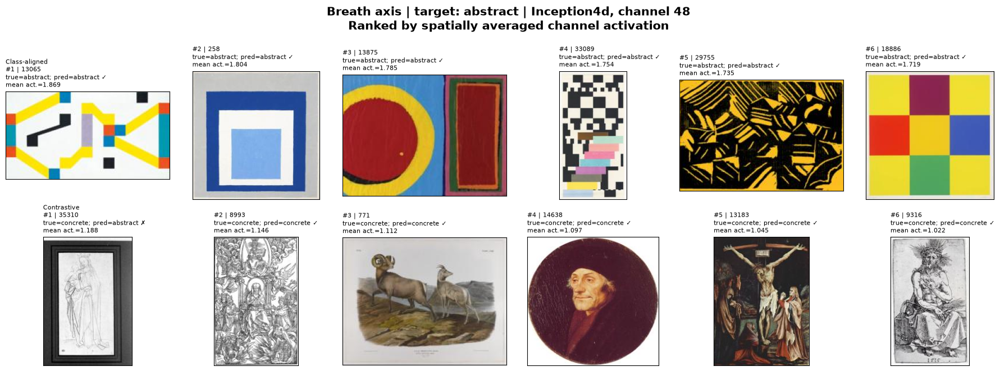

Saved: visualizations/googlenet/exemplar_panels/breath/Inception4d_ch0048_class-abstract_top6_raw.png


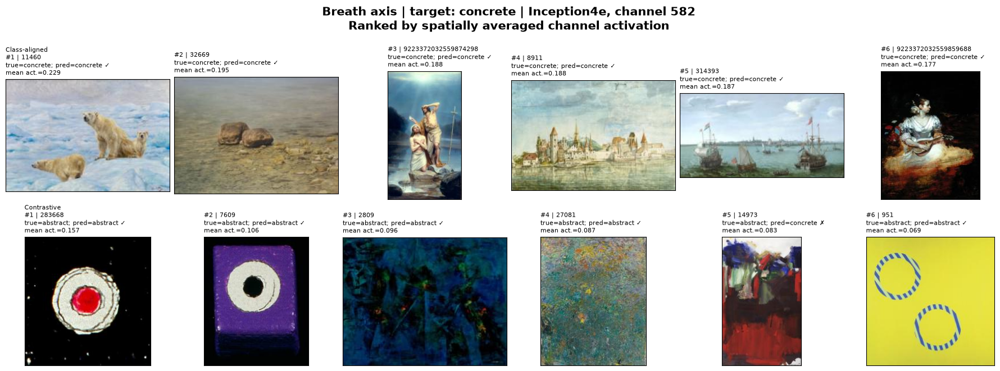

Saved: visualizations/googlenet/exemplar_panels/breath/Inception4e_ch0582_class-concrete_top6_raw.png


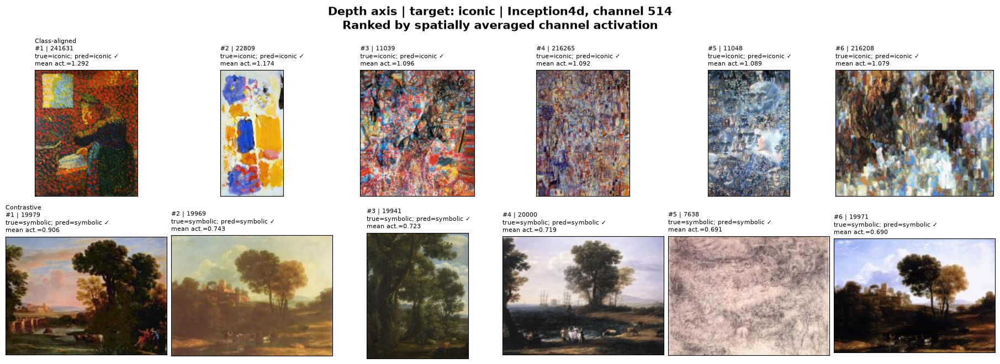

Saved: visualizations/googlenet/exemplar_panels/depth/Inception4d_ch0514_class-iconic_top6_raw.png


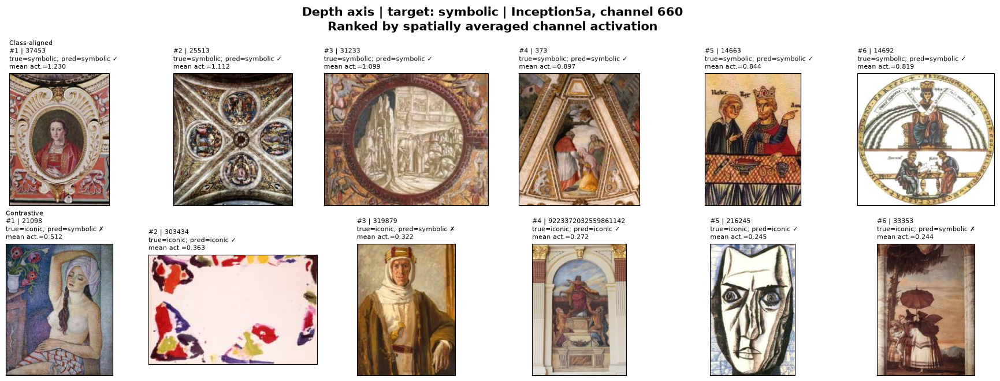

Saved: visualizations/googlenet/exemplar_panels/depth/Inception5a_ch0660_class-symbolic_top6_raw.png


In [28]:
if "representative_channels" not in globals():
    representative_channels = (
        channel_registry
        .sort_values(
            [
                "focus",
                "target_class",
                "combined_evidence_score_v2",
            ],
            ascending=[True, True, False],
        )
        .groupby(
            ["focus", "target_class"],
            observed=True,
            as_index=False,
        )
        .head(1)
        [
            [
                "focus",
                "target_class",
                "layer_name",
                "channel",
            ]
        ]
        .reset_index(drop=True)
    )

saved_raw_panels = []

for representative in representative_channels.itertuples(index=False):
    panel_path = make_raw_exemplar_panel(
        ranked_scores=activation_scores,
        focus=representative.focus,
        target_class=representative.target_class,
        layer_name=representative.layer_name,
        channel=representative.channel,
        top_k=TOP_K_PANEL,
    )

    saved_raw_panels.append(panel_path)
    print("Saved:", panel_path)

#### Overlay panels with mean activation pattern

In [29]:
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
from PIL import Image

OVERLAY_ROOT = Path(
    "visualizations/googlenet/activation_overlays"
)

OVERLAY_ALPHA = 0.55
TOP_K_OVERLAY = 6
COLORMAP = "magma"

In [30]:
def model_space_image(
    image_path,
    learn,
    device,
):
    """
    Return the exact 256 x 256 image tensor supplied to the model,
    converted to an H x W x 3 NumPy array in displayable [0, 1] range.
    """
    image = PILImage.create(image_path)

    image_dl = learn.dls.test_dl(
        [image],
        bs=1,
        num_workers=0,
    )

    batch = image_dl.one_batch()
    xb = batch[0] if isinstance(batch, (tuple, list)) else batch

    image_tensor = xb[0].detach().cpu().float()

    if image_tensor.shape[0] != 3:
        raise ValueError(
            f"Expected RGB tensor with 3 channels, received "
            f"{tuple(image_tensor.shape)}."
        )

    image_array = (
        image_tensor
        .permute(1, 2, 0)
        .numpy()
    )

    return np.clip(image_array, 0.0, 1.0)


def robust_unit_scale(
    activation_map,
    lower_percentile=1,
    upper_percentile=99,
):
    """
    Normalize one activation map to [0, 1] for spatial visualization.

    This is intentionally applied separately per painting. It reveals
    spatial distribution but should not be used to compare response
    magnitudes across paintings.
    """
    lower = np.percentile(
        activation_map,
        lower_percentile,
    )

    upper = np.percentile(
        activation_map,
        upper_percentile,
    )

    if upper <= lower:
        return np.zeros_like(
            activation_map,
            dtype=np.float32,
        )

    normalized = (
        activation_map - lower
    ) / (upper - lower)

    return np.clip(
        normalized,
        0.0,
        1.0,
    ).astype(np.float32)


def load_channel_maps(
    focus,
    layer_name,
    channel,
    activation_root=ACTIVATION_ROOT,
):
    """
    Load maps and return the selected channel's map tensor alongside the
    exact path ordering stored at extraction time.

    Returned map shape:
        (n_images, activation_height, activation_width)
    """
    inception_module = module_names[str(layer_name)]

    map_path = (
        activation_root
        / focus
        / f"{inception_module}_selected_maps.npz"
    )

    with np.load(map_path) as stored:
        maps = stored["maps"]
        channel_indices = stored["channel_indices"]
        image_paths = stored["image_paths"].astype(str)

    matching_positions = np.flatnonzero(
        channel_indices == int(channel)
    )

    if len(matching_positions) != 1:
        raise ValueError(
            f"Could not uniquely locate channel {channel} in "
            f"{map_path}. Matches: {matching_positions.tolist()}"
        )

    local_channel_index = int(matching_positions[0])

    return maps[:, local_channel_index, :, :], image_paths


def upsample_activation_map(
    activation_map,
    output_height,
    output_width,
):
    """
    Bilinearly resize an H x W activation map to model-input dimensions.
    """
    activation_tensor = torch.from_numpy(
        activation_map.astype(np.float32)
    )[None, None, :, :]

    upsampled = F.interpolate(
        activation_tensor,
        size=(output_height, output_width),
        mode="bilinear",
        align_corners=False,
    )

    return upsampled[0, 0].numpy()

In [31]:
def make_activation_overlay_panel(
    ranked_scores,
    focus,
    target_class,
    layer_name,
    channel,
    learners,
    output_root=OVERLAY_ROOT,
    top_k=TOP_K_OVERLAY,
    alpha=OVERLAY_ALPHA,
    colormap=COLORMAP,
):
    """
    Save a 2 x top_k panel with continuous activation overlays.

    Row 1: class-aligned high-activation paintings.
    Row 2: contrastive high-activation paintings.
    """
    channel_examples = (
        ranked_scores.loc[
            (ranked_scores["focus"] == focus)
            & (ranked_scores["layer_name"] == str(layer_name))
            & (ranked_scores["channel"] == int(channel))
            & (
                ranked_scores["rank_within_relation"]
                <= top_k
            )
        ]
        .copy()
    )

    aligned_examples = (
        channel_examples.loc[
            channel_examples["class_relation"]
            .eq("class_aligned")
        ]
        .sort_values("rank_within_relation")
        .reset_index(drop=True)
    )

    contrastive_examples = (
        channel_examples.loc[
            channel_examples["class_relation"]
            .eq("contrastive")
        ]
        .sort_values("rank_within_relation")
        .reset_index(drop=True)
    )

    if (
        len(aligned_examples) != top_k
        or len(contrastive_examples) != top_k
    ):
        raise ValueError(
            f"{focus}/{layer_name}/channel-{channel}: "
            "not enough ranked examples for the overlay panel."
        )

    channel_maps, saved_image_paths = load_channel_maps(
        focus=focus,
        layer_name=layer_name,
        channel=channel,
    )

    saved_path_to_index = {
        str(path): index
        for index, path in enumerate(saved_image_paths)
    }

    learn = learners[focus]
    inception_module = module_names[str(layer_name)]

    figure, axes = plt.subplots(
        nrows=2,
        ncols=top_k,
        figsize=(3.0 * top_k, 6.5),
        constrained_layout=True,
    )

    figure.suptitle(
        f"{focus.title()} axis | target: {target_class} | "
        f"{inception_module}, channel {channel}\n"
        "Continuous channel activation, normalized separately "
        "within each painting",
        fontsize=15,
        fontweight="bold",
    )

    relation_groups = [
        ("Class-aligned", aligned_examples),
        ("Contrastive", contrastive_examples),
    ]

    for row_index, (relation_title, examples) in enumerate(
        relation_groups
    ):
        for column_index, example in enumerate(
            examples.itertuples(index=False)
        ):
            axis = axes[row_index, column_index]

            image_path = str(example.image_path)

            if image_path not in saved_path_to_index:
                raise KeyError(
                    f"Image path missing from saved map archive: "
                    f"{image_path}"
                )

            map_index = saved_path_to_index[image_path]

            model_image = model_space_image(
                image_path=image_path,
                learn=learn,
                device=device,
            )

            activation_map = channel_maps[map_index]

            upsampled_map = upsample_activation_map(
                activation_map=activation_map,
                output_height=model_image.shape[0],
                output_width=model_image.shape[1],
            )

            display_map = robust_unit_scale(upsampled_map)

            axis.imshow(model_image)
            axis.imshow(
                display_map,
                cmap=colormap,
                alpha=alpha * display_map,
                vmin=0,
                vmax=1,
            )

            axis.set_xticks([])
            axis.set_yticks([])

            prediction_mark = (
                "✓"
                if example.is_correctly_predicted
                else "✗"
            )

            axis.set_title(
                f"{relation_title if column_index == 0 else ''}\n"
                f"#{example.rank_within_relation} | "
                f"{example.wikiart_content_id}\n"
                f"true={example.true_class}; "
                f"pred={example.predicted_class} {prediction_mark}\n"
                f"mean act.="
                f"{example.spatial_mean_activation:.3f}",
                fontsize=8,
                loc="left",
            )

    output_dir = output_root / safe_filename_part(focus)
    output_dir.mkdir(parents=True, exist_ok=True)

    output_path = output_dir / (
        f"{safe_filename_part(inception_module)}"
        f"_ch{int(channel):04d}"
        f"_class-{safe_filename_part(target_class)}"
        f"_top{top_k}_overlay.png"
    )

    figure.savefig(
        output_path,
        dpi=200,
        bbox_inches="tight",
        facecolor="white",
    )

    plt.show()
    plt.close(figure)

    return output_path

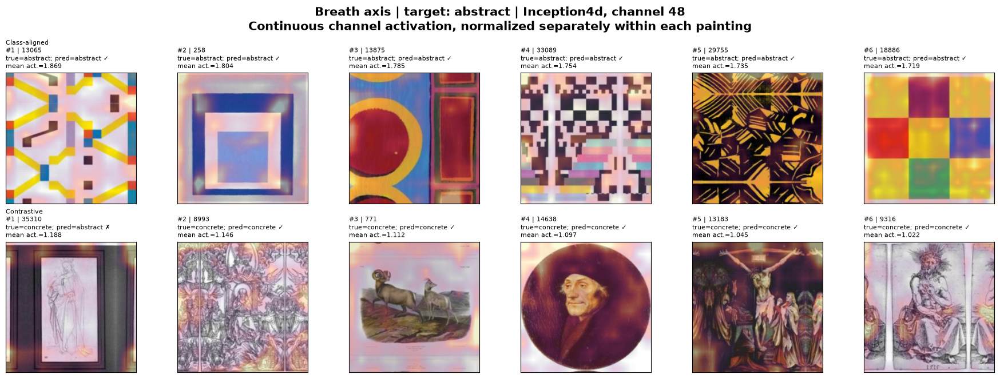

Saved: visualizations/googlenet/activation_overlays/breath/Inception4d_ch0048_class-abstract_top6_overlay.png


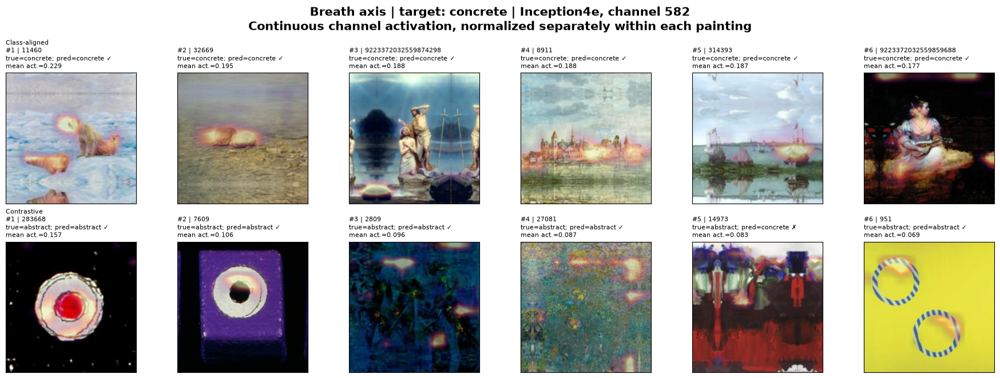

Saved: visualizations/googlenet/activation_overlays/breath/Inception4e_ch0582_class-concrete_top6_overlay.png


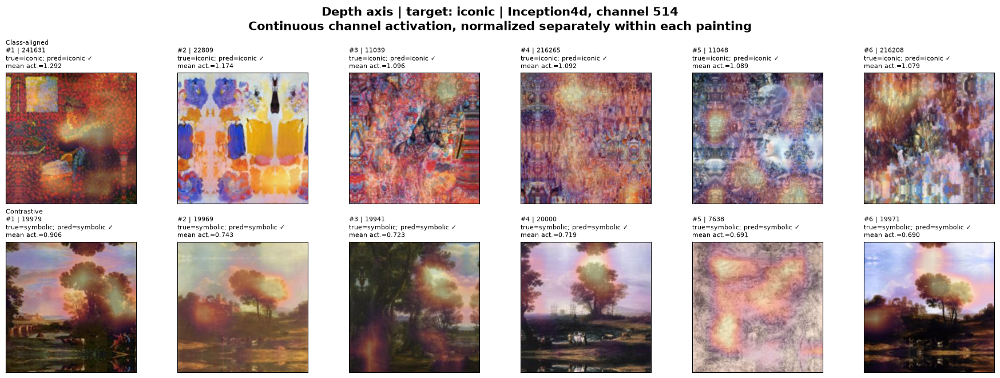

Saved: visualizations/googlenet/activation_overlays/depth/Inception4d_ch0514_class-iconic_top6_overlay.png


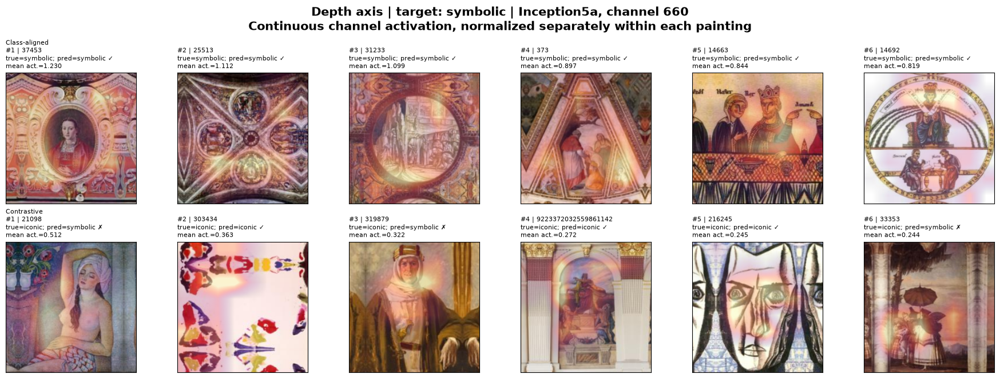

Saved: visualizations/googlenet/activation_overlays/depth/Inception5a_ch0660_class-symbolic_top6_overlay.png


In [32]:
saved_overlay_panels = []

for representative in representative_channels.itertuples(index=False):
    output_path = make_activation_overlay_panel(
        ranked_scores=activation_scores,
        focus=representative.focus,
        target_class=representative.target_class,
        layer_name=representative.layer_name,
        channel=representative.channel,
        learners=learners,
        top_k=TOP_K_OVERLAY,
    )

    saved_overlay_panels.append(output_path)
    print("Saved:", output_path)

In [33]:
ENHANCED_OVERLAY_ROOT = Path(
    "visualizations/googlenet/activation_overlays_enhanced"
)

ENHANCED_ALPHA = 0.88
ENHANCED_POWER = 2.0
ENHANCED_COLORMAP = "turbo"
CONTOUR_LEVELS = [0.35, 0.60, 0.80]


def emphasize_high_activations(
    normalized_map,
    power=ENHANCED_POWER,
):
    """
    Increase visual separation of high-response areas.

    `normalized_map` must already lie in [0, 1].
    A power greater than 1 suppresses weak activation and makes the
    highest-response portions more distinct.
    """
    return np.power(
        np.clip(normalized_map, 0.0, 1.0),
        power,
    ).astype(np.float32)

In [34]:
def make_enhanced_activation_overlay_panel(
    ranked_scores,
    focus,
    target_class,
    layer_name,
    channel,
    learners,
    output_root=ENHANCED_OVERLAY_ROOT,
    top_k=TOP_K_OVERLAY,
    alpha=ENHANCED_ALPHA,
    power=ENHANCED_POWER,
    colormap=ENHANCED_COLORMAP,
    contour_levels=CONTOUR_LEVELS,
):
    """
    Create a high-contrast activation-overlay panel.

    The colour and alpha display emphasizes upper activation values.
    Contours show activation regions at fixed within-image relative
    levels after robust [0, 1] normalization.
    """
    channel_examples = (
        ranked_scores.loc[
            (ranked_scores["focus"] == focus)
            & (ranked_scores["layer_name"] == str(layer_name))
            & (ranked_scores["channel"] == int(channel))
            & (
                ranked_scores["rank_within_relation"]
                <= top_k
            )
        ]
        .copy()
    )

    aligned_examples = (
        channel_examples.loc[
            channel_examples["class_relation"]
            .eq("class_aligned")
        ]
        .sort_values("rank_within_relation")
        .reset_index(drop=True)
    )

    contrastive_examples = (
        channel_examples.loc[
            channel_examples["class_relation"]
            .eq("contrastive")
        ]
        .sort_values("rank_within_relation")
        .reset_index(drop=True)
    )

    if (
        len(aligned_examples) != top_k
        or len(contrastive_examples) != top_k
    ):
        raise ValueError(
            f"{focus}/{layer_name}/channel-{channel}: "
            "not enough ranked examples."
        )

    channel_maps, saved_image_paths = load_channel_maps(
        focus=focus,
        layer_name=layer_name,
        channel=channel,
    )

    saved_path_to_index = {
        str(path): index
        for index, path in enumerate(saved_image_paths)
    }

    learn = learners[focus]
    inception_module = module_names[str(layer_name)]

    figure, axes = plt.subplots(
        nrows=2,
        ncols=top_k,
        figsize=(3.0 * top_k, 6.5),
        constrained_layout=True,
    )

    figure.suptitle(
        f"{focus.title()} axis | target: {target_class} | "
        f"{inception_module}, channel {channel}\n"
        "Contrast-enhanced channel activation "
        f"(power={power}, contours={contour_levels})",
        fontsize=15,
        fontweight="bold",
    )

    relation_groups = [
        ("Class-aligned", aligned_examples),
        ("Contrastive", contrastive_examples),
    ]

    for row_index, (relation_title, examples) in enumerate(
        relation_groups
    ):
        for column_index, example in enumerate(
            examples.itertuples(index=False)
        ):
            axis = axes[row_index, column_index]

            image_path = str(example.image_path)

            map_index = saved_path_to_index.get(image_path)

            if map_index is None:
                raise KeyError(
                    f"Image path not found in map archive: {image_path}"
                )

            model_image = model_space_image(
                image_path=image_path,
                learn=learn,
                device=device,
            )

            activation_map = channel_maps[map_index]

            upsampled_map = upsample_activation_map(
                activation_map=activation_map,
                output_height=model_image.shape[0],
                output_width=model_image.shape[1],
            )

            normalized_map = robust_unit_scale(upsampled_map)

            enhanced_map = emphasize_high_activations(
                normalized_map,
                power=power,
            )

            axis.imshow(model_image)

            axis.imshow(
                enhanced_map,
                cmap=colormap,
                alpha=alpha * enhanced_map,
                vmin=0,
                vmax=1,
            )

            axis.contour(
                normalized_map,
                levels=contour_levels,
                colors="white",
                linewidths=0.75,
                alpha=0.95,
            )

            axis.set_xticks([])
            axis.set_yticks([])

            prediction_mark = (
                "✓"
                if example.is_correctly_predicted
                else "✗"
            )

            axis.set_title(
                f"{relation_title if column_index == 0 else ''}\n"
                f"#{example.rank_within_relation} | "
                f"{example.wikiart_content_id}\n"
                f"true={example.true_class}; "
                f"pred={example.predicted_class} {prediction_mark}\n"
                f"mean act.="
                f"{example.spatial_mean_activation:.3f}",
                fontsize=8,
                loc="left",
            )

    output_dir = output_root / safe_filename_part(focus)
    output_dir.mkdir(parents=True, exist_ok=True)

    output_path = output_dir / (
        f"{safe_filename_part(inception_module)}"
        f"_ch{int(channel):04d}"
        f"_class-{safe_filename_part(target_class)}"
        f"_top{top_k}_enhanced-overlay.png"
    )

    figure.savefig(
        output_path,
        dpi=220,
        bbox_inches="tight",
        facecolor="white",
    )

    plt.show()
    plt.close(figure)

    return output_path

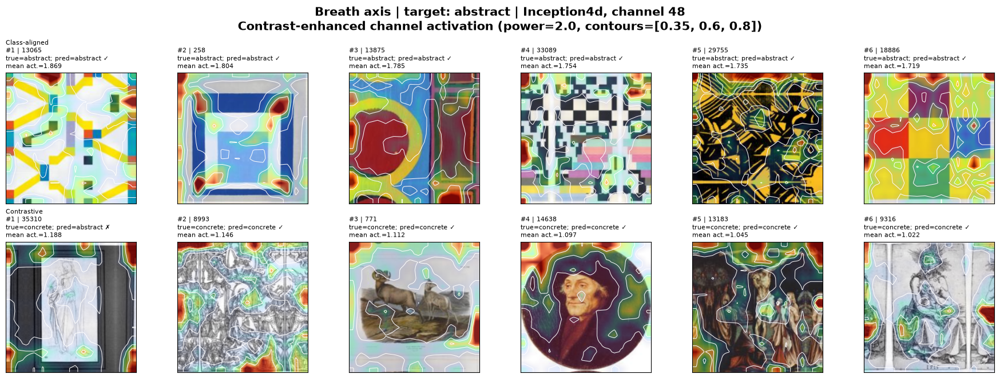

Saved: visualizations/googlenet/activation_overlays_enhanced/breath/Inception4d_ch0048_class-abstract_top6_enhanced-overlay.png


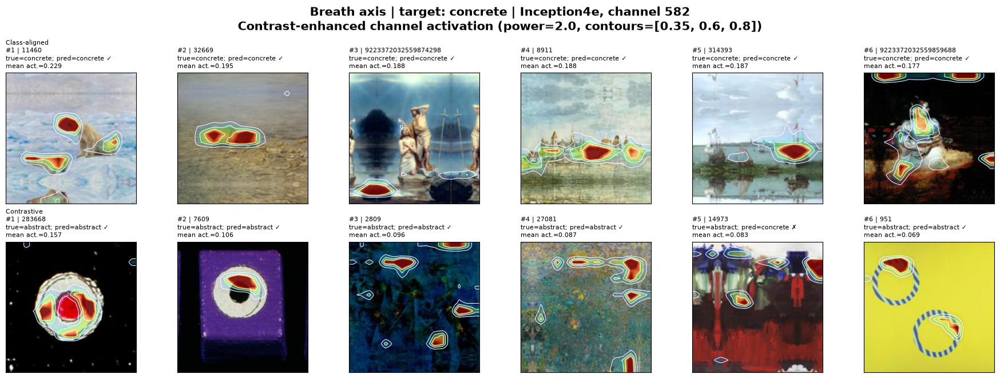

Saved: visualizations/googlenet/activation_overlays_enhanced/breath/Inception4e_ch0582_class-concrete_top6_enhanced-overlay.png


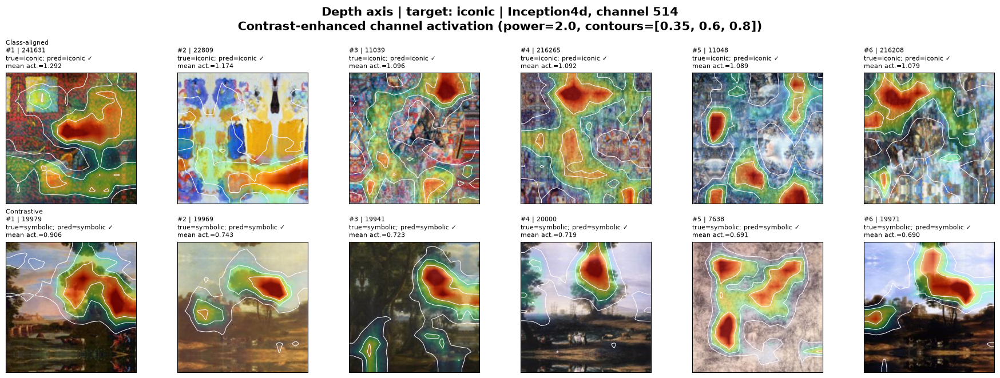

Saved: visualizations/googlenet/activation_overlays_enhanced/depth/Inception4d_ch0514_class-iconic_top6_enhanced-overlay.png


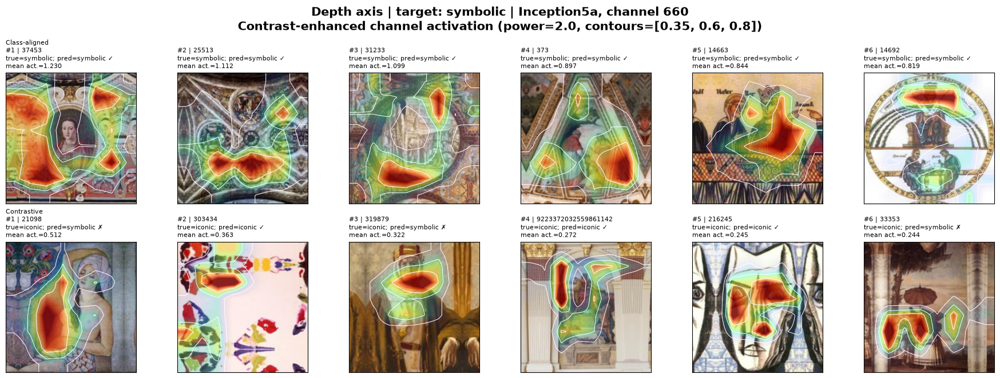

Saved: visualizations/googlenet/activation_overlays_enhanced/depth/Inception5a_ch0660_class-symbolic_top6_enhanced-overlay.png


In [35]:
saved_overlay_panels = []

for representative in representative_channels.itertuples(index=False):
    output_path = make_enhanced_activation_overlay_panel(
        ranked_scores=activation_scores,
        focus=representative.focus,
        target_class=representative.target_class,
        layer_name=representative.layer_name,
        channel=representative.channel,
        learners=learners,
        top_k=TOP_K_OVERLAY,
    )

    saved_overlay_panels.append(output_path)
    print("Saved:", output_path)

#### Shortlist the channels and collect exemplars

In [36]:
def channels_for_class(
    evidence_df,
    focus,
    target_class,
    min_abs_d=0.5,
):
    """
    Retain channels associated with one semantic pole.

    Positive Cohen's d denotes relatively higher activation for class_a;
    negative Cohen's d denotes relatively higher activation for class_b.
    """
    subset = evidence_df[
        (evidence_df["focus"] == focus)
        & (evidence_df["abs_cohens_d"] >= min_abs_d)
    ].copy()

    if subset.empty:
        return subset

    class_a = subset["class_a"].iloc[0]
    class_b = subset["class_b"].iloc[0]

    if target_class == class_a:
        return subset[subset["cohens_d"] > 0].copy()

    if target_class == class_b:
        return subset[subset["cohens_d"] < 0].copy()

    raise ValueError(
        f"{target_class!r} is not one of "
        f"{class_a!r}, {class_b!r}"
    )

In [40]:
import pandas as pd
import numpy as np

def shortlist_channels(
    evidence_df,
    focus,
    target_class,
    n_channels=5,
    min_abs_d=0.5,
    strategy="layer_balanced",
    layer_col="layer_name",
    channel_col="channel",
):
    """
    Select a compact, reproducible set of class-associated channels.

    Parameters
    ----------
    evidence_df : pd.DataFrame
        Must contain focus, class_a, class_b, cohens_d, abs_cohens_d,
        plus module/channel identification columns.
    focus : str
        E.g. 'breath' or 'depth'.
    target_class : str
        E.g. 'abstract', 'concrete', 'iconic', or 'symbolic'.
    n_channels : int
        Number of channels to retain for this semantic pole.
    strategy : {'global', 'layer_balanced'}
        'global' chooses the largest absolute Cohen's d values.
        'layer_balanced' first selects one strongest channel per layer,
        then fills remaining places by effect size.
    """
    candidates = channels_for_class(
        evidence_df=evidence_df,
        focus=focus,
        target_class=target_class,
        min_abs_d=min_abs_d,
    ).copy()

    if candidates.empty:
        return candidates

    candidates = (
        candidates
        .sort_values("abs_cohens_d", ascending=False)
        .drop_duplicates(subset=[layer_col, channel_col])
        .reset_index(drop=True)
    )

    if strategy == "global":
        return candidates.head(n_channels).copy()

    if strategy != "layer_balanced":
        raise ValueError("strategy must be 'global' or 'layer_balanced'")

    strongest_per_layer = (
        candidates
        .groupby(layer_col, sort=False, group_keys=False)
        .head(1)
        .sort_values("abs_cohens_d", ascending=False)
    )

    chosen = strongest_per_layer.head(n_channels).copy()

    if len(chosen) < n_channels:
        already_chosen = set(
            zip(chosen[layer_col], chosen[channel_col])
        )

        remaining = candidates[
            ~candidates.apply(
                lambda row: (row[layer_col], row[channel_col])
                in already_chosen,
                axis=1,
            )
        ]

        chosen = pd.concat(
            [chosen, remaining.head(n_channels - len(chosen))],
            ignore_index=True,
        )

    return (
        chosen
        .sort_values("abs_cohens_d", ascending=False)
        .reset_index(drop=True)
    )

In [41]:
shortlists = {
    "abstract": shortlist_channels(
        final_channel_evidence,
        focus="breath",
        target_class="abstract",
        n_channels=5,
        strategy="layer_balanced",
    ),
    "concrete": shortlist_channels(
        final_channel_evidence,
        focus="breath",
        target_class="concrete",
        n_channels=5,
        strategy="layer_balanced",
    ),
    "iconic": shortlist_channels(
        final_channel_evidence,
        focus="depth",
        target_class="iconic",
        n_channels=5,
        strategy="layer_balanced",
    ),
    "symbolic": shortlist_channels(
        final_channel_evidence,
        focus="depth",
        target_class="symbolic",
        n_channels=5,
        strategy="layer_balanced",
    ),
}

In [44]:
print(final_channel_evidence.columns.tolist())

display(
    final_channel_evidence[
        ["focus", "class_a", "class_b", "cohens_d", "abs_cohens_d"]
    ]
)

['focus', 'layer_name', 'channel', 'class_a', 'class_b', 'mean_a', 'mean_b', 'std_a', 'std_b', 'cohens_d', 'abs_cohens_d', 'probe_coefficient', 'abs_probe_coefficient', 'mean_abstract', 'mean_concrete', 'std_abstract', 'std_concrete', 'median_abstract', 'median_concrete', 'count_abstract', 'count_concrete', 'signed_ablation_score', 'consistency_a', 'consistency_b', 'consistent_ablation', 'mean_iconic', 'mean_symbolic', 'std_iconic', 'std_symbolic', 'median_iconic', 'median_symbolic', 'count_iconic', 'count_symbolic', 'abs_cohens_d_z', 'abs_probe_coefficient_z', 'signed_ablation_score_z', 'combined_evidence_score', 'bidirectional_consistency', 'abs_signed_ablation_score', 'ablation_sign_agrees_with_d', 'abs_signed_ablation_score_z', 'bidirectional_consistency_z', 'combined_evidence_score_v2', 'ablation_tier', 'evidence_rank_within_layer', 'evidence_rank_within_focus']


,focus,class_a,class_b,cohens_d,abs_cohens_d
0,depth,iconic,symbolic,0.751991,0.751991
1,depth,iconic,symbolic,0.706396,0.706396
2,depth,iconic,symbolic,-0.657480,0.657480
3,depth,iconic,symbolic,-0.569068,0.569068
4,depth,iconic,symbolic,-0.562420,0.562420
...,...,...,...,...,...
9983,breath,abstract,concrete,0.993499,0.993499
9985,breath,abstract,concrete,0.985484,0.985484
9994,breath,abstract,concrete,0.937933,0.937933
9995,breath,abstract,concrete,0.936990,0.936990


In [45]:
visualization_channels = pd.concat(
    [
        table.assign(target_class=target_class)
        for target_class, table in shortlists.items()
    ],
    ignore_index=True,
)

visualization_channels = visualization_channels.sort_values(
    ["focus", "target_class", "abs_cohens_d"],
    ascending=[True, True, False],
).reset_index(drop=True)

display(visualization_channels)

,focus,layer_name,channel,class_a,class_b,mean_a,mean_b,std_a,std_b,cohens_d,...,bidirectional_consistency,abs_signed_ablation_score,ablation_sign_agrees_with_d,abs_signed_ablation_score_z,bidirectional_consistency_z,combined_evidence_score_v2,ablation_tier,evidence_rank_within_layer,evidence_rank_within_focus,target_class
0,breath,0.11,519,abstract,concrete,0.596278,0.146596,0.375547,0.140445,1.586101,...,0.20,0.315510,True,1.262737,-0.383620,3.310049,low,7,68,abstract
1,breath,0.8,5,abstract,concrete,0.778574,0.158767,0.546933,0.175905,1.525677,...,0.43,0.218428,True,0.867790,0.497613,3.471638,moderate,8,62,abstract
2,breath,0.12,695,abstract,concrete,0.166691,0.078157,0.077655,0.029954,1.504290,...,0.77,0.291583,True,1.115917,2.412795,4.466901,high,4,27,abstract
3,breath,0.6,77,abstract,concrete,0.368576,0.134257,0.211920,0.069528,1.485773,...,0.28,0.238987,False,0.054149,-0.628606,1.551633,low,15,132,abstract
4,breath,0.10,463,abstract,concrete,0.683131,0.166931,0.479870,0.168794,1.435089,...,0.58,0.206119,True,0.907062,1.686132,4.148957,high,3,34,abstract
5,breath,0.10,118,abstract,concrete,0.788854,1.524903,0.393811,0.285854,-2.139103,...,0.00,0.000000,False,-0.517401,-2.388687,3.300124,low,7,69,concrete
6,breath,0.8,145,abstract,concrete,0.071724,0.291724,0.093340,0.138602,-1.861903,...,0.26,0.079032,False,-0.470202,-0.986495,4.670709,low,4,23,concrete
7,breath,0.6,42,abstract,concrete,0.156801,0.512515,0.167475,0.215038,-1.845664,...,0.18,0.117877,False,-0.398326,-1.419305,3.780240,low,5,51,concrete
8,breath,0.11,76,abstract,concrete,0.391718,0.772369,0.191128,0.229934,-1.800426,...,0.11,0.193354,False,0.400356,-1.102906,5.640776,low,2,10,concrete
9,breath,0.9,22,abstract,concrete,1.167660,1.801900,0.437552,0.281509,-1.723951,...,0.32,0.297563,False,2.126106,0.057912,5.974667,low,1,6,concrete


In [46]:
from pathlib import Path

shortlist_path = Path(
    "output/googlenet_visualization_channels_top20.parquet"
)

shortlist_path.parent.mkdir(parents=True, exist_ok=True)

visualization_channels.to_parquet(
    shortlist_path,
    index=False,
)

print(f"Saved {len(visualization_channels)} channels to:")
print(shortlist_path)

Saved 20 channels to:
output/googlenet_visualization_channels_top20.parquet


>>>> Start here

## Maximum Activation Visualizations

In [47]:
visualization_channels = pd.read_parquet(
    "output/googlenet_visualization_channels_top20.parquet"
)

In [ ]:
def get_module_by_path(root_module, module_path):
    """
    Resolve a dotted PyTorch module path such as '0.10'
    to the corresponding nested module.
    """
    module = root_module

    for part in str(module_path).split("."):
        if part.isdigit():
            module = module[int(part)]
        else:
            module = getattr(module, part)

    return module


for focus in ["breath", "depth"]:
    model = learners[focus].model

    layer_paths = (
        visualization_channels.loc[
            visualization_channels["focus"] == focus,
            "layer_name",
        ]
        .astype(str)
        .drop_duplicates()
        .sort_values()
        .tolist()
    )

    print(f"\n{'=' * 90}")
    print(f"{focus.upper()} MODEL: selected evidence layers")
    print(f"{'=' * 90}")

    for layer_path in layer_paths:
        module = get_module_by_path(model, layer_path)

        print(f"\nLayer path: {layer_path}")
        print(f"Module type: {type(module).__name__}")
        print(module)

In [51]:
import torch

focus = "depth"
learn = learners[focus]
model = learn.model.eval()

for module_path, label in module_names.items():
    outer_idx, inner_idx = map(int, module_path.split("."))
    module = model[outer_idx][inner_idx]
    
    print(
        f"{label:12s} | path={module_path:5s} | "
        f"type={type(module).__name__}"
    )

Inception3a  | path=0.5   | type=Inception
Inception3b  | path=0.6   | type=Inception
Inception4a  | path=0.8   | type=Inception
Inception4b  | path=0.9   | type=Inception
Inception4c  | path=0.10  | type=Inception
Inception4d  | path=0.11  | type=Inception
Inception4e  | path=0.12  | type=Inception
Inception5a  | path=0.14  | type=Inception
Inception5b  | path=0.15  | type=Inception


In [52]:
selected_examples = [
    ("Inception4d", 48),
    ("Inception4d", 514),
    ("Inception4e", 582),
    ("Inception5a", 660),
]

name_to_path = {name: path for path, name in module_names.items()}

def get_inception_module(model, inception_name):
    outer_idx, inner_idx = map(int, name_to_path[inception_name].split("."))
    return model[outer_idx][inner_idx]

for inception_name, channel_idx in selected_examples:
    module = get_inception_module(model, inception_name)
    print(f"{inception_name}: channel {channel_idx} -> {module}")

Inception4d: channel 48 -> Inception(
  (branch1): BasicConv2d(
    (conv): Conv2d(512, 112, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(112, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (branch2): Sequential(
    (0): BasicConv2d(
      (conv): Conv2d(512, 144, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(144, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicConv2d(
      (conv): Conv2d(144, 288, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(288, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (branch3): Sequential(
    (0): BasicConv2d(
      (conv): Conv2d(512, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicConv2d(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)

In [62]:
from pathlib import Path
from collections import OrderedDict

import torch

# -------------------------------------------------------------------
# 1. Model/module registry
# -------------------------------------------------------------------

module_names = {
    "0.5":  "Inception3a",
    "0.6":  "Inception3b",
    "0.8":  "Inception4a",
    "0.9":  "Inception4b",
    "0.10": "Inception4c",
    "0.11": "Inception4d",
    "0.12": "Inception4e",
    "0.14": "Inception5a",
    "0.15": "Inception5b",
}

name_to_path = {name: path for path, name in module_names.items()}

def get_inception_module(model, inception_name):
    if inception_name not in name_to_path:
        valid = ", ".join(name_to_path)
        raise KeyError(
            f"Unknown module {inception_name!r}. "
            f"Available modules: {valid}"
        )

    outer_idx, inner_idx = map(
        int,
        name_to_path[inception_name].split(".")
    )
    return model[outer_idx][inner_idx]


# -------------------------------------------------------------------
# 2. Targets to validate
#    Expand this list later from selected_evidence if desired.
# -------------------------------------------------------------------

targets_to_validate = [
    ("Inception4d", 48),
    ("Inception4d", 514),
    ("Inception4e", 582),
    ("Inception5a", 660),
]


# -------------------------------------------------------------------
# 3. Choose one real image and create an inference batch using
#    the learner's existing fastai transforms.
# -------------------------------------------------------------------

focus = "depth"
image_dir = Path("artefacts/depth/symbolic")

image_extensions = {".jpg", ".jpeg", ".png", ".webp", ".tif", ".tiff"}
image_paths = sorted(
    path for path in image_dir.rglob("*")
    if path.suffix.lower() in image_extensions
)

if not image_paths:
    raise FileNotFoundError(
        f"No supported images found under: {image_dir.resolve()}"
    )

image_path = image_paths[0]
learn = learners[focus]
model = learn.model.eval()
device = next(model.parameters()).device

# test_dl applies the trained learner's item/batch transforms,
# including resizing and normalization.
test_dl = learn.dls.test_dl([image_path], with_labels=False)
xb = test_dl.one_batch()[0].to(device)

print(f"Focus:       {focus}")
print(f"Image:       {image_path}")
print(f"Input shape: {tuple(xb.shape)}")
print(f"Device:      {device}")


# -------------------------------------------------------------------
# 4. Hook requested Inception outputs, execute one forward pass,
#    and report tensor/channel properties.
# -------------------------------------------------------------------

captured_outputs = OrderedDict()
hook_handles = []

requested_modules = sorted({module_name for module_name, _ in targets_to_validate})

def make_hook(module_name):
    def hook_fn(module, inputs, output):
        captured_outputs[module_name] = output.detach().cpu()
    return hook_fn

for module_name in requested_modules:
    target_module = get_inception_module(model, module_name)
    hook_handles.append(
        target_module.register_forward_hook(make_hook(module_name))
    )

try:
    with torch.inference_mode():
        model_output = model(xb)
finally:
    for handle in hook_handles:
        handle.remove()


# -------------------------------------------------------------------
# 5. Report captured outputs and verify channel indexes.
# -------------------------------------------------------------------

print("\nCaptured Inception outputs")
print("-" * 72)

for module_name in requested_modules:
    activation = captured_outputs[module_name]

    if activation.ndim != 4:
        raise RuntimeError(
            f"{module_name} produced shape {tuple(activation.shape)}, "
            "but expected a 4-D tensor: (batch, channels, height, width)."
        )

    batch_size, n_channels, height, width = activation.shape

    print(
        f"{module_name:12s} | "
        f"shape={tuple(activation.shape)} | "
        f"spatial map={height}×{width}"
    )

print("\nRequested-channel validation")
print("-" * 72)

for module_name, channel_idx in targets_to_validate:
    activation = captured_outputs[module_name]
    n_channels = activation.shape[1]
    height, width = activation.shape[-2:]

    if not 0 <= channel_idx < n_channels:
        raise IndexError(
            f"{module_name}, channel {channel_idx}: INVALID. "
            f"Valid indexes are 0 to {n_channels - 1}."
        )

    channel_map = activation[0, channel_idx]
    mean_activation = channel_map.mean().item()
    max_activation = channel_map.max().item()
    positive_fraction = (channel_map > 0).float().mean().item()

    print(
        f"✓ {module_name}, channel {channel_idx:3d} | "
        f"map={height}×{width} | "
        f"mean={mean_activation:9.4f} | "
        f"max={max_activation:9.4f} | "
        f"positive fraction={positive_fraction:6.2%}"
    )

Focus:       depth
Image:       artefacts/depth/symbolic/10087.jpg
Input shape: (1, 3, 256, 256)
Device:      cuda:0

Captured Inception outputs
------------------------------------------------------------------------
Inception4d  | shape=(1, 528, 16, 16) | spatial map=16×16
Inception4e  | shape=(1, 832, 16, 16) | spatial map=16×16
Inception5a  | shape=(1, 832, 8, 8) | spatial map=8×8

Requested-channel validation
------------------------------------------------------------------------
✓ Inception4d, channel  48 | map=16×16 | mean=   0.5511 | max=   3.9647 | positive fraction=54.30%
✓ Inception4d, channel 514 | map=16×16 | mean=   0.2077 | max=   1.7114 | positive fraction=32.81%
✓ Inception4e, channel 582 | map=16×16 | mean=   0.0262 | max=   1.2150 | positive fraction= 5.47%
✓ Inception5a, channel 660 | map=8×8 | mean=   0.2007 | max=   1.3496 | positive fraction=48.44%


In [ ]:
device = next(model.parameters()).device
device

For a channel $c$ in Inception module $l$, we optimize a synthetic image $x$ to miaximize its spatially averaged activation: 
$$x^*=\argmax_x\biggl[\frac{1}{HW}\sum_{h,v}A_{l,c}(x)_{h,w}-\lambda_{TV}R_{TV}(x)-\lambda_{L2}R_{L2}(x)\biggr].$$

The target score is the mean across the entire channel map, rather than its single largest cell. This choice is deliberate: it asks for a stimulus that activates the channel consistently, not merely one that creates a small adversarial-like hotspot. Random spatial jitter and total-variation regularization discourage optimization artifacts and make the preferred pattern more spatially stable.

Activation maximization was introduced as a way to identify inputs that most strongly excite hidden units; modern feature-visualization practice combines this optimization with regularization and transformations to make the resulting images more interpretable. Olah, Mordvintsev, and Schubert’s Feature Visualization systematized these procedures, while DeepDream popularized gradient-based enhancement of internal CNN representations. Figures should be interpreted as synthetic preferred stimuli, not generated paintings or literal semantic prototypes.

In [77]:
from pathlib import Path
import json
import re

import numpy as np
import torch
import torch.nn.functional as F
from PIL import Image


# -------------------------------------------------------------------
# 1. Configuration
# -------------------------------------------------------------------

VIS_ROOT = Path("visualizations/googlenet/activation_maximization")

# Keep this at the model's trained native inference resolution.
IMAGE_SIZE = 256


# -------------------------------------------------------------------
# 2. Utility functions
# -------------------------------------------------------------------

def safe_filename(value):
    """Convert a label/value into a filesystem-safe filename component."""
    return re.sub(r"[^A-Za-z0-9._-]+", "-", str(value)).strip("-")


def get_inception_module(model, inception_name):
    """Resolve an evidence-table Inception name to its model module."""
    if inception_name not in name_to_path:
        raise KeyError(
            f"Unknown module {inception_name!r}. "
            f"Available: {list(name_to_path)}"
        )

    outer_idx, inner_idx = map(
        int,
        name_to_path[inception_name].split(".")
    )
    return model[outer_idx][inner_idx]


def get_normalization_stats(learn, device):
    """
    Recover Normalize mean/std from the fastai DataLoaders pipeline.
    Returns tensors shaped (1, 3, 1, 1), ready for broadcasting.
    """
    normalize_tfms = [
        t for t in learn.dls.after_batch.fs
        if t.__class__.__name__ == "Normalize"
    ]

    if len(normalize_tfms) != 1:
        found = [type(t).__name__ for t in learn.dls.after_batch.fs]
        raise RuntimeError(
            "Expected exactly one fastai Normalize transform in "
            f"learn.dls.after_batch.fs; found {len(normalize_tfms)}. "
            f"Transforms: {found}"
        )

    norm = normalize_tfms[0]

    mean = torch.as_tensor(norm.mean, dtype=torch.float32, device=device)
    std = torch.as_tensor(norm.std, dtype=torch.float32, device=device)

    if mean.ndim == 1:
        mean = mean.view(1, -1, 1, 1)
    if std.ndim == 1:
        std = std.view(1, -1, 1, 1)

    return mean, std


def total_variation(image):
    """Mean anisotropic total variation for an RGB image batch."""
    vertical = (image[:, :, 1:, :] - image[:, :, :-1, :]).abs().mean()
    horizontal = (image[:, :, :, 1:] - image[:, :, :, :-1]).abs().mean()
    return vertical + horizontal


def save_rgb_tensor(image_tensor, output_path):
    """
    Save one [3, H, W] tensor in [0, 1] as RGB PNG without torchvision.
    """
    image_uint8 = (
        image_tensor.detach()
        .clamp(0, 1)
        .permute(1, 2, 0)
        .mul(255)
        .round()
        .byte()
        .cpu()
        .numpy()
    )

    Image.fromarray(image_uint8, mode="RGB").save(output_path)


# -------------------------------------------------------------------
# 3. Channel activation-maximization routine
# -------------------------------------------------------------------

def optimize_channel_activation(
    learn,
    inception_name,
    channel_idx,
    steps=320,
    lr=0.055,
    jitter_px=8,
    tv_weight=0.015,
    l2_weight=0.001,
    seed=42,
):
    """
    Create one synthetic image that maximizes the spatial-mean activation
    of `channel_idx` in a complete Inception-block output.

    The returned image is in ordinary RGB space [0, 1], whereas the
    optimization forward pass applies the learner's original normalization.
    """
    torch.manual_seed(seed)
    np.random.seed(seed)

    model = learn.model.eval()
    device = next(model.parameters()).device

    if device.type != "cuda":
        raise RuntimeError(
            f"Model is on {device}, not CUDA. "
            "Run the GPU-transfer cell before activation maximization."
        )

    target_module = get_inception_module(model, inception_name)
    mean, std = get_normalization_stats(learn, device)

    captured = {}

    def hook_fn(module, inputs, output):
        captured["activation"] = output

    hook_handle = target_module.register_forward_hook(hook_fn)

    try:
        # Initialize in valid RGB space, near neutral mid-tone values.
        image = (
            0.50
            + 0.08
            * torch.randn(
                1, 3, IMAGE_SIZE, IMAGE_SIZE,
                device=device
            )
        ).clamp(0, 1)

        image.requires_grad_(True)
        optimizer = torch.optim.Adam([image], lr=lr)

        score_history = []

        for step in range(steps):
            optimizer.zero_grad(set_to_none=True)
            captured.clear()

            shift_y = int(
                torch.randint(
                    -jitter_px,
                    jitter_px + 1,
                    (1,),
                    device=device
                ).item()
            )
            shift_x = int(
                torch.randint(
                    -jitter_px,
                    jitter_px + 1,
                    (1,),
                    device=device
                ).item()
            )

            padded_image = F.pad(
                image,
                pad=(jitter_px, jitter_px, jitter_px, jitter_px),
                mode="reflect",
            )

            crop_y = jitter_px + shift_y
            crop_x = jitter_px + shift_x

            jittered_image = padded_image[
                :,
                :,
                crop_y:crop_y + IMAGE_SIZE,
                crop_x:crop_x + IMAGE_SIZE,
            ]

            normalized_image = (jittered_image - mean) / std
            _ = model(normalized_image)

            activation = captured["activation"]

            if channel_idx >= activation.shape[1]:
                raise IndexError(
                    f"{inception_name} has {activation.shape[1]} output "
                    f"channels, but channel {channel_idx} was requested."
                )

            activation_score = activation[:, channel_idx].mean()
            tv_penalty = total_variation(image)
            l2_penalty = (image - 0.5).square().mean()

            loss = (
                -activation_score
                + tv_weight * tv_penalty
                + l2_weight * l2_penalty
            )

            loss.backward()
            optimizer.step()

            with torch.no_grad():
                image.clamp_(0, 1)

            score_history.append(float(activation_score.detach().cpu()))

    finally:
        hook_handle.remove()

    return {
        "image": image.detach().squeeze(0).cpu(),
        "final_score": score_history[-1],
        "initial_score": score_history[0],
        "max_score": max(score_history),
        "score_history": score_history,
        "feature_map_shape": tuple(activation.shape[-2:]),
        "device": str(device),
    }


# -------------------------------------------------------------------
# 4. Save one visualization plus auditable metadata
# -------------------------------------------------------------------

def generate_and_save_activation_maximization(
    focus,
    target_class,
    inception_name,
    channel_idx,
    cohens_d=None,
    **optimization_kwargs,
):
    """
    Generate and save one regularized synthetic preferred stimulus.
    """
    if focus not in learners:
        raise KeyError(f"No learner is loaded for focus={focus!r}.")

    result = optimize_channel_activation(
        learn=learners[focus],
        inception_name=inception_name,
        channel_idx=channel_idx,
        **optimization_kwargs,
    )

    output_dir = VIS_ROOT / safe_filename(focus)
    output_dir.mkdir(parents=True, exist_ok=True)

    d_text = (
        f"_d-{cohens_d:+.3f}"
        if cohens_d is not None
        else ""
    )

    seed_text = optimization_kwargs.get("seed", "unknown")

    stem = (
        f"{safe_filename(inception_name)}"
        f"_ch{channel_idx:03d}"
        f"_class-{safe_filename(target_class)}"
        f"{d_text}"
        f"_seed-{seed_text}"
    )

    image_path = output_dir / f"{stem}.png"
    metadata_path = output_dir / f"{stem}.json"

    save_rgb_tensor(result["image"], image_path)

    metadata = {
        "visualization_type": "regularized_channel_activation_maximization",
        "focus": focus,
        "target_class": target_class,
        "inception_module": inception_name,
        "channel_index_zero_based": channel_idx,
        "cohens_d": cohens_d,
        "image_size": IMAGE_SIZE,
        "feature_map_shape": result["feature_map_shape"],
        "initial_activation_score": result["initial_score"],
        "final_activation_score": result["final_score"],
        "maximum_activation_score": result["max_score"],
        "optimization": optimization_kwargs,
        "model_device": result["device"],
    }

    with open(metadata_path, "w", encoding="utf-8") as file:
        json.dump(metadata, file, indent=2)

    print(f"Saved image:    {image_path}")
    print(f"Saved metadata: {metadata_path}")
    print(
        f"Activation score: "
        f"{result['initial_score']:.4f} → {result['final_score']:.4f} "
        f"(maximum {result['max_score']:.4f})"
    )
    print(f"Target map size: {result['feature_map_shape']}")

    return result, image_path, metadata_path

In [78]:
def get_normalization_stats(learn, device):
    """
    Recover fastai Normalize mean/std if present.

    If no Normalize transform is present in the exported learner's active
    after_batch pipeline, return identity statistics. This preserves the
    exact input convention used by learn.dls.test_dl(...).one_batch().
    """
    normalize_tfms = [
        t for t in learn.dls.after_batch.fs
        if t.__class__.__name__ == "Normalize"
    ]

    if len(normalize_tfms) == 0:
        print(
            "No fastai Normalize transform found in the active "
            "after_batch pipeline; using identity normalization."
        )

        mean = torch.zeros(
            1, 3, 1, 1,
            dtype=torch.float32,
            device=device,
        )
        std = torch.ones(
            1, 3, 1, 1,
            dtype=torch.float32,
            device=device,
        )

        return mean, std

    if len(normalize_tfms) > 1:
        found = [type(t).__name__ for t in learn.dls.after_batch.fs]
        raise RuntimeError(
            "Expected zero or one Normalize transform in "
            f"learn.dls.after_batch.fs; found {len(normalize_tfms)}. "
            f"Transforms: {found}"
        )

    norm = normalize_tfms[0]

    mean = torch.as_tensor(
        norm.mean,
        dtype=torch.float32,
        device=device,
    )
    std = torch.as_tensor(
        norm.std,
        dtype=torch.float32,
        device=device,
    )

    if mean.ndim == 1:
        mean = mean.view(1, -1, 1, 1)

    if std.ndim == 1:
        std = std.view(1, -1, 1, 1)

    return mean, std

In [79]:
# test run
result_582, image_path_582, metadata_path_582 = (
    generate_and_save_activation_maximization(
        focus="depth",
        target_class="symbolic",
        inception_name="Inception4e",
        channel_idx=582,

        # Replace with its actual signed d from symbolic_channels
        # when you retrieve it from selected_evidence.
        cohens_d=None,

        steps=320,
        lr=0.055,
        jitter_px=8,
        tv_weight=0.015,
        l2_weight=0.001,
        seed=42,
    )
)

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch582_class-symbolic_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch582_class-symbolic_seed-42.json
Activation score: 0.0000 → 5.6109 (maximum 6.3667)
Target map size: (16, 16)


In [69]:
device = next(model.parameters()).device
xb = test_dl.one_batch()[0].to(device)
print(f"Minimum input value: {xb.min().item():.6f}")
print(f"Maximum input value: {xb.max().item():.6f}")
print(f"Mean input value:    {xb.mean().item():.6f}")
print(f"Std. input value:    {xb.std().item():.6f}")

Minimum input value: 0.023529
Maximum input value: 0.988235
Mean input value:    0.383125
Std. input value:    0.191027


In [80]:
# seed stability validation
seed_results_582 = {}

for seed in [42, 44, 45]:
    result, image_path, metadata_path = (
        generate_and_save_activation_maximization(
            focus="depth",
            target_class="symbolic",
            inception_name="Inception4e",
            channel_idx=582,
            cohens_d=None,
            steps=320,
            lr=0.055,
            jitter_px=8,
            tv_weight=0.015,
            l2_weight=0.001,
            seed=seed,
        )
    )

    seed_results_582[seed] = {
        "result": result,
        "image_path": image_path,
        "metadata_path": metadata_path,
    }

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch582_class-symbolic_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch582_class-symbolic_seed-42.json
Activation score: 0.0000 → 6.0009 (maximum 6.8501)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch582_class-symbolic_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch582_class-symbolic_seed-44.json
Activation score: 0.0000 → 5.3690 (maximum 6.0983)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inc

IMAGE_SIZE = 256

steps = 320

lr = 0.055

jitter_px = 8

tv_weight = 0.015

l2_weight = 0.001

jitter = reflective-padding crop

In [83]:
print(final_channel_evidence.columns.tolist())
display(final_channel_evidence.head(3))

['focus', 'layer_name', 'channel', 'class_a', 'class_b', 'mean_a', 'mean_b', 'std_a', 'std_b', 'cohens_d', 'abs_cohens_d', 'probe_coefficient', 'abs_probe_coefficient', 'mean_abstract', 'mean_concrete', 'std_abstract', 'std_concrete', 'median_abstract', 'median_concrete', 'count_abstract', 'count_concrete', 'signed_ablation_score', 'consistency_a', 'consistency_b', 'consistent_ablation', 'mean_iconic', 'mean_symbolic', 'std_iconic', 'std_symbolic', 'median_iconic', 'median_symbolic', 'count_iconic', 'count_symbolic', 'abs_cohens_d_z', 'abs_probe_coefficient_z', 'signed_ablation_score_z', 'combined_evidence_score', 'bidirectional_consistency', 'abs_signed_ablation_score', 'ablation_sign_agrees_with_d', 'abs_signed_ablation_score_z', 'bidirectional_consistency_z', 'combined_evidence_score_v2', 'ablation_tier', 'evidence_rank_within_layer', 'evidence_rank_within_focus']


,focus,layer_name,channel,class_a,class_b,mean_a,mean_b,std_a,std_b,cohens_d,...,combined_evidence_score,bidirectional_consistency,abs_signed_ablation_score,ablation_sign_agrees_with_d,abs_signed_ablation_score_z,bidirectional_consistency_z,combined_evidence_score_v2,ablation_tier,evidence_rank_within_layer,evidence_rank_within_focus
0,depth,0.5,249,iconic,symbolic,0.403465,0.264059,0.209629,0.157445,0.751991,...,3.769791,0.49,0.001875,True,-1.170091,0.825232,3.267065,moderate,3,57
1,depth,0.5,66,iconic,symbolic,0.721759,0.596345,0.196504,0.156294,0.706396,...,3.270334,0.25,0.008189,False,-0.920122,-2.448417,1.641547,low,8,118
2,depth,0.5,142,iconic,symbolic,0.194201,0.278318,0.117396,0.137678,-0.657480,...,3.629767,0.49,0.008439,False,-0.910223,0.825232,3.216794,moderate,4,59


In [87]:
import pandas as pd

MIN_ABS_D = 0.5

def channels_for_class(
    evidence_df,
    focus,
    target_class,
    min_abs_d=MIN_ABS_D,
):
    """
    Return channels empirically associated with one binary target class.

    Convention:
    - positive Cohen's d indicates greater activation in class_a
    - negative Cohen's d indicates greater activation in class_b
    """
    subset = evidence_df[
        (evidence_df["focus"] == focus)
        & (evidence_df["abs_cohens_d"] >= min_abs_d)
    ].copy()

    if subset.empty:
        return subset

    class_a_values = subset["class_a"].dropna().unique()
    class_b_values = subset["class_b"].dropna().unique()

    if len(class_a_values) != 1 or len(class_b_values) != 1:
        raise ValueError(
            f"Expected one class_a and one class_b for focus={focus!r}, "
            f"but found class_a={class_a_values}, class_b={class_b_values}."
        )

    class_a = class_a_values[0]
    class_b = class_b_values[0]

    if target_class == class_a:
        result = subset[subset["cohens_d"] > 0].copy()

    elif target_class == class_b:
        result = subset[subset["cohens_d"] < 0].copy()

    else:
        raise ValueError(
            f"{target_class!r} is not one of "
            f"{class_a!r} or {class_b!r} for focus={focus!r}."
        )

    return result


def make_activation_max_manifest(
    evidence_df,
    min_abs_d=MIN_ABS_D,
    max_channels_per_class=None,
):
    """
    Create an auditable generation manifest.

    `max_channels_per_class=None` retains every selected channel.
    Set an integer, e.g. 10, for a ranked pilot subset.
    """
    class_targets = [
        ("breath", "abstract"),
        ("breath", "concrete"),
        ("depth", "iconic"),
        ("depth", "symbolic"),
    ]

    manifest_parts = []

    for focus, target_class in class_targets:
        selected = channels_for_class(
            evidence_df=evidence_df,
            focus=focus,
            target_class=target_class,
            min_abs_d=min_abs_d,
        )

        if selected.empty:
            print(
                f"Warning: no channels selected for "
                f"{focus} / {target_class}."
            )
            continue

        selected = selected.copy()
        selected["target_class"] = target_class

        selected["layer_path"] = selected["layer_name"].astype(str)
        selected["channel"] = selected["channel"].astype(int)

        unknown_layer_paths = sorted(
            set(selected["layer_name"]) - set(module_names)
        )

        if unknown_layer_paths:
            raise KeyError(
                f"Evidence-table layers cannot be resolved through "
                f"name_to_path: {unknown_layer_paths}"
            )
        selected["inception_name"] = selected["layer_path"].map(module_names)

        # Version 2 is the preferred integrated evidence ranking where
        # it is available; ties use effect magnitude and per-focus rank.
        selected = selected.sort_values(
            by=[
                "combined_evidence_score_v2",
                "abs_cohens_d",
                "evidence_rank_within_focus",
            ],
            ascending=[False, False, True],
            na_position="last",
        ).reset_index(drop=True)

        selected["visualization_rank"] = (
            selected.index + 1
        )

        if max_channels_per_class is not None:
            selected = selected.head(max_channels_per_class).copy()

        manifest_parts.append(selected)

    if not manifest_parts:
        raise RuntimeError(
            "The activation-maximization manifest is empty."
        )

    manifest = pd.concat(
        manifest_parts,
        ignore_index=True,
    )

    manifest = manifest[
        [
            "focus",
            "target_class",
            "layer_path",
            "inception_name",
            "channel",
            "cohens_d",
            "abs_cohens_d",
            "combined_evidence_score_v2",
            "signed_ablation_score",
            "bidirectional_consistency",
            "ablation_tier",
            "evidence_rank_within_layer",
            "evidence_rank_within_focus",
            "visualization_rank",
        ]
    ].copy()

    return manifest


activation_max_manifest = make_activation_max_manifest(
    evidence_df=final_channel_evidence,
    min_abs_d=0.5,

    # Keep None for every selected channel.
    # Change to 10 for a manageable ranked pilot batch.
    max_channels_per_class=None,
)

print(
    "\nSelected channels by axis and target category:\n"
)

display(
    activation_max_manifest
    .groupby(["focus", "target_class"])
    .size()
    .rename("n_channels")
    .reset_index()
)

print(
    f"\nTotal selected channels: "
    f"{len(activation_max_manifest)}"
)

print("\nTop-ranked channels per category:\n")

display(
    activation_max_manifest
    .sort_values(
        ["focus", "target_class", "visualization_rank"]
    )
    .groupby(["focus", "target_class"], as_index=False)
    .head(10)
)


Selected channels by axis and target category:



,focus,target_class,n_channels
0,breath,abstract,90
1,breath,concrete,90
2,depth,iconic,71
3,depth,symbolic,87



Total selected channels: 338

Top-ranked channels per category:



,focus,target_class,layer_path,inception_name,channel,cohens_d,abs_cohens_d,combined_evidence_score_v2,signed_ablation_score,bidirectional_consistency,ablation_tier,evidence_rank_within_layer,evidence_rank_within_focus,visualization_rank
0,breath,abstract,0.11,Inception4d,48,1.549430,1.549430,6.480817,0.559091,0.01,low,1,2,1
1,breath,abstract,0.5,Inception3a,19,1.106565,1.106565,6.164617,1.180390,0.62,high,1,3,2
2,breath,abstract,0.15,Inception5b,120,1.367428,1.367428,6.003339,0.318123,0.00,low,2,5,3
3,breath,abstract,0.14,Inception5a,827,1.241734,1.241734,5.800832,0.568248,0.08,low,1,7,4
4,breath,abstract,0.8,Inception4a,469,1.298378,1.298378,5.227483,0.276844,0.60,high,2,14,5
5,breath,abstract,0.14,Inception5a,734,1.293034,1.293034,5.031602,0.260072,0.10,low,2,16,6
6,breath,abstract,0.10,Inception4c,116,1.285222,1.285222,4.952772,0.666623,0.35,moderate,1,18,7
7,breath,abstract,0.5,Inception3a,63,1.195367,1.195367,4.847115,0.004239,0.44,moderate,2,20,8
8,breath,abstract,0.9,Inception4b,19,1.329664,1.329664,4.633268,0.345789,0.28,low,4,24,9
9,breath,abstract,0.12,Inception4e,695,1.504290,1.504290,4.466901,0.291583,0.77,high,4,27,10


In [88]:
from pathlib import Path
from datetime import datetime, timezone
import gc

import pandas as pd
import torch
from tqdm.auto import tqdm


# -------------------------------------------------------------------
# 1. Batch configuration
# -------------------------------------------------------------------

SEEDS = [42, 43, 44]

OPTIMIZATION_CONFIG = {
    "steps": 320,
    "lr": 0.055,
    "jitter_px": 8,
    "tv_weight": 0.015,
    "l2_weight": 0.001,
}

RUN_ROOT = Path("visualizations/googlenet/activation_maximization")
RUN_ROOT.mkdir(parents=True, exist_ok=True)

# Store the exact manifest used for reproducibility.
manifest_path = RUN_ROOT / "activation_max_manifest.parquet"
activation_max_manifest.to_parquet(manifest_path, index=False)

print(f"Manifest saved: {manifest_path}")
print(f"Channels:       {len(activation_max_manifest)}")
print(f"Seeds/channel:  {len(SEEDS)}")
print(f"Total renders:  {len(activation_max_manifest) * len(SEEDS)}")


# -------------------------------------------------------------------
# 2. Output-path utility
#    Must mirror generate_and_save_activation_maximization exactly.
# -------------------------------------------------------------------

def activation_max_output_paths(
    focus,
    target_class,
    inception_name,
    channel_idx,
    cohens_d,
    seed,
):
    output_dir = RUN_ROOT / safe_filename(focus)

    d_text = (
        f"_d-{float(cohens_d):+.3f}"
        if pd.notna(cohens_d)
        else ""
    )

    stem = (
        f"{safe_filename(inception_name)}"
        f"_ch{int(channel_idx):03d}"
        f"_class-{safe_filename(target_class)}"
        f"{d_text}"
        f"_seed-{seed}"
    )

    return (
        output_dir / f"{stem}.png",
        output_dir / f"{stem}.json",
    )


# -------------------------------------------------------------------
# 3. Resume-safe channel synthesis
# -------------------------------------------------------------------

run_records = []

jobs = [
    (row, seed)
    for _, row in activation_max_manifest.iterrows()
    for seed in SEEDS
]

progress = tqdm(
    jobs,
    total=len(jobs),
    desc="Activation maximization",
)

for row, seed in progress:
    focus = row["focus"]
    target_class = row["target_class"]
    inception_name = row["inception_name"]
    channel_idx = int(row["channel"])
    cohens_d = float(row["cohens_d"])

    image_path, metadata_path = activation_max_output_paths(
        focus=focus,
        target_class=target_class,
        inception_name=inception_name,
        channel_idx=channel_idx,
        cohens_d=cohens_d,
        seed=seed,
    )

    progress.set_postfix_str(
        f"{focus}/{target_class} | "
        f"{inception_name} ch{channel_idx} | seed {seed}"
    )

    if image_path.exists() and metadata_path.exists():
        run_records.append(
            {
                "timestamp_utc": datetime.now(timezone.utc).isoformat(),
                "status": "skipped_existing",
                "focus": focus,
                "target_class": target_class,
                "layer_path": row["layer_path"],
                "inception_name": inception_name,
                "channel": channel_idx,
                "cohens_d": cohens_d,
                "seed": seed,
                "image_path": str(image_path),
                "metadata_path": str(metadata_path),
                "final_score": None,
                "maximum_score": None,
                "error": None,
            }
        )
        continue

    try:
        result, saved_image_path, saved_metadata_path = (
            generate_and_save_activation_maximization(
                focus=focus,
                target_class=target_class,
                inception_name=inception_name,
                channel_idx=channel_idx,
                cohens_d=cohens_d,
                seed=seed,
                **OPTIMIZATION_CONFIG,
            )
        )

        run_records.append(
            {
                "timestamp_utc": datetime.now(timezone.utc).isoformat(),
                "status": "completed",
                "focus": focus,
                "target_class": target_class,
                "layer_path": row["layer_path"],
                "inception_name": inception_name,
                "channel": channel_idx,
                "cohens_d": cohens_d,
                "seed": seed,
                "image_path": str(saved_image_path),
                "metadata_path": str(saved_metadata_path),
                "final_score": result["final_score"],
                "maximum_score": result["max_score"],
                "error": None,
            }
        )

        del result
        gc.collect()

    except Exception as error:
        run_records.append(
            {
                "timestamp_utc": datetime.now(timezone.utc).isoformat(),
                "status": "failed",
                "focus": focus,
                "target_class": target_class,
                "layer_path": row["layer_path"],
                "inception_name": inception_name,
                "channel": channel_idx,
                "cohens_d": cohens_d,
                "seed": seed,
                "image_path": str(image_path),
                "metadata_path": str(metadata_path),
                "final_score": None,
                "maximum_score": None,
                "error": repr(error),
            }
        )

        print(
            f"\nFAILED: {focus} / {target_class} / "
            f"{inception_name} / ch{channel_idx} / seed {seed}"
        )
        print(repr(error))

    finally:
        if torch.cuda.is_available():
            torch.cuda.empty_cache()


# -------------------------------------------------------------------
# 4. Save run ledger and report status
# -------------------------------------------------------------------

run_ledger = pd.DataFrame(run_records)

ledger_path = RUN_ROOT / (
    "activation_maximization_run_ledger_"
    f"{datetime.now():%Y%m%d_%H%M%S}.csv"
)

run_ledger.to_csv(ledger_path, index=False)

print(f"\nRun ledger saved: {ledger_path}\n")

display(
    run_ledger
    .groupby(["status", "focus", "target_class"])
    .size()
    .rename("n_renders")
    .reset_index()
    .sort_values(["status", "focus", "target_class"])
)

failed_runs = run_ledger[
    run_ledger["status"] == "failed"
].copy()

if failed_runs.empty:
    print("\nCompleted without recorded failures.")
else:
    print(f"\nRecorded failures: {len(failed_runs)}")
    display(
        failed_runs[
            [
                "focus",
                "target_class",
                "inception_name",
                "channel",
                "seed",
                "error",
            ]
        ]
    )

/home/trpquo/miniforge3/envs/fastai/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Manifest saved: visualizations/googlenet/activation_maximization/activation_max_manifest.parquet
Channels:       338
Seeds/channel:  3
Total renders:  1014


Activation maximization:   0%|          | 0/1014 [00:00<?, ?it/s, breath/abstract | Inception4d ch48 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   0%|          | 1/1014 [00:10<2:54:42, 10.35s/it, breath/abstract | Inception4d ch48 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch048_class-abstract_d-+1.549_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch048_class-abstract_d-+1.549_seed-42.json
Activation score: 0.5362 → 9.2475 (maximum 9.7051)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch048_class-abstract_d-+1.549_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch048_class-abstract_d-+1.549_seed-43.json
Activation score: 0.5567 → 9.6968 (maximum 10.1348)
Target map size: (16, 16)


Activation maximization:   0%|          | 2/1014 [00:22<3:13:32, 11.48s/it, breath/abstract | Inception4d ch48 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   0%|          | 3/1014 [00:34<3:20:09, 11.88s/it, breath/abstract | Inception3a ch19 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch048_class-abstract_d-+1.549_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch048_class-abstract_d-+1.549_seed-44.json
Activation score: 0.5880 → 9.0020 (maximum 9.8470)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch019_class-abstract_d-+1.107_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch019_class-abstract_d-+1.107_seed-42.json
Activation score: 3.7059 → 23.3963 (maximum 24.4275)
Target map size: (32, 32)


Activation maximization:   0%|          | 4/1014 [00:45<3:08:08, 11.18s/it, breath/abstract | Inception3a ch19 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   0%|          | 5/1014 [00:52<2:45:32,  9.84s/it, breath/abstract | Inception3a ch19 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch019_class-abstract_d-+1.107_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch019_class-abstract_d-+1.107_seed-43.json
Activation score: 3.7143 → 23.4084 (maximum 24.3346)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   1%|          | 6/1014 [01:00<2:33:05,  9.11s/it, breath/abstract | Inception5b ch120 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch019_class-abstract_d-+1.107_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch019_class-abstract_d-+1.107_seed-44.json
Activation score: 3.7168 → 23.8780 (maximum 24.4387)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   1%|          | 7/1014 [01:12<2:51:44, 10.23s/it, breath/abstract | Inception5b ch120 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch120_class-abstract_d-+1.367_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch120_class-abstract_d-+1.367_seed-42.json
Activation score: 0.3167 → 15.9506 (maximum 18.0844)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   1%|          | 8/1014 [01:26<3:11:40, 11.43s/it, breath/abstract | Inception5b ch120 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch120_class-abstract_d-+1.367_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch120_class-abstract_d-+1.367_seed-43.json
Activation score: 0.4089 → 17.1562 (maximum 18.2310)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch120_class-abstract_d-+1.367_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch120_class-abstract_d-+1.367_seed-44.json
Activation score: 0.4359 → 16.9848 (maximum 20.7539)
Target map size: (8, 8)


Activation maximization:   1%|          | 9/1014 [01:39<3:18:37, 11.86s/it, breath/abstract | Inception5a ch827 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   1%|          | 10/1014 [01:53<3:29:51, 12.54s/it, breath/abstract | Inception5a ch827 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch827_class-abstract_d-+1.242_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch827_class-abstract_d-+1.242_seed-42.json
Activation score: 0.4064 → 11.6360 (maximum 13.9617)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   1%|          | 11/1014 [02:05<3:24:15, 12.22s/it, breath/abstract | Inception5a ch827 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch827_class-abstract_d-+1.242_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch827_class-abstract_d-+1.242_seed-43.json
Activation score: 0.4397 → 13.7938 (maximum 14.6026)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch827_class-abstract_d-+1.242_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch827_class-abstract_d-+1.242_seed-44.json
Activation score: 0.4075 → 12.5370 (maximum 14.2524)
Target map size: (8, 8)


Activation maximization:   1%|          | 12/1014 [02:17<3:26:30, 12.37s/it, breath/abstract | Inception4a ch469 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch469_class-abstract_d-+1.298_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch469_class-abstract_d-+1.298_seed-42.json
Activation score: 0.9896 → 27.9613 (maximum 30.2146)
Target map size: (16, 16)


Activation maximization:   1%|▏         | 13/1014 [02:27<3:14:18, 11.65s/it, breath/abstract | Inception4a ch469 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   1%|▏         | 14/1014 [02:35<2:56:15, 10.58s/it, breath/abstract | Inception4a ch469 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch469_class-abstract_d-+1.298_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch469_class-abstract_d-+1.298_seed-43.json
Activation score: 1.0996 → 28.5498 (maximum 30.8903)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   1%|▏         | 15/1014 [02:45<2:50:52, 10.26s/it, breath/abstract | Inception5a ch734 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch469_class-abstract_d-+1.298_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch469_class-abstract_d-+1.298_seed-44.json
Activation score: 1.1814 → 27.8384 (maximum 30.9324)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   2%|▏         | 16/1014 [02:58<3:05:34, 11.16s/it, breath/abstract | Inception5a ch734 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch734_class-abstract_d-+1.293_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch734_class-abstract_d-+1.293_seed-42.json
Activation score: 0.4879 → 10.5238 (maximum 11.3250)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch734_class-abstract_d-+1.293_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch734_class-abstract_d-+1.293_seed-43.json
Activation score: 0.5428 → 11.3019 (maximum 11.3019)
Target map size: (8, 8)


Activation maximization:   2%|▏         | 17/1014 [03:11<3:12:40, 11.60s/it, breath/abstract | Inception5a ch734 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   2%|▏         | 18/1014 [03:23<3:17:47, 11.92s/it, breath/abstract | Inception4c ch116 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch734_class-abstract_d-+1.293_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch734_class-abstract_d-+1.293_seed-44.json
Activation score: 0.4726 → 10.0758 (maximum 11.4486)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   2%|▏         | 19/1014 [03:35<3:14:23, 11.72s/it, breath/abstract | Inception4c ch116 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch116_class-abstract_d-+1.285_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch116_class-abstract_d-+1.285_seed-42.json
Activation score: 0.3740 → 16.5313 (maximum 18.7586)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch116_class-abstract_d-+1.285_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch116_class-abstract_d-+1.285_seed-43.json
Activation score: 0.3858 → 17.1004 (maximum 18.7700)
Target map size: (16, 16)


Activation maximization:   2%|▏         | 20/1014 [03:45<3:07:36, 11.32s/it, breath/abstract | Inception4c ch116 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch116_class-abstract_d-+1.285_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch116_class-abstract_d-+1.285_seed-44.json
Activation score: 0.4192 → 15.4050 (maximum 18.9486)
Target map size: (16, 16)


Activation maximization:   2%|▏         | 21/1014 [03:56<3:04:44, 11.16s/it, breath/abstract | Inception3a ch63 | seed 42] 

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   2%|▏         | 22/1014 [04:05<2:52:28, 10.43s/it, breath/abstract | Inception3a ch63 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch063_class-abstract_d-+1.195_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch063_class-abstract_d-+1.195_seed-42.json
Activation score: 0.0000 → 34.4606 (maximum 38.4207)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   2%|▏         | 23/1014 [04:12<2:38:34,  9.60s/it, breath/abstract | Inception3a ch63 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch063_class-abstract_d-+1.195_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch063_class-abstract_d-+1.195_seed-43.json
Activation score: 0.0000 → 35.7520 (maximum 38.6901)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   2%|▏         | 24/1014 [04:21<2:32:32,  9.24s/it, breath/abstract | Inception4b ch19 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch063_class-abstract_d-+1.195_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch063_class-abstract_d-+1.195_seed-44.json
Activation score: 0.0000 → 35.5251 (maximum 38.9202)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   2%|▏         | 25/1014 [04:31<2:35:30,  9.43s/it, breath/abstract | Inception4b ch19 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch019_class-abstract_d-+1.330_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch019_class-abstract_d-+1.330_seed-42.json
Activation score: 0.3903 → 24.0354 (maximum 25.1333)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   3%|▎         | 26/1014 [04:41<2:37:44,  9.58s/it, breath/abstract | Inception4b ch19 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch019_class-abstract_d-+1.330_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch019_class-abstract_d-+1.330_seed-43.json
Activation score: 0.4196 → 23.7339 (maximum 25.3103)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch019_class-abstract_d-+1.330_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch019_class-abstract_d-+1.330_seed-44.json
Activation score: 0.4672 → 23.9629 (maximum 25.9712)
Target map size: (16, 16)


Activation maximization:   3%|▎         | 27/1014 [04:50<2:37:58,  9.60s/it, breath/abstract | Inception4e ch695 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   3%|▎         | 28/1014 [05:02<2:48:35, 10.26s/it, breath/abstract | Inception4e ch695 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch695_class-abstract_d-+1.504_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch695_class-abstract_d-+1.504_seed-42.json
Activation score: 0.1744 → 4.1274 (maximum 4.4695)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   3%|▎         | 29/1014 [05:14<2:54:38, 10.64s/it, breath/abstract | Inception4e ch695 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch695_class-abstract_d-+1.504_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch695_class-abstract_d-+1.504_seed-43.json
Activation score: 0.1738 → 4.4179 (maximum 4.6699)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   3%|▎         | 30/1014 [05:25<2:58:10, 10.86s/it, breath/abstract | Inception4c ch463 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch695_class-abstract_d-+1.504_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch695_class-abstract_d-+1.504_seed-44.json
Activation score: 0.1895 → 4.3370 (maximum 4.8869)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   3%|▎         | 31/1014 [05:36<2:57:08, 10.81s/it, breath/abstract | Inception4c ch463 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch463_class-abstract_d-+1.435_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch463_class-abstract_d-+1.435_seed-42.json
Activation score: 1.6902 → 27.3470 (maximum 29.0646)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   3%|▎         | 32/1014 [05:46<2:56:15, 10.77s/it, breath/abstract | Inception4c ch463 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch463_class-abstract_d-+1.435_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch463_class-abstract_d-+1.435_seed-43.json
Activation score: 1.6661 → 27.5284 (maximum 29.8956)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   3%|▎         | 33/1014 [05:57<2:54:50, 10.69s/it, breath/abstract | Inception5b ch300 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch463_class-abstract_d-+1.435_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch463_class-abstract_d-+1.435_seed-44.json
Activation score: 1.6966 → 26.9298 (maximum 29.8713)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   3%|▎         | 34/1014 [06:10<3:09:22, 11.59s/it, breath/abstract | Inception5b ch300 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch300_class-abstract_d-+1.021_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch300_class-abstract_d-+1.021_seed-42.json
Activation score: 0.3012 → 13.5487 (maximum 14.9744)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   3%|▎         | 35/1014 [06:23<3:15:59, 12.01s/it, breath/abstract | Inception5b ch300 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch300_class-abstract_d-+1.021_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch300_class-abstract_d-+1.021_seed-43.json
Activation score: 0.3316 → 14.9800 (maximum 15.4218)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch300_class-abstract_d-+1.021_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch300_class-abstract_d-+1.021_seed-44.json
Activation score: 0.3419 → 13.0655 (maximum 15.1796)
Target map size: (8, 8)


Activation maximization:   4%|▎         | 36/1014 [06:37<3:25:03, 12.58s/it, breath/abstract | Inception4e ch774 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   4%|▎         | 37/1014 [06:50<3:25:25, 12.62s/it, breath/abstract | Inception4e ch774 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch774_class-abstract_d-+1.240_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch774_class-abstract_d-+1.240_seed-42.json
Activation score: 1.0777 → 12.9967 (maximum 14.2593)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch774_class-abstract_d-+1.240_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch774_class-abstract_d-+1.240_seed-43.json
Activation score: 1.1343 → 14.0114 (maximum 14.8329)
Target map size: (16, 16)


Activation maximization:   4%|▎         | 38/1014 [07:02<3:20:41, 12.34s/it, breath/abstract | Inception4e ch774 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   4%|▍         | 39/1014 [07:14<3:20:08, 12.32s/it, breath/abstract | Inception4a ch483 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch774_class-abstract_d-+1.240_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch774_class-abstract_d-+1.240_seed-44.json
Activation score: 1.0777 → 12.8707 (maximum 14.5788)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   4%|▍         | 40/1014 [07:25<3:12:20, 11.85s/it, breath/abstract | Inception4a ch483 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch483_class-abstract_d-+1.425_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch483_class-abstract_d-+1.425_seed-42.json
Activation score: 0.9757 → 27.7693 (maximum 30.5898)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   4%|▍         | 41/1014 [07:34<3:01:32, 11.19s/it, breath/abstract | Inception4a ch483 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch483_class-abstract_d-+1.425_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch483_class-abstract_d-+1.425_seed-43.json
Activation score: 1.0331 → 28.3227 (maximum 31.1223)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   4%|▍         | 42/1014 [07:43<2:50:21, 10.52s/it, breath/abstract | Inception3b ch2 | seed 42]  

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch483_class-abstract_d-+1.425_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch483_class-abstract_d-+1.425_seed-44.json
Activation score: 0.9626 → 28.0682 (maximum 31.6122)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   4%|▍         | 43/1014 [07:52<2:41:50, 10.00s/it, breath/abstract | Inception3b ch2 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch002_class-abstract_d-+0.865_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch002_class-abstract_d-+0.865_seed-42.json
Activation score: 1.1885 → 12.8660 (maximum 13.6430)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   4%|▍         | 44/1014 [08:00<2:30:37,  9.32s/it, breath/abstract | Inception3b ch2 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch002_class-abstract_d-+0.865_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch002_class-abstract_d-+0.865_seed-43.json
Activation score: 1.2315 → 12.6535 (maximum 13.5773)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   4%|▍         | 45/1014 [08:09<2:27:07,  9.11s/it, breath/abstract | Inception3a ch144 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch002_class-abstract_d-+0.865_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch002_class-abstract_d-+0.865_seed-44.json
Activation score: 1.1941 → 12.6411 (maximum 13.5532)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   5%|▍         | 46/1014 [08:17<2:26:09,  9.06s/it, breath/abstract | Inception3a ch144 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch144_class-abstract_d-+1.115_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch144_class-abstract_d-+1.115_seed-42.json
Activation score: 0.9097 → 8.6209 (maximum 9.1853)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   5%|▍         | 47/1014 [08:26<2:23:08,  8.88s/it, breath/abstract | Inception3a ch144 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch144_class-abstract_d-+1.115_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch144_class-abstract_d-+1.115_seed-43.json
Activation score: 0.9259 → 8.7878 (maximum 9.1726)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   5%|▍         | 48/1014 [08:34<2:20:42,  8.74s/it, breath/abstract | Inception4a ch457 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch144_class-abstract_d-+1.115_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch144_class-abstract_d-+1.115_seed-44.json
Activation score: 0.9239 → 8.4916 (maximum 8.9684)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   5%|▍         | 49/1014 [08:43<2:21:57,  8.83s/it, breath/abstract | Inception4a ch457 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch457_class-abstract_d-+1.332_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch457_class-abstract_d-+1.332_seed-42.json
Activation score: 0.6938 → 22.8430 (maximum 24.2052)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   5%|▍         | 50/1014 [08:53<2:24:56,  9.02s/it, breath/abstract | Inception4a ch457 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch457_class-abstract_d-+1.332_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch457_class-abstract_d-+1.332_seed-43.json
Activation score: 0.7331 → 22.8892 (maximum 24.9546)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   5%|▌         | 51/1014 [09:02<2:24:20,  8.99s/it, breath/abstract | Inception5a ch704 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch457_class-abstract_d-+1.332_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch457_class-abstract_d-+1.332_seed-44.json
Activation score: 0.7008 → 21.8385 (maximum 24.5687)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   5%|▌         | 52/1014 [09:13<2:35:59,  9.73s/it, breath/abstract | Inception5a ch704 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch704_class-abstract_d-+1.118_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch704_class-abstract_d-+1.118_seed-42.json
Activation score: 0.0106 → 9.1130 (maximum 9.7370)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   5%|▌         | 53/1014 [09:26<2:49:11, 10.56s/it, breath/abstract | Inception5a ch704 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch704_class-abstract_d-+1.118_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch704_class-abstract_d-+1.118_seed-43.json
Activation score: 0.0112 → 9.9832 (maximum 9.9832)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   5%|▌         | 54/1014 [09:38<2:59:23, 11.21s/it, breath/abstract | Inception4e ch733 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch704_class-abstract_d-+1.118_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch704_class-abstract_d-+1.118_seed-44.json
Activation score: 0.0005 → 8.9929 (maximum 10.2685)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   5%|▌         | 55/1014 [09:50<3:02:11, 11.40s/it, breath/abstract | Inception4e ch733 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch733_class-abstract_d-+1.058_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch733_class-abstract_d-+1.058_seed-42.json
Activation score: 0.1507 → 12.3145 (maximum 14.2293)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   6%|▌         | 56/1014 [10:02<3:04:32, 11.56s/it, breath/abstract | Inception4e ch733 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch733_class-abstract_d-+1.058_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch733_class-abstract_d-+1.058_seed-43.json
Activation score: 0.2192 → 13.9948 (maximum 13.9948)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   6%|▌         | 57/1014 [10:13<3:02:05, 11.42s/it, breath/abstract | Inception3a ch40 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch733_class-abstract_d-+1.058_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch733_class-abstract_d-+1.058_seed-44.json
Activation score: 0.1698 → 11.9845 (maximum 14.0722)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   6%|▌         | 58/1014 [10:22<2:48:46, 10.59s/it, breath/abstract | Inception3a ch40 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch040_class-abstract_d-+1.191_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch040_class-abstract_d-+1.191_seed-42.json
Activation score: 0.0000 → 20.0400 (maximum 22.6462)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   6%|▌         | 59/1014 [10:30<2:37:22,  9.89s/it, breath/abstract | Inception3a ch40 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch040_class-abstract_d-+1.191_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch040_class-abstract_d-+1.191_seed-43.json
Activation score: 0.0000 → 20.3879 (maximum 22.6234)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   6%|▌         | 60/1014 [10:39<2:33:43,  9.67s/it, breath/abstract | Inception5b ch372 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch040_class-abstract_d-+1.191_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch040_class-abstract_d-+1.191_seed-44.json
Activation score: 0.0000 → 20.5598 (maximum 22.9297)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch372_class-abstract_d-+1.096_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch372_class-abstract_d-+1.096_seed-42.json
Activation score: 0.5533 → 19.5576 (maximum 21.6229)
Target map size: (8, 8)


Activation maximization:   6%|▌         | 61/1014 [10:52<2:49:05, 10.65s/it, breath/abstract | Inception5b ch372 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   6%|▌         | 62/1014 [11:05<2:58:13, 11.23s/it, breath/abstract | Inception5b ch372 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch372_class-abstract_d-+1.096_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch372_class-abstract_d-+1.096_seed-43.json
Activation score: 0.7211 → 20.4398 (maximum 20.9627)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch372_class-abstract_d-+1.096_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch372_class-abstract_d-+1.096_seed-44.json
Activation score: 0.6096 → 18.7886 (maximum 21.2107)
Target map size: (8, 8)


Activation maximization:   6%|▌         | 63/1014 [11:17<3:02:26, 11.51s/it, breath/abstract | Inception4e ch243 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   6%|▋         | 64/1014 [11:29<3:04:52, 11.68s/it, breath/abstract | Inception4e ch243 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch243_class-abstract_d-+1.157_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch243_class-abstract_d-+1.157_seed-42.json
Activation score: 0.0368 → 9.7706 (maximum 11.4117)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   6%|▋         | 65/1014 [11:41<3:06:28, 11.79s/it, breath/abstract | Inception4e ch243 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch243_class-abstract_d-+1.157_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch243_class-abstract_d-+1.157_seed-43.json
Activation score: 0.0476 → 10.1435 (maximum 10.6254)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   7%|▋         | 66/1014 [11:52<3:03:16, 11.60s/it, breath/abstract | Inception4a ch5 | seed 42]  

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch243_class-abstract_d-+1.157_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch243_class-abstract_d-+1.157_seed-44.json
Activation score: 0.0309 → 9.1903 (maximum 11.0418)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch005_class-abstract_d-+1.526_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch005_class-abstract_d-+1.526_seed-42.json
Activation score: 1.2064 → 18.3882 (maximum 19.6019)
Target map size: (16, 16)


Activation maximization:   7%|▋         | 67/1014 [12:02<2:53:17, 10.98s/it, breath/abstract | Inception4a ch5 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch005_class-abstract_d-+1.526_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch005_class-abstract_d-+1.526_seed-43.json
Activation score: 1.2328 → 18.5019 (maximum 19.8554)
Target map size: (16, 16)


Activation maximization:   7%|▋         | 68/1014 [12:12<2:47:45, 10.64s/it, breath/abstract | Inception4a ch5 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   7%|▋         | 69/1014 [12:21<2:40:28, 10.19s/it, breath/abstract | Inception4a ch458 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch005_class-abstract_d-+1.526_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch005_class-abstract_d-+1.526_seed-44.json
Activation score: 1.3072 → 18.4749 (maximum 19.8015)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   7%|▋         | 70/1014 [12:30<2:34:40,  9.83s/it, breath/abstract | Inception4a ch458 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch458_class-abstract_d-+1.166_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch458_class-abstract_d-+1.166_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0010)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch458_class-abstract_d-+1.166_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch458_class-abstract_d-+1.166_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0015)
Target map size: (16, 16)


Activation maximization:   7%|▋         | 71/1014 [12:40<2:34:55,  9.86s/it, breath/abstract | Inception4a ch458 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   7%|▋         | 72/1014 [12:50<2:35:49,  9.93s/it, breath/abstract | Inception4d ch519 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch458_class-abstract_d-+1.166_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch458_class-abstract_d-+1.166_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0020)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   7%|▋         | 73/1014 [13:01<2:39:09, 10.15s/it, breath/abstract | Inception4d ch519 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch519_class-abstract_d-+1.586_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch519_class-abstract_d-+1.586_seed-42.json
Activation score: 1.3077 → 17.7572 (maximum 19.6061)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   7%|▋         | 74/1014 [13:12<2:45:25, 10.56s/it, breath/abstract | Inception4d ch519 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch519_class-abstract_d-+1.586_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch519_class-abstract_d-+1.586_seed-43.json
Activation score: 1.4337 → 18.2748 (maximum 19.6125)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   7%|▋         | 75/1014 [13:23<2:46:40, 10.65s/it, breath/abstract | Inception5b ch575 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch519_class-abstract_d-+1.586_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch519_class-abstract_d-+1.586_seed-44.json
Activation score: 1.3754 → 17.8014 (maximum 19.9369)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch575_class-abstract_d-+0.937_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch575_class-abstract_d-+0.937_seed-42.json
Activation score: 0.5220 → 15.5796 (maximum 16.6811)
Target map size: (8, 8)


Activation maximization:   7%|▋         | 76/1014 [13:35<2:51:41, 10.98s/it, breath/abstract | Inception5b ch575 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   8%|▊         | 77/1014 [13:47<2:59:11, 11.47s/it, breath/abstract | Inception5b ch575 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch575_class-abstract_d-+0.937_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch575_class-abstract_d-+0.937_seed-43.json
Activation score: 0.4366 → 15.5470 (maximum 16.7611)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   8%|▊         | 78/1014 [14:02<3:12:58, 12.37s/it, breath/abstract | Inception5b ch216 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch575_class-abstract_d-+0.937_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch575_class-abstract_d-+0.937_seed-44.json
Activation score: 0.5823 → 15.5634 (maximum 18.4045)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   8%|▊         | 79/1014 [14:14<3:13:58, 12.45s/it, breath/abstract | Inception5b ch216 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch216_class-abstract_d-+1.087_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch216_class-abstract_d-+1.087_seed-42.json
Activation score: 0.1105 → 16.9968 (maximum 18.1471)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   8%|▊         | 80/1014 [14:27<3:14:42, 12.51s/it, breath/abstract | Inception5b ch216 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch216_class-abstract_d-+1.087_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch216_class-abstract_d-+1.087_seed-43.json
Activation score: 0.1340 → 17.7583 (maximum 17.9636)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   8%|▊         | 81/1014 [14:40<3:14:50, 12.53s/it, breath/abstract | Inception3a ch210 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch216_class-abstract_d-+1.087_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch216_class-abstract_d-+1.087_seed-44.json
Activation score: 0.1393 → 17.5883 (maximum 18.8904)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   8%|▊         | 82/1014 [14:48<2:54:12, 11.21s/it, breath/abstract | Inception3a ch210 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch210_class-abstract_d-+1.238_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch210_class-abstract_d-+1.238_seed-42.json
Activation score: 0.4048 → 10.7592 (maximum 11.4580)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch210_class-abstract_d-+1.238_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch210_class-abstract_d-+1.238_seed-43.json
Activation score: 0.4272 → 10.8715 (maximum 11.4012)
Target map size: (32, 32)


Activation maximization:   8%|▊         | 83/1014 [14:57<2:43:35, 10.54s/it, breath/abstract | Inception3a ch210 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch210_class-abstract_d-+1.238_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch210_class-abstract_d-+1.238_seed-44.json
Activation score: 0.4070 → 10.6630 (maximum 11.6089)
Target map size: (32, 32)


Activation maximization:   8%|▊         | 84/1014 [15:05<2:30:38,  9.72s/it, breath/abstract | Inception4c ch371 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch371_class-abstract_d-+1.347_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch371_class-abstract_d-+1.347_seed-42.json
Activation score: 0.0124 → 5.7874 (maximum 6.1411)
Target map size: (16, 16)


Activation maximization:   8%|▊         | 85/1014 [15:15<2:31:49,  9.81s/it, breath/abstract | Inception4c ch371 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   8%|▊         | 86/1014 [15:25<2:34:40, 10.00s/it, breath/abstract | Inception4c ch371 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch371_class-abstract_d-+1.347_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch371_class-abstract_d-+1.347_seed-43.json
Activation score: 0.0104 → 5.6955 (maximum 5.9863)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   9%|▊         | 87/1014 [15:36<2:39:25, 10.32s/it, breath/abstract | Inception4d ch95 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch371_class-abstract_d-+1.347_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch371_class-abstract_d-+1.347_seed-44.json
Activation score: 0.0040 → 5.5759 (maximum 6.1296)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   9%|▊         | 88/1014 [15:47<2:40:44, 10.42s/it, breath/abstract | Inception4d ch95 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch095_class-abstract_d-+1.295_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch095_class-abstract_d-+1.295_seed-42.json
Activation score: 1.4563 → 14.3352 (maximum 15.7987)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   9%|▉         | 89/1014 [15:57<2:42:13, 10.52s/it, breath/abstract | Inception4d ch95 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch095_class-abstract_d-+1.295_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch095_class-abstract_d-+1.295_seed-43.json
Activation score: 1.6442 → 13.6723 (maximum 14.0633)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   9%|▉         | 90/1014 [16:09<2:48:50, 10.96s/it, breath/abstract | Inception5a ch791 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch095_class-abstract_d-+1.295_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch095_class-abstract_d-+1.295_seed-44.json
Activation score: 1.6377 → 13.4524 (maximum 15.1175)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   9%|▉         | 91/1014 [16:21<2:53:23, 11.27s/it, breath/abstract | Inception5a ch791 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch791_class-abstract_d-+1.108_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch791_class-abstract_d-+1.108_seed-42.json
Activation score: 0.3826 → 9.7558 (maximum 11.0179)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   9%|▉         | 92/1014 [16:34<2:59:36, 11.69s/it, breath/abstract | Inception5a ch791 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch791_class-abstract_d-+1.108_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch791_class-abstract_d-+1.108_seed-43.json
Activation score: 0.3320 → 10.1597 (maximum 10.1597)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   9%|▉         | 93/1014 [16:45<2:56:38, 11.51s/it, breath/abstract | Inception5b ch52 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch791_class-abstract_d-+1.108_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch791_class-abstract_d-+1.108_seed-44.json
Activation score: 0.4542 → 9.1492 (maximum 10.6320)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch052_class-abstract_d-+0.938_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch052_class-abstract_d-+0.938_seed-42.json
Activation score: 0.7763 → 21.7858 (maximum 23.9504)
Target map size: (8, 8)


Activation maximization:   9%|▉         | 94/1014 [16:57<2:57:57, 11.61s/it, breath/abstract | Inception5b ch52 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch052_class-abstract_d-+0.938_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch052_class-abstract_d-+0.938_seed-43.json
Activation score: 1.0496 → 24.1519 (maximum 25.5798)
Target map size: (8, 8)


Activation maximization:   9%|▉         | 95/1014 [17:12<3:12:51, 12.59s/it, breath/abstract | Inception5b ch52 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:   9%|▉         | 96/1014 [17:24<3:08:40, 12.33s/it, breath/abstract | Inception5a ch235 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch052_class-abstract_d-+0.938_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch052_class-abstract_d-+0.938_seed-44.json
Activation score: 0.9818 → 22.6986 (maximum 24.4236)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  10%|▉         | 97/1014 [17:34<2:59:48, 11.77s/it, breath/abstract | Inception5a ch235 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch235_class-abstract_d-+1.256_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch235_class-abstract_d-+1.256_seed-42.json
Activation score: 0.4804 → 15.2631 (maximum 16.2835)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch235_class-abstract_d-+1.256_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch235_class-abstract_d-+1.256_seed-43.json
Activation score: 0.4096 → 15.3554 (maximum 16.7404)
Target map size: (8, 8)


Activation maximization:  10%|▉         | 98/1014 [17:46<2:59:15, 11.74s/it, breath/abstract | Inception5a ch235 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch235_class-abstract_d-+1.256_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch235_class-abstract_d-+1.256_seed-44.json
Activation score: 0.3333 → 15.6933 (maximum 18.2130)
Target map size: (8, 8)


Activation maximization:  10%|▉         | 99/1014 [17:56<2:54:16, 11.43s/it, breath/abstract | Inception5a ch691 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  10%|▉         | 100/1014 [18:07<2:50:46, 11.21s/it, breath/abstract | Inception5a ch691 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch691_class-abstract_d-+1.127_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch691_class-abstract_d-+1.127_seed-42.json
Activation score: 0.0000 → 11.9225 (maximum 12.9095)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  10%|▉         | 101/1014 [18:19<2:51:23, 11.26s/it, breath/abstract | Inception5a ch691 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch691_class-abstract_d-+1.127_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch691_class-abstract_d-+1.127_seed-43.json
Activation score: 0.0000 → 13.9849 (maximum 13.9849)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  10%|█         | 102/1014 [18:29<2:49:23, 11.14s/it, breath/abstract | Inception4a ch108 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch691_class-abstract_d-+1.127_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch691_class-abstract_d-+1.127_seed-44.json
Activation score: 0.0000 → 12.8371 (maximum 15.2657)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch108_class-abstract_d-+1.257_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch108_class-abstract_d-+1.257_seed-42.json
Activation score: 0.0041 → 24.7813 (maximum 27.7884)
Target map size: (16, 16)


Activation maximization:  10%|█         | 103/1014 [18:38<2:37:05, 10.35s/it, breath/abstract | Inception4a ch108 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  10%|█         | 104/1014 [18:47<2:32:13, 10.04s/it, breath/abstract | Inception4a ch108 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch108_class-abstract_d-+1.257_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch108_class-abstract_d-+1.257_seed-43.json
Activation score: 0.0111 → 24.9911 (maximum 27.3953)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  10%|█         | 105/1014 [18:55<2:22:41,  9.42s/it, breath/abstract | Inception4d ch88 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch108_class-abstract_d-+1.257_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch108_class-abstract_d-+1.257_seed-44.json
Activation score: 0.0019 → 25.0317 (maximum 27.3013)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  10%|█         | 106/1014 [19:06<2:27:08,  9.72s/it, breath/abstract | Inception4d ch88 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch088_class-abstract_d-+1.349_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch088_class-abstract_d-+1.349_seed-42.json
Activation score: 0.1855 → 12.9190 (maximum 14.6199)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch088_class-abstract_d-+1.349_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch088_class-abstract_d-+1.349_seed-43.json
Activation score: 0.1634 → 13.6086 (maximum 14.6915)
Target map size: (16, 16)


Activation maximization:  11%|█         | 107/1014 [19:15<2:26:53,  9.72s/it, breath/abstract | Inception4d ch88 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  11%|█         | 108/1014 [19:26<2:33:07, 10.14s/it, breath/abstract | Inception5a ch821 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch088_class-abstract_d-+1.349_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch088_class-abstract_d-+1.349_seed-44.json
Activation score: 0.1840 → 12.9624 (maximum 14.8961)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  11%|█         | 109/1014 [19:37<2:35:44, 10.33s/it, breath/abstract | Inception5a ch821 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch821_class-abstract_d-+1.226_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch821_class-abstract_d-+1.226_seed-42.json
Activation score: 0.1685 → 13.9564 (maximum 15.8325)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  11%|█         | 110/1014 [19:48<2:37:19, 10.44s/it, breath/abstract | Inception5a ch821 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch821_class-abstract_d-+1.226_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch821_class-abstract_d-+1.226_seed-43.json
Activation score: 0.2235 → 15.7510 (maximum 16.4547)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  11%|█         | 111/1014 [19:59<2:39:42, 10.61s/it, breath/abstract | Inception4b ch422 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch821_class-abstract_d-+1.226_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch821_class-abstract_d-+1.226_seed-44.json
Activation score: 0.2261 → 13.5056 (maximum 15.7894)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  11%|█         | 112/1014 [20:09<2:34:47, 10.30s/it, breath/abstract | Inception4b ch422 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch422_class-abstract_d-+1.291_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch422_class-abstract_d-+1.291_seed-42.json
Activation score: 0.8135 → 7.9857 (maximum 8.8974)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  11%|█         | 113/1014 [20:18<2:30:41, 10.03s/it, breath/abstract | Inception4b ch422 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch422_class-abstract_d-+1.291_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch422_class-abstract_d-+1.291_seed-43.json
Activation score: 0.8175 → 8.3350 (maximum 8.8026)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch422_class-abstract_d-+1.291_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch422_class-abstract_d-+1.291_seed-44.json
Activation score: 0.9018 → 7.9443 (maximum 8.8962)
Target map size: (16, 16)


Activation maximization:  11%|█         | 114/1014 [20:28<2:29:50,  9.99s/it, breath/abstract | Inception4a ch489 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch489_class-abstract_d-+1.259_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch489_class-abstract_d-+1.259_seed-42.json
Activation score: 0.1540 → 23.2158 (maximum 26.0298)
Target map size: (16, 16)


Activation maximization:  11%|█▏        | 115/1014 [20:36<2:23:45,  9.60s/it, breath/abstract | Inception4a ch489 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch489_class-abstract_d-+1.259_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch489_class-abstract_d-+1.259_seed-43.json
Activation score: 0.1095 → 23.4548 (maximum 25.9473)
Target map size: (16, 16)


Activation maximization:  11%|█▏        | 116/1014 [20:46<2:23:06,  9.56s/it, breath/abstract | Inception4a ch489 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  12%|█▏        | 117/1014 [20:54<2:17:51,  9.22s/it, breath/abstract | Inception4a ch150 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch489_class-abstract_d-+1.259_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch489_class-abstract_d-+1.259_seed-44.json
Activation score: 0.1193 → 22.3053 (maximum 26.2863)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  12%|█▏        | 118/1014 [21:03<2:15:10,  9.05s/it, breath/abstract | Inception4a ch150 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch150_class-abstract_d-+1.317_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch150_class-abstract_d-+1.317_seed-42.json
Activation score: 1.7648 → 11.3544 (maximum 12.1652)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  12%|█▏        | 119/1014 [21:12<2:13:14,  8.93s/it, breath/abstract | Inception4a ch150 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch150_class-abstract_d-+1.317_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch150_class-abstract_d-+1.317_seed-43.json
Activation score: 1.7443 → 11.5432 (maximum 11.9740)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch150_class-abstract_d-+1.317_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch150_class-abstract_d-+1.317_seed-44.json
Activation score: 1.6930 → 11.2402 (maximum 12.2224)
Target map size: (16, 16)


Activation maximization:  12%|█▏        | 120/1014 [21:20<2:10:32,  8.76s/it, breath/abstract | Inception4d ch317 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  12%|█▏        | 121/1014 [21:31<2:20:48,  9.46s/it, breath/abstract | Inception4d ch317 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch317_class-abstract_d-+1.291_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch317_class-abstract_d-+1.291_seed-42.json
Activation score: 0.0899 → 11.7541 (maximum 13.5084)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  12%|█▏        | 122/1014 [21:41<2:22:04,  9.56s/it, breath/abstract | Inception4d ch317 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch317_class-abstract_d-+1.291_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch317_class-abstract_d-+1.291_seed-43.json
Activation score: 0.0821 → 17.2499 (maximum 17.6017)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  12%|█▏        | 123/1014 [21:51<2:24:52,  9.76s/it, breath/abstract | Inception3b ch465 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch317_class-abstract_d-+1.291_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch317_class-abstract_d-+1.291_seed-44.json
Activation score: 0.0706 → 16.0457 (maximum 18.1757)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  12%|█▏        | 124/1014 [21:59<2:17:33,  9.27s/it, breath/abstract | Inception3b ch465 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch465_class-abstract_d-+1.010_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch465_class-abstract_d-+1.010_seed-42.json
Activation score: 2.1861 → 11.2873 (maximum 12.3301)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  12%|█▏        | 125/1014 [22:10<2:23:19,  9.67s/it, breath/abstract | Inception3b ch465 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch465_class-abstract_d-+1.010_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch465_class-abstract_d-+1.010_seed-43.json
Activation score: 2.2235 → 11.2897 (maximum 12.3452)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  12%|█▏        | 126/1014 [22:18<2:16:01,  9.19s/it, breath/abstract | Inception4b ch231 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch465_class-abstract_d-+1.010_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch465_class-abstract_d-+1.010_seed-44.json
Activation score: 2.2072 → 11.1002 (maximum 12.2801)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch231_class-abstract_d-+1.273_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch231_class-abstract_d-+1.273_seed-42.json
Activation score: 0.2188 → 6.0607 (maximum 6.6875)
Target map size: (16, 16)


Activation maximization:  13%|█▎        | 127/1014 [22:27<2:16:43,  9.25s/it, breath/abstract | Inception4b ch231 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  13%|█▎        | 128/1014 [22:38<2:22:04,  9.62s/it, breath/abstract | Inception4b ch231 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch231_class-abstract_d-+1.273_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch231_class-abstract_d-+1.273_seed-43.json
Activation score: 0.2029 → 6.3177 (maximum 6.6557)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  13%|█▎        | 129/1014 [22:47<2:20:09,  9.50s/it, breath/abstract | Inception3b ch207 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch231_class-abstract_d-+1.273_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch231_class-abstract_d-+1.273_seed-44.json
Activation score: 0.2068 → 6.2499 (maximum 6.9659)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  13%|█▎        | 130/1014 [22:55<2:11:26,  8.92s/it, breath/abstract | Inception3b ch207 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch207_class-abstract_d-+0.873_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch207_class-abstract_d-+0.873_seed-42.json
Activation score: 2.7218 → 14.5692 (maximum 15.8137)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  13%|█▎        | 131/1014 [23:03<2:09:14,  8.78s/it, breath/abstract | Inception3b ch207 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch207_class-abstract_d-+0.873_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch207_class-abstract_d-+0.873_seed-43.json
Activation score: 2.6726 → 14.7004 (maximum 16.1049)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  13%|█▎        | 132/1014 [23:11<2:07:16,  8.66s/it, breath/abstract | Inception4e ch640 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch207_class-abstract_d-+0.873_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch207_class-abstract_d-+0.873_seed-44.json
Activation score: 2.6790 → 14.3438 (maximum 15.9530)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch640_class-abstract_d-+1.051_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch640_class-abstract_d-+1.051_seed-42.json
Activation score: 0.1118 → 6.1715 (maximum 6.6967)
Target map size: (16, 16)


Activation maximization:  13%|█▎        | 133/1014 [23:22<2:13:14,  9.07s/it, breath/abstract | Inception4e ch640 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  13%|█▎        | 134/1014 [23:32<2:18:56,  9.47s/it, breath/abstract | Inception4e ch640 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch640_class-abstract_d-+1.051_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch640_class-abstract_d-+1.051_seed-43.json
Activation score: 0.1036 → 6.2756 (maximum 6.8882)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  13%|█▎        | 135/1014 [23:43<2:26:14,  9.98s/it, breath/abstract | Inception5b ch99 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch640_class-abstract_d-+1.051_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch640_class-abstract_d-+1.051_seed-44.json
Activation score: 0.1209 → 6.1476 (maximum 6.9482)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  13%|█▎        | 136/1014 [23:54<2:30:59, 10.32s/it, breath/abstract | Inception5b ch99 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch099_class-abstract_d-+0.993_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch099_class-abstract_d-+0.993_seed-42.json
Activation score: 0.2470 → 21.9365 (maximum 25.0713)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  14%|█▎        | 137/1014 [24:06<2:35:15, 10.62s/it, breath/abstract | Inception5b ch99 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch099_class-abstract_d-+0.993_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch099_class-abstract_d-+0.993_seed-43.json
Activation score: 0.2192 → 23.9127 (maximum 24.0584)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch099_class-abstract_d-+0.993_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch099_class-abstract_d-+0.993_seed-44.json
Activation score: 0.1715 → 23.1788 (maximum 26.4744)
Target map size: (8, 8)


Activation maximization:  14%|█▎        | 138/1014 [24:17<2:39:17, 10.91s/it, breath/abstract | Inception4b ch179 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  14%|█▎        | 139/1014 [24:25<2:27:39, 10.12s/it, breath/abstract | Inception4b ch179 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch179_class-abstract_d-+1.134_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch179_class-abstract_d-+1.134_seed-42.json
Activation score: 0.5703 → 9.9721 (maximum 10.7825)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  14%|█▍        | 140/1014 [24:34<2:21:37,  9.72s/it, breath/abstract | Inception4b ch179 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch179_class-abstract_d-+1.134_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch179_class-abstract_d-+1.134_seed-43.json
Activation score: 0.5573 → 10.2561 (maximum 10.7653)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  14%|█▍        | 141/1014 [24:43<2:19:08,  9.56s/it, breath/abstract | Inception4e ch797 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch179_class-abstract_d-+1.134_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch179_class-abstract_d-+1.134_seed-44.json
Activation score: 0.5716 → 10.0525 (maximum 10.9781)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  14%|█▍        | 142/1014 [24:54<2:25:44, 10.03s/it, breath/abstract | Inception4e ch797 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch797_class-abstract_d-+1.133_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch797_class-abstract_d-+1.133_seed-42.json
Activation score: 0.0095 → 12.1583 (maximum 13.9344)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  14%|█▍        | 143/1014 [25:05<2:29:07, 10.27s/it, breath/abstract | Inception4e ch797 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch797_class-abstract_d-+1.133_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch797_class-abstract_d-+1.133_seed-43.json
Activation score: 0.0221 → 13.0400 (maximum 13.3811)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  14%|█▍        | 144/1014 [25:16<2:31:45, 10.47s/it, breath/abstract | Inception5b ch212 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch797_class-abstract_d-+1.133_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch797_class-abstract_d-+1.133_seed-44.json
Activation score: 0.0051 → 11.6987 (maximum 13.4675)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  14%|█▍        | 145/1014 [25:29<2:43:33, 11.29s/it, breath/abstract | Inception5b ch212 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch212_class-abstract_d-+0.985_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch212_class-abstract_d-+0.985_seed-42.json
Activation score: 0.4018 → 12.4144 (maximum 13.4114)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  14%|█▍        | 146/1014 [25:42<2:47:21, 11.57s/it, breath/abstract | Inception5b ch212 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch212_class-abstract_d-+0.985_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch212_class-abstract_d-+0.985_seed-43.json
Activation score: 0.5255 → 14.0286 (maximum 14.0286)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  14%|█▍        | 147/1014 [25:54<2:49:42, 11.74s/it, breath/abstract | Inception4c ch219 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch212_class-abstract_d-+0.985_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch212_class-abstract_d-+0.985_seed-44.json
Activation score: 0.5286 → 12.4400 (maximum 15.0701)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch219_class-abstract_d-+1.395_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch219_class-abstract_d-+1.395_seed-42.json
Activation score: 0.6914 → 18.0481 (maximum 19.4998)
Target map size: (16, 16)


Activation maximization:  15%|█▍        | 148/1014 [26:04<2:41:45, 11.21s/it, breath/abstract | Inception4c ch219 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  15%|█▍        | 149/1014 [26:13<2:33:13, 10.63s/it, breath/abstract | Inception4c ch219 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch219_class-abstract_d-+1.395_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch219_class-abstract_d-+1.395_seed-43.json
Activation score: 0.6852 → 18.4034 (maximum 20.0111)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  15%|█▍        | 150/1014 [26:23<2:29:11, 10.36s/it, breath/abstract | Inception4d ch484 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch219_class-abstract_d-+1.395_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch219_class-abstract_d-+1.395_seed-44.json
Activation score: 0.7209 → 18.0379 (maximum 20.3345)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  15%|█▍        | 151/1014 [26:34<2:31:12, 10.51s/it, breath/abstract | Inception4d ch484 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch484_class-abstract_d-+1.239_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch484_class-abstract_d-+1.239_seed-42.json
Activation score: 0.8840 → 21.1028 (maximum 23.3188)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  15%|█▍        | 152/1014 [26:44<2:28:45, 10.35s/it, breath/abstract | Inception4d ch484 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch484_class-abstract_d-+1.239_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch484_class-abstract_d-+1.239_seed-43.json
Activation score: 0.9684 → 22.1629 (maximum 22.8036)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  15%|█▌        | 153/1014 [26:54<2:29:11, 10.40s/it, breath/abstract | Inception4c ch195 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch484_class-abstract_d-+1.239_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch484_class-abstract_d-+1.239_seed-44.json
Activation score: 0.7981 → 20.5014 (maximum 23.4089)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  15%|█▌        | 154/1014 [27:04<2:26:19, 10.21s/it, breath/abstract | Inception4c ch195 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch195_class-abstract_d-+1.230_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch195_class-abstract_d-+1.230_seed-42.json
Activation score: 0.2235 → 7.5891 (maximum 8.1813)
Target map size: (16, 16)


Activation maximization:  15%|█▌        | 154/1014 [27:04<2:26:19, 10.21s/it, breath/abstract | Inception4c ch195 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  15%|█▌        | 155/1014 [27:13<2:23:10, 10.00s/it, breath/abstract | Inception4c ch195 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch195_class-abstract_d-+1.230_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch195_class-abstract_d-+1.230_seed-43.json
Activation score: 0.2474 → 7.9517 (maximum 8.4042)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch195_class-abstract_d-+1.230_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch195_class-abstract_d-+1.230_seed-44.json
Activation score: 0.2536 → 7.5584 (maximum 8.6937)
Target map size: (16, 16)


Activation maximization:  15%|█▌        | 156/1014 [27:23<2:21:45,  9.91s/it, breath/abstract | Inception5a ch67 | seed 42] 

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  15%|█▌        | 157/1014 [27:35<2:29:05, 10.44s/it, breath/abstract | Inception5a ch67 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch067_class-abstract_d-+1.097_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch067_class-abstract_d-+1.097_seed-42.json
Activation score: 0.5591 → 10.0422 (maximum 11.5490)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  16%|█▌        | 158/1014 [27:46<2:34:16, 10.81s/it, breath/abstract | Inception5a ch67 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch067_class-abstract_d-+1.097_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch067_class-abstract_d-+1.097_seed-43.json
Activation score: 0.6553 → 10.9167 (maximum 11.3015)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  16%|█▌        | 159/1014 [27:58<2:36:27, 10.98s/it, breath/abstract | Inception4d ch112 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch067_class-abstract_d-+1.097_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch067_class-abstract_d-+1.097_seed-44.json
Activation score: 0.5684 → 9.7936 (maximum 11.0256)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  16%|█▌        | 160/1014 [28:09<2:36:18, 10.98s/it, breath/abstract | Inception4d ch112 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch112_class-abstract_d-+1.579_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch112_class-abstract_d-+1.579_seed-42.json
Activation score: 0.3460 → 6.7998 (maximum 7.3130)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  16%|█▌        | 161/1014 [28:20<2:36:04, 10.98s/it, breath/abstract | Inception4d ch112 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch112_class-abstract_d-+1.579_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch112_class-abstract_d-+1.579_seed-43.json
Activation score: 0.2953 → 6.5406 (maximum 6.8100)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  16%|█▌        | 162/1014 [28:30<2:30:56, 10.63s/it, breath/abstract | Inception3b ch421 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch112_class-abstract_d-+1.579_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch112_class-abstract_d-+1.579_seed-44.json
Activation score: 0.3000 → 6.1266 (maximum 7.0460)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  16%|█▌        | 163/1014 [28:38<2:22:45, 10.07s/it, breath/abstract | Inception3b ch421 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch421_class-abstract_d-+0.900_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch421_class-abstract_d-+0.900_seed-42.json
Activation score: 0.8864 → 41.0696 (maximum 43.0180)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch421_class-abstract_d-+0.900_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch421_class-abstract_d-+0.900_seed-43.json
Activation score: 0.8812 → 41.0191 (maximum 42.8339)
Target map size: (32, 32)


Activation maximization:  16%|█▌        | 164/1014 [28:47<2:17:09,  9.68s/it, breath/abstract | Inception3b ch421 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  16%|█▋        | 165/1014 [28:55<2:10:24,  9.22s/it, breath/abstract | Inception4b ch84 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch421_class-abstract_d-+0.900_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch421_class-abstract_d-+0.900_seed-44.json
Activation score: 0.8914 → 41.6618 (maximum 42.8036)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  16%|█▋        | 166/1014 [29:05<2:10:28,  9.23s/it, breath/abstract | Inception4b ch84 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch084_class-abstract_d-+1.208_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch084_class-abstract_d-+1.208_seed-42.json
Activation score: 0.5465 → 20.7400 (maximum 22.2867)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  16%|█▋        | 167/1014 [29:14<2:10:31,  9.25s/it, breath/abstract | Inception4b ch84 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch084_class-abstract_d-+1.208_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch084_class-abstract_d-+1.208_seed-43.json
Activation score: 0.5152 → 18.4829 (maximum 20.4847)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  17%|█▋        | 168/1014 [29:23<2:09:09,  9.16s/it, breath/abstract | Inception4c ch360 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch084_class-abstract_d-+1.208_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch084_class-abstract_d-+1.208_seed-44.json
Activation score: 0.5701 → 19.8814 (maximum 22.2202)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch360_class-abstract_d-+1.391_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch360_class-abstract_d-+1.391_seed-42.json
Activation score: 0.1885 → 6.5494 (maximum 6.7094)
Target map size: (16, 16)


Activation maximization:  17%|█▋        | 169/1014 [29:32<2:08:56,  9.16s/it, breath/abstract | Inception4c ch360 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  17%|█▋        | 170/1014 [29:41<2:08:02,  9.10s/it, breath/abstract | Inception4c ch360 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch360_class-abstract_d-+1.391_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch360_class-abstract_d-+1.391_seed-43.json
Activation score: 0.2005 → 7.0595 (maximum 7.3580)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  17%|█▋        | 171/1014 [29:51<2:13:59,  9.54s/it, breath/abstract | Inception3b ch82 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch360_class-abstract_d-+1.391_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch360_class-abstract_d-+1.391_seed-44.json
Activation score: 0.2004 → 6.8693 (maximum 7.3975)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  17%|█▋        | 172/1014 [29:59<2:06:21,  9.00s/it, breath/abstract | Inception3b ch82 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch082_class-abstract_d-+1.041_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch082_class-abstract_d-+1.041_seed-42.json
Activation score: 0.0000 → 10.5426 (maximum 11.7750)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch082_class-abstract_d-+1.041_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch082_class-abstract_d-+1.041_seed-43.json
Activation score: 0.0000 → 10.4899 (maximum 12.1631)
Target map size: (32, 32)


Activation maximization:  17%|█▋        | 173/1014 [30:07<2:02:07,  8.71s/it, breath/abstract | Inception3b ch82 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  17%|█▋        | 174/1014 [30:16<2:03:26,  8.82s/it, breath/abstract | Inception4c ch176 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch082_class-abstract_d-+1.041_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch082_class-abstract_d-+1.041_seed-44.json
Activation score: 0.0000 → 10.4402 (maximum 12.1030)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch176_class-abstract_d-+1.259_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch176_class-abstract_d-+1.259_seed-42.json
Activation score: 0.0639 → 4.4189 (maximum 4.9821)
Target map size: (16, 16)


Activation maximization:  17%|█▋        | 175/1014 [30:26<2:07:47,  9.14s/it, breath/abstract | Inception4c ch176 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  17%|█▋        | 176/1014 [30:37<2:12:31,  9.49s/it, breath/abstract | Inception4c ch176 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch176_class-abstract_d-+1.259_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch176_class-abstract_d-+1.259_seed-43.json
Activation score: 0.0748 → 5.2832 (maximum 5.4204)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  17%|█▋        | 177/1014 [30:46<2:12:32,  9.50s/it, breath/abstract | Inception4e ch809 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch176_class-abstract_d-+1.259_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch176_class-abstract_d-+1.259_seed-44.json
Activation score: 0.0759 → 5.3225 (maximum 5.7911)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch809_class-abstract_d-+1.142_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch809_class-abstract_d-+1.142_seed-42.json
Activation score: 1.6349 → 10.6258 (maximum 12.0057)
Target map size: (16, 16)


Activation maximization:  18%|█▊        | 178/1014 [30:57<2:18:40,  9.95s/it, breath/abstract | Inception4e ch809 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  18%|█▊        | 179/1014 [31:08<2:22:00, 10.20s/it, breath/abstract | Inception4e ch809 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch809_class-abstract_d-+1.142_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch809_class-abstract_d-+1.142_seed-43.json
Activation score: 1.5946 → 10.8423 (maximum 11.5708)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch809_class-abstract_d-+1.142_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch809_class-abstract_d-+1.142_seed-44.json
Activation score: 1.5788 → 10.2406 (maximum 11.8180)
Target map size: (16, 16)


Activation maximization:  18%|█▊        | 180/1014 [31:19<2:27:31, 10.61s/it, breath/abstract | Inception4d ch208 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  18%|█▊        | 181/1014 [31:31<2:29:39, 10.78s/it, breath/abstract | Inception4d ch208 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch208_class-abstract_d-+1.520_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch208_class-abstract_d-+1.520_seed-42.json
Activation score: 0.1687 → 8.0306 (maximum 8.8540)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  18%|█▊        | 182/1014 [31:41<2:28:27, 10.71s/it, breath/abstract | Inception4d ch208 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch208_class-abstract_d-+1.520_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch208_class-abstract_d-+1.520_seed-43.json
Activation score: 0.1766 → 8.2481 (maximum 8.9012)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  18%|█▊        | 183/1014 [31:51<2:23:08, 10.34s/it, breath/abstract | Inception3b ch77 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch208_class-abstract_d-+1.520_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch208_class-abstract_d-+1.520_seed-44.json
Activation score: 0.1658 → 8.1420 (maximum 9.1301)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  18%|█▊        | 184/1014 [31:59<2:15:18,  9.78s/it, breath/abstract | Inception3b ch77 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch077_class-abstract_d-+1.486_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch077_class-abstract_d-+1.486_seed-42.json
Activation score: 0.6757 → 13.4657 (maximum 14.1692)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  18%|█▊        | 185/1014 [32:09<2:14:34,  9.74s/it, breath/abstract | Inception3b ch77 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch077_class-abstract_d-+1.486_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch077_class-abstract_d-+1.486_seed-43.json
Activation score: 0.6392 → 13.6152 (maximum 14.5777)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  18%|█▊        | 186/1014 [32:16<2:05:55,  9.12s/it, breath/abstract | Inception5a ch732 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch077_class-abstract_d-+1.486_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch077_class-abstract_d-+1.486_seed-44.json
Activation score: 0.6558 → 13.6352 (maximum 14.3039)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  18%|█▊        | 187/1014 [32:26<2:09:38,  9.41s/it, breath/abstract | Inception5a ch732 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch732_class-abstract_d-+1.194_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch732_class-abstract_d-+1.194_seed-42.json
Activation score: 0.6850 → 11.5587 (maximum 12.9047)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch732_class-abstract_d-+1.194_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch732_class-abstract_d-+1.194_seed-43.json
Activation score: 0.8065 → 12.6911 (maximum 12.6911)
Target map size: (8, 8)


Activation maximization:  19%|█▊        | 188/1014 [32:39<2:21:10, 10.26s/it, breath/abstract | Inception5a ch732 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch732_class-abstract_d-+1.194_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch732_class-abstract_d-+1.194_seed-44.json
Activation score: 0.7970 → 11.6613 (maximum 13.4083)
Target map size: (8, 8)


Activation maximization:  19%|█▊        | 189/1014 [32:50<2:25:29, 10.58s/it, breath/abstract | Inception3a ch192 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  19%|█▊        | 190/1014 [32:57<2:12:01,  9.61s/it, breath/abstract | Inception3a ch192 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch192_class-abstract_d-+1.048_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch192_class-abstract_d-+1.048_seed-42.json
Activation score: 0.4477 → 10.0653 (maximum 11.2588)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  19%|█▉        | 191/1014 [33:05<2:05:30,  9.15s/it, breath/abstract | Inception3a ch192 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch192_class-abstract_d-+1.048_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch192_class-abstract_d-+1.048_seed-43.json
Activation score: 0.4494 → 10.5912 (maximum 11.4476)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch192_class-abstract_d-+1.048_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch192_class-abstract_d-+1.048_seed-44.json
Activation score: 0.4713 → 10.5814 (maximum 11.2688)
Target map size: (32, 32)


Activation maximization:  19%|█▉        | 192/1014 [33:13<1:57:41,  8.59s/it, breath/abstract | Inception4d ch508 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  19%|█▉        | 193/1014 [33:22<2:02:04,  8.92s/it, breath/abstract | Inception4d ch508 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch508_class-abstract_d-+1.269_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch508_class-abstract_d-+1.269_seed-42.json
Activation score: 0.0005 → 13.0557 (maximum 14.0427)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  19%|█▉        | 194/1014 [33:33<2:09:58,  9.51s/it, breath/abstract | Inception4d ch508 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch508_class-abstract_d-+1.269_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch508_class-abstract_d-+1.269_seed-43.json
Activation score: 0.0000 → 13.1785 (maximum 14.2425)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch508_class-abstract_d-+1.269_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch508_class-abstract_d-+1.269_seed-44.json
Activation score: 0.0000 → 12.5286 (maximum 14.3071)
Target map size: (16, 16)


Activation maximization:  19%|█▉        | 195/1014 [33:44<2:13:10,  9.76s/it, breath/abstract | Inception5a ch826 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  19%|█▉        | 196/1014 [33:55<2:17:47, 10.11s/it, breath/abstract | Inception5a ch826 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch826_class-abstract_d-+1.067_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch826_class-abstract_d-+1.067_seed-42.json
Activation score: 0.2806 → 11.5795 (maximum 13.2364)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  19%|█▉        | 197/1014 [34:07<2:26:29, 10.76s/it, breath/abstract | Inception5a ch826 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch826_class-abstract_d-+1.067_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch826_class-abstract_d-+1.067_seed-43.json
Activation score: 0.2924 → 13.5099 (maximum 13.5099)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  20%|█▉        | 198/1014 [34:18<2:28:35, 10.93s/it, breath/abstract | Inception3a ch218 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch826_class-abstract_d-+1.067_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch826_class-abstract_d-+1.067_seed-44.json
Activation score: 0.2217 → 12.3799 (maximum 14.7027)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch218_class-abstract_d-+1.179_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch218_class-abstract_d-+1.179_seed-42.json
Activation score: 0.3894 → 10.0901 (maximum 10.8069)
Target map size: (32, 32)


Activation maximization:  20%|█▉        | 199/1014 [34:26<2:14:54,  9.93s/it, breath/abstract | Inception3a ch218 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  20%|█▉        | 200/1014 [34:33<2:03:54,  9.13s/it, breath/abstract | Inception3a ch218 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch218_class-abstract_d-+1.179_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch218_class-abstract_d-+1.179_seed-43.json
Activation score: 0.3956 → 9.5957 (maximum 10.3739)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  20%|█▉        | 201/1014 [34:42<2:01:16,  8.95s/it, breath/abstract | Inception4c ch167 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch218_class-abstract_d-+1.179_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch218_class-abstract_d-+1.179_seed-44.json
Activation score: 0.4168 → 9.6921 (maximum 10.4953)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  20%|█▉        | 202/1014 [34:51<2:04:38,  9.21s/it, breath/abstract | Inception4c ch167 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch167_class-abstract_d-+1.259_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch167_class-abstract_d-+1.259_seed-42.json
Activation score: 0.2517 → 6.1021 (maximum 6.4919)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  20%|██        | 203/1014 [35:01<2:04:41,  9.22s/it, breath/abstract | Inception4c ch167 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch167_class-abstract_d-+1.259_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch167_class-abstract_d-+1.259_seed-43.json
Activation score: 0.2702 → 5.9836 (maximum 6.2558)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  20%|██        | 204/1014 [35:10<2:04:32,  9.23s/it, breath/abstract | Inception4b ch0 | seed 42]  

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch167_class-abstract_d-+1.259_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch167_class-abstract_d-+1.259_seed-44.json
Activation score: 0.2540 → 5.8676 (maximum 6.3293)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  20%|██        | 205/1014 [35:19<2:03:55,  9.19s/it, breath/abstract | Inception4b ch0 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch000_class-abstract_d-+1.179_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch000_class-abstract_d-+1.179_seed-42.json
Activation score: 0.0000 → 12.2665 (maximum 13.0551)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  20%|██        | 206/1014 [35:29<2:05:37,  9.33s/it, breath/abstract | Inception4b ch0 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch000_class-abstract_d-+1.179_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch000_class-abstract_d-+1.179_seed-43.json
Activation score: 0.0000 → 12.0105 (maximum 13.3275)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  20%|██        | 207/1014 [35:38<2:04:46,  9.28s/it, breath/abstract | Inception4b ch479 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch000_class-abstract_d-+1.179_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch000_class-abstract_d-+1.179_seed-44.json
Activation score: 0.0000 → 11.9337 (maximum 13.3505)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  21%|██        | 208/1014 [35:48<2:06:19,  9.40s/it, breath/abstract | Inception4b ch479 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch479_class-abstract_d-+1.214_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch479_class-abstract_d-+1.214_seed-42.json
Activation score: 1.0134 → 18.8079 (maximum 20.6993)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  21%|██        | 209/1014 [35:56<2:03:32,  9.21s/it, breath/abstract | Inception4b ch479 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch479_class-abstract_d-+1.214_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch479_class-abstract_d-+1.214_seed-43.json
Activation score: 1.0480 → 19.5968 (maximum 20.8470)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  21%|██        | 210/1014 [36:05<2:02:55,  9.17s/it, breath/abstract | Inception3a ch185 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch479_class-abstract_d-+1.214_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch479_class-abstract_d-+1.214_seed-44.json
Activation score: 1.0551 → 18.1968 (maximum 21.1402)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch185_class-abstract_d-+1.202_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch185_class-abstract_d-+1.202_seed-42.json
Activation score: 0.9322 → 32.3432 (maximum 34.5518)
Target map size: (32, 32)


Activation maximization:  21%|██        | 211/1014 [36:13<1:55:30,  8.63s/it, breath/abstract | Inception3a ch185 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  21%|██        | 212/1014 [36:21<1:54:04,  8.53s/it, breath/abstract | Inception3a ch185 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch185_class-abstract_d-+1.202_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch185_class-abstract_d-+1.202_seed-43.json
Activation score: 0.9061 → 33.7741 (maximum 36.0603)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  21%|██        | 213/1014 [36:29<1:50:42,  8.29s/it, breath/abstract | Inception4c ch25 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch185_class-abstract_d-+1.202_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch185_class-abstract_d-+1.202_seed-44.json
Activation score: 0.9697 → 32.4007 (maximum 33.9576)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  21%|██        | 214/1014 [36:39<1:57:42,  8.83s/it, breath/abstract | Inception4c ch25 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch025_class-abstract_d-+1.247_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch025_class-abstract_d-+1.247_seed-42.json
Activation score: 1.1540 → 17.1005 (maximum 19.4241)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  21%|██        | 215/1014 [36:48<1:59:46,  8.99s/it, breath/abstract | Inception4c ch25 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch025_class-abstract_d-+1.247_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch025_class-abstract_d-+1.247_seed-43.json
Activation score: 1.1347 → 18.2171 (maximum 20.0518)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  21%|██▏       | 216/1014 [36:59<2:06:42,  9.53s/it, breath/abstract | Inception3a ch181 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch025_class-abstract_d-+1.247_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch025_class-abstract_d-+1.247_seed-44.json
Activation score: 1.0957 → 18.2279 (maximum 21.1179)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch181_class-abstract_d-+1.052_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch181_class-abstract_d-+1.052_seed-42.json
Activation score: 0.3504 → 7.1119 (maximum 7.7362)
Target map size: (32, 32)


Activation maximization:  21%|██▏       | 217/1014 [37:07<1:59:10,  8.97s/it, breath/abstract | Inception3a ch181 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  21%|██▏       | 218/1014 [37:14<1:53:12,  8.53s/it, breath/abstract | Inception3a ch181 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch181_class-abstract_d-+1.052_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch181_class-abstract_d-+1.052_seed-43.json
Activation score: 0.3335 → 7.2294 (maximum 7.8311)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  22%|██▏       | 219/1014 [37:21<1:47:59,  8.15s/it, breath/abstract | Inception4e ch601 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch181_class-abstract_d-+1.052_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch181_class-abstract_d-+1.052_seed-44.json
Activation score: 0.3614 → 6.9228 (maximum 7.4846)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  22%|██▏       | 220/1014 [37:33<2:01:12,  9.16s/it, breath/abstract | Inception4e ch601 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch601_class-abstract_d-+1.326_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch601_class-abstract_d-+1.326_seed-42.json
Activation score: 0.0494 → 9.0102 (maximum 9.4454)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  22%|██▏       | 221/1014 [37:43<2:06:12,  9.55s/it, breath/abstract | Inception4e ch601 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch601_class-abstract_d-+1.326_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch601_class-abstract_d-+1.326_seed-43.json
Activation score: 0.0494 → 9.5761 (maximum 9.6664)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  22%|██▏       | 222/1014 [37:56<2:18:39, 10.50s/it, breath/abstract | Inception4b ch250 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch601_class-abstract_d-+1.326_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch601_class-abstract_d-+1.326_seed-44.json
Activation score: 0.0620 → 9.0347 (maximum 9.6248)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  22%|██▏       | 223/1014 [38:05<2:13:04, 10.09s/it, breath/abstract | Inception4b ch250 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch250_class-abstract_d-+1.121_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch250_class-abstract_d-+1.121_seed-42.json
Activation score: 0.2128 → 9.9144 (maximum 10.7217)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  22%|██▏       | 224/1014 [38:14<2:08:48,  9.78s/it, breath/abstract | Inception4b ch250 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch250_class-abstract_d-+1.121_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch250_class-abstract_d-+1.121_seed-43.json
Activation score: 0.2223 → 9.9787 (maximum 10.6780)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  22%|██▏       | 225/1014 [38:23<2:05:17,  9.53s/it, breath/abstract | Inception5b ch150 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch250_class-abstract_d-+1.121_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch250_class-abstract_d-+1.121_seed-44.json
Activation score: 0.2162 → 9.5117 (maximum 10.5876)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch150_class-abstract_d-+0.918_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch150_class-abstract_d-+0.918_seed-42.json
Activation score: 0.2643 → 16.2154 (maximum 17.9086)
Target map size: (8, 8)


Activation maximization:  22%|██▏       | 226/1014 [38:35<2:15:14, 10.30s/it, breath/abstract | Inception5b ch150 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  22%|██▏       | 227/1014 [38:46<2:18:04, 10.53s/it, breath/abstract | Inception5b ch150 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch150_class-abstract_d-+0.918_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch150_class-abstract_d-+0.918_seed-43.json
Activation score: 0.2955 → 17.7921 (maximum 17.9288)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  22%|██▏       | 228/1014 [38:58<2:22:40, 10.89s/it, breath/abstract | Inception4e ch806 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch150_class-abstract_d-+0.918_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch150_class-abstract_d-+0.918_seed-44.json
Activation score: 0.2517 → 17.1707 (maximum 19.2681)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  23%|██▎       | 229/1014 [39:09<2:23:59, 11.01s/it, breath/abstract | Inception4e ch806 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch806_class-abstract_d-+1.174_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch806_class-abstract_d-+1.174_seed-42.json
Activation score: 0.0887 → 11.9012 (maximum 13.7840)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  23%|██▎       | 230/1014 [39:20<2:23:18, 10.97s/it, breath/abstract | Inception4e ch806 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch806_class-abstract_d-+1.174_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch806_class-abstract_d-+1.174_seed-43.json
Activation score: 0.1540 → 12.9099 (maximum 14.0182)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  23%|██▎       | 231/1014 [39:29<2:15:54, 10.41s/it, breath/abstract | Inception4b ch111 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch806_class-abstract_d-+1.174_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch806_class-abstract_d-+1.174_seed-44.json
Activation score: 0.0844 → 11.6064 (maximum 13.2906)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  23%|██▎       | 232/1014 [39:39<2:11:15, 10.07s/it, breath/abstract | Inception4b ch111 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch111_class-abstract_d-+1.365_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch111_class-abstract_d-+1.365_seed-42.json
Activation score: 0.5411 → 27.6199 (maximum 29.2662)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch111_class-abstract_d-+1.365_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch111_class-abstract_d-+1.365_seed-43.json
Activation score: 0.5838 → 27.7756 (maximum 29.7805)
Target map size: (16, 16)


Activation maximization:  23%|██▎       | 233/1014 [39:48<2:08:26,  9.87s/it, breath/abstract | Inception4b ch111 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  23%|██▎       | 234/1014 [39:57<2:03:47,  9.52s/it, breath/abstract | Inception4b ch111 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch111_class-abstract_d-+1.365_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch111_class-abstract_d-+1.365_seed-44.json
Activation score: 0.5817 → 27.7464 (maximum 29.9236)
Target map size: (16, 16)


Activation maximization:  23%|██▎       | 234/1014 [39:57<2:03:47,  9.52s/it, breath/abstract | Inception5b ch982 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  23%|██▎       | 235/1014 [40:10<2:16:48, 10.54s/it, breath/abstract | Inception5b ch982 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch982_class-abstract_d-+1.047_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch982_class-abstract_d-+1.047_seed-42.json
Activation score: 0.0242 → 12.5447 (maximum 15.7319)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  23%|██▎       | 236/1014 [40:21<2:20:31, 10.84s/it, breath/abstract | Inception5b ch982 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch982_class-abstract_d-+1.047_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch982_class-abstract_d-+1.047_seed-43.json
Activation score: 0.0407 → 13.1254 (maximum 13.4156)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  23%|██▎       | 237/1014 [40:32<2:20:23, 10.84s/it, breath/abstract | Inception4a ch22 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch982_class-abstract_d-+1.047_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch982_class-abstract_d-+1.047_seed-44.json
Activation score: 0.0149 → 14.5291 (maximum 16.7057)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  23%|██▎       | 238/1014 [40:40<2:08:44,  9.95s/it, breath/abstract | Inception4a ch22 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch022_class-abstract_d-+1.162_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch022_class-abstract_d-+1.162_seed-42.json
Activation score: 1.9345 → 21.9189 (maximum 23.8267)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  24%|██▎       | 239/1014 [40:50<2:08:01,  9.91s/it, breath/abstract | Inception4a ch22 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch022_class-abstract_d-+1.162_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch022_class-abstract_d-+1.162_seed-43.json
Activation score: 1.9406 → 22.1902 (maximum 23.9482)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch022_class-abstract_d-+1.162_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch022_class-abstract_d-+1.162_seed-44.json
Activation score: 1.9920 → 21.8491 (maximum 24.0867)
Target map size: (16, 16)


Activation maximization:  24%|██▎       | 240/1014 [40:58<2:00:11,  9.32s/it, breath/abstract | Inception4d ch320 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  24%|██▍       | 241/1014 [41:08<2:03:36,  9.59s/it, breath/abstract | Inception4d ch320 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch320_class-abstract_d-+1.427_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch320_class-abstract_d-+1.427_seed-42.json
Activation score: 0.2764 → 5.0947 (maximum 5.5809)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  24%|██▍       | 242/1014 [41:19<2:10:03, 10.11s/it, breath/abstract | Inception4d ch320 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch320_class-abstract_d-+1.427_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch320_class-abstract_d-+1.427_seed-43.json
Activation score: 0.2417 → 5.5050 (maximum 5.6736)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  24%|██▍       | 243/1014 [41:30<2:12:18, 10.30s/it, breath/abstract | Inception4a ch395 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch320_class-abstract_d-+1.427_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch320_class-abstract_d-+1.427_seed-44.json
Activation score: 0.2755 → 4.9978 (maximum 5.3589)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  24%|██▍       | 244/1014 [41:38<2:04:25,  9.70s/it, breath/abstract | Inception4a ch395 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch395_class-abstract_d-+1.280_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch395_class-abstract_d-+1.280_seed-42.json
Activation score: 0.0826 → 9.8095 (maximum 10.3610)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  24%|██▍       | 245/1014 [41:48<2:04:13,  9.69s/it, breath/abstract | Inception4a ch395 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch395_class-abstract_d-+1.280_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch395_class-abstract_d-+1.280_seed-43.json
Activation score: 0.0671 → 9.5105 (maximum 9.6814)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  24%|██▍       | 246/1014 [41:57<2:00:17,  9.40s/it, breath/abstract | Inception4e ch629 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch395_class-abstract_d-+1.280_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch395_class-abstract_d-+1.280_seed-44.json
Activation score: 0.0847 → 8.6135 (maximum 9.3178)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch629_class-abstract_d-+1.156_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch629_class-abstract_d-+1.156_seed-42.json
Activation score: 0.7583 → 14.2948 (maximum 16.6816)
Target map size: (16, 16)


Activation maximization:  24%|██▍       | 247/1014 [42:07<2:03:06,  9.63s/it, breath/abstract | Inception4e ch629 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  24%|██▍       | 248/1014 [42:17<2:06:07,  9.88s/it, breath/abstract | Inception4e ch629 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch629_class-abstract_d-+1.156_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch629_class-abstract_d-+1.156_seed-43.json
Activation score: 0.7067 → 15.7043 (maximum 16.6002)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  25%|██▍       | 249/1014 [42:29<2:12:56, 10.43s/it, breath/abstract | Inception3b ch98 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch629_class-abstract_d-+1.156_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch629_class-abstract_d-+1.156_seed-44.json
Activation score: 0.7406 → 14.2697 (maximum 17.0772)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  25%|██▍       | 250/1014 [42:37<2:02:01,  9.58s/it, breath/abstract | Inception3b ch98 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch098_class-abstract_d-+1.004_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch098_class-abstract_d-+1.004_seed-42.json
Activation score: 0.0562 → 16.4265 (maximum 18.2332)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch098_class-abstract_d-+1.004_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch098_class-abstract_d-+1.004_seed-43.json
Activation score: 0.0493 → 16.6683 (maximum 18.1826)
Target map size: (32, 32)


Activation maximization:  25%|██▍       | 251/1014 [42:46<2:00:17,  9.46s/it, breath/abstract | Inception3b ch98 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  25%|██▍       | 252/1014 [42:55<1:57:49,  9.28s/it, breath/abstract | Inception4c ch366 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch098_class-abstract_d-+1.004_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch098_class-abstract_d-+1.004_seed-44.json
Activation score: 0.0630 → 16.4454 (maximum 17.7408)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  25%|██▍       | 253/1014 [43:05<2:00:48,  9.53s/it, breath/abstract | Inception4c ch366 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch366_class-abstract_d-+1.164_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch366_class-abstract_d-+1.164_seed-42.json
Activation score: 0.2654 → 7.5672 (maximum 8.2365)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  25%|██▌       | 254/1014 [43:14<2:01:08,  9.56s/it, breath/abstract | Inception4c ch366 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch366_class-abstract_d-+1.164_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch366_class-abstract_d-+1.164_seed-43.json
Activation score: 0.2389 → 7.9844 (maximum 8.4700)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  25%|██▌       | 255/1014 [43:24<2:00:49,  9.55s/it, breath/abstract | Inception3b ch385 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch366_class-abstract_d-+1.164_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch366_class-abstract_d-+1.164_seed-44.json
Activation score: 0.2573 → 7.3524 (maximum 8.5637)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  25%|██▌       | 256/1014 [43:33<1:59:30,  9.46s/it, breath/abstract | Inception3b ch385 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch385_class-abstract_d-+0.885_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch385_class-abstract_d-+0.885_seed-42.json
Activation score: 0.0500 → 4.2451 (maximum 4.4660)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch385_class-abstract_d-+0.885_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch385_class-abstract_d-+0.885_seed-43.json
Activation score: 0.0511 → 4.3334 (maximum 4.6740)
Target map size: (32, 32)


Activation maximization:  25%|██▌       | 257/1014 [43:41<1:53:07,  8.97s/it, breath/abstract | Inception3b ch385 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  25%|██▌       | 258/1014 [43:49<1:49:38,  8.70s/it, breath/abstract | Inception3b ch64 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch385_class-abstract_d-+0.885_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch385_class-abstract_d-+0.885_seed-44.json
Activation score: 0.0679 → 4.2803 (maximum 4.6372)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  26%|██▌       | 259/1014 [43:57<1:45:44,  8.40s/it, breath/abstract | Inception3b ch64 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch064_class-abstract_d-+0.989_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch064_class-abstract_d-+0.989_seed-42.json
Activation score: 0.0595 → 15.2548 (maximum 17.1341)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch064_class-abstract_d-+0.989_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch064_class-abstract_d-+0.989_seed-43.json
Activation score: 0.0600 → 15.2181 (maximum 16.9292)
Target map size: (32, 32)


Activation maximization:  26%|██▌       | 260/1014 [44:07<1:51:08,  8.84s/it, breath/abstract | Inception3b ch64 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  26%|██▌       | 261/1014 [44:15<1:47:41,  8.58s/it, breath/abstract | Inception3a ch175 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch064_class-abstract_d-+0.989_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch064_class-abstract_d-+0.989_seed-44.json
Activation score: 0.0672 → 15.1990 (maximum 16.8569)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  26%|██▌       | 262/1014 [44:22<1:43:15,  8.24s/it, breath/abstract | Inception3a ch175 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch175_class-abstract_d-+1.076_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch175_class-abstract_d-+1.076_seed-42.json
Activation score: 0.0659 → 4.3070 (maximum 4.4231)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  26%|██▌       | 263/1014 [44:29<1:39:15,  7.93s/it, breath/abstract | Inception3a ch175 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch175_class-abstract_d-+1.076_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch175_class-abstract_d-+1.076_seed-43.json
Activation score: 0.0586 → 4.1121 (maximum 4.7358)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch175_class-abstract_d-+1.076_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch175_class-abstract_d-+1.076_seed-44.json
Activation score: 0.0658 → 3.7453 (maximum 4.2502)
Target map size: (32, 32)


Activation maximization:  26%|██▌       | 264/1014 [44:37<1:39:03,  7.92s/it, breath/abstract | Inception3b ch377 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  26%|██▌       | 265/1014 [44:45<1:37:58,  7.85s/it, breath/abstract | Inception3b ch377 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch377_class-abstract_d-+1.042_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch377_class-abstract_d-+1.042_seed-42.json
Activation score: 0.0563 → 5.1199 (maximum 5.5721)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  26%|██▌       | 266/1014 [44:53<1:38:18,  7.89s/it, breath/abstract | Inception3b ch377 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch377_class-abstract_d-+1.042_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch377_class-abstract_d-+1.042_seed-43.json
Activation score: 0.0564 → 4.7230 (maximum 5.0255)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  26%|██▋       | 267/1014 [45:00<1:37:01,  7.79s/it, breath/abstract | Inception4b ch340 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch377_class-abstract_d-+1.042_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch377_class-abstract_d-+1.042_seed-44.json
Activation score: 0.0546 → 5.0483 (maximum 5.4412)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  26%|██▋       | 268/1014 [45:10<1:44:01,  8.37s/it, breath/abstract | Inception4b ch340 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch340_class-abstract_d-+1.240_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch340_class-abstract_d-+1.240_seed-42.json
Activation score: 0.5419 → 12.1289 (maximum 13.1511)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  27%|██▋       | 269/1014 [45:19<1:46:22,  8.57s/it, breath/abstract | Inception4b ch340 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch340_class-abstract_d-+1.240_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch340_class-abstract_d-+1.240_seed-43.json
Activation score: 0.5610 → 12.1857 (maximum 13.5002)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  27%|██▋       | 270/1014 [45:29<1:49:58,  8.87s/it, breath/concrete | Inception4e ch582 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch340_class-abstract_d-+1.240_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch340_class-abstract_d-+1.240_seed-44.json
Activation score: 0.5502 → 11.8590 (maximum 13.2381)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  27%|██▋       | 271/1014 [45:41<2:00:30,  9.73s/it, breath/concrete | Inception4e ch582 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch582_class-concrete_d--1.476_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch582_class-concrete_d--1.476_seed-42.json
Activation score: 0.0000 → 8.2391 (maximum 9.4640)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  27%|██▋       | 272/1014 [45:51<2:02:29,  9.91s/it, breath/concrete | Inception4e ch582 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch582_class-concrete_d--1.476_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch582_class-concrete_d--1.476_seed-43.json
Activation score: 0.0000 → 7.6411 (maximum 8.1344)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  27%|██▋       | 273/1014 [46:01<2:03:02,  9.96s/it, breath/concrete | Inception4e ch582 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch582_class-concrete_d--1.476_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch582_class-concrete_d--1.476_seed-44.json
Activation score: 0.0000 → 6.1004 (maximum 7.0804)
Target map size: (16, 16)


Activation maximization:  27%|██▋       | 273/1014 [46:01<2:03:02,  9.96s/it, breath/concrete | Inception5b ch276 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  27%|██▋       | 274/1014 [46:12<2:06:32, 10.26s/it, breath/concrete | Inception5b ch276 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch276_class-concrete_d--1.447_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch276_class-concrete_d--1.447_seed-42.json
Activation score: 0.0000 → 10.5441 (maximum 12.6429)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  27%|██▋       | 275/1014 [46:23<2:10:42, 10.61s/it, breath/concrete | Inception5b ch276 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch276_class-concrete_d--1.447_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch276_class-concrete_d--1.447_seed-43.json
Activation score: 0.0000 → 11.6917 (maximum 11.9665)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  27%|██▋       | 276/1014 [46:35<2:12:51, 10.80s/it, breath/concrete | Inception4b ch22 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch276_class-concrete_d--1.447_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch276_class-concrete_d--1.447_seed-44.json
Activation score: 0.0000 → 11.6050 (maximum 13.0044)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  27%|██▋       | 277/1014 [46:43<2:05:08, 10.19s/it, breath/concrete | Inception4b ch22 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch022_class-concrete_d--1.724_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch022_class-concrete_d--1.724_seed-42.json
Activation score: 0.4932 → 15.2436 (maximum 16.5813)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch022_class-concrete_d--1.724_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch022_class-concrete_d--1.724_seed-43.json
Activation score: 0.4705 → 15.1649 (maximum 16.5993)
Target map size: (16, 16)


Activation maximization:  27%|██▋       | 278/1014 [46:53<2:03:31, 10.07s/it, breath/concrete | Inception4b ch22 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  28%|██▊       | 279/1014 [47:03<2:00:57,  9.87s/it, breath/concrete | Inception4b ch130 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch022_class-concrete_d--1.724_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch022_class-concrete_d--1.724_seed-44.json
Activation score: 0.5574 → 15.1010 (maximum 16.4264)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  28%|██▊       | 280/1014 [47:11<1:57:29,  9.60s/it, breath/concrete | Inception4b ch130 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch130_class-concrete_d--1.630_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch130_class-concrete_d--1.630_seed-42.json
Activation score: 0.1055 → 14.0053 (maximum 15.0514)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  28%|██▊       | 281/1014 [47:21<1:58:23,  9.69s/it, breath/concrete | Inception4b ch130 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch130_class-concrete_d--1.630_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch130_class-concrete_d--1.630_seed-43.json
Activation score: 0.0771 → 14.2317 (maximum 15.5106)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  28%|██▊       | 282/1014 [47:31<1:56:56,  9.59s/it, breath/concrete | Inception4a ch105 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch130_class-concrete_d--1.630_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch130_class-concrete_d--1.630_seed-44.json
Activation score: 0.0935 → 13.6043 (maximum 15.6959)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  28%|██▊       | 283/1014 [47:39<1:52:22,  9.22s/it, breath/concrete | Inception4a ch105 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch105_class-concrete_d--1.399_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch105_class-concrete_d--1.399_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  28%|██▊       | 284/1014 [47:47<1:48:58,  8.96s/it, breath/concrete | Inception4a ch105 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch105_class-concrete_d--1.399_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch105_class-concrete_d--1.399_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  28%|██▊       | 285/1014 [47:57<1:51:13,  9.15s/it, breath/concrete | Inception4d ch76 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch105_class-concrete_d--1.399_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch105_class-concrete_d--1.399_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  28%|██▊       | 286/1014 [48:07<1:55:29,  9.52s/it, breath/concrete | Inception4d ch76 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch076_class-concrete_d--1.800_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch076_class-concrete_d--1.800_seed-42.json
Activation score: 0.4687 → 6.1050 (maximum 6.7541)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  28%|██▊       | 287/1014 [48:17<1:54:45,  9.47s/it, breath/concrete | Inception4d ch76 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch076_class-concrete_d--1.800_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch076_class-concrete_d--1.800_seed-43.json
Activation score: 0.4554 → 6.5232 (maximum 6.6327)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  28%|██▊       | 288/1014 [48:27<1:58:23,  9.78s/it, breath/concrete | Inception4b ch277 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch076_class-concrete_d--1.800_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch076_class-concrete_d--1.800_seed-44.json
Activation score: 0.4783 → 6.1751 (maximum 6.9424)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  29%|██▊       | 289/1014 [48:36<1:54:03,  9.44s/it, breath/concrete | Inception4b ch277 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch277_class-concrete_d--1.431_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch277_class-concrete_d--1.431_seed-42.json
Activation score: 0.0040 → 6.6398 (maximum 7.1747)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  29%|██▊       | 290/1014 [48:45<1:51:58,  9.28s/it, breath/concrete | Inception4b ch277 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch277_class-concrete_d--1.431_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch277_class-concrete_d--1.431_seed-43.json
Activation score: 0.0028 → 6.8689 (maximum 7.2287)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  29%|██▊       | 291/1014 [48:54<1:51:44,  9.27s/it, breath/concrete | Inception4d ch281 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch277_class-concrete_d--1.431_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch277_class-concrete_d--1.431_seed-44.json
Activation score: 0.0018 → 6.7964 (maximum 7.3493)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  29%|██▉       | 292/1014 [49:05<1:55:43,  9.62s/it, breath/concrete | Inception4d ch281 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch281_class-concrete_d--1.621_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch281_class-concrete_d--1.621_seed-42.json
Activation score: 0.0197 → 10.0178 (maximum 11.1805)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  29%|██▉       | 293/1014 [49:15<1:58:30,  9.86s/it, breath/concrete | Inception4d ch281 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch281_class-concrete_d--1.621_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch281_class-concrete_d--1.621_seed-43.json
Activation score: 0.0194 → 10.3460 (maximum 10.6792)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  29%|██▉       | 294/1014 [49:25<1:59:05,  9.92s/it, breath/concrete | Inception5b ch915 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch281_class-concrete_d--1.621_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch281_class-concrete_d--1.621_seed-44.json
Activation score: 0.0196 → 10.6903 (maximum 12.7842)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch915_class-concrete_d--1.225_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch915_class-concrete_d--1.225_seed-42.json
Activation score: 0.0000 → 8.4398 (maximum 11.1782)
Target map size: (8, 8)


Activation maximization:  29%|██▉       | 295/1014 [49:38<2:11:30, 10.97s/it, breath/concrete | Inception5b ch915 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  29%|██▉       | 296/1014 [49:50<2:12:52, 11.10s/it, breath/concrete | Inception5b ch915 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch915_class-concrete_d--1.225_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch915_class-concrete_d--1.225_seed-43.json
Activation score: 0.0000 → 10.6566 (maximum 10.6566)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  29%|██▉       | 297/1014 [50:01<2:13:36, 11.18s/it, breath/concrete | Inception4e ch611 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch915_class-concrete_d--1.225_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch915_class-concrete_d--1.225_seed-44.json
Activation score: 0.0000 → 10.0569 (maximum 11.3064)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  29%|██▉       | 298/1014 [50:13<2:16:20, 11.43s/it, breath/concrete | Inception4e ch611 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch611_class-concrete_d--1.357_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch611_class-concrete_d--1.357_seed-42.json
Activation score: 0.0061 → 6.8957 (maximum 7.0948)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  29%|██▉       | 299/1014 [50:23<2:10:13, 10.93s/it, breath/concrete | Inception4e ch611 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch611_class-concrete_d--1.357_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch611_class-concrete_d--1.357_seed-43.json
Activation score: 0.0055 → 7.1708 (maximum 7.5400)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch611_class-concrete_d--1.357_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch611_class-concrete_d--1.357_seed-44.json
Activation score: 0.0066 → 6.7072 (maximum 7.8969)
Target map size: (16, 16)


Activation maximization:  30%|██▉       | 300/1014 [50:34<2:09:49, 10.91s/it, breath/concrete | Inception5a ch796 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  30%|██▉       | 301/1014 [50:46<2:14:50, 11.35s/it, breath/concrete | Inception5a ch796 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch796_class-concrete_d--1.413_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch796_class-concrete_d--1.413_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0029)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  30%|██▉       | 302/1014 [50:58<2:16:16, 11.48s/it, breath/concrete | Inception5a ch796 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch796_class-concrete_d--1.413_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch796_class-concrete_d--1.413_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0020)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  30%|██▉       | 303/1014 [51:10<2:18:28, 11.69s/it, breath/concrete | Inception3b ch457 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch796_class-concrete_d--1.413_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch796_class-concrete_d--1.413_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0026)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  30%|██▉       | 304/1014 [51:18<2:04:59, 10.56s/it, breath/concrete | Inception3b ch457 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch457_class-concrete_d--1.640_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch457_class-concrete_d--1.640_seed-42.json
Activation score: 0.3760 → 11.5295 (maximum 13.0560)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  30%|███       | 305/1014 [51:26<1:55:47,  9.80s/it, breath/concrete | Inception3b ch457 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch457_class-concrete_d--1.640_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch457_class-concrete_d--1.640_seed-43.json
Activation score: 0.3756 → 11.5703 (maximum 13.6627)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  30%|███       | 306/1014 [51:34<1:48:56,  9.23s/it, breath/concrete | Inception4a ch190 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch457_class-concrete_d--1.640_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch457_class-concrete_d--1.640_seed-44.json
Activation score: 0.3615 → 11.6672 (maximum 13.6995)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  30%|███       | 307/1014 [51:44<1:52:18,  9.53s/it, breath/concrete | Inception4a ch190 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch190_class-concrete_d--1.724_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch190_class-concrete_d--1.724_seed-42.json
Activation score: 0.5748 → 14.0106 (maximum 15.1501)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  30%|███       | 308/1014 [51:53<1:48:53,  9.25s/it, breath/concrete | Inception4a ch190 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch190_class-concrete_d--1.724_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch190_class-concrete_d--1.724_seed-43.json
Activation score: 0.5849 → 14.2495 (maximum 15.0821)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  30%|███       | 309/1014 [52:01<1:46:02,  9.02s/it, breath/concrete | Inception4e ch62 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch190_class-concrete_d--1.724_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch190_class-concrete_d--1.724_seed-44.json
Activation score: 0.5929 → 13.7005 (maximum 15.5032)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  31%|███       | 310/1014 [52:12<1:51:38,  9.51s/it, breath/concrete | Inception4e ch62 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch062_class-concrete_d--1.424_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch062_class-concrete_d--1.424_seed-42.json
Activation score: 0.0064 → 5.6634 (maximum 6.4233)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch062_class-concrete_d--1.424_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch062_class-concrete_d--1.424_seed-43.json
Activation score: 0.0046 → 6.0386 (maximum 6.3148)
Target map size: (16, 16)


Activation maximization:  31%|███       | 311/1014 [52:23<1:57:15, 10.01s/it, breath/concrete | Inception4e ch62 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  31%|███       | 312/1014 [52:33<1:57:52, 10.07s/it, breath/concrete | Inception4a ch145 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch062_class-concrete_d--1.424_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch062_class-concrete_d--1.424_seed-44.json
Activation score: 0.0071 → 5.5591 (maximum 6.4132)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch145_class-concrete_d--1.862_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch145_class-concrete_d--1.862_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)


Activation maximization:  31%|███       | 313/1014 [52:42<1:51:30,  9.54s/it, breath/concrete | Inception4a ch145 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch145_class-concrete_d--1.862_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch145_class-concrete_d--1.862_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)


Activation maximization:  31%|███       | 314/1014 [52:51<1:51:39,  9.57s/it, breath/concrete | Inception4a ch145 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  31%|███       | 315/1014 [53:00<1:47:44,  9.25s/it, breath/concrete | Inception5b ch558 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch145_class-concrete_d--1.862_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch145_class-concrete_d--1.862_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  31%|███       | 316/1014 [53:12<1:58:31, 10.19s/it, breath/concrete | Inception5b ch558 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch558_class-concrete_d--1.158_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch558_class-concrete_d--1.158_seed-42.json
Activation score: 0.1305 → 6.0473 (maximum 7.5815)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  31%|███▏      | 317/1014 [53:25<2:06:32, 10.89s/it, breath/concrete | Inception5b ch558 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch558_class-concrete_d--1.158_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch558_class-concrete_d--1.158_seed-43.json
Activation score: 0.2122 → 7.6809 (maximum 8.4287)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  31%|███▏      | 318/1014 [53:37<2:09:22, 11.15s/it, breath/concrete | Inception5b ch798 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch558_class-concrete_d--1.158_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch558_class-concrete_d--1.158_seed-44.json
Activation score: 0.2117 → 5.8001 (maximum 7.4740)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  31%|███▏      | 319/1014 [53:48<2:08:53, 11.13s/it, breath/concrete | Inception5b ch798 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch798_class-concrete_d--1.327_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch798_class-concrete_d--1.327_seed-42.json
Activation score: 0.0000 → 6.3068 (maximum 7.6036)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  32%|███▏      | 320/1014 [54:00<2:13:26, 11.54s/it, breath/concrete | Inception5b ch798 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch798_class-concrete_d--1.327_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch798_class-concrete_d--1.327_seed-43.json
Activation score: 0.0010 → 8.0095 (maximum 8.0813)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  32%|███▏      | 321/1014 [54:12<2:13:50, 11.59s/it, breath/concrete | Inception4e ch622 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch798_class-concrete_d--1.327_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch798_class-concrete_d--1.327_seed-44.json
Activation score: 0.0000 → 6.5845 (maximum 7.2908)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch622_class-concrete_d--1.335_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch622_class-concrete_d--1.335_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)


Activation maximization:  32%|███▏      | 322/1014 [54:22<2:10:15, 11.29s/it, breath/concrete | Inception4e ch622 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  32%|███▏      | 323/1014 [54:34<2:12:37, 11.52s/it, breath/concrete | Inception4e ch622 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch622_class-concrete_d--1.335_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch622_class-concrete_d--1.335_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  32%|███▏      | 324/1014 [54:45<2:07:51, 11.12s/it, breath/concrete | Inception5a ch665 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch622_class-concrete_d--1.335_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch622_class-concrete_d--1.335_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  32%|███▏      | 325/1014 [54:55<2:05:43, 10.95s/it, breath/concrete | Inception5a ch665 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch665_class-concrete_d--1.421_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch665_class-concrete_d--1.421_seed-42.json
Activation score: 0.0253 → 6.1833 (maximum 6.9996)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch665_class-concrete_d--1.421_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch665_class-concrete_d--1.421_seed-43.json
Activation score: 0.0097 → 6.9316 (maximum 7.6995)
Target map size: (8, 8)


Activation maximization:  32%|███▏      | 326/1014 [55:08<2:10:28, 11.38s/it, breath/concrete | Inception5a ch665 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  32%|███▏      | 327/1014 [55:19<2:08:59, 11.27s/it, breath/concrete | Inception5b ch336 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch665_class-concrete_d--1.421_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch665_class-concrete_d--1.421_seed-44.json
Activation score: 0.0357 → 6.6490 (maximum 7.8677)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch336_class-concrete_d--1.181_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch336_class-concrete_d--1.181_seed-42.json
Activation score: 0.1021 → 12.0878 (maximum 13.9139)
Target map size: (8, 8)


Activation maximization:  32%|███▏      | 328/1014 [55:30<2:08:38, 11.25s/it, breath/concrete | Inception5b ch336 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  32%|███▏      | 329/1014 [55:41<2:08:58, 11.30s/it, breath/concrete | Inception5b ch336 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch336_class-concrete_d--1.181_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch336_class-concrete_d--1.181_seed-43.json
Activation score: 0.1572 → 13.0723 (maximum 13.6396)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch336_class-concrete_d--1.181_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch336_class-concrete_d--1.181_seed-44.json
Activation score: 0.0665 → 10.8130 (maximum 12.8922)
Target map size: (8, 8)


Activation maximization:  33%|███▎      | 330/1014 [55:54<2:12:22, 11.61s/it, breath/concrete | Inception4c ch66 | seed 42] 

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  33%|███▎      | 331/1014 [56:03<2:05:35, 11.03s/it, breath/concrete | Inception4c ch66 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch066_class-concrete_d--1.771_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch066_class-concrete_d--1.771_seed-42.json
Activation score: 0.0378 → 14.7502 (maximum 16.0372)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  33%|███▎      | 332/1014 [56:13<2:00:45, 10.62s/it, breath/concrete | Inception4c ch66 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch066_class-concrete_d--1.771_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch066_class-concrete_d--1.771_seed-43.json
Activation score: 0.0424 → 14.7883 (maximum 16.0439)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  33%|███▎      | 333/1014 [56:23<1:58:10, 10.41s/it, breath/concrete | Inception4e ch39 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch066_class-concrete_d--1.771_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch066_class-concrete_d--1.771_seed-44.json
Activation score: 0.0303 → 14.0970 (maximum 16.2281)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  33%|███▎      | 334/1014 [56:33<1:56:58, 10.32s/it, breath/concrete | Inception4e ch39 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch039_class-concrete_d--1.606_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch039_class-concrete_d--1.606_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  33%|███▎      | 335/1014 [56:44<1:58:21, 10.46s/it, breath/concrete | Inception4e ch39 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch039_class-concrete_d--1.606_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch039_class-concrete_d--1.606_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  33%|███▎      | 336/1014 [56:55<2:01:29, 10.75s/it, breath/concrete | Inception5a ch700 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch039_class-concrete_d--1.606_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch039_class-concrete_d--1.606_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  33%|███▎      | 337/1014 [57:07<2:03:27, 10.94s/it, breath/concrete | Inception5a ch700 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch700_class-concrete_d--1.268_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch700_class-concrete_d--1.268_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  33%|███▎      | 338/1014 [57:17<2:01:10, 10.76s/it, breath/concrete | Inception5a ch700 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch700_class-concrete_d--1.268_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch700_class-concrete_d--1.268_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  33%|███▎      | 339/1014 [57:29<2:04:38, 11.08s/it, breath/concrete | Inception3a ch86 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch700_class-concrete_d--1.268_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch700_class-concrete_d--1.268_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  34%|███▎      | 340/1014 [57:36<1:52:37, 10.03s/it, breath/concrete | Inception3a ch86 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch086_class-concrete_d--1.178_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch086_class-concrete_d--1.178_seed-42.json
Activation score: 0.4806 → 7.7709 (maximum 8.6017)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  34%|███▎      | 341/1014 [57:44<1:43:42,  9.25s/it, breath/concrete | Inception3a ch86 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch086_class-concrete_d--1.178_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch086_class-concrete_d--1.178_seed-43.json
Activation score: 0.4550 → 7.8034 (maximum 8.7545)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  34%|███▎      | 342/1014 [57:51<1:38:15,  8.77s/it, breath/concrete | Inception5b ch847 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch086_class-concrete_d--1.178_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch086_class-concrete_d--1.178_seed-44.json
Activation score: 0.4812 → 7.7848 (maximum 8.4948)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  34%|███▍      | 343/1014 [58:03<1:48:47,  9.73s/it, breath/concrete | Inception5b ch847 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch847_class-concrete_d--1.280_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch847_class-concrete_d--1.280_seed-42.json
Activation score: 0.0000 → 8.2426 (maximum 10.0729)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  34%|███▍      | 344/1014 [58:15<1:54:37, 10.27s/it, breath/concrete | Inception5b ch847 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch847_class-concrete_d--1.280_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch847_class-concrete_d--1.280_seed-43.json
Activation score: 0.0000 → 7.2663 (maximum 7.2663)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  34%|███▍      | 345/1014 [58:25<1:55:32, 10.36s/it, breath/concrete | Inception4d ch58 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch847_class-concrete_d--1.280_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch847_class-concrete_d--1.280_seed-44.json
Activation score: 0.0000 → 9.9799 (maximum 11.9469)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  34%|███▍      | 346/1014 [58:36<1:57:08, 10.52s/it, breath/concrete | Inception4d ch58 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch058_class-concrete_d--1.601_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch058_class-concrete_d--1.601_seed-42.json
Activation score: 0.0431 → 5.7640 (maximum 6.2599)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  34%|███▍      | 347/1014 [58:46<1:53:52, 10.24s/it, breath/concrete | Inception4d ch58 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch058_class-concrete_d--1.601_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch058_class-concrete_d--1.601_seed-43.json
Activation score: 0.0503 → 6.0998 (maximum 6.2529)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  34%|███▍      | 348/1014 [58:56<1:54:07, 10.28s/it, breath/concrete | Inception4c ch225 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch058_class-concrete_d--1.601_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch058_class-concrete_d--1.601_seed-44.json
Activation score: 0.0373 → 5.8148 (maximum 6.5242)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  34%|███▍      | 349/1014 [59:06<1:51:48, 10.09s/it, breath/concrete | Inception4c ch225 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch225_class-concrete_d--1.685_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch225_class-concrete_d--1.685_seed-42.json
Activation score: 0.0134 → 13.5153 (maximum 15.8277)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  35%|███▍      | 350/1014 [59:15<1:48:02,  9.76s/it, breath/concrete | Inception4c ch225 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch225_class-concrete_d--1.685_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch225_class-concrete_d--1.685_seed-43.json
Activation score: 0.0055 → 13.9580 (maximum 15.0770)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch225_class-concrete_d--1.685_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch225_class-concrete_d--1.685_seed-44.json
Activation score: 0.0094 → 13.8603 (maximum 15.6023)
Target map size: (16, 16)


Activation maximization:  35%|███▍      | 351/1014 [59:24<1:46:47,  9.66s/it, breath/concrete | Inception4d ch86 | seed 42] 

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  35%|███▍      | 352/1014 [59:34<1:47:06,  9.71s/it, breath/concrete | Inception4d ch86 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch086_class-concrete_d--1.626_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch086_class-concrete_d--1.626_seed-42.json
Activation score: 0.0020 → 7.3336 (maximum 7.9267)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  35%|███▍      | 353/1014 [59:44<1:48:56,  9.89s/it, breath/concrete | Inception4d ch86 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch086_class-concrete_d--1.626_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch086_class-concrete_d--1.626_seed-43.json
Activation score: 0.0047 → 8.0833 (maximum 8.7444)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  35%|███▍      | 354/1014 [59:55<1:49:29,  9.95s/it, breath/concrete | Inception3b ch285 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch086_class-concrete_d--1.626_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch086_class-concrete_d--1.626_seed-44.json
Activation score: 0.0051 → 6.9242 (maximum 8.1135)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  35%|███▌      | 355/1014 [1:00:02<1:40:58,  9.19s/it, breath/concrete | Inception3b ch285 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch285_class-concrete_d--1.633_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch285_class-concrete_d--1.633_seed-42.json
Activation score: 0.3354 → 13.9418 (maximum 14.9523)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch285_class-concrete_d--1.633_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch285_class-concrete_d--1.633_seed-43.json
Activation score: 0.3350 → 13.8216 (maximum 15.3039)
Target map size: (32, 32)


Activation maximization:  35%|███▌      | 356/1014 [1:00:10<1:36:27,  8.80s/it, breath/concrete | Inception3b ch285 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  35%|███▌      | 357/1014 [1:00:19<1:36:17,  8.79s/it, breath/concrete | Inception4e ch280 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch285_class-concrete_d--1.633_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch285_class-concrete_d--1.633_seed-44.json
Activation score: 0.3239 → 13.6781 (maximum 14.8771)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  35%|███▌      | 358/1014 [1:00:29<1:42:51,  9.41s/it, breath/concrete | Inception4e ch280 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch280_class-concrete_d--1.494_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch280_class-concrete_d--1.494_seed-42.json
Activation score: 0.0000 → 4.6591 (maximum 4.9463)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  35%|███▌      | 359/1014 [1:00:41<1:49:07, 10.00s/it, breath/concrete | Inception4e ch280 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch280_class-concrete_d--1.494_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch280_class-concrete_d--1.494_seed-43.json
Activation score: 0.0009 → 4.8280 (maximum 4.8704)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  36%|███▌      | 360/1014 [1:00:52<1:52:43, 10.34s/it, breath/concrete | Inception3b ch46 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch280_class-concrete_d--1.494_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch280_class-concrete_d--1.494_seed-44.json
Activation score: 0.0000 → 4.6637 (maximum 4.9312)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  36%|███▌      | 361/1014 [1:01:00<1:43:21,  9.50s/it, breath/concrete | Inception3b ch46 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch046_class-concrete_d--1.458_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch046_class-concrete_d--1.458_seed-42.json
Activation score: 0.0036 → 19.0947 (maximum 20.6980)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  36%|███▌      | 362/1014 [1:01:08<1:39:10,  9.13s/it, breath/concrete | Inception3b ch46 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch046_class-concrete_d--1.458_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch046_class-concrete_d--1.458_seed-43.json
Activation score: 0.0038 → 19.4309 (maximum 20.6377)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch046_class-concrete_d--1.458_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch046_class-concrete_d--1.458_seed-44.json
Activation score: 0.0047 → 19.5737 (maximum 20.3433)
Target map size: (32, 32)


Activation maximization:  36%|███▌      | 363/1014 [1:01:16<1:35:20,  8.79s/it, breath/concrete | Inception5a ch731 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  36%|███▌      | 364/1014 [1:01:28<1:44:56,  9.69s/it, breath/concrete | Inception5a ch731 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch731_class-concrete_d--1.341_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch731_class-concrete_d--1.341_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  36%|███▌      | 365/1014 [1:01:39<1:49:24, 10.11s/it, breath/concrete | Inception5a ch731 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch731_class-concrete_d--1.341_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch731_class-concrete_d--1.341_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  36%|███▌      | 366/1014 [1:01:49<1:51:22, 10.31s/it, breath/concrete | Inception4c ch68 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch731_class-concrete_d--1.341_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch731_class-concrete_d--1.341_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch068_class-concrete_d--1.737_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch068_class-concrete_d--1.737_seed-42.json
Activation score: 0.0000 → 12.9675 (maximum 14.0390)
Target map size: (16, 16)


Activation maximization:  36%|███▌      | 367/1014 [1:02:00<1:50:44, 10.27s/it, breath/concrete | Inception4c ch68 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  36%|███▋      | 368/1014 [1:02:09<1:47:22,  9.97s/it, breath/concrete | Inception4c ch68 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch068_class-concrete_d--1.737_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch068_class-concrete_d--1.737_seed-43.json
Activation score: 0.0000 → 13.2807 (maximum 14.1693)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  36%|███▋      | 369/1014 [1:02:19<1:46:52,  9.94s/it, breath/concrete | Inception3b ch42 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch068_class-concrete_d--1.737_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch068_class-concrete_d--1.737_seed-44.json
Activation score: 0.0000 → 13.0663 (maximum 14.4307)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  36%|███▋      | 370/1014 [1:02:27<1:42:39,  9.56s/it, breath/concrete | Inception3b ch42 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch042_class-concrete_d--1.846_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch042_class-concrete_d--1.846_seed-42.json
Activation score: 0.0000 → 4.3321 (maximum 4.7469)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  37%|███▋      | 371/1014 [1:02:35<1:37:19,  9.08s/it, breath/concrete | Inception3b ch42 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch042_class-concrete_d--1.846_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch042_class-concrete_d--1.846_seed-43.json
Activation score: 0.0008 → 4.3326 (maximum 4.9140)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  37%|███▋      | 372/1014 [1:02:43<1:33:21,  8.72s/it, breath/concrete | Inception3b ch17 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch042_class-concrete_d--1.846_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch042_class-concrete_d--1.846_seed-44.json
Activation score: 0.0008 → 4.1238 (maximum 4.9252)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  37%|███▋      | 373/1014 [1:02:51<1:30:07,  8.44s/it, breath/concrete | Inception3b ch17 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch017_class-concrete_d--1.528_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch017_class-concrete_d--1.528_seed-42.json
Activation score: 0.0006 → 10.8286 (maximum 12.0668)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch017_class-concrete_d--1.528_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch017_class-concrete_d--1.528_seed-43.json
Activation score: 0.0009 → 10.7938 (maximum 11.9959)
Target map size: (32, 32)


Activation maximization:  37%|███▋      | 374/1014 [1:03:00<1:31:20,  8.56s/it, breath/concrete | Inception3b ch17 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  37%|███▋      | 375/1014 [1:03:08<1:29:57,  8.45s/it, breath/concrete | Inception5a ch189 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch017_class-concrete_d--1.528_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch017_class-concrete_d--1.528_seed-44.json
Activation score: 0.0012 → 10.7398 (maximum 11.8206)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  37%|███▋      | 376/1014 [1:03:20<1:40:14,  9.43s/it, breath/concrete | Inception5a ch189 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch189_class-concrete_d--1.338_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch189_class-concrete_d--1.338_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0043)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  37%|███▋      | 377/1014 [1:03:35<1:59:03, 11.21s/it, breath/concrete | Inception5a ch189 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch189_class-concrete_d--1.338_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch189_class-concrete_d--1.338_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0108)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  37%|███▋      | 378/1014 [1:03:49<2:08:16, 12.10s/it, breath/concrete | Inception5a ch92 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch189_class-concrete_d--1.338_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch189_class-concrete_d--1.338_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0128)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch092_class-concrete_d--1.347_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch092_class-concrete_d--1.347_seed-42.json
Activation score: 0.0000 → 4.5468 (maximum 4.9200)
Target map size: (8, 8)


Activation maximization:  37%|███▋      | 379/1014 [1:04:02<2:11:12, 12.40s/it, breath/concrete | Inception5a ch92 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  37%|███▋      | 380/1014 [1:04:16<2:13:11, 12.61s/it, breath/concrete | Inception5a ch92 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch092_class-concrete_d--1.347_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch092_class-concrete_d--1.347_seed-43.json
Activation score: 0.0000 → 4.8021 (maximum 4.9889)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  38%|███▊      | 381/1014 [1:04:29<2:15:19, 12.83s/it, breath/concrete | Inception4a ch258 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch092_class-concrete_d--1.347_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch092_class-concrete_d--1.347_seed-44.json
Activation score: 0.0000 → 4.7105 (maximum 5.3697)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  38%|███▊      | 382/1014 [1:04:39<2:06:40, 12.03s/it, breath/concrete | Inception4a ch258 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch258_class-concrete_d--1.320_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch258_class-concrete_d--1.320_seed-42.json
Activation score: 0.1335 → 21.0921 (maximum 22.7768)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  38%|███▊      | 383/1014 [1:04:48<1:56:58, 11.12s/it, breath/concrete | Inception4a ch258 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch258_class-concrete_d--1.320_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch258_class-concrete_d--1.320_seed-43.json
Activation score: 0.1615 → 20.9478 (maximum 23.0736)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  38%|███▊      | 384/1014 [1:04:58<1:54:14, 10.88s/it, breath/concrete | Inception4e ch26 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch258_class-concrete_d--1.320_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch258_class-concrete_d--1.320_seed-44.json
Activation score: 0.1655 → 21.2151 (maximum 23.1046)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch026_class-concrete_d--1.414_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch026_class-concrete_d--1.414_seed-42.json
Activation score: 0.0001 → 3.0690 (maximum 3.6629)
Target map size: (16, 16)


Activation maximization:  38%|███▊      | 385/1014 [1:05:12<2:03:40, 11.80s/it, breath/concrete | Inception4e ch26 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  38%|███▊      | 386/1014 [1:05:25<2:05:24, 11.98s/it, breath/concrete | Inception4e ch26 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch026_class-concrete_d--1.414_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch026_class-concrete_d--1.414_seed-43.json
Activation score: 0.0000 → 3.7448 (maximum 3.7448)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  38%|███▊      | 387/1014 [1:05:36<2:04:31, 11.92s/it, breath/concrete | Inception4c ch123 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch026_class-concrete_d--1.414_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch026_class-concrete_d--1.414_seed-44.json
Activation score: 0.0001 → 3.0656 (maximum 3.6147)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  38%|███▊      | 388/1014 [1:05:48<2:03:07, 11.80s/it, breath/concrete | Inception4c ch123 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch123_class-concrete_d--1.471_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch123_class-concrete_d--1.471_seed-42.json
Activation score: 1.0963 → 11.7581 (maximum 12.9410)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  38%|███▊      | 389/1014 [1:05:59<1:59:00, 11.42s/it, breath/concrete | Inception4c ch123 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch123_class-concrete_d--1.471_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch123_class-concrete_d--1.471_seed-43.json
Activation score: 1.0869 → 11.9939 (maximum 12.7399)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  38%|███▊      | 390/1014 [1:06:10<1:58:39, 11.41s/it, breath/concrete | Inception3b ch86 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch123_class-concrete_d--1.471_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch123_class-concrete_d--1.471_seed-44.json
Activation score: 1.0883 → 11.1415 (maximum 13.1038)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch086_class-concrete_d--1.457_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch086_class-concrete_d--1.457_seed-42.json
Activation score: 0.0031 → 6.8871 (maximum 7.7929)
Target map size: (32, 32)


Activation maximization:  39%|███▊      | 391/1014 [1:06:21<1:57:52, 11.35s/it, breath/concrete | Inception3b ch86 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  39%|███▊      | 392/1014 [1:06:31<1:53:24, 10.94s/it, breath/concrete | Inception3b ch86 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch086_class-concrete_d--1.457_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch086_class-concrete_d--1.457_seed-43.json
Activation score: 0.0037 → 6.9290 (maximum 7.8385)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  39%|███▉      | 393/1014 [1:06:40<1:45:55, 10.23s/it, breath/concrete | Inception4d ch286 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch086_class-concrete_d--1.457_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch086_class-concrete_d--1.457_seed-44.json
Activation score: 0.0040 → 6.9247 (maximum 7.7295)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  39%|███▉      | 394/1014 [1:06:53<1:55:23, 11.17s/it, breath/concrete | Inception4d ch286 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch286_class-concrete_d--1.444_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch286_class-concrete_d--1.444_seed-42.json
Activation score: 0.2588 → 22.9285 (maximum 25.5602)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  39%|███▉      | 395/1014 [1:07:09<2:11:06, 12.71s/it, breath/concrete | Inception4d ch286 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch286_class-concrete_d--1.444_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch286_class-concrete_d--1.444_seed-43.json
Activation score: 0.3095 → 23.2583 (maximum 24.9597)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch286_class-concrete_d--1.444_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch286_class-concrete_d--1.444_seed-44.json
Activation score: 0.2857 → 23.0762 (maximum 26.5282)
Target map size: (16, 16)


Activation maximization:  39%|███▉      | 396/1014 [1:07:26<2:23:59, 13.98s/it, breath/concrete | Inception4b ch302 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch302_class-concrete_d--1.483_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch302_class-concrete_d--1.483_seed-42.json
Activation score: 0.0000 → 7.0065 (maximum 7.7859)
Target map size: (16, 16)


Activation maximization:  39%|███▉      | 397/1014 [1:07:35<2:08:32, 12.50s/it, breath/concrete | Inception4b ch302 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  39%|███▉      | 398/1014 [1:07:45<1:59:48, 11.67s/it, breath/concrete | Inception4b ch302 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch302_class-concrete_d--1.483_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch302_class-concrete_d--1.483_seed-43.json
Activation score: 0.0010 → 6.8766 (maximum 7.3590)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch302_class-concrete_d--1.483_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch302_class-concrete_d--1.483_seed-44.json
Activation score: 0.0000 → 6.9273 (maximum 8.1288)
Target map size: (16, 16)


Activation maximization:  39%|███▉      | 399/1014 [1:08:02<2:15:34, 13.23s/it, breath/concrete | Inception4c ch118 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch118_class-concrete_d--2.139_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch118_class-concrete_d--2.139_seed-42.json
Activation score: 0.0484 → 11.5882 (maximum 12.9315)
Target map size: (16, 16)


Activation maximization:  39%|███▉      | 400/1014 [1:08:12<2:07:00, 12.41s/it, breath/concrete | Inception4c ch118 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  40%|███▉      | 401/1014 [1:08:23<2:02:06, 11.95s/it, breath/concrete | Inception4c ch118 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch118_class-concrete_d--2.139_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch118_class-concrete_d--2.139_seed-43.json
Activation score: 0.0568 → 11.4856 (maximum 12.2326)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  40%|███▉      | 402/1014 [1:08:35<2:00:13, 11.79s/it, breath/concrete | Inception5b ch711 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch118_class-concrete_d--2.139_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch118_class-concrete_d--2.139_seed-44.json
Activation score: 0.0282 → 10.8398 (maximum 12.7954)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  40%|███▉      | 403/1014 [1:08:48<2:05:15, 12.30s/it, breath/concrete | Inception5b ch711 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch711_class-concrete_d--1.273_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch711_class-concrete_d--1.273_seed-42.json
Activation score: 0.0575 → 7.7533 (maximum 9.5322)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  40%|███▉      | 404/1014 [1:09:03<2:13:25, 13.12s/it, breath/concrete | Inception5b ch711 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch711_class-concrete_d--1.273_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch711_class-concrete_d--1.273_seed-43.json
Activation score: 0.1589 → 9.2453 (maximum 9.6866)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch711_class-concrete_d--1.273_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch711_class-concrete_d--1.273_seed-44.json
Activation score: 0.0966 → 10.5268 (maximum 11.5185)
Target map size: (8, 8)


Activation maximization:  40%|███▉      | 405/1014 [1:09:16<2:10:49, 12.89s/it, breath/concrete | Inception4b ch33 | seed 42] 

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch033_class-concrete_d--1.630_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch033_class-concrete_d--1.630_seed-42.json
Activation score: 0.0132 → 14.6756 (maximum 16.3776)
Target map size: (16, 16)


Activation maximization:  40%|████      | 406/1014 [1:09:25<1:59:08, 11.76s/it, breath/concrete | Inception4b ch33 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  40%|████      | 407/1014 [1:09:35<1:54:44, 11.34s/it, breath/concrete | Inception4b ch33 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch033_class-concrete_d--1.630_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch033_class-concrete_d--1.630_seed-43.json
Activation score: 0.0064 → 15.3349 (maximum 16.4326)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  40%|████      | 408/1014 [1:09:44<1:48:31, 10.74s/it, breath/concrete | Inception5a ch107 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch033_class-concrete_d--1.630_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch033_class-concrete_d--1.630_seed-44.json
Activation score: 0.0115 → 14.6876 (maximum 16.5801)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  40%|████      | 409/1014 [1:09:55<1:48:38, 10.77s/it, breath/concrete | Inception5a ch107 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch107_class-concrete_d--1.292_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch107_class-concrete_d--1.292_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0029)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  40%|████      | 410/1014 [1:10:08<1:53:29, 11.27s/it, breath/concrete | Inception5a ch107 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch107_class-concrete_d--1.292_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch107_class-concrete_d--1.292_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0066)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  41%|████      | 411/1014 [1:10:23<2:06:18, 12.57s/it, breath/concrete | Inception5a ch615 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch107_class-concrete_d--1.292_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch107_class-concrete_d--1.292_seed-44.json
Activation score: 0.0000 → 6.6439 (maximum 8.2643)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch615_class-concrete_d--1.293_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch615_class-concrete_d--1.293_seed-42.json
Activation score: 0.0000 → 4.7783 (maximum 5.5450)
Target map size: (8, 8)


Activation maximization:  41%|████      | 412/1014 [1:10:43<2:27:24, 14.69s/it, breath/concrete | Inception5a ch615 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  41%|████      | 413/1014 [1:11:17<3:24:10, 20.38s/it, breath/concrete | Inception5a ch615 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch615_class-concrete_d--1.293_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch615_class-concrete_d--1.293_seed-43.json
Activation score: 0.0000 → 6.1071 (maximum 6.1432)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  41%|████      | 414/1014 [1:11:38<3:26:22, 20.64s/it, breath/concrete | Inception4a ch56 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch615_class-concrete_d--1.293_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch615_class-concrete_d--1.293_seed-44.json
Activation score: 0.0029 → 5.3707 (maximum 6.2478)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  41%|████      | 415/1014 [1:11:49<2:57:52, 17.82s/it, breath/concrete | Inception4a ch56 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch056_class-concrete_d--1.393_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch056_class-concrete_d--1.393_seed-42.json
Activation score: 0.0000 → 12.9479 (maximum 14.1664)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  41%|████      | 416/1014 [1:11:59<2:35:12, 15.57s/it, breath/concrete | Inception4a ch56 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch056_class-concrete_d--1.393_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch056_class-concrete_d--1.393_seed-43.json
Activation score: 0.0003 → 13.3162 (maximum 14.6717)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  41%|████      | 417/1014 [1:12:10<2:19:37, 14.03s/it, breath/concrete | Inception4b ch355 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch056_class-concrete_d--1.393_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch056_class-concrete_d--1.393_seed-44.json
Activation score: 0.0000 → 13.2776 (maximum 14.7479)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  41%|████      | 418/1014 [1:12:22<2:14:42, 13.56s/it, breath/concrete | Inception4b ch355 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch355_class-concrete_d--1.471_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch355_class-concrete_d--1.471_seed-42.json
Activation score: 0.0000 → 10.2398 (maximum 11.7488)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  41%|████▏     | 419/1014 [1:12:33<2:05:00, 12.61s/it, breath/concrete | Inception4b ch355 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch355_class-concrete_d--1.471_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch355_class-concrete_d--1.471_seed-43.json
Activation score: 0.0000 → 10.1771 (maximum 11.6666)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  41%|████▏     | 420/1014 [1:12:43<1:58:01, 11.92s/it, breath/concrete | Inception5a ch310 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch355_class-concrete_d--1.471_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch355_class-concrete_d--1.471_seed-44.json
Activation score: 0.0000 → 9.9683 (maximum 12.1954)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  42%|████▏     | 421/1014 [1:12:57<2:02:45, 12.42s/it, breath/concrete | Inception5a ch310 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch310_class-concrete_d--1.303_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch310_class-concrete_d--1.303_seed-42.json
Activation score: 0.0003 → 6.2787 (maximum 7.0529)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  42%|████▏     | 422/1014 [1:13:09<2:02:59, 12.46s/it, breath/concrete | Inception5a ch310 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch310_class-concrete_d--1.303_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch310_class-concrete_d--1.303_seed-43.json
Activation score: 0.0000 → 7.1674 (maximum 7.3753)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch310_class-concrete_d--1.303_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch310_class-concrete_d--1.303_seed-44.json
Activation score: 0.0000 → 6.8018 (maximum 7.4012)
Target map size: (8, 8)


Activation maximization:  42%|████▏     | 423/1014 [1:13:21<2:02:06, 12.40s/it, breath/concrete | Inception4e ch460 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  42%|████▏     | 424/1014 [1:13:33<1:59:09, 12.12s/it, breath/concrete | Inception4e ch460 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch460_class-concrete_d--1.344_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch460_class-concrete_d--1.344_seed-42.json
Activation score: 0.0006 → 5.2136 (maximum 5.5337)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  42%|████▏     | 425/1014 [1:13:45<1:59:27, 12.17s/it, breath/concrete | Inception4e ch460 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch460_class-concrete_d--1.344_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch460_class-concrete_d--1.344_seed-43.json
Activation score: 0.0000 → 5.1183 (maximum 5.1183)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  42%|████▏     | 426/1014 [1:13:57<1:58:12, 12.06s/it, breath/concrete | Inception5b ch299 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch460_class-concrete_d--1.344_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch460_class-concrete_d--1.344_seed-44.json
Activation score: 0.0000 → 5.4391 (maximum 5.8436)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch299_class-concrete_d--1.185_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch299_class-concrete_d--1.185_seed-42.json
Activation score: 0.0042 → 16.2983 (maximum 17.5555)
Target map size: (8, 8)


Activation maximization:  42%|████▏     | 427/1014 [1:14:11<2:03:36, 12.63s/it, breath/concrete | Inception5b ch299 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  42%|████▏     | 428/1014 [1:14:26<2:10:34, 13.37s/it, breath/concrete | Inception5b ch299 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch299_class-concrete_d--1.185_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch299_class-concrete_d--1.185_seed-43.json
Activation score: 0.0176 → 14.5780 (maximum 16.6119)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  42%|████▏     | 429/1014 [1:14:39<2:08:31, 13.18s/it, breath/concrete | Inception3b ch270 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch299_class-concrete_d--1.185_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch299_class-concrete_d--1.185_seed-44.json
Activation score: 0.0287 → 15.9376 (maximum 18.0287)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  42%|████▏     | 430/1014 [1:14:49<1:59:12, 12.25s/it, breath/concrete | Inception3b ch270 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch270_class-concrete_d--1.513_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch270_class-concrete_d--1.513_seed-42.json
Activation score: 0.0337 → 6.3610 (maximum 6.7204)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch270_class-concrete_d--1.513_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch270_class-concrete_d--1.513_seed-43.json
Activation score: 0.0413 → 6.1758 (maximum 6.5221)
Target map size: (32, 32)


Activation maximization:  43%|████▎     | 431/1014 [1:15:00<1:54:34, 11.79s/it, breath/concrete | Inception3b ch270 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch270_class-concrete_d--1.513_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch270_class-concrete_d--1.513_seed-44.json
Activation score: 0.0444 → 6.2238 (maximum 6.6831)
Target map size: (32, 32)


Activation maximization:  43%|████▎     | 432/1014 [1:15:10<1:49:42, 11.31s/it, breath/concrete | Inception4b ch400 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  43%|████▎     | 433/1014 [1:15:20<1:47:08, 11.06s/it, breath/concrete | Inception4b ch400 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch400_class-concrete_d--1.325_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch400_class-concrete_d--1.325_seed-42.json
Activation score: 0.0331 → 5.2477 (maximum 5.3367)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  43%|████▎     | 434/1014 [1:15:31<1:45:44, 10.94s/it, breath/concrete | Inception4b ch400 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch400_class-concrete_d--1.325_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch400_class-concrete_d--1.325_seed-43.json
Activation score: 0.0370 → 5.0250 (maximum 5.3227)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  43%|████▎     | 435/1014 [1:15:42<1:46:33, 11.04s/it, breath/concrete | Inception4c ch300 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch400_class-concrete_d--1.325_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch400_class-concrete_d--1.325_seed-44.json
Activation score: 0.0210 → 5.1887 (maximum 5.4534)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  43%|████▎     | 436/1014 [1:15:52<1:43:40, 10.76s/it, breath/concrete | Inception4c ch300 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch300_class-concrete_d--1.465_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch300_class-concrete_d--1.465_seed-42.json
Activation score: 0.0019 → 4.6819 (maximum 5.0811)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch300_class-concrete_d--1.465_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch300_class-concrete_d--1.465_seed-43.json
Activation score: 0.0003 → 4.9552 (maximum 5.0874)
Target map size: (16, 16)


Activation maximization:  43%|████▎     | 437/1014 [1:16:02<1:41:12, 10.52s/it, breath/concrete | Inception4c ch300 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  43%|████▎     | 438/1014 [1:16:15<1:47:45, 11.22s/it, breath/concrete | Inception4a ch451 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch300_class-concrete_d--1.465_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch300_class-concrete_d--1.465_seed-44.json
Activation score: 0.0000 → 4.5047 (maximum 5.0613)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  43%|████▎     | 439/1014 [1:16:25<1:43:23, 10.79s/it, breath/concrete | Inception4a ch451 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch451_class-concrete_d--1.479_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch451_class-concrete_d--1.479_seed-42.json
Activation score: 0.0349 → 31.3007 (maximum 33.5412)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch451_class-concrete_d--1.479_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch451_class-concrete_d--1.479_seed-43.json
Activation score: 0.0143 → 31.4598 (maximum 33.7195)
Target map size: (16, 16)


Activation maximization:  43%|████▎     | 440/1014 [1:16:35<1:40:43, 10.53s/it, breath/concrete | Inception4a ch451 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  43%|████▎     | 441/1014 [1:16:43<1:35:01,  9.95s/it, breath/concrete | Inception3b ch32 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch451_class-concrete_d--1.479_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch451_class-concrete_d--1.479_seed-44.json
Activation score: 0.0246 → 30.8519 (maximum 33.6811)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  44%|████▎     | 442/1014 [1:16:53<1:34:06,  9.87s/it, breath/concrete | Inception3b ch32 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch032_class-concrete_d--1.670_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch032_class-concrete_d--1.670_seed-42.json
Activation score: 0.0010 → 7.8120 (maximum 8.3077)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  44%|████▎     | 443/1014 [1:17:03<1:33:01,  9.78s/it, breath/concrete | Inception3b ch32 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch032_class-concrete_d--1.670_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch032_class-concrete_d--1.670_seed-43.json
Activation score: 0.0003 → 7.6702 (maximum 8.6332)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch032_class-concrete_d--1.670_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch032_class-concrete_d--1.670_seed-44.json
Activation score: 0.0003 → 7.7319 (maximum 8.5602)
Target map size: (32, 32)


Activation maximization:  44%|████▍     | 444/1014 [1:17:11<1:29:03,  9.37s/it, breath/concrete | Inception4c ch12 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  44%|████▍     | 445/1014 [1:17:23<1:35:37, 10.08s/it, breath/concrete | Inception4c ch12 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch012_class-concrete_d--1.638_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch012_class-concrete_d--1.638_seed-42.json
Activation score: 0.0354 → 11.7861 (maximum 12.7963)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  44%|████▍     | 446/1014 [1:17:34<1:39:33, 10.52s/it, breath/concrete | Inception4c ch12 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch012_class-concrete_d--1.638_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch012_class-concrete_d--1.638_seed-43.json
Activation score: 0.0144 → 11.9210 (maximum 12.8345)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch012_class-concrete_d--1.638_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch012_class-concrete_d--1.638_seed-44.json
Activation score: 0.0133 → 11.7917 (maximum 13.2417)
Target map size: (16, 16)


Activation maximization:  44%|████▍     | 447/1014 [1:17:46<1:41:24, 10.73s/it, breath/concrete | Inception3a ch32 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch032_class-concrete_d--1.107_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch032_class-concrete_d--1.107_seed-42.json
Activation score: 0.0000 → 0.1586 (maximum 0.1586)
Target map size: (32, 32)


Activation maximization:  44%|████▍     | 448/1014 [1:17:55<1:37:16, 10.31s/it, breath/concrete | Inception3a ch32 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch032_class-concrete_d--1.107_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch032_class-concrete_d--1.107_seed-43.json
Activation score: 0.0000 → 0.1057 (maximum 0.1468)
Target map size: (32, 32)


Activation maximization:  44%|████▍     | 449/1014 [1:18:04<1:33:22,  9.92s/it, breath/concrete | Inception3a ch32 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  44%|████▍     | 450/1014 [1:18:13<1:29:26,  9.52s/it, breath/concrete | Inception4c ch504 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch032_class-concrete_d--1.107_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch032_class-concrete_d--1.107_seed-44.json
Activation score: 0.0000 → 1.0541 (maximum 1.1605)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  44%|████▍     | 451/1014 [1:18:25<1:37:58, 10.44s/it, breath/concrete | Inception4c ch504 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch504_class-concrete_d--1.352_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch504_class-concrete_d--1.352_seed-42.json
Activation score: 0.3786 → 20.9510 (maximum 22.6521)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch504_class-concrete_d--1.352_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch504_class-concrete_d--1.352_seed-43.json
Activation score: 0.3719 → 22.4084 (maximum 23.6064)
Target map size: (16, 16)


Activation maximization:  45%|████▍     | 452/1014 [1:18:37<1:41:28, 10.83s/it, breath/concrete | Inception4c ch504 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  45%|████▍     | 453/1014 [1:18:49<1:44:55, 11.22s/it, breath/concrete | Inception5b ch91 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch504_class-concrete_d--1.352_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch504_class-concrete_d--1.352_seed-44.json
Activation score: 0.3383 → 21.5237 (maximum 24.1686)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  45%|████▍     | 454/1014 [1:19:04<1:54:17, 12.25s/it, breath/concrete | Inception5b ch91 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch091_class-concrete_d--1.160_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch091_class-concrete_d--1.160_seed-42.json
Activation score: 0.0016 → 28.1234 (maximum 29.7423)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  45%|████▍     | 455/1014 [1:19:17<1:56:48, 12.54s/it, breath/concrete | Inception5b ch91 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch091_class-concrete_d--1.160_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch091_class-concrete_d--1.160_seed-43.json
Activation score: 0.0147 → 29.6784 (maximum 29.6784)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  45%|████▍     | 456/1014 [1:19:33<2:06:22, 13.59s/it, breath/concrete | Inception4a ch490 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch091_class-concrete_d--1.160_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch091_class-concrete_d--1.160_seed-44.json
Activation score: 0.0193 → 30.0129 (maximum 34.6637)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  45%|████▌     | 457/1014 [1:19:44<1:59:13, 12.84s/it, breath/concrete | Inception4a ch490 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch490_class-concrete_d--1.311_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch490_class-concrete_d--1.311_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0008)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  45%|████▌     | 458/1014 [1:19:56<1:55:30, 12.46s/it, breath/concrete | Inception4a ch490 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch490_class-concrete_d--1.311_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch490_class-concrete_d--1.311_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0002)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  45%|████▌     | 459/1014 [1:20:05<1:46:03, 11.47s/it, breath/concrete | Inception4a ch511 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch490_class-concrete_d--1.311_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch490_class-concrete_d--1.311_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0011)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  45%|████▌     | 460/1014 [1:20:13<1:37:20, 10.54s/it, breath/concrete | Inception4a ch511 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch511_class-concrete_d--1.265_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch511_class-concrete_d--1.265_seed-42.json
Activation score: 0.0682 → 23.7280 (maximum 25.5988)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  45%|████▌     | 461/1014 [1:20:22<1:31:50,  9.96s/it, breath/concrete | Inception4a ch511 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch511_class-concrete_d--1.265_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch511_class-concrete_d--1.265_seed-43.json
Activation score: 0.0788 → 23.4338 (maximum 25.7844)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  46%|████▌     | 462/1014 [1:20:32<1:31:24,  9.94s/it, breath/concrete | Inception3a ch141 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch511_class-concrete_d--1.265_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch511_class-concrete_d--1.265_seed-44.json
Activation score: 0.0618 → 23.3015 (maximum 26.6640)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch141_class-concrete_d--0.875_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch141_class-concrete_d--0.875_seed-42.json
Activation score: 0.0002 → 18.0613 (maximum 19.0257)
Target map size: (32, 32)


Activation maximization:  46%|████▌     | 463/1014 [1:20:42<1:31:47, 10.00s/it, breath/concrete | Inception3a ch141 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  46%|████▌     | 464/1014 [1:20:51<1:30:22,  9.86s/it, breath/concrete | Inception3a ch141 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch141_class-concrete_d--0.875_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch141_class-concrete_d--0.875_seed-43.json
Activation score: 0.0002 → 17.7202 (maximum 19.5238)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch141_class-concrete_d--0.875_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch141_class-concrete_d--0.875_seed-44.json
Activation score: 0.0000 → 17.8287 (maximum 19.3971)
Target map size: (32, 32)


Activation maximization:  46%|████▌     | 465/1014 [1:21:00<1:28:07,  9.63s/it, breath/concrete | Inception4a ch286 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch286_class-concrete_d--1.291_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch286_class-concrete_d--1.291_seed-42.json
Activation score: 0.0099 → 26.3274 (maximum 28.4478)
Target map size: (16, 16)


Activation maximization:  46%|████▌     | 466/1014 [1:21:11<1:32:02, 10.08s/it, breath/concrete | Inception4a ch286 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch286_class-concrete_d--1.291_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch286_class-concrete_d--1.291_seed-43.json
Activation score: 0.0085 → 25.9024 (maximum 28.4845)
Target map size: (16, 16)


Activation maximization:  46%|████▌     | 467/1014 [1:21:20<1:27:45,  9.63s/it, breath/concrete | Inception4a ch286 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  46%|████▌     | 468/1014 [1:21:30<1:28:08,  9.69s/it, breath/concrete | Inception4b ch337 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch286_class-concrete_d--1.291_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch286_class-concrete_d--1.291_seed-44.json
Activation score: 0.0109 → 25.7325 (maximum 29.0989)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch337_class-concrete_d--1.343_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch337_class-concrete_d--1.343_seed-42.json
Activation score: 0.0055 → 9.7017 (maximum 10.5095)
Target map size: (16, 16)


Activation maximization:  46%|████▋     | 469/1014 [1:21:42<1:35:25, 10.50s/it, breath/concrete | Inception4b ch337 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch337_class-concrete_d--1.343_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch337_class-concrete_d--1.343_seed-43.json
Activation score: 0.0017 → 9.6147 (maximum 10.0176)
Target map size: (16, 16)


Activation maximization:  46%|████▋     | 470/1014 [1:21:53<1:34:52, 10.46s/it, breath/concrete | Inception4b ch337 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  46%|████▋     | 471/1014 [1:22:04<1:35:55, 10.60s/it, breath/concrete | Inception3b ch61 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch337_class-concrete_d--1.343_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch337_class-concrete_d--1.343_seed-44.json
Activation score: 0.0047 → 9.6414 (maximum 10.7272)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  47%|████▋     | 472/1014 [1:22:12<1:31:01, 10.08s/it, breath/concrete | Inception3b ch61 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch061_class-concrete_d--1.557_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch061_class-concrete_d--1.557_seed-42.json
Activation score: 0.0180 → 4.5585 (maximum 5.0548)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  47%|████▋     | 473/1014 [1:22:21<1:27:52,  9.75s/it, breath/concrete | Inception3b ch61 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch061_class-concrete_d--1.557_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch061_class-concrete_d--1.557_seed-43.json
Activation score: 0.0154 → 4.7376 (maximum 5.1895)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  47%|████▋     | 474/1014 [1:22:31<1:26:11,  9.58s/it, breath/concrete | Inception4b ch144 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch061_class-concrete_d--1.557_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch061_class-concrete_d--1.557_seed-44.json
Activation score: 0.0226 → 4.5077 (maximum 4.9751)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  47%|████▋     | 475/1014 [1:22:41<1:29:26,  9.96s/it, breath/concrete | Inception4b ch144 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch144_class-concrete_d--1.484_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch144_class-concrete_d--1.484_seed-42.json
Activation score: 0.0007 → 14.7884 (maximum 16.1996)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  47%|████▋     | 476/1014 [1:22:53<1:32:40, 10.34s/it, breath/concrete | Inception4b ch144 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch144_class-concrete_d--1.484_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch144_class-concrete_d--1.484_seed-43.json
Activation score: 0.0000 → 15.6055 (maximum 16.8232)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  47%|████▋     | 477/1014 [1:23:03<1:31:35, 10.23s/it, breath/concrete | Inception4e ch607 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch144_class-concrete_d--1.484_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch144_class-concrete_d--1.484_seed-44.json
Activation score: 0.0000 → 14.8027 (maximum 16.8863)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch607_class-concrete_d--1.444_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch607_class-concrete_d--1.444_seed-42.json
Activation score: 0.0283 → 2.5278 (maximum 2.5970)
Target map size: (16, 16)


Activation maximization:  47%|████▋     | 478/1014 [1:23:16<1:38:53, 11.07s/it, breath/concrete | Inception4e ch607 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  47%|████▋     | 479/1014 [1:23:28<1:42:52, 11.54s/it, breath/concrete | Inception4e ch607 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch607_class-concrete_d--1.444_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch607_class-concrete_d--1.444_seed-43.json
Activation score: 0.0240 → 2.5843 (maximum 2.8430)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  47%|████▋     | 480/1014 [1:23:40<1:44:15, 11.71s/it, breath/concrete | Inception4d ch31 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch607_class-concrete_d--1.444_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch607_class-concrete_d--1.444_seed-44.json
Activation score: 0.0242 → 2.6111 (maximum 2.8258)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  47%|████▋     | 481/1014 [1:23:51<1:41:19, 11.41s/it, breath/concrete | Inception4d ch31 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch031_class-concrete_d--1.416_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch031_class-concrete_d--1.416_seed-42.json
Activation score: 0.1132 → 9.5739 (maximum 10.3388)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  48%|████▊     | 482/1014 [1:24:03<1:43:38, 11.69s/it, breath/concrete | Inception4d ch31 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch031_class-concrete_d--1.416_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch031_class-concrete_d--1.416_seed-43.json
Activation score: 0.1485 → 9.7857 (maximum 10.5239)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  48%|████▊     | 483/1014 [1:24:15<1:42:47, 11.62s/it, breath/concrete | Inception4d ch79 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch031_class-concrete_d--1.416_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch031_class-concrete_d--1.416_seed-44.json
Activation score: 0.1337 → 9.0697 (maximum 10.3283)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch079_class-concrete_d--1.624_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch079_class-concrete_d--1.624_seed-42.json
Activation score: 0.0689 → 15.5740 (maximum 18.3211)
Target map size: (16, 16)


Activation maximization:  48%|████▊     | 484/1014 [1:24:27<1:44:55, 11.88s/it, breath/concrete | Inception4d ch79 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch079_class-concrete_d--1.624_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch079_class-concrete_d--1.624_seed-43.json
Activation score: 0.0959 → 17.1394 (maximum 18.3953)
Target map size: (16, 16)


Activation maximization:  48%|████▊     | 485/1014 [1:24:39<1:44:18, 11.83s/it, breath/concrete | Inception4d ch79 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  48%|████▊     | 486/1014 [1:24:51<1:45:12, 11.95s/it, breath/concrete | Inception5b ch166 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch079_class-concrete_d--1.624_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch079_class-concrete_d--1.624_seed-44.json
Activation score: 0.0797 → 15.9964 (maximum 18.5598)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  48%|████▊     | 487/1014 [1:25:07<1:54:37, 13.05s/it, breath/concrete | Inception5b ch166 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch166_class-concrete_d--1.173_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch166_class-concrete_d--1.173_seed-42.json
Activation score: 0.0915 → 13.9149 (maximum 16.4185)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  48%|████▊     | 488/1014 [1:25:20<1:54:16, 13.04s/it, breath/concrete | Inception5b ch166 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch166_class-concrete_d--1.173_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch166_class-concrete_d--1.173_seed-43.json
Activation score: 0.0774 → 16.2500 (maximum 16.2500)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5b_ch166_class-concrete_d--1.173_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5b_ch166_class-concrete_d--1.173_seed-44.json
Activation score: 0.0542 → 15.0844 (maximum 17.8724)
Target map size: (8, 8)


Activation maximization:  48%|████▊     | 489/1014 [1:25:35<1:58:27, 13.54s/it, breath/concrete | Inception4c ch183 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  48%|████▊     | 490/1014 [1:25:46<1:51:21, 12.75s/it, breath/concrete | Inception4c ch183 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch183_class-concrete_d--1.363_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch183_class-concrete_d--1.363_seed-42.json
Activation score: 0.0000 → 10.6246 (maximum 12.3671)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  48%|████▊     | 491/1014 [1:25:57<1:46:35, 12.23s/it, breath/concrete | Inception4c ch183 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch183_class-concrete_d--1.363_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch183_class-concrete_d--1.363_seed-43.json
Activation score: 0.0000 → 9.8263 (maximum 10.4660)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  49%|████▊     | 492/1014 [1:26:09<1:46:34, 12.25s/it, breath/concrete | Inception3a ch187 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch183_class-concrete_d--1.363_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch183_class-concrete_d--1.363_seed-44.json
Activation score: 0.0000 → 10.1742 (maximum 12.4981)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch187_class-concrete_d--1.104_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch187_class-concrete_d--1.104_seed-42.json
Activation score: 0.0810 → 4.9542 (maximum 5.6674)
Target map size: (32, 32)


Activation maximization:  49%|████▊     | 493/1014 [1:26:18<1:38:37, 11.36s/it, breath/concrete | Inception3a ch187 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  49%|████▊     | 494/1014 [1:26:28<1:33:11, 10.75s/it, breath/concrete | Inception3a ch187 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch187_class-concrete_d--1.104_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch187_class-concrete_d--1.104_seed-43.json
Activation score: 0.0787 → 4.9695 (maximum 5.5665)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch187_class-concrete_d--1.104_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch187_class-concrete_d--1.104_seed-44.json
Activation score: 0.0851 → 4.7873 (maximum 5.6460)
Target map size: (32, 32)


Activation maximization:  49%|████▉     | 495/1014 [1:26:36<1:26:52, 10.04s/it, breath/concrete | Inception4d ch422 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  49%|████▉     | 496/1014 [1:26:48<1:31:14, 10.57s/it, breath/concrete | Inception4d ch422 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch422_class-concrete_d--1.342_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch422_class-concrete_d--1.342_seed-42.json
Activation score: 0.1297 → 4.5442 (maximum 4.9245)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  49%|████▉     | 497/1014 [1:26:58<1:30:15, 10.48s/it, breath/concrete | Inception4d ch422 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch422_class-concrete_d--1.342_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch422_class-concrete_d--1.342_seed-43.json
Activation score: 0.1419 → 4.6873 (maximum 4.6873)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  49%|████▉     | 498/1014 [1:27:09<1:32:14, 10.73s/it, breath/concrete | Inception3a ch73 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch422_class-concrete_d--1.342_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch422_class-concrete_d--1.342_seed-44.json
Activation score: 0.1304 → 4.3800 (maximum 4.8316)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  49%|████▉     | 499/1014 [1:27:18<1:26:21, 10.06s/it, breath/concrete | Inception3a ch73 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch073_class-concrete_d--0.949_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch073_class-concrete_d--0.949_seed-42.json
Activation score: 0.0385 → 5.9628 (maximum 6.5365)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  49%|████▉     | 500/1014 [1:27:26<1:20:25,  9.39s/it, breath/concrete | Inception3a ch73 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch073_class-concrete_d--0.949_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch073_class-concrete_d--0.949_seed-43.json
Activation score: 0.0440 → 5.9705 (maximum 6.3559)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  49%|████▉     | 501/1014 [1:27:33<1:16:01,  8.89s/it, breath/concrete | Inception4d ch2 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch073_class-concrete_d--0.949_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch073_class-concrete_d--0.949_seed-44.json
Activation score: 0.0338 → 5.9448 (maximum 6.3348)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  50%|████▉     | 502/1014 [1:27:44<1:19:48,  9.35s/it, breath/concrete | Inception4d ch2 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch002_class-concrete_d--1.381_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch002_class-concrete_d--1.381_seed-42.json
Activation score: 0.0065 → 15.0853 (maximum 16.5702)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  50%|████▉     | 503/1014 [1:27:55<1:24:25,  9.91s/it, breath/concrete | Inception4d ch2 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch002_class-concrete_d--1.381_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch002_class-concrete_d--1.381_seed-43.json
Activation score: 0.0089 → 16.4606 (maximum 17.6102)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch002_class-concrete_d--1.381_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch002_class-concrete_d--1.381_seed-44.json
Activation score: 0.0071 → 14.9772 (maximum 17.8595)
Target map size: (16, 16)


Activation maximization:  50%|████▉     | 504/1014 [1:28:05<1:24:04,  9.89s/it, breath/concrete | Inception3b ch16 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  50%|████▉     | 505/1014 [1:28:13<1:19:49,  9.41s/it, breath/concrete | Inception3b ch16 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch016_class-concrete_d--1.520_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch016_class-concrete_d--1.520_seed-42.json
Activation score: 0.0001 → 13.2623 (maximum 14.8190)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  50%|████▉     | 506/1014 [1:28:23<1:19:47,  9.42s/it, breath/concrete | Inception3b ch16 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch016_class-concrete_d--1.520_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch016_class-concrete_d--1.520_seed-43.json
Activation score: 0.0005 → 13.3313 (maximum 14.8280)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  50%|█████     | 507/1014 [1:28:31<1:17:00,  9.11s/it, breath/concrete | Inception3a ch191 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3b_ch016_class-concrete_d--1.520_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3b_ch016_class-concrete_d--1.520_seed-44.json
Activation score: 0.0007 → 13.4879 (maximum 14.4477)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch191_class-concrete_d--1.169_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch191_class-concrete_d--1.169_seed-42.json
Activation score: 0.0350 → 11.9463 (maximum 13.7390)
Target map size: (32, 32)


Activation maximization:  50%|█████     | 508/1014 [1:28:39<1:14:14,  8.80s/it, breath/concrete | Inception3a ch191 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch191_class-concrete_d--1.169_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch191_class-concrete_d--1.169_seed-43.json
Activation score: 0.0425 → 11.8142 (maximum 13.2708)
Target map size: (32, 32)


Activation maximization:  50%|█████     | 509/1014 [1:28:48<1:14:46,  8.88s/it, breath/concrete | Inception3a ch191 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  50%|█████     | 510/1014 [1:28:56<1:12:57,  8.68s/it, breath/concrete | Inception4c ch193 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch191_class-concrete_d--1.169_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch191_class-concrete_d--1.169_seed-44.json
Activation score: 0.0345 → 12.0454 (maximum 13.1474)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  50%|█████     | 511/1014 [1:29:07<1:16:39,  9.14s/it, breath/concrete | Inception4c ch193 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch193_class-concrete_d--1.385_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch193_class-concrete_d--1.385_seed-42.json
Activation score: 0.0315 → 8.7910 (maximum 10.0057)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  50%|█████     | 512/1014 [1:29:18<1:21:40,  9.76s/it, breath/concrete | Inception4c ch193 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch193_class-concrete_d--1.385_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch193_class-concrete_d--1.385_seed-43.json
Activation score: 0.0257 → 9.2159 (maximum 9.7199)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  51%|█████     | 513/1014 [1:29:30<1:27:55, 10.53s/it, breath/concrete | Inception3a ch166 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4c_ch193_class-concrete_d--1.385_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4c_ch193_class-concrete_d--1.385_seed-44.json
Activation score: 0.0199 → 7.4562 (maximum 8.6711)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch166_class-concrete_d--1.156_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch166_class-concrete_d--1.156_seed-42.json
Activation score: 0.1851 → 3.2851 (maximum 3.6117)
Target map size: (32, 32)


Activation maximization:  51%|█████     | 514/1014 [1:29:39<1:23:09,  9.98s/it, breath/concrete | Inception3a ch166 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  51%|█████     | 515/1014 [1:29:47<1:19:43,  9.59s/it, breath/concrete | Inception3a ch166 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch166_class-concrete_d--1.156_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch166_class-concrete_d--1.156_seed-43.json
Activation score: 0.1831 → 3.2955 (maximum 3.5624)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  51%|█████     | 516/1014 [1:29:55<1:15:16,  9.07s/it, breath/concrete | Inception4e ch172 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch166_class-concrete_d--1.156_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch166_class-concrete_d--1.156_seed-44.json
Activation score: 0.1864 → 3.2347 (maximum 3.5471)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  51%|█████     | 517/1014 [1:30:09<1:26:30, 10.44s/it, breath/concrete | Inception4e ch172 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch172_class-concrete_d--1.360_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch172_class-concrete_d--1.360_seed-42.json
Activation score: 0.0128 → 4.5401 (maximum 5.6545)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  51%|█████     | 518/1014 [1:30:22<1:32:18, 11.17s/it, breath/concrete | Inception4e ch172 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch172_class-concrete_d--1.360_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch172_class-concrete_d--1.360_seed-43.json
Activation score: 0.0279 → 5.6728 (maximum 5.9788)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  51%|█████     | 519/1014 [1:30:39<1:46:42, 12.94s/it, breath/concrete | Inception5a ch88 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4e_ch172_class-concrete_d--1.360_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4e_ch172_class-concrete_d--1.360_seed-44.json
Activation score: 0.0194 → 4.9569 (maximum 5.7428)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  51%|█████▏    | 520/1014 [1:30:53<1:49:46, 13.33s/it, breath/concrete | Inception5a ch88 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch088_class-concrete_d--1.302_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch088_class-concrete_d--1.302_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0049)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  51%|█████▏    | 521/1014 [1:31:05<1:46:12, 12.93s/it, breath/concrete | Inception5a ch88 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch088_class-concrete_d--1.302_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch088_class-concrete_d--1.302_seed-43.json
Activation score: 0.0000 → 4.9292 (maximum 4.9292)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  51%|█████▏    | 522/1014 [1:31:17<1:43:42, 12.65s/it, breath/concrete | Inception4b ch366 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception5a_ch088_class-concrete_d--1.302_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception5a_ch088_class-concrete_d--1.302_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0044)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  52%|█████▏    | 523/1014 [1:31:30<1:44:20, 12.75s/it, breath/concrete | Inception4b ch366 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch366_class-concrete_d--1.496_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch366_class-concrete_d--1.496_seed-42.json
Activation score: 0.0326 → 15.8732 (maximum 17.0695)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  52%|█████▏    | 524/1014 [1:31:41<1:39:37, 12.20s/it, breath/concrete | Inception4b ch366 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch366_class-concrete_d--1.496_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch366_class-concrete_d--1.496_seed-43.json
Activation score: 0.0282 → 16.3376 (maximum 17.2653)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4b_ch366_class-concrete_d--1.496_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4b_ch366_class-concrete_d--1.496_seed-44.json
Activation score: 0.0312 → 15.5505 (maximum 17.5618)
Target map size: (16, 16)


Activation maximization:  52%|█████▏    | 525/1014 [1:31:52<1:36:07, 11.80s/it, breath/concrete | Inception4d ch454 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  52%|█████▏    | 526/1014 [1:32:04<1:36:05, 11.81s/it, breath/concrete | Inception4d ch454 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch454_class-concrete_d--1.461_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch454_class-concrete_d--1.461_seed-42.json
Activation score: 0.0000 → 18.6301 (maximum 21.0356)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  52%|█████▏    | 527/1014 [1:32:15<1:34:28, 11.64s/it, breath/concrete | Inception4d ch454 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch454_class-concrete_d--1.461_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch454_class-concrete_d--1.461_seed-43.json
Activation score: 0.0000 → 21.1372 (maximum 22.2267)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  52%|█████▏    | 528/1014 [1:32:25<1:31:26, 11.29s/it, breath/concrete | Inception3a ch106 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4d_ch454_class-concrete_d--1.461_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4d_ch454_class-concrete_d--1.461_seed-44.json
Activation score: 0.0000 → 18.3328 (maximum 22.4288)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  52%|█████▏    | 529/1014 [1:32:33<1:23:24, 10.32s/it, breath/concrete | Inception3a ch106 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch106_class-concrete_d--0.882_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch106_class-concrete_d--0.882_seed-42.json
Activation score: 0.4537 → 7.5010 (maximum 8.6279)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  52%|█████▏    | 530/1014 [1:32:42<1:19:37,  9.87s/it, breath/concrete | Inception3a ch106 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch106_class-concrete_d--0.882_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch106_class-concrete_d--0.882_seed-43.json
Activation score: 0.4440 → 7.6323 (maximum 8.5033)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  52%|█████▏    | 531/1014 [1:32:52<1:20:05,  9.95s/it, breath/concrete | Inception3a ch204 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch106_class-concrete_d--0.882_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch106_class-concrete_d--0.882_seed-44.json
Activation score: 0.4405 → 7.3848 (maximum 8.3612)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  52%|█████▏    | 532/1014 [1:33:02<1:18:26,  9.76s/it, breath/concrete | Inception3a ch204 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch204_class-concrete_d--0.874_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch204_class-concrete_d--0.874_seed-42.json
Activation score: 0.0000 → 10.2634 (maximum 10.5990)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  53%|█████▎    | 533/1014 [1:33:09<1:13:15,  9.14s/it, breath/concrete | Inception3a ch204 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch204_class-concrete_d--0.874_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch204_class-concrete_d--0.874_seed-43.json
Activation score: 0.0001 → 8.0925 (maximum 8.1906)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch204_class-concrete_d--0.874_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch204_class-concrete_d--0.874_seed-44.json
Activation score: 0.0000 → 9.4288 (maximum 9.9797)
Target map size: (32, 32)


Activation maximization:  53%|█████▎    | 534/1014 [1:33:18<1:10:44,  8.84s/it, breath/concrete | Inception4a ch113 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  53%|█████▎    | 535/1014 [1:33:28<1:13:14,  9.17s/it, breath/concrete | Inception4a ch113 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch113_class-concrete_d--1.289_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch113_class-concrete_d--1.289_seed-42.json
Activation score: 0.0164 → 54.2694 (maximum 57.3087)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  53%|█████▎    | 536/1014 [1:33:37<1:13:28,  9.22s/it, breath/concrete | Inception4a ch113 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch113_class-concrete_d--1.289_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch113_class-concrete_d--1.289_seed-43.json
Activation score: 0.0056 → 54.6216 (maximum 58.9936)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception4a_ch113_class-concrete_d--1.289_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception4a_ch113_class-concrete_d--1.289_seed-44.json
Activation score: 0.0059 → 55.1040 (maximum 58.1750)
Target map size: (16, 16)


Activation maximization:  53%|█████▎    | 537/1014 [1:33:47<1:16:05,  9.57s/it, breath/concrete | Inception3a ch14 | seed 42] 

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch014_class-concrete_d--0.915_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch014_class-concrete_d--0.915_seed-42.json
Activation score: 1.4487 → 46.4138 (maximum 49.6278)
Target map size: (32, 32)


Activation maximization:  53%|█████▎    | 538/1014 [1:33:57<1:15:17,  9.49s/it, breath/concrete | Inception3a ch14 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  53%|█████▎    | 539/1014 [1:34:10<1:24:50, 10.72s/it, breath/concrete | Inception3a ch14 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch014_class-concrete_d--0.915_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch014_class-concrete_d--0.915_seed-43.json
Activation score: 1.3993 → 47.4903 (maximum 50.0804)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/breath/Inception3a_ch014_class-concrete_d--0.915_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/breath/Inception3a_ch014_class-concrete_d--0.915_seed-44.json
Activation score: 1.4265 → 47.6889 (maximum 49.5939)
Target map size: (32, 32)


Activation maximization:  53%|█████▎    | 540/1014 [1:34:19<1:21:14, 10.28s/it, depth/iconic | Inception4d ch514 | seed 42]  

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  53%|█████▎    | 541/1014 [1:34:31<1:24:42, 10.74s/it, depth/iconic | Inception4d ch514 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch514_class-iconic_d-+0.722_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch514_class-iconic_d-+0.722_seed-42.json
Activation score: 0.5809 → 10.8329 (maximum 12.4361)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  53%|█████▎    | 542/1014 [1:34:43<1:27:09, 11.08s/it, depth/iconic | Inception4d ch514 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch514_class-iconic_d-+0.722_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch514_class-iconic_d-+0.722_seed-43.json
Activation score: 0.6079 → 11.6963 (maximum 11.7152)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  54%|█████▎    | 543/1014 [1:34:56<1:31:07, 11.61s/it, depth/iconic | Inception4b ch434 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch514_class-iconic_d-+0.722_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch514_class-iconic_d-+0.722_seed-44.json
Activation score: 0.5815 → 10.4943 (maximum 11.8453)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  54%|█████▎    | 544/1014 [1:35:07<1:30:13, 11.52s/it, depth/iconic | Inception4b ch434 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch434_class-iconic_d-+0.644_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch434_class-iconic_d-+0.644_seed-42.json
Activation score: 0.8799 → 10.0328 (maximum 10.6627)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  54%|█████▎    | 545/1014 [1:35:18<1:28:49, 11.36s/it, depth/iconic | Inception4b ch434 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch434_class-iconic_d-+0.644_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch434_class-iconic_d-+0.644_seed-43.json
Activation score: 0.8838 → 10.1386 (maximum 10.8694)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  54%|█████▍    | 546/1014 [1:35:29<1:26:46, 11.13s/it, depth/iconic | Inception5a ch828 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch434_class-iconic_d-+0.644_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch434_class-iconic_d-+0.644_seed-44.json
Activation score: 0.8582 → 9.6837 (maximum 10.8014)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  54%|█████▍    | 547/1014 [1:35:43<1:32:49, 11.93s/it, depth/iconic | Inception5a ch828 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch828_class-iconic_d-+0.617_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch828_class-iconic_d-+0.617_seed-42.json
Activation score: 0.0000 → 8.3458 (maximum 9.6419)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  54%|█████▍    | 548/1014 [1:35:55<1:33:41, 12.06s/it, depth/iconic | Inception5a ch828 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch828_class-iconic_d-+0.617_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch828_class-iconic_d-+0.617_seed-43.json
Activation score: 0.0000 → 9.9518 (maximum 10.0422)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch828_class-iconic_d-+0.617_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch828_class-iconic_d-+0.617_seed-44.json
Activation score: 0.0000 → 9.1001 (maximum 10.8489)
Target map size: (8, 8)


Activation maximization:  54%|█████▍    | 549/1014 [1:36:07<1:32:36, 11.95s/it, depth/iconic | Inception4e ch784 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch784_class-iconic_d-+0.691_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch784_class-iconic_d-+0.691_seed-42.json
Activation score: 0.3319 → 15.1445 (maximum 17.4377)
Target map size: (16, 16)


Activation maximization:  54%|█████▍    | 550/1014 [1:36:18<1:31:43, 11.86s/it, depth/iconic | Inception4e ch784 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  54%|█████▍    | 551/1014 [1:36:31<1:33:29, 12.11s/it, depth/iconic | Inception4e ch784 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch784_class-iconic_d-+0.691_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch784_class-iconic_d-+0.691_seed-43.json
Activation score: 0.3662 → 16.6022 (maximum 17.9918)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  54%|█████▍    | 552/1014 [1:36:43<1:33:03, 12.09s/it, depth/iconic | Inception4e ch828 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch784_class-iconic_d-+0.691_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch784_class-iconic_d-+0.691_seed-44.json
Activation score: 0.3682 → 14.4446 (maximum 16.3577)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  55%|█████▍    | 553/1014 [1:36:55<1:32:32, 12.04s/it, depth/iconic | Inception4e ch828 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch828_class-iconic_d-+0.586_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch828_class-iconic_d-+0.586_seed-42.json
Activation score: 0.0156 → 15.8779 (maximum 17.9826)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  55%|█████▍    | 554/1014 [1:37:08<1:34:57, 12.39s/it, depth/iconic | Inception4e ch828 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch828_class-iconic_d-+0.586_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch828_class-iconic_d-+0.586_seed-43.json
Activation score: 0.0475 → 17.2146 (maximum 18.0462)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  55%|█████▍    | 555/1014 [1:37:21<1:35:18, 12.46s/it, depth/iconic | Inception4c ch133 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch828_class-iconic_d-+0.586_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch828_class-iconic_d-+0.586_seed-44.json
Activation score: 0.0341 → 15.1138 (maximum 17.1920)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch133_class-iconic_d-+0.815_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch133_class-iconic_d-+0.815_seed-42.json
Activation score: 0.1425 → 4.3602 (maximum 4.8157)
Target map size: (16, 16)


Activation maximization:  55%|█████▍    | 556/1014 [1:37:31<1:29:55, 11.78s/it, depth/iconic | Inception4c ch133 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  55%|█████▍    | 557/1014 [1:37:42<1:27:13, 11.45s/it, depth/iconic | Inception4c ch133 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch133_class-iconic_d-+0.815_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch133_class-iconic_d-+0.815_seed-43.json
Activation score: 0.1455 → 4.8812 (maximum 5.1868)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  55%|█████▌    | 558/1014 [1:37:54<1:28:18, 11.62s/it, depth/iconic | Inception4e ch98 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch133_class-iconic_d-+0.815_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch133_class-iconic_d-+0.815_seed-44.json
Activation score: 0.1392 → 4.6945 (maximum 5.2344)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  55%|█████▌    | 559/1014 [1:38:07<1:32:18, 12.17s/it, depth/iconic | Inception4e ch98 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch098_class-iconic_d-+0.574_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch098_class-iconic_d-+0.574_seed-42.json
Activation score: 0.1859 → 7.0869 (maximum 7.6250)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  55%|█████▌    | 560/1014 [1:38:19<1:31:42, 12.12s/it, depth/iconic | Inception4e ch98 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch098_class-iconic_d-+0.574_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch098_class-iconic_d-+0.574_seed-43.json
Activation score: 0.2436 → 7.7793 (maximum 7.9215)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  55%|█████▌    | 561/1014 [1:38:32<1:32:42, 12.28s/it, depth/iconic | Inception5a ch717 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch098_class-iconic_d-+0.574_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch098_class-iconic_d-+0.574_seed-44.json
Activation score: 0.2677 → 7.1460 (maximum 8.1225)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch717_class-iconic_d-+0.682_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch717_class-iconic_d-+0.682_seed-42.json
Activation score: 1.0451 → 11.2756 (maximum 11.9913)
Target map size: (8, 8)


Activation maximization:  55%|█████▌    | 562/1014 [1:38:46<1:36:10, 12.77s/it, depth/iconic | Inception5a ch717 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  56%|█████▌    | 563/1014 [1:39:01<1:42:32, 13.64s/it, depth/iconic | Inception5a ch717 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch717_class-iconic_d-+0.682_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch717_class-iconic_d-+0.682_seed-43.json
Activation score: 0.9787 → 12.4130 (maximum 12.4130)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  56%|█████▌    | 564/1014 [1:39:16<1:44:38, 13.95s/it, depth/iconic | Inception5a ch795 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch717_class-iconic_d-+0.682_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch717_class-iconic_d-+0.682_seed-44.json
Activation score: 1.0014 → 12.0570 (maximum 13.2405)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  56%|█████▌    | 565/1014 [1:39:29<1:41:43, 13.59s/it, depth/iconic | Inception5a ch795 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch795_class-iconic_d-+0.605_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch795_class-iconic_d-+0.605_seed-42.json
Activation score: 0.7375 → 11.9290 (maximum 13.2808)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  56%|█████▌    | 566/1014 [1:39:42<1:40:42, 13.49s/it, depth/iconic | Inception5a ch795 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch795_class-iconic_d-+0.605_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch795_class-iconic_d-+0.605_seed-43.json
Activation score: 0.6850 → 13.6477 (maximum 13.6477)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch795_class-iconic_d-+0.605_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch795_class-iconic_d-+0.605_seed-44.json
Activation score: 0.6767 → 12.3336 (maximum 13.6914)
Target map size: (8, 8)


Activation maximization:  56%|█████▌    | 567/1014 [1:39:57<1:44:36, 14.04s/it, depth/iconic | Inception4a ch499 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  56%|█████▌    | 568/1014 [1:40:08<1:35:37, 12.86s/it, depth/iconic | Inception4a ch499 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch499_class-iconic_d-+0.570_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch499_class-iconic_d-+0.570_seed-42.json
Activation score: 2.1736 → 23.7191 (maximum 25.8418)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch499_class-iconic_d-+0.570_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch499_class-iconic_d-+0.570_seed-43.json
Activation score: 2.2703 → 23.9802 (maximum 25.5743)
Target map size: (16, 16)


Activation maximization:  56%|█████▌    | 569/1014 [1:40:18<1:29:17, 12.04s/it, depth/iconic | Inception4a ch499 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  56%|█████▌    | 570/1014 [1:40:26<1:21:48, 11.06s/it, depth/iconic | Inception4a ch493 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch499_class-iconic_d-+0.570_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch499_class-iconic_d-+0.570_seed-44.json
Activation score: 2.2395 → 23.3633 (maximum 26.1967)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  56%|█████▋    | 571/1014 [1:40:38<1:22:30, 11.17s/it, depth/iconic | Inception4a ch493 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch493_class-iconic_d-+0.586_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch493_class-iconic_d-+0.586_seed-42.json
Activation score: 1.1108 → 25.0715 (maximum 26.3106)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  56%|█████▋    | 572/1014 [1:40:50<1:24:02, 11.41s/it, depth/iconic | Inception4a ch493 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch493_class-iconic_d-+0.586_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch493_class-iconic_d-+0.586_seed-43.json
Activation score: 1.0778 → 24.8287 (maximum 26.4209)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch493_class-iconic_d-+0.586_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch493_class-iconic_d-+0.586_seed-44.json
Activation score: 1.0522 → 24.1667 (maximum 26.7990)
Target map size: (16, 16)


Activation maximization:  57%|█████▋    | 573/1014 [1:41:00<1:21:31, 11.09s/it, depth/iconic | Inception4e ch120 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  57%|█████▋    | 574/1014 [1:41:14<1:28:04, 12.01s/it, depth/iconic | Inception4e ch120 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch120_class-iconic_d-+0.554_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch120_class-iconic_d-+0.554_seed-42.json
Activation score: 0.0000 → 6.2683 (maximum 6.7862)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch120_class-iconic_d-+0.554_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch120_class-iconic_d-+0.554_seed-43.json
Activation score: 0.0000 → 7.0368 (maximum 7.2793)
Target map size: (16, 16)


Activation maximization:  57%|█████▋    | 575/1014 [1:41:28<1:30:36, 12.38s/it, depth/iconic | Inception4e ch120 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  57%|█████▋    | 576/1014 [1:41:41<1:32:36, 12.69s/it, depth/iconic | Inception5a ch734 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch120_class-iconic_d-+0.554_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch120_class-iconic_d-+0.554_seed-44.json
Activation score: 0.0000 → 6.3537 (maximum 6.9944)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  57%|█████▋    | 577/1014 [1:41:56<1:38:02, 13.46s/it, depth/iconic | Inception5a ch734 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch734_class-iconic_d-+0.537_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch734_class-iconic_d-+0.537_seed-42.json
Activation score: 0.6066 → 11.4334 (maximum 12.7758)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  57%|█████▋    | 578/1014 [1:42:12<1:42:18, 14.08s/it, depth/iconic | Inception5a ch734 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch734_class-iconic_d-+0.537_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch734_class-iconic_d-+0.537_seed-43.json
Activation score: 0.5929 → 11.8552 (maximum 11.8552)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch734_class-iconic_d-+0.537_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch734_class-iconic_d-+0.537_seed-44.json
Activation score: 0.5869 → 10.8276 (maximum 12.6465)
Target map size: (8, 8)


Activation maximization:  57%|█████▋    | 579/1014 [1:42:29<1:48:55, 15.02s/it, depth/iconic | Inception4b ch173 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch173_class-iconic_d-+0.730_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch173_class-iconic_d-+0.730_seed-42.json
Activation score: 0.8529 → 18.8126 (maximum 20.7397)
Target map size: (16, 16)


Activation maximization:  57%|█████▋    | 580/1014 [1:42:41<1:41:14, 14.00s/it, depth/iconic | Inception4b ch173 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  57%|█████▋    | 581/1014 [1:42:50<1:30:15, 12.51s/it, depth/iconic | Inception4b ch173 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch173_class-iconic_d-+0.730_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch173_class-iconic_d-+0.730_seed-43.json
Activation score: 0.9021 → 20.1090 (maximum 21.3005)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch173_class-iconic_d-+0.730_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch173_class-iconic_d-+0.730_seed-44.json
Activation score: 0.9330 → 20.1502 (maximum 22.2265)
Target map size: (16, 16)


Activation maximization:  57%|█████▋    | 582/1014 [1:43:00<1:25:14, 11.84s/it, depth/iconic | Inception4d ch470 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch470_class-iconic_d-+0.745_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch470_class-iconic_d-+0.745_seed-42.json
Activation score: 0.4355 → 13.6921 (maximum 14.8524)
Target map size: (16, 16)


Activation maximization:  57%|█████▋    | 583/1014 [1:43:11<1:23:04, 11.56s/it, depth/iconic | Inception4d ch470 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  58%|█████▊    | 584/1014 [1:43:25<1:28:09, 12.30s/it, depth/iconic | Inception4d ch470 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch470_class-iconic_d-+0.745_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch470_class-iconic_d-+0.745_seed-43.json
Activation score: 0.4707 → 14.0734 (maximum 14.7773)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch470_class-iconic_d-+0.745_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch470_class-iconic_d-+0.745_seed-44.json
Activation score: 0.4889 → 13.1567 (maximum 15.2572)
Target map size: (16, 16)


Activation maximization:  58%|█████▊    | 585/1014 [1:43:38<1:29:01, 12.45s/it, depth/iconic | Inception5b ch74 | seed 42] 

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  58%|█████▊    | 586/1014 [1:43:51<1:31:31, 12.83s/it, depth/iconic | Inception5b ch74 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch074_class-iconic_d-+0.573_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch074_class-iconic_d-+0.573_seed-42.json
Activation score: 0.4607 → 10.1499 (maximum 11.4220)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  58%|█████▊    | 587/1014 [1:44:06<1:34:19, 13.25s/it, depth/iconic | Inception5b ch74 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch074_class-iconic_d-+0.573_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch074_class-iconic_d-+0.573_seed-43.json
Activation score: 0.4912 → 11.4429 (maximum 11.4429)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch074_class-iconic_d-+0.573_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch074_class-iconic_d-+0.573_seed-44.json
Activation score: 0.5397 → 10.6312 (maximum 12.2752)
Target map size: (8, 8)


Activation maximization:  58%|█████▊    | 588/1014 [1:44:21<1:38:01, 13.81s/it, depth/iconic | Inception4c ch465 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  58%|█████▊    | 589/1014 [1:44:32<1:32:32, 13.07s/it, depth/iconic | Inception4c ch465 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch465_class-iconic_d-+0.642_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch465_class-iconic_d-+0.642_seed-42.json
Activation score: 0.7501 → 12.6738 (maximum 14.1687)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  58%|█████▊    | 590/1014 [1:44:43<1:28:45, 12.56s/it, depth/iconic | Inception4c ch465 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch465_class-iconic_d-+0.642_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch465_class-iconic_d-+0.642_seed-43.json
Activation score: 0.6378 → 12.4328 (maximum 13.1005)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  58%|█████▊    | 591/1014 [1:44:54<1:23:52, 11.90s/it, depth/iconic | Inception4a ch464 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch465_class-iconic_d-+0.642_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch465_class-iconic_d-+0.642_seed-44.json
Activation score: 0.6563 → 11.6444 (maximum 13.3413)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  58%|█████▊    | 592/1014 [1:45:03<1:17:51, 11.07s/it, depth/iconic | Inception4a ch464 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch464_class-iconic_d-+0.906_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch464_class-iconic_d-+0.906_seed-42.json
Activation score: 1.5443 → 24.5749 (maximum 26.5464)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  58%|█████▊    | 593/1014 [1:45:14<1:17:07, 10.99s/it, depth/iconic | Inception4a ch464 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch464_class-iconic_d-+0.906_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch464_class-iconic_d-+0.906_seed-43.json
Activation score: 1.4340 → 25.1054 (maximum 27.8660)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch464_class-iconic_d-+0.906_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch464_class-iconic_d-+0.906_seed-44.json
Activation score: 1.5593 → 24.3253 (maximum 27.5435)
Target map size: (16, 16)


Activation maximization:  59%|█████▊    | 594/1014 [1:45:23<1:12:30, 10.36s/it, depth/iconic | Inception4a ch487 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  59%|█████▊    | 595/1014 [1:45:33<1:11:56, 10.30s/it, depth/iconic | Inception4a ch487 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch487_class-iconic_d-+0.852_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch487_class-iconic_d-+0.852_seed-42.json
Activation score: 0.9892 → 13.5746 (maximum 15.3646)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  59%|█████▉    | 596/1014 [1:45:43<1:11:36, 10.28s/it, depth/iconic | Inception4a ch487 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch487_class-iconic_d-+0.852_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch487_class-iconic_d-+0.852_seed-43.json
Activation score: 1.0041 → 14.5471 (maximum 15.3180)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  59%|█████▉    | 597/1014 [1:45:51<1:07:14,  9.67s/it, depth/iconic | Inception4e ch78 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch487_class-iconic_d-+0.852_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch487_class-iconic_d-+0.852_seed-44.json
Activation score: 0.8913 → 13.0691 (maximum 15.2472)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  59%|█████▉    | 598/1014 [1:46:03<1:11:26, 10.31s/it, depth/iconic | Inception4e ch78 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch078_class-iconic_d-+0.517_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch078_class-iconic_d-+0.517_seed-42.json
Activation score: 0.0615 → 4.9706 (maximum 5.7716)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  59%|█████▉    | 599/1014 [1:46:18<1:20:28, 11.64s/it, depth/iconic | Inception4e ch78 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch078_class-iconic_d-+0.517_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch078_class-iconic_d-+0.517_seed-43.json
Activation score: 0.0902 → 5.7378 (maximum 6.1943)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  59%|█████▉    | 600/1014 [1:46:33<1:27:35, 12.69s/it, depth/iconic | Inception3b ch435 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch078_class-iconic_d-+0.517_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch078_class-iconic_d-+0.517_seed-44.json
Activation score: 0.0691 → 5.0097 (maximum 5.8056)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch435_class-iconic_d-+0.729_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch435_class-iconic_d-+0.729_seed-42.json
Activation score: 0.1594 → 14.1142 (maximum 15.5607)
Target map size: (32, 32)


Activation maximization:  59%|█████▉    | 601/1014 [1:46:45<1:26:27, 12.56s/it, depth/iconic | Inception3b ch435 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  59%|█████▉    | 602/1014 [1:46:55<1:21:07, 11.81s/it, depth/iconic | Inception3b ch435 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch435_class-iconic_d-+0.729_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch435_class-iconic_d-+0.729_seed-43.json
Activation score: 0.1961 → 14.0739 (maximum 15.2959)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  59%|█████▉    | 603/1014 [1:47:05<1:16:44, 11.20s/it, depth/iconic | Inception5a ch383 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch435_class-iconic_d-+0.729_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch435_class-iconic_d-+0.729_seed-44.json
Activation score: 0.1503 → 13.7033 (maximum 15.4830)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  60%|█████▉    | 604/1014 [1:47:18<1:19:55, 11.70s/it, depth/iconic | Inception5a ch383 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch383_class-iconic_d-+0.697_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch383_class-iconic_d-+0.697_seed-42.json
Activation score: 0.2277 → 4.8427 (maximum 5.0027)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  60%|█████▉    | 605/1014 [1:47:31<1:22:33, 12.11s/it, depth/iconic | Inception5a ch383 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch383_class-iconic_d-+0.697_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch383_class-iconic_d-+0.697_seed-43.json
Activation score: 0.2139 → 5.0121 (maximum 5.2190)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  60%|█████▉    | 606/1014 [1:47:43<1:22:41, 12.16s/it, depth/iconic | Inception3a ch249 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch383_class-iconic_d-+0.697_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch383_class-iconic_d-+0.697_seed-44.json
Activation score: 0.2580 → 4.6065 (maximum 5.5178)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch249_class-iconic_d-+0.752_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch249_class-iconic_d-+0.752_seed-42.json
Activation score: 0.2661 → 15.8034 (maximum 18.0135)
Target map size: (32, 32)


Activation maximization:  60%|█████▉    | 607/1014 [1:47:56<1:23:57, 12.38s/it, depth/iconic | Inception3a ch249 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch249_class-iconic_d-+0.752_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch249_class-iconic_d-+0.752_seed-43.json
Activation score: 0.2518 → 15.9807 (maximum 18.3051)
Target map size: (32, 32)


Activation maximization:  60%|█████▉    | 608/1014 [1:48:07<1:20:02, 11.83s/it, depth/iconic | Inception3a ch249 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch249_class-iconic_d-+0.752_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch249_class-iconic_d-+0.752_seed-44.json
Activation score: 0.2845 → 15.2811 (maximum 18.3280)
Target map size: (32, 32)


Activation maximization:  60%|██████    | 609/1014 [1:48:17<1:16:22, 11.31s/it, depth/iconic | Inception4c ch499 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  60%|██████    | 610/1014 [1:48:29<1:18:05, 11.60s/it, depth/iconic | Inception4c ch499 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch499_class-iconic_d-+0.684_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch499_class-iconic_d-+0.684_seed-42.json
Activation score: 2.1307 → 15.9023 (maximum 18.4306)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch499_class-iconic_d-+0.684_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch499_class-iconic_d-+0.684_seed-43.json
Activation score: 2.0425 → 17.2789 (maximum 18.4719)
Target map size: (16, 16)


Activation maximization:  60%|██████    | 611/1014 [1:48:40<1:17:32, 11.55s/it, depth/iconic | Inception4c ch499 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  60%|██████    | 612/1014 [1:48:51<1:15:25, 11.26s/it, depth/iconic | Inception4e ch790 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch499_class-iconic_d-+0.684_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch499_class-iconic_d-+0.684_seed-44.json
Activation score: 2.0006 → 16.3290 (maximum 18.4680)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  60%|██████    | 613/1014 [1:49:03<1:16:29, 11.44s/it, depth/iconic | Inception4e ch790 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch790_class-iconic_d-+0.594_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch790_class-iconic_d-+0.594_seed-42.json
Activation score: 0.4348 → 9.8673 (maximum 10.7100)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  61%|██████    | 614/1014 [1:49:15<1:18:15, 11.74s/it, depth/iconic | Inception4e ch790 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch790_class-iconic_d-+0.594_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch790_class-iconic_d-+0.594_seed-43.json
Activation score: 0.5712 → 10.1124 (maximum 10.4517)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  61%|██████    | 615/1014 [1:49:31<1:26:45, 13.05s/it, depth/iconic | Inception4d ch46 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch790_class-iconic_d-+0.594_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch790_class-iconic_d-+0.594_seed-44.json
Activation score: 0.6250 → 9.2269 (maximum 10.2888)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  61%|██████    | 616/1014 [1:49:50<1:37:06, 14.64s/it, depth/iconic | Inception4d ch46 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch046_class-iconic_d-+0.602_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch046_class-iconic_d-+0.602_seed-42.json
Activation score: 0.4082 → 11.6261 (maximum 12.8774)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch046_class-iconic_d-+0.602_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch046_class-iconic_d-+0.602_seed-43.json
Activation score: 0.4305 → 12.3229 (maximum 12.8241)
Target map size: (16, 16)


Activation maximization:  61%|██████    | 617/1014 [1:50:07<1:41:55, 15.40s/it, depth/iconic | Inception4d ch46 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch046_class-iconic_d-+0.602_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch046_class-iconic_d-+0.602_seed-44.json
Activation score: 0.4326 → 11.4492 (maximum 12.5971)
Target map size: (16, 16)


Activation maximization:  61%|██████    | 618/1014 [1:50:18<1:33:25, 14.16s/it, depth/iconic | Inception4d ch317 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  61%|██████    | 619/1014 [1:50:34<1:36:29, 14.66s/it, depth/iconic | Inception4d ch317 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch317_class-iconic_d-+0.607_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch317_class-iconic_d-+0.607_seed-42.json
Activation score: 0.1277 → 7.8129 (maximum 8.7581)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  61%|██████    | 620/1014 [1:50:47<1:33:11, 14.19s/it, depth/iconic | Inception4d ch317 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch317_class-iconic_d-+0.607_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch317_class-iconic_d-+0.607_seed-43.json
Activation score: 0.1310 → 9.6074 (maximum 10.1914)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch317_class-iconic_d-+0.607_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch317_class-iconic_d-+0.607_seed-44.json
Activation score: 0.1350 → 8.2436 (maximum 10.0639)
Target map size: (16, 16)


Activation maximization:  61%|██████    | 621/1014 [1:50:59<1:28:37, 13.53s/it, depth/iconic | Inception5a ch716 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  61%|██████▏   | 622/1014 [1:51:13<1:28:10, 13.50s/it, depth/iconic | Inception5a ch716 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch716_class-iconic_d-+0.633_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch716_class-iconic_d-+0.633_seed-42.json
Activation score: 0.0716 → 8.7224 (maximum 10.4215)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch716_class-iconic_d-+0.633_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch716_class-iconic_d-+0.633_seed-43.json
Activation score: 0.1179 → 10.2359 (maximum 10.3607)
Target map size: (8, 8)


Activation maximization:  61%|██████▏   | 623/1014 [1:51:27<1:30:02, 13.82s/it, depth/iconic | Inception5a ch716 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch716_class-iconic_d-+0.633_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch716_class-iconic_d-+0.633_seed-44.json
Activation score: 0.1521 → 9.3103 (maximum 10.6978)
Target map size: (8, 8)


Activation maximization:  62%|██████▏   | 624/1014 [1:51:42<1:31:56, 14.15s/it, depth/iconic | Inception4e ch42 | seed 42] 

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  62%|██████▏   | 625/1014 [1:51:57<1:33:10, 14.37s/it, depth/iconic | Inception4e ch42 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch042_class-iconic_d-+0.514_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch042_class-iconic_d-+0.514_seed-42.json
Activation score: 0.0000 → 6.1754 (maximum 6.7037)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  62%|██████▏   | 626/1014 [1:52:18<1:45:14, 16.27s/it, depth/iconic | Inception4e ch42 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch042_class-iconic_d-+0.514_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch042_class-iconic_d-+0.514_seed-43.json
Activation score: 0.0000 → 6.8033 (maximum 7.0788)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  62%|██████▏   | 627/1014 [1:52:29<1:35:22, 14.79s/it, depth/iconic | Inception4d ch475 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch042_class-iconic_d-+0.514_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch042_class-iconic_d-+0.514_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  62%|██████▏   | 628/1014 [1:52:43<1:33:09, 14.48s/it, depth/iconic | Inception4d ch475 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch475_class-iconic_d-+0.893_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch475_class-iconic_d-+0.893_seed-42.json
Activation score: 0.1724 → 11.5756 (maximum 13.7078)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch475_class-iconic_d-+0.893_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch475_class-iconic_d-+0.893_seed-43.json
Activation score: 0.1738 → 13.6519 (maximum 14.7466)
Target map size: (16, 16)


Activation maximization:  62%|██████▏   | 629/1014 [1:52:54<1:27:40, 13.66s/it, depth/iconic | Inception4d ch475 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  62%|██████▏   | 630/1014 [1:53:05<1:21:47, 12.78s/it, depth/iconic | Inception4b ch478 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch475_class-iconic_d-+0.893_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch475_class-iconic_d-+0.893_seed-44.json
Activation score: 0.1857 → 12.0816 (maximum 13.7053)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  62%|██████▏   | 631/1014 [1:53:14<1:14:52, 11.73s/it, depth/iconic | Inception4b ch478 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch478_class-iconic_d-+0.731_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch478_class-iconic_d-+0.731_seed-42.json
Activation score: 0.4557 → 18.3179 (maximum 19.7139)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  62%|██████▏   | 632/1014 [1:53:26<1:15:05, 11.79s/it, depth/iconic | Inception4b ch478 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch478_class-iconic_d-+0.731_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch478_class-iconic_d-+0.731_seed-43.json
Activation score: 0.4215 → 18.8876 (maximum 19.3917)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch478_class-iconic_d-+0.731_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch478_class-iconic_d-+0.731_seed-44.json
Activation score: 0.3307 → 17.7611 (maximum 19.6497)
Target map size: (16, 16)


Activation maximization:  62%|██████▏   | 633/1014 [1:53:37<1:12:40, 11.45s/it, depth/iconic | Inception4d ch487 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  63%|██████▎   | 634/1014 [1:53:51<1:16:33, 12.09s/it, depth/iconic | Inception4d ch487 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch487_class-iconic_d-+0.600_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch487_class-iconic_d-+0.600_seed-42.json
Activation score: 0.1740 → 9.6163 (maximum 10.4370)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  63%|██████▎   | 635/1014 [1:54:02<1:15:26, 11.94s/it, depth/iconic | Inception4d ch487 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch487_class-iconic_d-+0.600_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch487_class-iconic_d-+0.600_seed-43.json
Activation score: 0.1934 → 9.5766 (maximum 10.2754)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  63%|██████▎   | 636/1014 [1:54:13<1:13:37, 11.69s/it, depth/iconic | Inception4b ch497 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch487_class-iconic_d-+0.600_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch487_class-iconic_d-+0.600_seed-44.json
Activation score: 0.1439 → 9.4226 (maximum 10.7407)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  63%|██████▎   | 637/1014 [1:54:24<1:11:16, 11.34s/it, depth/iconic | Inception4b ch497 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch497_class-iconic_d-+0.659_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch497_class-iconic_d-+0.659_seed-42.json
Activation score: 0.2579 → 21.9694 (maximum 23.3647)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch497_class-iconic_d-+0.659_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch497_class-iconic_d-+0.659_seed-43.json
Activation score: 0.2251 → 22.1911 (maximum 23.4368)
Target map size: (16, 16)


Activation maximization:  63%|██████▎   | 638/1014 [1:54:36<1:12:00, 11.49s/it, depth/iconic | Inception4b ch497 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  63%|██████▎   | 639/1014 [1:54:46<1:09:23, 11.10s/it, depth/iconic | Inception5a ch96 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch497_class-iconic_d-+0.659_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch497_class-iconic_d-+0.659_seed-44.json
Activation score: 0.2594 → 21.1614 (maximum 24.0820)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  63%|██████▎   | 640/1014 [1:55:02<1:18:45, 12.64s/it, depth/iconic | Inception5a ch96 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch096_class-iconic_d-+0.559_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch096_class-iconic_d-+0.559_seed-42.json
Activation score: 0.0000 → 7.4513 (maximum 8.6711)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  63%|██████▎   | 641/1014 [1:55:16<1:21:12, 13.06s/it, depth/iconic | Inception5a ch96 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch096_class-iconic_d-+0.559_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch096_class-iconic_d-+0.559_seed-43.json
Activation score: 0.0010 → 7.8575 (maximum 8.4619)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  63%|██████▎   | 642/1014 [1:55:31<1:24:14, 13.59s/it, depth/iconic | Inception4a ch504 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch096_class-iconic_d-+0.559_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch096_class-iconic_d-+0.559_seed-44.json
Activation score: 0.0000 → 6.8852 (maximum 8.0955)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch504_class-iconic_d-+0.747_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch504_class-iconic_d-+0.747_seed-42.json
Activation score: 2.0997 → 21.3072 (maximum 23.5008)
Target map size: (16, 16)


Activation maximization:  63%|██████▎   | 643/1014 [1:55:41<1:17:57, 12.61s/it, depth/iconic | Inception4a ch504 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  64%|██████▎   | 644/1014 [1:55:52<1:13:53, 11.98s/it, depth/iconic | Inception4a ch504 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch504_class-iconic_d-+0.747_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch504_class-iconic_d-+0.747_seed-43.json
Activation score: 2.1607 → 21.9682 (maximum 23.7166)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  64%|██████▎   | 645/1014 [1:56:04<1:13:23, 11.93s/it, depth/iconic | Inception3b ch119 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch504_class-iconic_d-+0.747_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch504_class-iconic_d-+0.747_seed-44.json
Activation score: 2.1633 → 20.6820 (maximum 23.6619)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch119_class-iconic_d-+0.559_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch119_class-iconic_d-+0.559_seed-42.json
Activation score: 0.0000 → 6.5948 (maximum 7.1746)
Target map size: (32, 32)


Activation maximization:  64%|██████▎   | 646/1014 [1:56:13<1:08:18, 11.14s/it, depth/iconic | Inception3b ch119 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  64%|██████▍   | 647/1014 [1:56:22<1:04:27, 10.54s/it, depth/iconic | Inception3b ch119 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch119_class-iconic_d-+0.559_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch119_class-iconic_d-+0.559_seed-43.json
Activation score: 0.0000 → 6.6142 (maximum 7.2914)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  64%|██████▍   | 648/1014 [1:56:33<1:05:13, 10.69s/it, depth/iconic | Inception3a ch134 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch119_class-iconic_d-+0.559_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch119_class-iconic_d-+0.559_seed-44.json
Activation score: 0.0000 → 6.6778 (maximum 7.2387)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  64%|██████▍   | 649/1014 [1:56:42<1:01:39, 10.14s/it, depth/iconic | Inception3a ch134 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch134_class-iconic_d-+0.561_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch134_class-iconic_d-+0.561_seed-42.json
Activation score: 0.0668 → 7.6292 (maximum 8.3389)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  64%|██████▍   | 650/1014 [1:56:51<58:42,  9.68s/it, depth/iconic | Inception3a ch134 | seed 44]  

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch134_class-iconic_d-+0.561_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch134_class-iconic_d-+0.561_seed-43.json
Activation score: 0.0767 → 7.6189 (maximum 8.3157)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch134_class-iconic_d-+0.561_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch134_class-iconic_d-+0.561_seed-44.json
Activation score: 0.0633 → 7.5814 (maximum 8.3595)
Target map size: (32, 32)


Activation maximization:  64%|██████▍   | 651/1014 [1:56:59<55:41,  9.21s/it, depth/iconic | Inception4c ch470 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  64%|██████▍   | 652/1014 [1:57:09<57:08,  9.47s/it, depth/iconic | Inception4c ch470 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch470_class-iconic_d-+0.606_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch470_class-iconic_d-+0.606_seed-42.json
Activation score: 1.2619 → 17.2667 (maximum 19.6799)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  64%|██████▍   | 653/1014 [1:57:19<58:05,  9.65s/it, depth/iconic | Inception4c ch470 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch470_class-iconic_d-+0.606_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch470_class-iconic_d-+0.606_seed-43.json
Activation score: 1.1900 → 17.1064 (maximum 18.9463)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  64%|██████▍   | 654/1014 [1:57:29<59:33,  9.93s/it, depth/iconic | Inception4c ch484 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch470_class-iconic_d-+0.606_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch470_class-iconic_d-+0.606_seed-44.json
Activation score: 1.2404 → 16.9742 (maximum 19.1992)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  65%|██████▍   | 655/1014 [1:57:44<1:08:00, 11.37s/it, depth/iconic | Inception4c ch484 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch484_class-iconic_d-+0.755_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch484_class-iconic_d-+0.755_seed-42.json
Activation score: 0.0378 → 17.5945 (maximum 19.0463)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  65%|██████▍   | 656/1014 [1:57:56<1:08:43, 11.52s/it, depth/iconic | Inception4c ch484 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch484_class-iconic_d-+0.755_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch484_class-iconic_d-+0.755_seed-43.json
Activation score: 0.0658 → 18.2939 (maximum 19.2211)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch484_class-iconic_d-+0.755_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch484_class-iconic_d-+0.755_seed-44.json
Activation score: 0.0454 → 17.5074 (maximum 19.3190)
Target map size: (16, 16)


Activation maximization:  65%|██████▍   | 657/1014 [1:58:08<1:09:11, 11.63s/it, depth/iconic | Inception5b ch666 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  65%|██████▍   | 658/1014 [1:58:23<1:15:23, 12.71s/it, depth/iconic | Inception5b ch666 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch666_class-iconic_d-+0.502_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch666_class-iconic_d-+0.502_seed-42.json
Activation score: 0.1901 → 12.3728 (maximum 14.1862)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  65%|██████▍   | 659/1014 [1:58:40<1:22:24, 13.93s/it, depth/iconic | Inception5b ch666 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch666_class-iconic_d-+0.502_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch666_class-iconic_d-+0.502_seed-43.json
Activation score: 0.2500 → 13.5423 (maximum 14.3845)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  65%|██████▌   | 660/1014 [1:59:00<1:32:11, 15.63s/it, depth/iconic | Inception4e ch824 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch666_class-iconic_d-+0.502_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch666_class-iconic_d-+0.502_seed-44.json
Activation score: 0.1753 → 12.2216 (maximum 15.3973)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch824_class-iconic_d-+0.657_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch824_class-iconic_d-+0.657_seed-42.json
Activation score: 0.0000 → 7.9762 (maximum 8.9678)
Target map size: (16, 16)


Activation maximization:  65%|██████▌   | 661/1014 [1:59:14<1:30:38, 15.41s/it, depth/iconic | Inception4e ch824 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  65%|██████▌   | 662/1014 [1:59:30<1:30:24, 15.41s/it, depth/iconic | Inception4e ch824 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch824_class-iconic_d-+0.657_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch824_class-iconic_d-+0.657_seed-43.json
Activation score: 0.0000 → 7.3200 (maximum 7.4729)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  65%|██████▌   | 663/1014 [1:59:44<1:27:30, 14.96s/it, depth/iconic | Inception5a ch792 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch824_class-iconic_d-+0.657_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch824_class-iconic_d-+0.657_seed-44.json
Activation score: 0.0000 → 6.5168 (maximum 7.3150)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  65%|██████▌   | 664/1014 [2:00:01<1:31:06, 15.62s/it, depth/iconic | Inception5a ch792 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch792_class-iconic_d-+0.581_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch792_class-iconic_d-+0.581_seed-42.json
Activation score: 0.0148 → 6.8445 (maximum 7.5457)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  66%|██████▌   | 665/1014 [2:00:14<1:26:22, 14.85s/it, depth/iconic | Inception5a ch792 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch792_class-iconic_d-+0.581_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch792_class-iconic_d-+0.581_seed-43.json
Activation score: 0.0385 → 7.4678 (maximum 7.5107)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch792_class-iconic_d-+0.581_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch792_class-iconic_d-+0.581_seed-44.json
Activation score: 0.0288 → 6.9891 (maximum 7.9682)
Target map size: (8, 8)


Activation maximization:  66%|██████▌   | 666/1014 [2:00:30<1:29:03, 15.36s/it, depth/iconic | Inception4d ch465 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch465_class-iconic_d-+0.595_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch465_class-iconic_d-+0.595_seed-42.json
Activation score: 0.2247 → 15.8366 (maximum 17.7048)
Target map size: (16, 16)


Activation maximization:  66%|██████▌   | 667/1014 [2:00:47<1:30:12, 15.60s/it, depth/iconic | Inception4d ch465 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch465_class-iconic_d-+0.595_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch465_class-iconic_d-+0.595_seed-43.json
Activation score: 0.3000 → 15.6573 (maximum 16.5219)
Target map size: (16, 16)


Activation maximization:  66%|██████▌   | 668/1014 [2:01:02<1:28:50, 15.41s/it, depth/iconic | Inception4d ch465 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  66%|██████▌   | 669/1014 [2:01:15<1:25:26, 14.86s/it, depth/iconic | Inception3a ch66 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch465_class-iconic_d-+0.595_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch465_class-iconic_d-+0.595_seed-44.json
Activation score: 0.3616 → 14.7579 (maximum 17.2971)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  66%|██████▌   | 670/1014 [2:01:26<1:17:38, 13.54s/it, depth/iconic | Inception3a ch66 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch066_class-iconic_d-+0.706_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch066_class-iconic_d-+0.706_seed-42.json
Activation score: 1.0725 → 4.6457 (maximum 5.0667)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  66%|██████▌   | 671/1014 [2:01:40<1:19:23, 13.89s/it, depth/iconic | Inception3a ch66 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch066_class-iconic_d-+0.706_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch066_class-iconic_d-+0.706_seed-43.json
Activation score: 1.0709 → 4.7730 (maximum 5.1194)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  66%|██████▋   | 672/1014 [2:01:53<1:17:41, 13.63s/it, depth/iconic | Inception4b ch484 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch066_class-iconic_d-+0.706_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch066_class-iconic_d-+0.706_seed-44.json
Activation score: 1.0586 → 4.5787 (maximum 5.1580)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  66%|██████▋   | 673/1014 [2:02:07<1:16:41, 13.49s/it, depth/iconic | Inception4b ch484 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch484_class-iconic_d-+0.646_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch484_class-iconic_d-+0.646_seed-42.json
Activation score: 0.3965 → 21.4419 (maximum 22.8280)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  66%|██████▋   | 674/1014 [2:02:20<1:16:16, 13.46s/it, depth/iconic | Inception4b ch484 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch484_class-iconic_d-+0.646_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch484_class-iconic_d-+0.646_seed-43.json
Activation score: 0.3798 → 21.5298 (maximum 23.1096)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  67%|██████▋   | 675/1014 [2:02:30<1:11:02, 12.57s/it, depth/iconic | Inception4a ch189 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch484_class-iconic_d-+0.646_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch484_class-iconic_d-+0.646_seed-44.json
Activation score: 0.3331 → 20.2631 (maximum 23.0429)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  67%|██████▋   | 676/1014 [2:02:41<1:07:46, 12.03s/it, depth/iconic | Inception4a ch189 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch189_class-iconic_d-+0.696_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch189_class-iconic_d-+0.696_seed-42.json
Activation score: 1.8074 → 8.6509 (maximum 9.2804)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch189_class-iconic_d-+0.696_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch189_class-iconic_d-+0.696_seed-43.json
Activation score: 1.7836 → 8.8146 (maximum 9.3631)
Target map size: (16, 16)


Activation maximization:  67%|██████▋   | 677/1014 [2:02:51<1:04:36, 11.50s/it, depth/iconic | Inception4a ch189 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch189_class-iconic_d-+0.696_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch189_class-iconic_d-+0.696_seed-44.json
Activation score: 1.7725 → 8.5350 (maximum 9.4198)
Target map size: (16, 16)


Activation maximization:  67%|██████▋   | 678/1014 [2:03:02<1:03:29, 11.34s/it, depth/iconic | Inception5a ch508 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  67%|██████▋   | 679/1014 [2:03:17<1:08:07, 12.20s/it, depth/iconic | Inception5a ch508 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch508_class-iconic_d-+0.607_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch508_class-iconic_d-+0.607_seed-42.json
Activation score: 0.5106 → 7.1810 (maximum 7.8349)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  67%|██████▋   | 680/1014 [2:03:30<1:09:48, 12.54s/it, depth/iconic | Inception5a ch508 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch508_class-iconic_d-+0.607_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch508_class-iconic_d-+0.607_seed-43.json
Activation score: 0.4488 → 7.8452 (maximum 8.0417)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  67%|██████▋   | 681/1014 [2:03:44<1:11:19, 12.85s/it, depth/iconic | Inception4d ch522 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch508_class-iconic_d-+0.607_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch508_class-iconic_d-+0.607_seed-44.json
Activation score: 0.3819 → 7.2598 (maximum 8.4209)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  67%|██████▋   | 682/1014 [2:03:54<1:07:21, 12.17s/it, depth/iconic | Inception4d ch522 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch522_class-iconic_d-+0.765_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch522_class-iconic_d-+0.765_seed-42.json
Activation score: 0.9146 → 10.9096 (maximum 12.1143)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  67%|██████▋   | 683/1014 [2:04:08<1:09:10, 12.54s/it, depth/iconic | Inception4d ch522 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch522_class-iconic_d-+0.765_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch522_class-iconic_d-+0.765_seed-43.json
Activation score: 0.8964 → 11.3245 (maximum 11.8061)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch522_class-iconic_d-+0.765_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch522_class-iconic_d-+0.765_seed-44.json
Activation score: 1.0049 → 10.5279 (maximum 12.4045)
Target map size: (16, 16)


Activation maximization:  67%|██████▋   | 684/1014 [2:04:22<1:12:34, 13.20s/it, depth/iconic | Inception4c ch455 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  68%|██████▊   | 685/1014 [2:04:36<1:12:59, 13.31s/it, depth/iconic | Inception4c ch455 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch455_class-iconic_d-+0.641_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch455_class-iconic_d-+0.641_seed-42.json
Activation score: 1.2491 → 17.1883 (maximum 20.0113)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch455_class-iconic_d-+0.641_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch455_class-iconic_d-+0.641_seed-43.json
Activation score: 1.3449 → 18.0421 (maximum 19.2335)
Target map size: (16, 16)


Activation maximization:  68%|██████▊   | 686/1014 [2:04:48<1:10:39, 12.92s/it, depth/iconic | Inception4c ch455 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  68%|██████▊   | 687/1014 [2:04:59<1:07:33, 12.39s/it, depth/iconic | Inception4b ch485 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch455_class-iconic_d-+0.641_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch455_class-iconic_d-+0.641_seed-44.json
Activation score: 1.3177 → 17.5527 (maximum 20.3452)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch485_class-iconic_d-+0.616_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch485_class-iconic_d-+0.616_seed-42.json
Activation score: 0.1937 → 12.1852 (maximum 13.6003)
Target map size: (16, 16)


Activation maximization:  68%|██████▊   | 688/1014 [2:05:10<1:04:35, 11.89s/it, depth/iconic | Inception4b ch485 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  68%|██████▊   | 689/1014 [2:05:20<1:01:27, 11.34s/it, depth/iconic | Inception4b ch485 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch485_class-iconic_d-+0.616_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch485_class-iconic_d-+0.616_seed-43.json
Activation score: 0.1615 → 12.7655 (maximum 13.6077)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch485_class-iconic_d-+0.616_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch485_class-iconic_d-+0.616_seed-44.json
Activation score: 0.1613 → 12.1579 (maximum 13.6983)
Target map size: (16, 16)


Activation maximization:  68%|██████▊   | 690/1014 [2:05:30<58:37, 10.86s/it, depth/iconic | Inception5b ch19 | seed 42]   

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  68%|██████▊   | 691/1014 [2:05:43<1:02:39, 11.64s/it, depth/iconic | Inception5b ch19 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch019_class-iconic_d-+0.523_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch019_class-iconic_d-+0.523_seed-42.json
Activation score: 0.2421 → 12.5996 (maximum 13.2222)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  68%|██████▊   | 692/1014 [2:05:56<1:05:05, 12.13s/it, depth/iconic | Inception5b ch19 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch019_class-iconic_d-+0.523_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch019_class-iconic_d-+0.523_seed-43.json
Activation score: 0.2939 → 13.5650 (maximum 14.0927)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  68%|██████▊   | 693/1014 [2:06:12<1:10:44, 13.22s/it, depth/iconic | Inception4c ch486 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch019_class-iconic_d-+0.523_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch019_class-iconic_d-+0.523_seed-44.json
Activation score: 0.3111 → 12.6008 (maximum 14.2178)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  68%|██████▊   | 694/1014 [2:06:26<1:11:58, 13.50s/it, depth/iconic | Inception4c ch486 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch486_class-iconic_d-+0.741_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch486_class-iconic_d-+0.741_seed-42.json
Activation score: 0.8760 → 15.6449 (maximum 17.5798)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  69%|██████▊   | 695/1014 [2:06:39<1:10:30, 13.26s/it, depth/iconic | Inception4c ch486 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch486_class-iconic_d-+0.741_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch486_class-iconic_d-+0.741_seed-43.json
Activation score: 1.0279 → 16.8029 (maximum 17.6775)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  69%|██████▊   | 696/1014 [2:06:51<1:08:11, 12.87s/it, depth/iconic | Inception4a ch245 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch486_class-iconic_d-+0.741_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch486_class-iconic_d-+0.741_seed-44.json
Activation score: 0.9105 → 15.6112 (maximum 18.3229)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch245_class-iconic_d-+0.611_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch245_class-iconic_d-+0.611_seed-42.json
Activation score: 1.1603 → 5.4793 (maximum 5.9123)
Target map size: (16, 16)


Activation maximization:  69%|██████▊   | 697/1014 [2:07:01<1:03:26, 12.01s/it, depth/iconic | Inception4a ch245 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch245_class-iconic_d-+0.611_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch245_class-iconic_d-+0.611_seed-43.json
Activation score: 1.1416 → 5.5908 (maximum 5.7645)
Target map size: (16, 16)


Activation maximization:  69%|██████▉   | 698/1014 [2:07:11<1:00:22, 11.46s/it, depth/iconic | Inception4a ch245 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  69%|██████▉   | 699/1014 [2:07:22<59:00, 11.24s/it, depth/iconic | Inception4c ch276 | seed 42]  

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch245_class-iconic_d-+0.611_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch245_class-iconic_d-+0.611_seed-44.json
Activation score: 1.1453 → 5.4579 (maximum 5.9095)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  69%|██████▉   | 700/1014 [2:07:32<57:14, 10.94s/it, depth/iconic | Inception4c ch276 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch276_class-iconic_d-+0.645_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch276_class-iconic_d-+0.645_seed-42.json
Activation score: 0.0394 → 18.3370 (maximum 19.9864)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  69%|██████▉   | 701/1014 [2:07:44<59:25, 11.39s/it, depth/iconic | Inception4c ch276 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch276_class-iconic_d-+0.645_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch276_class-iconic_d-+0.645_seed-43.json
Activation score: 0.1310 → 18.8237 (maximum 19.8031)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  69%|██████▉   | 702/1014 [2:07:58<1:02:24, 12.00s/it, depth/iconic | Inception4b ch466 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch276_class-iconic_d-+0.645_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch276_class-iconic_d-+0.645_seed-44.json
Activation score: 0.1246 → 18.0412 (maximum 20.8154)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  69%|██████▉   | 703/1014 [2:08:14<1:08:32, 13.22s/it, depth/iconic | Inception4b ch466 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch466_class-iconic_d-+0.665_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch466_class-iconic_d-+0.665_seed-42.json
Activation score: 0.5444 → 23.4768 (maximum 25.1665)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  69%|██████▉   | 704/1014 [2:08:28<1:09:53, 13.53s/it, depth/iconic | Inception4b ch466 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch466_class-iconic_d-+0.665_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch466_class-iconic_d-+0.665_seed-43.json
Activation score: 0.4922 → 24.5711 (maximum 25.7636)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  70%|██████▉   | 705/1014 [2:08:42<1:09:53, 13.57s/it, depth/iconic | Inception4d ch474 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch466_class-iconic_d-+0.665_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch466_class-iconic_d-+0.665_seed-44.json
Activation score: 0.5084 → 22.6908 (maximum 25.1592)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  70%|██████▉   | 706/1014 [2:08:55<1:09:46, 13.59s/it, depth/iconic | Inception4d ch474 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch474_class-iconic_d-+0.590_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch474_class-iconic_d-+0.590_seed-42.json
Activation score: 1.1590 → 15.6105 (maximum 16.7621)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  70%|██████▉   | 707/1014 [2:09:13<1:15:25, 14.74s/it, depth/iconic | Inception4d ch474 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch474_class-iconic_d-+0.590_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch474_class-iconic_d-+0.590_seed-43.json
Activation score: 0.9434 → 15.7769 (maximum 16.3645)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  70%|██████▉   | 708/1014 [2:09:28<1:16:22, 14.97s/it, depth/iconic | Inception4e ch604 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch474_class-iconic_d-+0.590_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch474_class-iconic_d-+0.590_seed-44.json
Activation score: 1.0463 → 16.2019 (maximum 17.9053)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch604_class-iconic_d-+0.519_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch604_class-iconic_d-+0.519_seed-42.json
Activation score: 0.6283 → 10.4089 (maximum 11.6354)
Target map size: (16, 16)


Activation maximization:  70%|██████▉   | 709/1014 [2:09:44<1:17:01, 15.15s/it, depth/iconic | Inception4e ch604 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  70%|███████   | 710/1014 [2:10:01<1:19:59, 15.79s/it, depth/iconic | Inception4e ch604 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch604_class-iconic_d-+0.519_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch604_class-iconic_d-+0.519_seed-43.json
Activation score: 0.6453 → 11.3376 (maximum 12.0690)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch604_class-iconic_d-+0.519_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch604_class-iconic_d-+0.519_seed-44.json
Activation score: 0.6340 → 11.1172 (maximum 12.3770)
Target map size: (16, 16)


Activation maximization:  70%|███████   | 711/1014 [2:10:17<1:19:09, 15.68s/it, depth/iconic | Inception3b ch356 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  70%|███████   | 712/1014 [2:10:28<1:12:56, 14.49s/it, depth/iconic | Inception3b ch356 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch356_class-iconic_d-+0.561_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch356_class-iconic_d-+0.561_seed-42.json
Activation score: 0.0220 → 6.1679 (maximum 6.7965)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  70%|███████   | 713/1014 [2:10:39<1:06:30, 13.26s/it, depth/iconic | Inception3b ch356 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch356_class-iconic_d-+0.561_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch356_class-iconic_d-+0.561_seed-43.json
Activation score: 0.0282 → 6.1020 (maximum 6.8811)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  70%|███████   | 714/1014 [2:10:47<59:07, 11.82s/it, depth/iconic | Inception4d ch490 | seed 42]  

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch356_class-iconic_d-+0.561_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch356_class-iconic_d-+0.561_seed-44.json
Activation score: 0.0230 → 6.1112 (maximum 6.9630)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  71%|███████   | 715/1014 [2:11:00<59:36, 11.96s/it, depth/iconic | Inception4d ch490 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch490_class-iconic_d-+0.694_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch490_class-iconic_d-+0.694_seed-42.json
Activation score: 0.8193 → 10.6890 (maximum 11.8598)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch490_class-iconic_d-+0.694_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch490_class-iconic_d-+0.694_seed-43.json
Activation score: 0.7306 → 11.0855 (maximum 11.5668)
Target map size: (16, 16)


Activation maximization:  71%|███████   | 716/1014 [2:11:11<59:07, 11.90s/it, depth/iconic | Inception4d ch490 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  71%|███████   | 717/1014 [2:11:23<58:23, 11.80s/it, depth/iconic | Inception4a ch449 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch490_class-iconic_d-+0.694_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch490_class-iconic_d-+0.694_seed-44.json
Activation score: 0.7561 → 10.0223 (maximum 11.8853)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  71%|███████   | 718/1014 [2:11:32<54:33, 11.06s/it, depth/iconic | Inception4a ch449 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch449_class-iconic_d-+0.664_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch449_class-iconic_d-+0.664_seed-42.json
Activation score: 0.6354 → 23.8357 (maximum 25.6998)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch449_class-iconic_d-+0.664_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch449_class-iconic_d-+0.664_seed-43.json
Activation score: 0.6838 → 24.7407 (maximum 26.3635)
Target map size: (16, 16)


Activation maximization:  71%|███████   | 719/1014 [2:11:46<58:54, 11.98s/it, depth/iconic | Inception4a ch449 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  71%|███████   | 720/1014 [2:11:56<55:36, 11.35s/it, depth/iconic | Inception3b ch207 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch449_class-iconic_d-+0.664_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch449_class-iconic_d-+0.664_seed-44.json
Activation score: 0.6092 → 23.1646 (maximum 26.0387)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch207_class-iconic_d-+0.525_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch207_class-iconic_d-+0.525_seed-42.json
Activation score: 2.6254 → 15.5127 (maximum 16.9298)
Target map size: (32, 32)


Activation maximization:  71%|███████   | 721/1014 [2:12:07<54:12, 11.10s/it, depth/iconic | Inception3b ch207 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch207_class-iconic_d-+0.525_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch207_class-iconic_d-+0.525_seed-43.json
Activation score: 2.5730 → 15.6130 (maximum 16.9645)
Target map size: (32, 32)


Activation maximization:  71%|███████   | 722/1014 [2:12:16<51:02, 10.49s/it, depth/iconic | Inception3b ch207 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch207_class-iconic_d-+0.525_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch207_class-iconic_d-+0.525_seed-44.json
Activation score: 2.5872 → 15.1081 (maximum 16.8864)
Target map size: (32, 32)


Activation maximization:  71%|███████▏  | 723/1014 [2:12:28<53:00, 10.93s/it, depth/iconic | Inception5a ch423 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch423_class-iconic_d-+0.526_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch423_class-iconic_d-+0.526_seed-42.json
Activation score: 0.0798 → 6.9592 (maximum 7.5116)
Target map size: (8, 8)


Activation maximization:  71%|███████▏  | 724/1014 [2:12:45<1:01:32, 12.73s/it, depth/iconic | Inception5a ch423 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  71%|███████▏  | 725/1014 [2:12:59<1:03:16, 13.14s/it, depth/iconic | Inception5a ch423 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch423_class-iconic_d-+0.526_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch423_class-iconic_d-+0.526_seed-43.json
Activation score: 0.0878 → 6.9429 (maximum 6.9829)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  72%|███████▏  | 726/1014 [2:13:15<1:07:51, 14.14s/it, depth/iconic | Inception4a ch453 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch423_class-iconic_d-+0.526_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch423_class-iconic_d-+0.526_seed-44.json
Activation score: 0.0743 → 6.7910 (maximum 7.5700)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  72%|███████▏  | 727/1014 [2:13:25<1:01:31, 12.86s/it, depth/iconic | Inception4a ch453 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch453_class-iconic_d-+0.570_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch453_class-iconic_d-+0.570_seed-42.json
Activation score: 0.6840 → 29.5116 (maximum 31.4177)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  72%|███████▏  | 728/1014 [2:13:37<1:00:11, 12.63s/it, depth/iconic | Inception4a ch453 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch453_class-iconic_d-+0.570_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch453_class-iconic_d-+0.570_seed-43.json
Activation score: 0.5812 → 29.9401 (maximum 31.9070)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch453_class-iconic_d-+0.570_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch453_class-iconic_d-+0.570_seed-44.json
Activation score: 0.5792 → 29.1583 (maximum 32.1601)
Target map size: (16, 16)


Activation maximization:  72%|███████▏  | 729/1014 [2:13:47<56:17, 11.85s/it, depth/iconic | Inception4e ch722 | seed 42]  

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  72%|███████▏  | 730/1014 [2:14:00<56:41, 11.98s/it, depth/iconic | Inception4e ch722 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch722_class-iconic_d-+0.506_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch722_class-iconic_d-+0.506_seed-42.json
Activation score: 0.1322 → 8.1236 (maximum 9.2056)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  72%|███████▏  | 731/1014 [2:14:10<55:01, 11.67s/it, depth/iconic | Inception4e ch722 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch722_class-iconic_d-+0.506_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch722_class-iconic_d-+0.506_seed-43.json
Activation score: 0.1504 → 8.1955 (maximum 8.5268)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  72%|███████▏  | 732/1014 [2:14:23<55:54, 11.89s/it, depth/iconic | Inception4b ch416 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch722_class-iconic_d-+0.506_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch722_class-iconic_d-+0.506_seed-44.json
Activation score: 0.1921 → 8.0517 (maximum 9.0456)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  72%|███████▏  | 733/1014 [2:14:33<53:25, 11.41s/it, depth/iconic | Inception4b ch416 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch416_class-iconic_d-+0.575_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch416_class-iconic_d-+0.575_seed-42.json
Activation score: 0.6035 → 28.2714 (maximum 29.6970)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  72%|███████▏  | 734/1014 [2:14:43<51:20, 11.00s/it, depth/iconic | Inception4b ch416 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch416_class-iconic_d-+0.575_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch416_class-iconic_d-+0.575_seed-43.json
Activation score: 0.6441 → 28.5165 (maximum 30.1398)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  72%|███████▏  | 735/1014 [2:14:54<51:31, 11.08s/it, depth/iconic | Inception4a ch498 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch416_class-iconic_d-+0.575_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch416_class-iconic_d-+0.575_seed-44.json
Activation score: 0.6494 → 28.0880 (maximum 30.5443)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  73%|███████▎  | 736/1014 [2:15:04<49:02, 10.58s/it, depth/iconic | Inception4a ch498 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch498_class-iconic_d-+0.552_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch498_class-iconic_d-+0.552_seed-42.json
Activation score: 0.9077 → 21.0333 (maximum 22.5131)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  73%|███████▎  | 737/1014 [2:15:14<47:34, 10.31s/it, depth/iconic | Inception4a ch498 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch498_class-iconic_d-+0.552_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch498_class-iconic_d-+0.552_seed-43.json
Activation score: 0.8826 → 20.4831 (maximum 22.1648)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  73%|███████▎  | 738/1014 [2:15:25<49:37, 10.79s/it, depth/iconic | Inception4b ch454 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch498_class-iconic_d-+0.552_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch498_class-iconic_d-+0.552_seed-44.json
Activation score: 0.8483 → 20.3520 (maximum 22.5339)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  73%|███████▎  | 739/1014 [2:15:37<49:50, 10.88s/it, depth/iconic | Inception4b ch454 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch454_class-iconic_d-+0.800_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch454_class-iconic_d-+0.800_seed-42.json
Activation score: 0.1729 → 27.4510 (maximum 29.3170)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  73%|███████▎  | 740/1014 [2:15:52<55:19, 12.11s/it, depth/iconic | Inception4b ch454 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch454_class-iconic_d-+0.800_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch454_class-iconic_d-+0.800_seed-43.json
Activation score: 0.1854 → 27.4094 (maximum 29.9905)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch454_class-iconic_d-+0.800_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch454_class-iconic_d-+0.800_seed-44.json
Activation score: 0.1193 → 27.2428 (maximum 30.4155)
Target map size: (16, 16)


Activation maximization:  73%|███████▎  | 741/1014 [2:16:03<54:45, 12.04s/it, depth/iconic | Inception4c ch295 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  73%|███████▎  | 742/1014 [2:16:15<54:20, 11.99s/it, depth/iconic | Inception4c ch295 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch295_class-iconic_d-+0.603_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch295_class-iconic_d-+0.603_seed-42.json
Activation score: 0.0250 → 19.1035 (maximum 20.4533)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  73%|███████▎  | 743/1014 [2:16:27<53:09, 11.77s/it, depth/iconic | Inception4c ch295 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch295_class-iconic_d-+0.603_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch295_class-iconic_d-+0.603_seed-43.json
Activation score: 0.0168 → 19.4868 (maximum 20.1346)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  73%|███████▎  | 744/1014 [2:16:38<52:28, 11.66s/it, depth/iconic | Inception4b ch392 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch295_class-iconic_d-+0.603_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch295_class-iconic_d-+0.603_seed-44.json
Activation score: 0.0172 → 19.2506 (maximum 21.1025)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  73%|███████▎  | 745/1014 [2:16:47<49:18, 11.00s/it, depth/iconic | Inception4b ch392 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch392_class-iconic_d-+0.575_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch392_class-iconic_d-+0.575_seed-42.json
Activation score: 0.4517 → 11.4837 (maximum 12.8101)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch392_class-iconic_d-+0.575_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch392_class-iconic_d-+0.575_seed-43.json
Activation score: 0.4166 → 12.1694 (maximum 12.9718)
Target map size: (16, 16)


Activation maximization:  74%|███████▎  | 746/1014 [2:16:58<47:56, 10.73s/it, depth/iconic | Inception4b ch392 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  74%|███████▎  | 747/1014 [2:17:08<47:26, 10.66s/it, depth/iconic | Inception4c ch487 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch392_class-iconic_d-+0.575_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch392_class-iconic_d-+0.575_seed-44.json
Activation score: 0.4798 → 11.5892 (maximum 13.1361)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  74%|███████▍  | 748/1014 [2:17:18<46:50, 10.56s/it, depth/iconic | Inception4c ch487 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch487_class-iconic_d-+0.648_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch487_class-iconic_d-+0.648_seed-42.json
Activation score: 0.0435 → 13.2596 (maximum 15.3638)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  74%|███████▍  | 749/1014 [2:17:30<47:30, 10.76s/it, depth/iconic | Inception4c ch487 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch487_class-iconic_d-+0.648_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch487_class-iconic_d-+0.648_seed-43.json
Activation score: 0.0541 → 14.0846 (maximum 14.7846)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  74%|███████▍  | 750/1014 [2:17:40<46:48, 10.64s/it, depth/iconic | Inception3b ch434 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch487_class-iconic_d-+0.648_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch487_class-iconic_d-+0.648_seed-44.json
Activation score: 0.0295 → 13.3466 (maximum 16.0379)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  74%|███████▍  | 751/1014 [2:17:49<44:10, 10.08s/it, depth/iconic | Inception3b ch434 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch434_class-iconic_d-+0.508_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch434_class-iconic_d-+0.508_seed-42.json
Activation score: 0.0982 → 28.7887 (maximum 31.7345)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch434_class-iconic_d-+0.508_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch434_class-iconic_d-+0.508_seed-43.json
Activation score: 0.1032 → 28.7966 (maximum 31.2565)
Target map size: (32, 32)


Activation maximization:  74%|███████▍  | 752/1014 [2:17:59<44:18, 10.15s/it, depth/iconic | Inception3b ch434 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  74%|███████▍  | 753/1014 [2:18:09<43:44, 10.06s/it, depth/symbolic | Inception5a ch660 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch434_class-iconic_d-+0.508_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch434_class-iconic_d-+0.508_seed-44.json
Activation score: 0.1119 → 29.1818 (maximum 31.4177)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  74%|███████▍  | 754/1014 [2:18:21<46:50, 10.81s/it, depth/symbolic | Inception5a ch660 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch660_class-symbolic_d--0.749_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch660_class-symbolic_d--0.749_seed-42.json
Activation score: 0.0000 → 9.3373 (maximum 10.7438)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  74%|███████▍  | 755/1014 [2:18:34<48:22, 11.21s/it, depth/symbolic | Inception5a ch660 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch660_class-symbolic_d--0.749_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch660_class-symbolic_d--0.749_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  75%|███████▍  | 756/1014 [2:18:46<49:41, 11.55s/it, depth/symbolic | Inception5b ch947 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch660_class-symbolic_d--0.749_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch660_class-symbolic_d--0.749_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  75%|███████▍  | 757/1014 [2:18:59<51:11, 11.95s/it, depth/symbolic | Inception5b ch947 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch947_class-symbolic_d--0.585_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch947_class-symbolic_d--0.585_seed-42.json
Activation score: 0.0005 → 18.0869 (maximum 20.7805)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  75%|███████▍  | 758/1014 [2:19:12<52:07, 12.22s/it, depth/symbolic | Inception5b ch947 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch947_class-symbolic_d--0.585_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch947_class-symbolic_d--0.585_seed-43.json
Activation score: 0.0353 → 20.3103 (maximum 20.3103)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  75%|███████▍  | 759/1014 [2:19:25<53:48, 12.66s/it, depth/symbolic | Inception3a ch156 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch947_class-symbolic_d--0.585_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch947_class-symbolic_d--0.585_seed-44.json
Activation score: 0.0038 → 18.9630 (maximum 21.7914)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  75%|███████▍  | 760/1014 [2:19:34<48:06, 11.36s/it, depth/symbolic | Inception3a ch156 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch156_class-symbolic_d--0.569_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch156_class-symbolic_d--0.569_seed-42.json
Activation score: 0.5413 → 14.0103 (maximum 15.2883)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch156_class-symbolic_d--0.569_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch156_class-symbolic_d--0.569_seed-43.json
Activation score: 0.5410 → 14.0757 (maximum 15.0872)
Target map size: (32, 32)


Activation maximization:  75%|███████▌  | 761/1014 [2:19:41<43:22, 10.28s/it, depth/symbolic | Inception3a ch156 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  75%|███████▌  | 762/1014 [2:19:50<40:38,  9.67s/it, depth/symbolic | Inception4e ch26 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch156_class-symbolic_d--0.569_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch156_class-symbolic_d--0.569_seed-44.json
Activation score: 0.5216 → 14.0595 (maximum 14.7311)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  75%|███████▌  | 763/1014 [2:20:02<43:58, 10.51s/it, depth/symbolic | Inception4e ch26 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch026_class-symbolic_d--0.648_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch026_class-symbolic_d--0.648_seed-42.json
Activation score: 0.0000 → 3.5049 (maximum 4.1674)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  75%|███████▌  | 764/1014 [2:20:16<47:53, 11.49s/it, depth/symbolic | Inception4e ch26 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch026_class-symbolic_d--0.648_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch026_class-symbolic_d--0.648_seed-43.json
Activation score: 0.0000 → 4.4973 (maximum 4.6264)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  75%|███████▌  | 765/1014 [2:20:28<49:03, 11.82s/it, depth/symbolic | Inception5b ch221 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch026_class-symbolic_d--0.648_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch026_class-symbolic_d--0.648_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  76%|███████▌  | 766/1014 [2:20:42<51:26, 12.45s/it, depth/symbolic | Inception5b ch221 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch221_class-symbolic_d--0.721_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch221_class-symbolic_d--0.721_seed-42.json
Activation score: 0.3215 → 10.2437 (maximum 11.0155)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  76%|███████▌  | 767/1014 [2:20:54<50:04, 12.16s/it, depth/symbolic | Inception5b ch221 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch221_class-symbolic_d--0.721_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch221_class-symbolic_d--0.721_seed-43.json
Activation score: 0.3296 → 9.9060 (maximum 10.2458)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch221_class-symbolic_d--0.721_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch221_class-symbolic_d--0.721_seed-44.json
Activation score: 0.4658 → 8.8192 (maximum 10.3157)
Target map size: (8, 8)


Activation maximization:  76%|███████▌  | 768/1014 [2:21:06<49:23, 12.05s/it, depth/symbolic | Inception4e ch788 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  76%|███████▌  | 769/1014 [2:21:17<47:56, 11.74s/it, depth/symbolic | Inception4e ch788 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch788_class-symbolic_d--0.711_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch788_class-symbolic_d--0.711_seed-42.json
Activation score: 0.0002 → 14.8648 (maximum 16.5491)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  76%|███████▌  | 770/1014 [2:21:28<47:10, 11.60s/it, depth/symbolic | Inception4e ch788 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch788_class-symbolic_d--0.711_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch788_class-symbolic_d--0.711_seed-43.json
Activation score: 0.0000 → 15.1002 (maximum 16.2278)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  76%|███████▌  | 771/1014 [2:21:40<46:56, 11.59s/it, depth/symbolic | Inception3b ch194 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch788_class-symbolic_d--0.711_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch788_class-symbolic_d--0.711_seed-44.json
Activation score: 0.0000 → 14.5954 (maximum 16.8969)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  76%|███████▌  | 772/1014 [2:21:49<43:33, 10.80s/it, depth/symbolic | Inception3b ch194 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch194_class-symbolic_d--0.861_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch194_class-symbolic_d--0.861_seed-42.json
Activation score: 0.0024 → 7.1985 (maximum 7.7696)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  76%|███████▌  | 773/1014 [2:21:57<40:46, 10.15s/it, depth/symbolic | Inception3b ch194 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch194_class-symbolic_d--0.861_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch194_class-symbolic_d--0.861_seed-43.json
Activation score: 0.0020 → 7.0429 (maximum 7.6191)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  76%|███████▋  | 774/1014 [2:22:05<38:07,  9.53s/it, depth/symbolic | Inception4c ch83 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch194_class-symbolic_d--0.861_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch194_class-symbolic_d--0.861_seed-44.json
Activation score: 0.0019 → 7.3545 (maximum 7.8261)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch083_class-symbolic_d--0.709_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch083_class-symbolic_d--0.709_seed-42.json
Activation score: 0.1688 → 12.0203 (maximum 13.2550)
Target map size: (16, 16)


Activation maximization:  76%|███████▋  | 775/1014 [2:22:16<39:03,  9.81s/it, depth/symbolic | Inception4c ch83 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch083_class-symbolic_d--0.709_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch083_class-symbolic_d--0.709_seed-43.json
Activation score: 0.1758 → 12.3079 (maximum 13.6842)
Target map size: (16, 16)


Activation maximization:  77%|███████▋  | 776/1014 [2:22:27<40:33, 10.23s/it, depth/symbolic | Inception4c ch83 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  77%|███████▋  | 777/1014 [2:22:39<42:30, 10.76s/it, depth/symbolic | Inception5a ch201 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch083_class-symbolic_d--0.709_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch083_class-symbolic_d--0.709_seed-44.json
Activation score: 0.1681 → 11.6458 (maximum 13.7465)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  77%|███████▋  | 778/1014 [2:22:54<46:52, 11.92s/it, depth/symbolic | Inception5a ch201 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch201_class-symbolic_d--0.618_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch201_class-symbolic_d--0.618_seed-42.json
Activation score: 0.4387 → 16.5650 (maximum 18.6589)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  77%|███████▋  | 779/1014 [2:23:06<47:51, 12.22s/it, depth/symbolic | Inception5a ch201 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch201_class-symbolic_d--0.618_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch201_class-symbolic_d--0.618_seed-43.json
Activation score: 0.3688 → 17.4165 (maximum 17.5983)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch201_class-symbolic_d--0.618_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch201_class-symbolic_d--0.618_seed-44.json
Activation score: 0.3991 → 16.7199 (maximum 18.6632)
Target map size: (8, 8)


Activation maximization:  77%|███████▋  | 780/1014 [2:23:20<49:02, 12.57s/it, depth/symbolic | Inception5a ch88 | seed 42] 

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  77%|███████▋  | 781/1014 [2:23:34<50:12, 12.93s/it, depth/symbolic | Inception5a ch88 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch088_class-symbolic_d--0.777_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch088_class-symbolic_d--0.777_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0025)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  77%|███████▋  | 782/1014 [2:23:46<49:31, 12.81s/it, depth/symbolic | Inception5a ch88 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch088_class-symbolic_d--0.777_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch088_class-symbolic_d--0.777_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0054)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  77%|███████▋  | 783/1014 [2:24:03<53:27, 13.89s/it, depth/symbolic | Inception4e ch64 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch088_class-symbolic_d--0.777_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch088_class-symbolic_d--0.777_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0031)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  77%|███████▋  | 784/1014 [2:24:21<58:28, 15.25s/it, depth/symbolic | Inception4e ch64 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch064_class-symbolic_d--0.704_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch064_class-symbolic_d--0.704_seed-42.json
Activation score: 0.0013 → 9.4037 (maximum 10.7963)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  77%|███████▋  | 785/1014 [2:24:36<57:45, 15.14s/it, depth/symbolic | Inception4e ch64 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch064_class-symbolic_d--0.704_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch064_class-symbolic_d--0.704_seed-43.json
Activation score: 0.0000 → 9.1527 (maximum 9.3443)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  78%|███████▊  | 786/1014 [2:24:48<54:32, 14.35s/it, depth/symbolic | Inception4b ch448 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch064_class-symbolic_d--0.704_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch064_class-symbolic_d--0.704_seed-44.json
Activation score: 0.0000 → 8.4803 (maximum 9.7675)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  78%|███████▊  | 787/1014 [2:24:59<50:26, 13.33s/it, depth/symbolic | Inception4b ch448 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch448_class-symbolic_d--0.738_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch448_class-symbolic_d--0.738_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  78%|███████▊  | 788/1014 [2:25:10<47:45, 12.68s/it, depth/symbolic | Inception4b ch448 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch448_class-symbolic_d--0.738_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch448_class-symbolic_d--0.738_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch448_class-symbolic_d--0.738_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch448_class-symbolic_d--0.738_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)


Activation maximization:  78%|███████▊  | 789/1014 [2:25:20<44:11, 11.79s/it, depth/symbolic | Inception4d ch497 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  78%|███████▊  | 790/1014 [2:25:31<42:32, 11.39s/it, depth/symbolic | Inception4d ch497 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch497_class-symbolic_d--0.640_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch497_class-symbolic_d--0.640_seed-42.json
Activation score: 0.0452 → 15.1185 (maximum 16.4434)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  78%|███████▊  | 791/1014 [2:25:42<42:09, 11.34s/it, depth/symbolic | Inception4d ch497 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch497_class-symbolic_d--0.640_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch497_class-symbolic_d--0.640_seed-43.json
Activation score: 0.0108 → 15.6865 (maximum 16.7762)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  78%|███████▊  | 792/1014 [2:25:53<41:25, 11.20s/it, depth/symbolic | Inception4b ch292 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch497_class-symbolic_d--0.640_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch497_class-symbolic_d--0.640_seed-44.json
Activation score: 0.0123 → 15.5024 (maximum 17.3423)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  78%|███████▊  | 793/1014 [2:26:02<39:29, 10.72s/it, depth/symbolic | Inception4b ch292 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch292_class-symbolic_d--0.886_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch292_class-symbolic_d--0.886_seed-42.json
Activation score: 0.0589 → 18.6397 (maximum 21.0707)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch292_class-symbolic_d--0.886_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch292_class-symbolic_d--0.886_seed-43.json
Activation score: 0.0546 → 19.4207 (maximum 21.4702)
Target map size: (16, 16)


Activation maximization:  78%|███████▊  | 794/1014 [2:26:13<38:48, 10.58s/it, depth/symbolic | Inception4b ch292 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  78%|███████▊  | 795/1014 [2:26:22<37:52, 10.38s/it, depth/symbolic | Inception4a ch105 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch292_class-symbolic_d--0.886_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch292_class-symbolic_d--0.886_seed-44.json
Activation score: 0.0414 → 17.7333 (maximum 21.5549)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  79%|███████▊  | 796/1014 [2:26:34<39:04, 10.75s/it, depth/symbolic | Inception4a ch105 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch105_class-symbolic_d--0.719_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch105_class-symbolic_d--0.719_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch105_class-symbolic_d--0.719_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch105_class-symbolic_d--0.719_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)


Activation maximization:  79%|███████▊  | 797/1014 [2:26:44<37:27, 10.36s/it, depth/symbolic | Inception4a ch105 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  79%|███████▊  | 798/1014 [2:26:53<35:58,  9.99s/it, depth/symbolic | Inception4e ch255 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch105_class-symbolic_d--0.719_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch105_class-symbolic_d--0.719_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch255_class-symbolic_d--0.663_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch255_class-symbolic_d--0.663_seed-42.json
Activation score: 0.0000 → 4.5381 (maximum 5.3274)
Target map size: (16, 16)


Activation maximization:  79%|███████▉  | 799/1014 [2:27:04<36:55, 10.31s/it, depth/symbolic | Inception4e ch255 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  79%|███████▉  | 800/1014 [2:27:16<38:24, 10.77s/it, depth/symbolic | Inception4e ch255 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch255_class-symbolic_d--0.663_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch255_class-symbolic_d--0.663_seed-43.json
Activation score: 0.0000 → 5.4061 (maximum 5.8243)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  79%|███████▉  | 801/1014 [2:27:30<41:36, 11.72s/it, depth/symbolic | Inception4a ch485 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch255_class-symbolic_d--0.663_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch255_class-symbolic_d--0.663_seed-44.json
Activation score: 0.0006 → 4.7319 (maximum 5.9034)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch485_class-symbolic_d--0.750_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch485_class-symbolic_d--0.750_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)


Activation maximization:  79%|███████▉  | 802/1014 [2:27:42<42:35, 12.05s/it, depth/symbolic | Inception4a ch485 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch485_class-symbolic_d--0.750_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch485_class-symbolic_d--0.750_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)


Activation maximization:  79%|███████▉  | 803/1014 [2:27:52<39:57, 11.36s/it, depth/symbolic | Inception4a ch485 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  79%|███████▉  | 804/1014 [2:28:03<38:47, 11.08s/it, depth/symbolic | Inception3b ch315 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch485_class-symbolic_d--0.750_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch485_class-symbolic_d--0.750_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  79%|███████▉  | 805/1014 [2:28:14<39:09, 11.24s/it, depth/symbolic | Inception3b ch315 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch315_class-symbolic_d--0.704_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch315_class-symbolic_d--0.704_seed-42.json
Activation score: 0.0063 → 8.9400 (maximum 9.8257)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch315_class-symbolic_d--0.704_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch315_class-symbolic_d--0.704_seed-43.json
Activation score: 0.0077 → 8.7691 (maximum 9.7506)
Target map size: (32, 32)


Activation maximization:  79%|███████▉  | 806/1014 [2:28:25<38:46, 11.18s/it, depth/symbolic | Inception3b ch315 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  80%|███████▉  | 807/1014 [2:28:38<40:10, 11.65s/it, depth/symbolic | Inception4c ch65 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch315_class-symbolic_d--0.704_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch315_class-symbolic_d--0.704_seed-44.json
Activation score: 0.0070 → 8.8765 (maximum 9.7774)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch065_class-symbolic_d--0.725_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch065_class-symbolic_d--0.725_seed-42.json
Activation score: 0.0990 → 12.9221 (maximum 13.8544)
Target map size: (16, 16)


Activation maximization:  80%|███████▉  | 808/1014 [2:28:52<42:32, 12.39s/it, depth/symbolic | Inception4c ch65 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  80%|███████▉  | 809/1014 [2:29:04<41:31, 12.15s/it, depth/symbolic | Inception4c ch65 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch065_class-symbolic_d--0.725_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch065_class-symbolic_d--0.725_seed-43.json
Activation score: 0.0959 → 13.4273 (maximum 14.5361)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  80%|███████▉  | 810/1014 [2:29:17<42:18, 12.44s/it, depth/symbolic | Inception3a ch164 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch065_class-symbolic_d--0.725_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch065_class-symbolic_d--0.725_seed-44.json
Activation score: 0.1016 → 12.6554 (maximum 14.4369)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  80%|███████▉  | 811/1014 [2:29:29<41:47, 12.35s/it, depth/symbolic | Inception3a ch164 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch164_class-symbolic_d--0.562_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch164_class-symbolic_d--0.562_seed-42.json
Activation score: 0.0226 → 17.8288 (maximum 18.5925)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  80%|████████  | 812/1014 [2:29:41<41:03, 12.20s/it, depth/symbolic | Inception3a ch164 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch164_class-symbolic_d--0.562_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch164_class-symbolic_d--0.562_seed-43.json
Activation score: 0.0189 → 17.9958 (maximum 19.1233)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  80%|████████  | 813/1014 [2:29:52<39:36, 11.82s/it, depth/symbolic | Inception4e ch169 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch164_class-symbolic_d--0.562_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch164_class-symbolic_d--0.562_seed-44.json
Activation score: 0.0240 → 17.7373 (maximum 18.8336)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  80%|████████  | 814/1014 [2:30:08<44:12, 13.26s/it, depth/symbolic | Inception4e ch169 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch169_class-symbolic_d--0.646_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch169_class-symbolic_d--0.646_seed-42.json
Activation score: 0.0059 → 7.6511 (maximum 8.6506)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  80%|████████  | 815/1014 [2:30:24<46:48, 14.11s/it, depth/symbolic | Inception4e ch169 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch169_class-symbolic_d--0.646_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch169_class-symbolic_d--0.646_seed-43.json
Activation score: 0.0029 → 6.9847 (maximum 7.3846)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  80%|████████  | 816/1014 [2:30:40<48:30, 14.70s/it, depth/symbolic | Inception4b ch471 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch169_class-symbolic_d--0.646_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch169_class-symbolic_d--0.646_seed-44.json
Activation score: 0.0033 → 7.8038 (maximum 9.1494)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  81%|████████  | 817/1014 [2:30:54<46:47, 14.25s/it, depth/symbolic | Inception4b ch471 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch471_class-symbolic_d--0.703_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch471_class-symbolic_d--0.703_seed-42.json
Activation score: 0.5049 → 24.7273 (maximum 26.7725)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  81%|████████  | 818/1014 [2:31:08<46:40, 14.29s/it, depth/symbolic | Inception4b ch471 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch471_class-symbolic_d--0.703_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch471_class-symbolic_d--0.703_seed-43.json
Activation score: 0.5793 → 24.6549 (maximum 27.2030)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  81%|████████  | 819/1014 [2:31:21<45:09, 13.90s/it, depth/symbolic | Inception5b ch366 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch471_class-symbolic_d--0.703_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch471_class-symbolic_d--0.703_seed-44.json
Activation score: 0.6357 → 24.1958 (maximum 27.2136)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch366_class-symbolic_d--0.560_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch366_class-symbolic_d--0.560_seed-42.json
Activation score: 0.0000 → 22.4623 (maximum 24.5159)
Target map size: (8, 8)


Activation maximization:  81%|████████  | 820/1014 [2:31:36<46:00, 14.23s/it, depth/symbolic | Inception5b ch366 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch366_class-symbolic_d--0.560_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch366_class-symbolic_d--0.560_seed-43.json
Activation score: 0.0001 → 27.1781 (maximum 27.1781)
Target map size: (8, 8)


Activation maximization:  81%|████████  | 821/1014 [2:31:50<45:35, 14.17s/it, depth/symbolic | Inception5b ch366 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  81%|████████  | 822/1014 [2:32:05<46:06, 14.41s/it, depth/symbolic | Inception4b ch52 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch366_class-symbolic_d--0.560_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch366_class-symbolic_d--0.560_seed-44.json
Activation score: 0.0000 → 21.9943 (maximum 24.5285)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  81%|████████  | 823/1014 [2:32:16<42:19, 13.29s/it, depth/symbolic | Inception4b ch52 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch052_class-symbolic_d--0.808_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch052_class-symbolic_d--0.808_seed-42.json
Activation score: 0.0752 → 17.4108 (maximum 19.5799)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch052_class-symbolic_d--0.808_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch052_class-symbolic_d--0.808_seed-43.json
Activation score: 0.0612 → 18.0105 (maximum 19.7869)
Target map size: (16, 16)


Activation maximization:  81%|████████▏ | 824/1014 [2:32:27<39:52, 12.59s/it, depth/symbolic | Inception4b ch52 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  81%|████████▏ | 825/1014 [2:32:40<40:09, 12.75s/it, depth/symbolic | Inception4e ch798 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch052_class-symbolic_d--0.808_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch052_class-symbolic_d--0.808_seed-44.json
Activation score: 0.0705 → 17.3712 (maximum 19.9949)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  81%|████████▏ | 826/1014 [2:32:56<42:52, 13.68s/it, depth/symbolic | Inception4e ch798 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch798_class-symbolic_d--0.609_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch798_class-symbolic_d--0.609_seed-42.json
Activation score: 0.0146 → 18.0912 (maximum 19.5114)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  82%|████████▏ | 827/1014 [2:33:11<44:03, 14.14s/it, depth/symbolic | Inception4e ch798 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch798_class-symbolic_d--0.609_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch798_class-symbolic_d--0.609_seed-43.json
Activation score: 0.0185 → 18.1523 (maximum 18.8618)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  82%|████████▏ | 828/1014 [2:33:27<45:15, 14.60s/it, depth/symbolic | Inception4a ch95 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch798_class-symbolic_d--0.609_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch798_class-symbolic_d--0.609_seed-44.json
Activation score: 0.0081 → 16.8653 (maximum 19.3547)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  82%|████████▏ | 829/1014 [2:33:38<42:32, 13.80s/it, depth/symbolic | Inception4a ch95 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch095_class-symbolic_d--0.816_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch095_class-symbolic_d--0.816_seed-42.json
Activation score: 0.1322 → 24.2718 (maximum 26.4827)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  82%|████████▏ | 830/1014 [2:33:50<40:09, 13.09s/it, depth/symbolic | Inception4a ch95 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch095_class-symbolic_d--0.816_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch095_class-symbolic_d--0.816_seed-43.json
Activation score: 0.1433 → 24.5549 (maximum 26.7313)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  82%|████████▏ | 831/1014 [2:34:00<37:22, 12.25s/it, depth/symbolic | Inception4a ch7 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch095_class-symbolic_d--0.816_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch095_class-symbolic_d--0.816_seed-44.json
Activation score: 0.1465 → 24.4019 (maximum 26.3693)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  82%|████████▏ | 832/1014 [2:34:12<37:04, 12.22s/it, depth/symbolic | Inception4a ch7 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch007_class-symbolic_d--0.795_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch007_class-symbolic_d--0.795_seed-42.json
Activation score: 0.0722 → 28.1810 (maximum 30.1627)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  82%|████████▏ | 833/1014 [2:34:24<35:54, 11.90s/it, depth/symbolic | Inception4a ch7 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch007_class-symbolic_d--0.795_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch007_class-symbolic_d--0.795_seed-43.json
Activation score: 0.0504 → 28.7831 (maximum 30.5105)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  82%|████████▏ | 834/1014 [2:34:35<35:14, 11.75s/it, depth/symbolic | Inception3b ch346 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch007_class-symbolic_d--0.795_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch007_class-symbolic_d--0.795_seed-44.json
Activation score: 0.0827 → 28.4124 (maximum 30.3783)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  82%|████████▏ | 835/1014 [2:34:45<33:56, 11.38s/it, depth/symbolic | Inception3b ch346 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch346_class-symbolic_d--0.780_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch346_class-symbolic_d--0.780_seed-42.json
Activation score: 0.0158 → 3.9147 (maximum 4.1088)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch346_class-symbolic_d--0.780_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch346_class-symbolic_d--0.780_seed-43.json
Activation score: 0.0168 → 3.9524 (maximum 4.2298)
Target map size: (32, 32)


Activation maximization:  82%|████████▏ | 836/1014 [2:34:55<32:15, 10.87s/it, depth/symbolic | Inception3b ch346 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  83%|████████▎ | 837/1014 [2:35:05<31:00, 10.51s/it, depth/symbolic | Inception4c ch178 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch346_class-symbolic_d--0.780_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch346_class-symbolic_d--0.780_seed-44.json
Activation score: 0.0182 → 3.9144 (maximum 4.1458)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch178_class-symbolic_d--0.755_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch178_class-symbolic_d--0.755_seed-42.json
Activation score: 0.6776 → 7.5267 (maximum 8.1986)
Target map size: (16, 16)


Activation maximization:  83%|████████▎ | 838/1014 [2:35:17<31:55, 10.88s/it, depth/symbolic | Inception4c ch178 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch178_class-symbolic_d--0.755_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch178_class-symbolic_d--0.755_seed-43.json
Activation score: 0.6549 → 8.0839 (maximum 8.4030)
Target map size: (16, 16)


Activation maximization:  83%|████████▎ | 839/1014 [2:35:32<36:08, 12.39s/it, depth/symbolic | Inception4c ch178 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  83%|████████▎ | 840/1014 [2:35:48<38:38, 13.32s/it, depth/symbolic | Inception5b ch348 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch178_class-symbolic_d--0.755_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch178_class-symbolic_d--0.755_seed-44.json
Activation score: 0.6495 → 7.5368 (maximum 8.6691)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  83%|████████▎ | 841/1014 [2:36:05<41:34, 14.42s/it, depth/symbolic | Inception5b ch348 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch348_class-symbolic_d--0.685_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch348_class-symbolic_d--0.685_seed-42.json
Activation score: 0.0060 → 13.9574 (maximum 15.8496)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  83%|████████▎ | 842/1014 [2:36:21<42:33, 14.85s/it, depth/symbolic | Inception5b ch348 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch348_class-symbolic_d--0.685_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch348_class-symbolic_d--0.685_seed-43.json
Activation score: 0.0547 → 16.5313 (maximum 17.2079)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  83%|████████▎ | 843/1014 [2:36:37<43:31, 15.27s/it, depth/symbolic | Inception3b ch260 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch348_class-symbolic_d--0.685_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch348_class-symbolic_d--0.685_seed-44.json
Activation score: 0.0057 → 15.3174 (maximum 18.8444)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  83%|████████▎ | 844/1014 [2:36:48<39:45, 14.03s/it, depth/symbolic | Inception3b ch260 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch260_class-symbolic_d--0.778_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch260_class-symbolic_d--0.778_seed-42.json
Activation score: 0.0106 → 5.4163 (maximum 5.9465)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch260_class-symbolic_d--0.778_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch260_class-symbolic_d--0.778_seed-43.json
Activation score: 0.0118 → 5.3856 (maximum 5.8541)
Target map size: (32, 32)


Activation maximization:  83%|████████▎ | 845/1014 [2:36:59<37:00, 13.14s/it, depth/symbolic | Inception3b ch260 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  83%|████████▎ | 846/1014 [2:37:11<35:21, 12.63s/it, depth/symbolic | Inception3b ch225 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch260_class-symbolic_d--0.778_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch260_class-symbolic_d--0.778_seed-44.json
Activation score: 0.0115 → 4.9899 (maximum 5.4752)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch225_class-symbolic_d--0.728_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch225_class-symbolic_d--0.728_seed-42.json
Activation score: 0.0055 → 6.2085 (maximum 7.0215)
Target map size: (32, 32)


Activation maximization:  84%|████████▎ | 847/1014 [2:37:22<33:41, 12.10s/it, depth/symbolic | Inception3b ch225 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  84%|████████▎ | 848/1014 [2:37:31<31:27, 11.37s/it, depth/symbolic | Inception3b ch225 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch225_class-symbolic_d--0.728_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch225_class-symbolic_d--0.728_seed-43.json
Activation score: 0.0039 → 6.1911 (maximum 6.6340)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch225_class-symbolic_d--0.728_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch225_class-symbolic_d--0.728_seed-44.json
Activation score: 0.0040 → 6.1577 (maximum 6.8444)
Target map size: (32, 32)


Activation maximization:  84%|████████▎ | 849/1014 [2:37:40<28:45, 10.46s/it, depth/symbolic | Inception4e ch648 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch648_class-symbolic_d--0.778_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch648_class-symbolic_d--0.778_seed-42.json
Activation score: 0.0378 → 2.7579 (maximum 2.9796)
Target map size: (16, 16)


Activation maximization:  84%|████████▍ | 850/1014 [2:37:51<29:31, 10.80s/it, depth/symbolic | Inception4e ch648 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  84%|████████▍ | 851/1014 [2:38:04<30:39, 11.28s/it, depth/symbolic | Inception4e ch648 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch648_class-symbolic_d--0.778_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch648_class-symbolic_d--0.778_seed-43.json
Activation score: 0.0445 → 3.0601 (maximum 3.0601)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  84%|████████▍ | 852/1014 [2:38:15<30:58, 11.47s/it, depth/symbolic | Inception5a ch13 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch648_class-symbolic_d--0.778_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch648_class-symbolic_d--0.778_seed-44.json
Activation score: 0.0607 → 3.3097 (maximum 3.6517)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  84%|████████▍ | 853/1014 [2:38:29<32:45, 12.21s/it, depth/symbolic | Inception5a ch13 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch013_class-symbolic_d--0.617_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch013_class-symbolic_d--0.617_seed-42.json
Activation score: 0.0000 → 9.0817 (maximum 10.7135)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  84%|████████▍ | 854/1014 [2:38:45<35:19, 13.25s/it, depth/symbolic | Inception5a ch13 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch013_class-symbolic_d--0.617_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch013_class-symbolic_d--0.617_seed-43.json
Activation score: 0.0000 → 9.4461 (maximum 10.1892)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  84%|████████▍ | 855/1014 [2:39:00<36:07, 13.63s/it, depth/symbolic | Inception5a ch48 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch013_class-symbolic_d--0.617_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch013_class-symbolic_d--0.617_seed-44.json
Activation score: 0.0000 → 8.0150 (maximum 8.8234)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  84%|████████▍ | 856/1014 [2:39:15<37:37, 14.29s/it, depth/symbolic | Inception5a ch48 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch048_class-symbolic_d--0.575_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch048_class-symbolic_d--0.575_seed-42.json
Activation score: 0.7663 → 9.5306 (maximum 10.6716)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch048_class-symbolic_d--0.575_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch048_class-symbolic_d--0.575_seed-43.json
Activation score: 0.5903 → 9.6036 (maximum 10.0317)
Target map size: (8, 8)


Activation maximization:  85%|████████▍ | 857/1014 [2:39:30<37:17, 14.25s/it, depth/symbolic | Inception5a ch48 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  85%|████████▍ | 858/1014 [2:39:43<36:39, 14.10s/it, depth/symbolic | Inception3a ch142 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch048_class-symbolic_d--0.575_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch048_class-symbolic_d--0.575_seed-44.json
Activation score: 0.8639 → 9.1011 (maximum 10.3144)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch142_class-symbolic_d--0.657_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch142_class-symbolic_d--0.657_seed-42.json
Activation score: 0.0000 → 20.2167 (maximum 21.9770)
Target map size: (32, 32)


Activation maximization:  85%|████████▍ | 859/1014 [2:39:52<31:56, 12.37s/it, depth/symbolic | Inception3a ch142 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  85%|████████▍ | 860/1014 [2:39:59<28:15, 11.01s/it, depth/symbolic | Inception3a ch142 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch142_class-symbolic_d--0.657_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch142_class-symbolic_d--0.657_seed-43.json
Activation score: 0.0005 → 20.2432 (maximum 21.9868)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  85%|████████▍ | 861/1014 [2:40:11<28:40, 11.25s/it, depth/symbolic | Inception4d ch312 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch142_class-symbolic_d--0.657_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch142_class-symbolic_d--0.657_seed-44.json
Activation score: 0.0004 → 20.3996 (maximum 21.3958)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  85%|████████▌ | 862/1014 [2:40:28<32:18, 12.75s/it, depth/symbolic | Inception4d ch312 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch312_class-symbolic_d--0.694_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch312_class-symbolic_d--0.694_seed-42.json
Activation score: 0.0089 → 15.9834 (maximum 17.4629)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  85%|████████▌ | 863/1014 [2:40:44<34:49, 13.84s/it, depth/symbolic | Inception4d ch312 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch312_class-symbolic_d--0.694_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch312_class-symbolic_d--0.694_seed-43.json
Activation score: 0.0045 → 18.2752 (maximum 19.0739)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  85%|████████▌ | 864/1014 [2:40:59<35:43, 14.29s/it, depth/symbolic | Inception5b ch219 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch312_class-symbolic_d--0.694_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch312_class-symbolic_d--0.694_seed-44.json
Activation score: 0.0047 → 16.4699 (maximum 18.6039)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  85%|████████▌ | 865/1014 [2:41:16<37:21, 15.04s/it, depth/symbolic | Inception5b ch219 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch219_class-symbolic_d--0.595_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch219_class-symbolic_d--0.595_seed-42.json
Activation score: 0.1863 → 18.0684 (maximum 20.7958)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  85%|████████▌ | 866/1014 [2:41:33<38:21, 15.55s/it, depth/symbolic | Inception5b ch219 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch219_class-symbolic_d--0.595_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch219_class-symbolic_d--0.595_seed-43.json
Activation score: 0.1130 → 17.5686 (maximum 18.0391)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  86%|████████▌ | 867/1014 [2:41:51<39:49, 16.25s/it, depth/symbolic | Inception4a ch309 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch219_class-symbolic_d--0.595_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch219_class-symbolic_d--0.595_seed-44.json
Activation score: 0.1792 → 17.2532 (maximum 19.8961)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  86%|████████▌ | 868/1014 [2:42:00<34:40, 14.25s/it, depth/symbolic | Inception4a ch309 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch309_class-symbolic_d--0.876_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch309_class-symbolic_d--0.876_seed-42.json
Activation score: 0.0014 → 26.4700 (maximum 27.8518)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  86%|████████▌ | 869/1014 [2:42:10<31:04, 12.86s/it, depth/symbolic | Inception4a ch309 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch309_class-symbolic_d--0.876_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch309_class-symbolic_d--0.876_seed-43.json
Activation score: 0.0006 → 25.4294 (maximum 27.9889)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  86%|████████▌ | 870/1014 [2:42:21<29:32, 12.31s/it, depth/symbolic | Inception5b ch273 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch309_class-symbolic_d--0.876_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch309_class-symbolic_d--0.876_seed-44.json
Activation score: 0.0009 → 25.6993 (maximum 29.5151)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch273_class-symbolic_d--0.569_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch273_class-symbolic_d--0.569_seed-42.json
Activation score: 0.6278 → 38.5461 (maximum 40.7567)
Target map size: (8, 8)


Activation maximization:  86%|████████▌ | 871/1014 [2:42:40<33:56, 14.24s/it, depth/symbolic | Inception5b ch273 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  86%|████████▌ | 872/1014 [2:42:52<32:43, 13.83s/it, depth/symbolic | Inception5b ch273 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch273_class-symbolic_d--0.569_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch273_class-symbolic_d--0.569_seed-43.json
Activation score: 0.5233 → 39.9156 (maximum 40.0058)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  86%|████████▌ | 873/1014 [2:43:05<31:45, 13.52s/it, depth/symbolic | Inception4b ch47 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch273_class-symbolic_d--0.569_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch273_class-symbolic_d--0.569_seed-44.json
Activation score: 0.4889 → 37.2841 (maximum 42.9929)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  86%|████████▌ | 874/1014 [2:43:16<29:25, 12.61s/it, depth/symbolic | Inception4b ch47 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch047_class-symbolic_d--0.803_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch047_class-symbolic_d--0.803_seed-42.json
Activation score: 0.5649 → 15.4689 (maximum 16.8784)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  86%|████████▋ | 875/1014 [2:43:30<30:00, 12.96s/it, depth/symbolic | Inception4b ch47 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch047_class-symbolic_d--0.803_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch047_class-symbolic_d--0.803_seed-43.json
Activation score: 0.5186 → 15.8685 (maximum 16.9710)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch047_class-symbolic_d--0.803_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch047_class-symbolic_d--0.803_seed-44.json
Activation score: 0.5204 → 15.2297 (maximum 16.8017)
Target map size: (16, 16)


Activation maximization:  86%|████████▋ | 876/1014 [2:43:43<29:50, 12.97s/it, depth/symbolic | Inception4b ch148 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  86%|████████▋ | 877/1014 [2:43:58<31:23, 13.75s/it, depth/symbolic | Inception4b ch148 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch148_class-symbolic_d--0.704_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch148_class-symbolic_d--0.704_seed-42.json
Activation score: 0.0017 → 14.9060 (maximum 16.3755)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  87%|████████▋ | 878/1014 [2:44:12<31:31, 13.91s/it, depth/symbolic | Inception4b ch148 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch148_class-symbolic_d--0.704_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch148_class-symbolic_d--0.704_seed-43.json
Activation score: 0.0000 → 15.6196 (maximum 17.0815)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  87%|████████▋ | 879/1014 [2:44:27<31:39, 14.07s/it, depth/symbolic | Inception4c ch206 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch148_class-symbolic_d--0.704_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch148_class-symbolic_d--0.704_seed-44.json
Activation score: 0.0000 → 14.9308 (maximum 16.3714)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  87%|████████▋ | 880/1014 [2:44:41<31:23, 14.06s/it, depth/symbolic | Inception4c ch206 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch206_class-symbolic_d--0.795_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch206_class-symbolic_d--0.795_seed-42.json
Activation score: 1.1865 → 14.0195 (maximum 15.3143)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch206_class-symbolic_d--0.795_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch206_class-symbolic_d--0.795_seed-43.json
Activation score: 1.1709 → 14.7265 (maximum 15.6265)
Target map size: (16, 16)


Activation maximization:  87%|████████▋ | 881/1014 [2:44:53<29:35, 13.35s/it, depth/symbolic | Inception4c ch206 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  87%|████████▋ | 882/1014 [2:45:04<27:49, 12.65s/it, depth/symbolic | Inception4d ch263 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch206_class-symbolic_d--0.795_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch206_class-symbolic_d--0.795_seed-44.json
Activation score: 1.2858 → 14.3501 (maximum 16.0457)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  87%|████████▋ | 883/1014 [2:45:15<27:00, 12.37s/it, depth/symbolic | Inception4d ch263 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch263_class-symbolic_d--0.692_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch263_class-symbolic_d--0.692_seed-42.json
Activation score: 0.2944 → 16.4472 (maximum 19.4960)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  87%|████████▋ | 884/1014 [2:45:28<26:52, 12.40s/it, depth/symbolic | Inception4d ch263 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch263_class-symbolic_d--0.692_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch263_class-symbolic_d--0.692_seed-43.json
Activation score: 0.2715 → 17.9341 (maximum 19.3978)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch263_class-symbolic_d--0.692_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch263_class-symbolic_d--0.692_seed-44.json
Activation score: 0.3066 → 17.4026 (maximum 19.8323)
Target map size: (16, 16)


Activation maximization:  87%|████████▋ | 885/1014 [2:45:41<27:17, 12.69s/it, depth/symbolic | Inception3a ch132 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch132_class-symbolic_d--0.542_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch132_class-symbolic_d--0.542_seed-42.json
Activation score: 0.0128 → 7.7442 (maximum 8.1734)
Target map size: (32, 32)


Activation maximization:  87%|████████▋ | 886/1014 [2:45:51<25:00, 11.72s/it, depth/symbolic | Inception3a ch132 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch132_class-symbolic_d--0.542_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch132_class-symbolic_d--0.542_seed-43.json
Activation score: 0.0184 → 7.6078 (maximum 8.0910)
Target map size: (32, 32)


Activation maximization:  87%|████████▋ | 887/1014 [2:46:01<23:52, 11.28s/it, depth/symbolic | Inception3a ch132 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  88%|████████▊ | 888/1014 [2:46:09<21:54, 10.43s/it, depth/symbolic | Inception5a ch700 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch132_class-symbolic_d--0.542_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch132_class-symbolic_d--0.542_seed-44.json
Activation score: 0.0107 → 7.5971 (maximum 8.0116)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  88%|████████▊ | 889/1014 [2:46:22<22:59, 11.03s/it, depth/symbolic | Inception5a ch700 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch700_class-symbolic_d--0.642_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch700_class-symbolic_d--0.642_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  88%|████████▊ | 890/1014 [2:46:35<24:02, 11.63s/it, depth/symbolic | Inception5a ch700 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch700_class-symbolic_d--0.642_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch700_class-symbolic_d--0.642_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  88%|████████▊ | 891/1014 [2:46:47<24:09, 11.78s/it, depth/symbolic | Inception4d ch141 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch700_class-symbolic_d--0.642_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch700_class-symbolic_d--0.642_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  88%|████████▊ | 892/1014 [2:46:58<23:23, 11.50s/it, depth/symbolic | Inception4d ch141 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch141_class-symbolic_d--0.917_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch141_class-symbolic_d--0.917_seed-42.json
Activation score: 0.2462 → 16.1025 (maximum 16.9596)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  88%|████████▊ | 893/1014 [2:47:09<22:49, 11.32s/it, depth/symbolic | Inception4d ch141 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch141_class-symbolic_d--0.917_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch141_class-symbolic_d--0.917_seed-43.json
Activation score: 0.4037 → 16.4430 (maximum 17.3469)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  88%|████████▊ | 894/1014 [2:47:19<22:19, 11.16s/it, depth/symbolic | Inception4a ch93 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch141_class-symbolic_d--0.917_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch141_class-symbolic_d--0.917_seed-44.json
Activation score: 0.3681 → 15.5238 (maximum 17.6563)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  88%|████████▊ | 895/1014 [2:47:28<20:40, 10.42s/it, depth/symbolic | Inception4a ch93 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch093_class-symbolic_d--0.835_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch093_class-symbolic_d--0.835_seed-42.json
Activation score: 0.0626 → 25.2669 (maximum 27.3677)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch093_class-symbolic_d--0.835_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch093_class-symbolic_d--0.835_seed-43.json
Activation score: 0.0747 → 26.0093 (maximum 27.7887)
Target map size: (16, 16)


Activation maximization:  88%|████████▊ | 896/1014 [2:47:37<19:45, 10.05s/it, depth/symbolic | Inception4a ch93 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  88%|████████▊ | 897/1014 [2:47:46<18:38,  9.56s/it, depth/symbolic | Inception3b ch388 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch093_class-symbolic_d--0.835_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch093_class-symbolic_d--0.835_seed-44.json
Activation score: 0.0977 → 25.2956 (maximum 27.5049)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  89%|████████▊ | 898/1014 [2:47:54<17:53,  9.25s/it, depth/symbolic | Inception3b ch388 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch388_class-symbolic_d--0.827_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch388_class-symbolic_d--0.827_seed-42.json
Activation score: 0.0023 → 4.6366 (maximum 4.9801)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  89%|████████▊ | 899/1014 [2:48:03<17:28,  9.11s/it, depth/symbolic | Inception3b ch388 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch388_class-symbolic_d--0.827_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch388_class-symbolic_d--0.827_seed-43.json
Activation score: 0.0020 → 4.7076 (maximum 5.1380)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  89%|████████▉ | 900/1014 [2:48:11<16:53,  8.89s/it, depth/symbolic | Inception5b ch157 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch388_class-symbolic_d--0.827_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch388_class-symbolic_d--0.827_seed-44.json
Activation score: 0.0010 → 4.6431 (maximum 5.0926)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch157_class-symbolic_d--0.588_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch157_class-symbolic_d--0.588_seed-42.json
Activation score: 0.0489 → 22.7907 (maximum 24.7907)
Target map size: (8, 8)


Activation maximization:  89%|████████▉ | 901/1014 [2:48:25<19:14, 10.22s/it, depth/symbolic | Inception5b ch157 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  89%|████████▉ | 902/1014 [2:48:37<20:15, 10.85s/it, depth/symbolic | Inception5b ch157 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch157_class-symbolic_d--0.588_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch157_class-symbolic_d--0.588_seed-43.json
Activation score: 0.0332 → 25.2403 (maximum 25.6471)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  89%|████████▉ | 903/1014 [2:48:54<23:25, 12.66s/it, depth/symbolic | Inception4d ch222 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch157_class-symbolic_d--0.588_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch157_class-symbolic_d--0.588_seed-44.json
Activation score: 0.0119 → 22.4281 (maximum 26.2184)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  89%|████████▉ | 904/1014 [2:49:07<23:22, 12.75s/it, depth/symbolic | Inception4d ch222 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch222_class-symbolic_d--0.674_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch222_class-symbolic_d--0.674_seed-42.json
Activation score: 0.0426 → 9.9011 (maximum 10.7652)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  89%|████████▉ | 905/1014 [2:49:23<24:56, 13.73s/it, depth/symbolic | Inception4d ch222 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch222_class-symbolic_d--0.674_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch222_class-symbolic_d--0.674_seed-43.json
Activation score: 0.0439 → 10.4277 (maximum 10.5517)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch222_class-symbolic_d--0.674_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch222_class-symbolic_d--0.674_seed-44.json
Activation score: 0.0267 → 9.6035 (maximum 10.8800)
Target map size: (16, 16)


Activation maximization:  89%|████████▉ | 906/1014 [2:49:35<23:43, 13.18s/it, depth/symbolic | Inception4a ch122 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch122_class-symbolic_d--0.816_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch122_class-symbolic_d--0.816_seed-42.json
Activation score: 0.0007 → 23.1601 (maximum 24.8002)
Target map size: (16, 16)


Activation maximization:  89%|████████▉ | 907/1014 [2:49:45<21:59, 12.33s/it, depth/symbolic | Inception4a ch122 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  90%|████████▉ | 908/1014 [2:49:54<20:07, 11.40s/it, depth/symbolic | Inception4a ch122 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch122_class-symbolic_d--0.816_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch122_class-symbolic_d--0.816_seed-43.json
Activation score: 0.0027 → 23.2849 (maximum 25.0642)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  90%|████████▉ | 909/1014 [2:50:03<18:35, 10.63s/it, depth/symbolic | Inception3a ch123 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch122_class-symbolic_d--0.816_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch122_class-symbolic_d--0.816_seed-44.json
Activation score: 0.0015 → 23.1720 (maximum 25.2558)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  90%|████████▉ | 910/1014 [2:50:11<17:11,  9.92s/it, depth/symbolic | Inception3a ch123 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch123_class-symbolic_d--0.514_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch123_class-symbolic_d--0.514_seed-42.json
Activation score: 0.6626 → 13.1071 (maximum 14.0697)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  90%|████████▉ | 911/1014 [2:50:21<16:56,  9.87s/it, depth/symbolic | Inception3a ch123 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch123_class-symbolic_d--0.514_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch123_class-symbolic_d--0.514_seed-43.json
Activation score: 0.6569 → 13.0579 (maximum 14.4268)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  90%|████████▉ | 912/1014 [2:50:32<17:19, 10.19s/it, depth/symbolic | Inception5b ch235 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch123_class-symbolic_d--0.514_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch123_class-symbolic_d--0.514_seed-44.json
Activation score: 0.6819 → 13.2452 (maximum 14.0594)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  90%|█████████ | 913/1014 [2:50:48<20:12, 12.00s/it, depth/symbolic | Inception5b ch235 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch235_class-symbolic_d--0.563_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch235_class-symbolic_d--0.563_seed-42.json
Activation score: 0.0179 → 16.3429 (maximum 19.3245)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  90%|█████████ | 914/1014 [2:51:03<21:09, 12.69s/it, depth/symbolic | Inception5b ch235 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch235_class-symbolic_d--0.563_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch235_class-symbolic_d--0.563_seed-43.json
Activation score: 0.0000 → 16.4665 (maximum 17.7039)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  90%|█████████ | 915/1014 [2:51:30<28:05, 17.02s/it, depth/symbolic | Inception3b ch386 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch235_class-symbolic_d--0.563_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch235_class-symbolic_d--0.563_seed-44.json
Activation score: 0.0040 → 14.9196 (maximum 17.3047)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  90%|█████████ | 916/1014 [2:51:42<25:34, 15.65s/it, depth/symbolic | Inception3b ch386 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch386_class-symbolic_d--0.808_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch386_class-symbolic_d--0.808_seed-42.json
Activation score: 0.0626 → 6.7469 (maximum 7.0953)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  90%|█████████ | 917/1014 [2:51:54<23:22, 14.46s/it, depth/symbolic | Inception3b ch386 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch386_class-symbolic_d--0.808_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch386_class-symbolic_d--0.808_seed-43.json
Activation score: 0.0563 → 6.6328 (maximum 7.1252)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch386_class-symbolic_d--0.808_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch386_class-symbolic_d--0.808_seed-44.json
Activation score: 0.0673 → 6.5880 (maximum 6.9864)
Target map size: (32, 32)


Activation maximization:  91%|█████████ | 918/1014 [2:52:09<23:14, 14.52s/it, depth/symbolic | Inception5a ch49 | seed 42] 

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  91%|█████████ | 919/1014 [2:52:22<22:35, 14.27s/it, depth/symbolic | Inception5a ch49 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch049_class-symbolic_d--0.605_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch049_class-symbolic_d--0.605_seed-42.json
Activation score: 0.8063 → 13.9788 (maximum 15.2271)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  91%|█████████ | 920/1014 [2:52:35<21:34, 13.77s/it, depth/symbolic | Inception5a ch49 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch049_class-symbolic_d--0.605_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch049_class-symbolic_d--0.605_seed-43.json
Activation score: 0.7747 → 16.1909 (maximum 16.1909)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  91%|█████████ | 921/1014 [2:52:47<20:34, 13.27s/it, depth/symbolic | Inception4d ch234 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch049_class-symbolic_d--0.605_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch049_class-symbolic_d--0.605_seed-44.json
Activation score: 0.8831 → 13.9143 (maximum 15.8227)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  91%|█████████ | 922/1014 [2:53:01<20:30, 13.37s/it, depth/symbolic | Inception4d ch234 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch234_class-symbolic_d--0.689_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch234_class-symbolic_d--0.689_seed-42.json
Activation score: 0.0524 → 8.0541 (maximum 8.9438)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  91%|█████████ | 923/1014 [2:53:14<20:15, 13.36s/it, depth/symbolic | Inception4d ch234 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch234_class-symbolic_d--0.689_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch234_class-symbolic_d--0.689_seed-43.json
Activation score: 0.0489 → 9.0479 (maximum 9.6626)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  91%|█████████ | 924/1014 [2:53:26<19:23, 12.93s/it, depth/symbolic | Inception4c ch381 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch234_class-symbolic_d--0.689_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch234_class-symbolic_d--0.689_seed-44.json
Activation score: 0.0541 → 7.6131 (maximum 8.4002)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  91%|█████████ | 925/1014 [2:53:39<19:18, 13.01s/it, depth/symbolic | Inception4c ch381 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch381_class-symbolic_d--0.738_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch381_class-symbolic_d--0.738_seed-42.json
Activation score: 0.1346 → 14.2456 (maximum 15.5942)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch381_class-symbolic_d--0.738_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch381_class-symbolic_d--0.738_seed-43.json
Activation score: 0.1404 → 14.9615 (maximum 15.5673)
Target map size: (16, 16)


Activation maximization:  91%|█████████▏| 926/1014 [2:53:53<19:26, 13.25s/it, depth/symbolic | Inception4c ch381 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  91%|█████████▏| 927/1014 [2:54:05<18:46, 12.94s/it, depth/symbolic | Inception4e ch516 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch381_class-symbolic_d--0.738_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch381_class-symbolic_d--0.738_seed-44.json
Activation score: 0.1541 → 13.8153 (maximum 15.8799)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch516_class-symbolic_d--0.682_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch516_class-symbolic_d--0.682_seed-42.json
Activation score: 0.1873 → 8.1784 (maximum 8.6569)
Target map size: (16, 16)


Activation maximization:  92%|█████████▏| 928/1014 [2:54:19<18:55, 13.20s/it, depth/symbolic | Inception4e ch516 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  92%|█████████▏| 929/1014 [2:54:31<18:05, 12.77s/it, depth/symbolic | Inception4e ch516 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch516_class-symbolic_d--0.682_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch516_class-symbolic_d--0.682_seed-43.json
Activation score: 0.1587 → 9.1395 (maximum 9.6387)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  92%|█████████▏| 930/1014 [2:54:43<17:34, 12.56s/it, depth/symbolic | Inception4c ch226 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch516_class-symbolic_d--0.682_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch516_class-symbolic_d--0.682_seed-44.json
Activation score: 0.2041 → 8.1385 (maximum 9.1410)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  92%|█████████▏| 931/1014 [2:54:57<17:55, 12.95s/it, depth/symbolic | Inception4c ch226 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch226_class-symbolic_d--0.706_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch226_class-symbolic_d--0.706_seed-42.json
Activation score: 0.2699 → 9.1728 (maximum 10.1453)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  92%|█████████▏| 932/1014 [2:55:09<17:28, 12.79s/it, depth/symbolic | Inception4c ch226 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch226_class-symbolic_d--0.706_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch226_class-symbolic_d--0.706_seed-43.json
Activation score: 0.3345 → 9.8653 (maximum 10.4570)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  92%|█████████▏| 933/1014 [2:55:20<16:39, 12.34s/it, depth/symbolic | Inception4d ch289 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch226_class-symbolic_d--0.706_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch226_class-symbolic_d--0.706_seed-44.json
Activation score: 0.3105 → 9.3644 (maximum 10.4189)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  92%|█████████▏| 934/1014 [2:55:34<16:52, 12.65s/it, depth/symbolic | Inception4d ch289 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch289_class-symbolic_d--0.632_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch289_class-symbolic_d--0.632_seed-42.json
Activation score: 0.1222 → 8.6388 (maximum 9.3228)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch289_class-symbolic_d--0.632_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch289_class-symbolic_d--0.632_seed-43.json
Activation score: 0.1023 → 9.0542 (maximum 9.2727)
Target map size: (16, 16)


Activation maximization:  92%|█████████▏| 935/1014 [2:55:45<16:15, 12.35s/it, depth/symbolic | Inception4d ch289 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  92%|█████████▏| 936/1014 [2:55:57<15:44, 12.11s/it, depth/symbolic | Inception5b ch997 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch289_class-symbolic_d--0.632_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch289_class-symbolic_d--0.632_seed-44.json
Activation score: 0.0863 → 8.6598 (maximum 9.8790)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  92%|█████████▏| 937/1014 [2:56:10<15:49, 12.33s/it, depth/symbolic | Inception5b ch997 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch997_class-symbolic_d--0.569_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch997_class-symbolic_d--0.569_seed-42.json
Activation score: 0.3372 → 18.5286 (maximum 20.7083)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch997_class-symbolic_d--0.569_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch997_class-symbolic_d--0.569_seed-43.json
Activation score: 0.0962 → 20.6640 (maximum 20.6640)
Target map size: (8, 8)


Activation maximization:  93%|█████████▎| 938/1014 [2:56:23<15:56, 12.58s/it, depth/symbolic | Inception5b ch997 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  93%|█████████▎| 939/1014 [2:56:36<15:54, 12.72s/it, depth/symbolic | Inception3b ch213 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch997_class-symbolic_d--0.569_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch997_class-symbolic_d--0.569_seed-44.json
Activation score: 0.3026 → 18.6039 (maximum 21.9131)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  93%|█████████▎| 940/1014 [2:56:45<14:20, 11.62s/it, depth/symbolic | Inception3b ch213 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch213_class-symbolic_d--0.707_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch213_class-symbolic_d--0.707_seed-42.json
Activation score: 0.0457 → 6.5830 (maximum 7.2598)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch213_class-symbolic_d--0.707_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch213_class-symbolic_d--0.707_seed-43.json
Activation score: 0.0497 → 6.5765 (maximum 7.3139)
Target map size: (32, 32)


Activation maximization:  93%|█████████▎| 941/1014 [2:56:53<12:57, 10.65s/it, depth/symbolic | Inception3b ch213 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  93%|█████████▎| 942/1014 [2:57:02<12:03, 10.05s/it, depth/symbolic | Inception4b ch74 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch213_class-symbolic_d--0.707_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch213_class-symbolic_d--0.707_seed-44.json
Activation score: 0.0464 → 6.5345 (maximum 7.2028)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch074_class-symbolic_d--0.735_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch074_class-symbolic_d--0.735_seed-42.json
Activation score: 0.3487 → 38.5951 (maximum 41.2346)
Target map size: (16, 16)


Activation maximization:  93%|█████████▎| 943/1014 [2:57:13<12:20, 10.43s/it, depth/symbolic | Inception4b ch74 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch074_class-symbolic_d--0.735_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch074_class-symbolic_d--0.735_seed-43.json
Activation score: 0.2511 → 38.8809 (maximum 41.9949)
Target map size: (16, 16)


Activation maximization:  93%|█████████▎| 944/1014 [2:57:23<12:01, 10.30s/it, depth/symbolic | Inception4b ch74 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch074_class-symbolic_d--0.735_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch074_class-symbolic_d--0.735_seed-44.json
Activation score: 0.3226 → 39.0241 (maximum 41.8418)
Target map size: (16, 16)


Activation maximization:  93%|█████████▎| 945/1014 [2:57:34<12:01, 10.45s/it, depth/symbolic | Inception4e ch39 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  93%|█████████▎| 946/1014 [2:57:47<12:39, 11.17s/it, depth/symbolic | Inception4e ch39 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch039_class-symbolic_d--0.771_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch039_class-symbolic_d--0.771_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  93%|█████████▎| 947/1014 [2:57:59<12:49, 11.49s/it, depth/symbolic | Inception4e ch39 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch039_class-symbolic_d--0.771_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch039_class-symbolic_d--0.771_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  93%|█████████▎| 948/1014 [2:58:11<12:41, 11.53s/it, depth/symbolic | Inception5a ch696 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch039_class-symbolic_d--0.771_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch039_class-symbolic_d--0.771_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  94%|█████████▎| 949/1014 [2:58:24<12:53, 11.91s/it, depth/symbolic | Inception5a ch696 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch696_class-symbolic_d--0.574_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch696_class-symbolic_d--0.574_seed-42.json
Activation score: 0.5432 → 12.4790 (maximum 13.3493)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  94%|█████████▎| 950/1014 [2:58:36<12:45, 11.96s/it, depth/symbolic | Inception5a ch696 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch696_class-symbolic_d--0.574_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch696_class-symbolic_d--0.574_seed-43.json
Activation score: 0.4845 → 13.0486 (maximum 14.0852)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch696_class-symbolic_d--0.574_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch696_class-symbolic_d--0.574_seed-44.json
Activation score: 0.4850 → 12.6970 (maximum 13.8419)
Target map size: (8, 8)


Activation maximization:  94%|█████████▍| 951/1014 [2:58:49<12:58, 12.36s/it, depth/symbolic | Inception4c ch56 | seed 42] 

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  94%|█████████▍| 952/1014 [2:58:59<12:09, 11.77s/it, depth/symbolic | Inception4c ch56 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch056_class-symbolic_d--0.700_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch056_class-symbolic_d--0.700_seed-42.json
Activation score: 0.0122 → 12.2812 (maximum 13.8257)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  94%|█████████▍| 953/1014 [2:59:10<11:30, 11.33s/it, depth/symbolic | Inception4c ch56 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch056_class-symbolic_d--0.700_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch056_class-symbolic_d--0.700_seed-43.json
Activation score: 0.0169 → 12.3381 (maximum 13.2236)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  94%|█████████▍| 954/1014 [2:59:20<11:07, 11.13s/it, depth/symbolic | Inception4a ch293 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch056_class-symbolic_d--0.700_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch056_class-symbolic_d--0.700_seed-44.json
Activation score: 0.0040 → 11.6656 (maximum 13.2289)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  94%|█████████▍| 955/1014 [2:59:30<10:22, 10.56s/it, depth/symbolic | Inception4a ch293 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch293_class-symbolic_d--0.811_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch293_class-symbolic_d--0.811_seed-42.json
Activation score: 0.0215 → 9.0535 (maximum 9.7121)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch293_class-symbolic_d--0.811_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch293_class-symbolic_d--0.811_seed-43.json
Activation score: 0.0233 → 9.1990 (maximum 10.2369)
Target map size: (16, 16)


Activation maximization:  94%|█████████▍| 956/1014 [2:59:39<09:51, 10.19s/it, depth/symbolic | Inception4a ch293 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  94%|█████████▍| 957/1014 [2:59:49<09:40, 10.18s/it, depth/symbolic | Inception4c ch240 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch293_class-symbolic_d--0.811_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch293_class-symbolic_d--0.811_seed-44.json
Activation score: 0.0235 → 8.9969 (maximum 9.7444)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch240_class-symbolic_d--0.774_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch240_class-symbolic_d--0.774_seed-42.json
Activation score: 0.2818 → 13.6830 (maximum 15.4820)
Target map size: (16, 16)


Activation maximization:  94%|█████████▍| 958/1014 [3:00:02<10:19, 11.06s/it, depth/symbolic | Inception4c ch240 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  95%|█████████▍| 959/1014 [3:00:17<11:01, 12.03s/it, depth/symbolic | Inception4c ch240 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch240_class-symbolic_d--0.774_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch240_class-symbolic_d--0.774_seed-43.json
Activation score: 0.2080 → 13.8377 (maximum 14.4773)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch240_class-symbolic_d--0.774_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch240_class-symbolic_d--0.774_seed-44.json
Activation score: 0.2076 → 14.0974 (maximum 16.0132)
Target map size: (16, 16)


Activation maximization:  95%|█████████▍| 960/1014 [3:00:29<11:01, 12.26s/it, depth/symbolic | Inception4b ch385 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch385_class-symbolic_d--0.696_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch385_class-symbolic_d--0.696_seed-42.json
Activation score: 0.1367 → 9.5189 (maximum 10.1575)
Target map size: (16, 16)


Activation maximization:  95%|█████████▍| 961/1014 [3:00:41<10:47, 12.23s/it, depth/symbolic | Inception4b ch385 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch385_class-symbolic_d--0.696_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch385_class-symbolic_d--0.696_seed-43.json
Activation score: 0.1559 → 9.6121 (maximum 10.1251)
Target map size: (16, 16)


Activation maximization:  95%|█████████▍| 962/1014 [3:00:53<10:24, 12.01s/it, depth/symbolic | Inception4b ch385 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch385_class-symbolic_d--0.696_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch385_class-symbolic_d--0.696_seed-44.json
Activation score: 0.1425 → 9.3849 (maximum 10.1453)
Target map size: (16, 16)


Activation maximization:  95%|█████████▍| 963/1014 [3:01:04<10:04, 11.86s/it, depth/symbolic | Inception5a ch283 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  95%|█████████▌| 964/1014 [3:01:17<10:00, 12.00s/it, depth/symbolic | Inception5a ch283 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch283_class-symbolic_d--0.667_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch283_class-symbolic_d--0.667_seed-42.json
Activation score: 0.0000 → 3.3131 (maximum 3.6292)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  95%|█████████▌| 965/1014 [3:01:30<10:03, 12.32s/it, depth/symbolic | Inception5a ch283 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch283_class-symbolic_d--0.667_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch283_class-symbolic_d--0.667_seed-43.json
Activation score: 0.0000 → 5.2035 (maximum 5.2035)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  95%|█████████▌| 966/1014 [3:01:43<10:04, 12.59s/it, depth/symbolic | Inception4d ch322 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch283_class-symbolic_d--0.667_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch283_class-symbolic_d--0.667_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  95%|█████████▌| 967/1014 [3:01:54<09:24, 12.01s/it, depth/symbolic | Inception4d ch322 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch322_class-symbolic_d--0.634_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch322_class-symbolic_d--0.634_seed-42.json
Activation score: 0.0389 → 13.5145 (maximum 15.1015)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  95%|█████████▌| 968/1014 [3:02:05<08:58, 11.71s/it, depth/symbolic | Inception4d ch322 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch322_class-symbolic_d--0.634_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch322_class-symbolic_d--0.634_seed-43.json
Activation score: 0.0230 → 14.2647 (maximum 14.6659)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  96%|█████████▌| 969/1014 [3:02:16<08:46, 11.70s/it, depth/symbolic | Inception4b ch26 | seed 42] 

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch322_class-symbolic_d--0.634_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch322_class-symbolic_d--0.634_seed-44.json
Activation score: 0.0319 → 12.7702 (maximum 15.3784)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  96%|█████████▌| 970/1014 [3:02:26<08:12, 11.18s/it, depth/symbolic | Inception4b ch26 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch026_class-symbolic_d--0.728_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch026_class-symbolic_d--0.728_seed-42.json
Activation score: 0.5833 → 20.4120 (maximum 22.4016)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  96%|█████████▌| 971/1014 [3:02:37<07:50, 10.95s/it, depth/symbolic | Inception4b ch26 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch026_class-symbolic_d--0.728_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch026_class-symbolic_d--0.728_seed-43.json
Activation score: 0.5766 → 20.2997 (maximum 21.8625)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch026_class-symbolic_d--0.728_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch026_class-symbolic_d--0.728_seed-44.json
Activation score: 0.6255 → 19.6998 (maximum 22.1210)
Target map size: (16, 16)


Activation maximization:  96%|█████████▌| 972/1014 [3:02:47<07:31, 10.76s/it, depth/symbolic | Inception4e ch62 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  96%|█████████▌| 973/1014 [3:02:59<07:34, 11.09s/it, depth/symbolic | Inception4e ch62 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch062_class-symbolic_d--0.680_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch062_class-symbolic_d--0.680_seed-42.json
Activation score: 0.0000 → 5.7728 (maximum 6.7721)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  96%|█████████▌| 974/1014 [3:03:11<07:31, 11.28s/it, depth/symbolic | Inception4e ch62 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch062_class-symbolic_d--0.680_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch062_class-symbolic_d--0.680_seed-43.json
Activation score: 0.0003 → 6.4134 (maximum 6.8307)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4e_ch062_class-symbolic_d--0.680_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4e_ch062_class-symbolic_d--0.680_seed-44.json
Activation score: 0.0006 → 5.9484 (maximum 6.6687)
Target map size: (16, 16)


Activation maximization:  96%|█████████▌| 975/1014 [3:03:22<07:19, 11.26s/it, depth/symbolic | Inception4c ch272 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  96%|█████████▋| 976/1014 [3:03:32<06:59, 11.04s/it, depth/symbolic | Inception4c ch272 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch272_class-symbolic_d--0.803_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch272_class-symbolic_d--0.803_seed-42.json
Activation score: 0.0423 → 15.1857 (maximum 16.7526)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  96%|█████████▋| 977/1014 [3:03:43<06:44, 10.93s/it, depth/symbolic | Inception4c ch272 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch272_class-symbolic_d--0.803_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch272_class-symbolic_d--0.803_seed-43.json
Activation score: 0.0118 → 15.7035 (maximum 16.8743)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  96%|█████████▋| 978/1014 [3:03:54<06:35, 10.98s/it, depth/symbolic | Inception4a ch482 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch272_class-symbolic_d--0.803_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch272_class-symbolic_d--0.803_seed-44.json
Activation score: 0.0543 → 14.7154 (maximum 16.4811)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  97%|█████████▋| 979/1014 [3:04:03<06:05, 10.45s/it, depth/symbolic | Inception4a ch482 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch482_class-symbolic_d--0.720_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch482_class-symbolic_d--0.720_seed-42.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  97%|█████████▋| 980/1014 [3:04:15<06:11, 10.92s/it, depth/symbolic | Inception4a ch482 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch482_class-symbolic_d--0.720_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch482_class-symbolic_d--0.720_seed-43.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  97%|█████████▋| 981/1014 [3:04:27<06:01, 10.97s/it, depth/symbolic | Inception4d ch286 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch482_class-symbolic_d--0.720_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch482_class-symbolic_d--0.720_seed-44.json
Activation score: 0.0000 → 0.0000 (maximum 0.0000)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  97%|█████████▋| 982/1014 [3:04:39<06:06, 11.47s/it, depth/symbolic | Inception4d ch286 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch286_class-symbolic_d--0.634_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch286_class-symbolic_d--0.634_seed-42.json
Activation score: 0.6718 → 21.2330 (maximum 23.1262)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  97%|█████████▋| 983/1014 [3:04:52<06:10, 11.95s/it, depth/symbolic | Inception4d ch286 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch286_class-symbolic_d--0.634_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch286_class-symbolic_d--0.634_seed-43.json
Activation score: 0.8883 → 22.8839 (maximum 24.3592)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch286_class-symbolic_d--0.634_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch286_class-symbolic_d--0.634_seed-44.json
Activation score: 0.8771 → 21.0789 (maximum 23.8448)
Target map size: (16, 16)


Activation maximization:  97%|█████████▋| 984/1014 [3:05:04<05:56, 11.89s/it, depth/symbolic | Inception4a ch323 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  97%|█████████▋| 985/1014 [3:05:14<05:26, 11.26s/it, depth/symbolic | Inception4a ch323 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch323_class-symbolic_d--0.768_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch323_class-symbolic_d--0.768_seed-42.json
Activation score: 0.2153 → 22.3500 (maximum 24.0750)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  97%|█████████▋| 986/1014 [3:05:24<05:05, 10.90s/it, depth/symbolic | Inception4a ch323 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch323_class-symbolic_d--0.768_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch323_class-symbolic_d--0.768_seed-43.json
Activation score: 0.2110 → 22.2044 (maximum 24.9940)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  97%|█████████▋| 987/1014 [3:05:34<04:51, 10.80s/it, depth/symbolic | Inception5a ch149 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4a_ch323_class-symbolic_d--0.768_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4a_ch323_class-symbolic_d--0.768_seed-44.json
Activation score: 0.2154 → 22.4540 (maximum 24.8541)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch149_class-symbolic_d--0.593_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch149_class-symbolic_d--0.593_seed-42.json
Activation score: 0.0000 → 31.4974 (maximum 34.0678)
Target map size: (8, 8)


Activation maximization:  97%|█████████▋| 988/1014 [3:05:53<05:41, 13.14s/it, depth/symbolic | Inception5a ch149 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  98%|█████████▊| 989/1014 [3:06:06<05:26, 13.05s/it, depth/symbolic | Inception5a ch149 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch149_class-symbolic_d--0.593_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch149_class-symbolic_d--0.593_seed-43.json
Activation score: 0.0000 → 33.6075 (maximum 34.3805)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  98%|█████████▊| 990/1014 [3:06:18<05:10, 12.92s/it, depth/symbolic | Inception4b ch393 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5a_ch149_class-symbolic_d--0.593_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5a_ch149_class-symbolic_d--0.593_seed-44.json
Activation score: 0.0000 → 31.8449 (maximum 36.8167)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  98%|█████████▊| 991/1014 [3:06:28<04:34, 11.94s/it, depth/symbolic | Inception4b ch393 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch393_class-symbolic_d--0.712_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch393_class-symbolic_d--0.712_seed-42.json
Activation score: 0.0000 → 6.9702 (maximum 7.5346)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  98%|█████████▊| 992/1014 [3:06:38<04:09, 11.36s/it, depth/symbolic | Inception4b ch393 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch393_class-symbolic_d--0.712_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch393_class-symbolic_d--0.712_seed-43.json
Activation score: 0.0000 → 7.3852 (maximum 7.7677)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  98%|█████████▊| 993/1014 [3:06:52<04:15, 12.18s/it, depth/symbolic | Inception3b ch142 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4b_ch393_class-symbolic_d--0.712_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4b_ch393_class-symbolic_d--0.712_seed-44.json
Activation score: 0.0055 → 7.0168 (maximum 7.7737)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch142_class-symbolic_d--0.725_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch142_class-symbolic_d--0.725_seed-42.json
Activation score: 0.0046 → 5.3681 (maximum 5.7451)
Target map size: (32, 32)


Activation maximization:  98%|█████████▊| 994/1014 [3:07:05<04:09, 12.48s/it, depth/symbolic | Inception3b ch142 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  98%|█████████▊| 995/1014 [3:07:18<03:56, 12.43s/it, depth/symbolic | Inception3b ch142 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch142_class-symbolic_d--0.725_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch142_class-symbolic_d--0.725_seed-43.json
Activation score: 0.0086 → 5.3995 (maximum 5.9348)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  98%|█████████▊| 996/1014 [3:07:28<03:30, 11.67s/it, depth/symbolic | Inception3a ch162 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch142_class-symbolic_d--0.725_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch142_class-symbolic_d--0.725_seed-44.json
Activation score: 0.0053 → 5.3075 (maximum 5.9036)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  98%|█████████▊| 997/1014 [3:07:40<03:21, 11.85s/it, depth/symbolic | Inception3a ch162 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch162_class-symbolic_d--0.555_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch162_class-symbolic_d--0.555_seed-42.json
Activation score: 0.0000 → 7.4999 (maximum 7.9520)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch162_class-symbolic_d--0.555_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch162_class-symbolic_d--0.555_seed-43.json
Activation score: 0.0000 → 7.3969 (maximum 7.9673)
Target map size: (32, 32)


Activation maximization:  98%|█████████▊| 998/1014 [3:07:50<02:58, 11.18s/it, depth/symbolic | Inception3a ch162 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  99%|█████████▊| 999/1014 [3:08:00<02:46, 11.11s/it, depth/symbolic | Inception5b ch975 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch162_class-symbolic_d--0.555_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch162_class-symbolic_d--0.555_seed-44.json
Activation score: 0.0000 → 7.3410 (maximum 7.9724)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  99%|█████████▊| 1000/1014 [3:08:15<02:50, 12.19s/it, depth/symbolic | Inception5b ch975 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch975_class-symbolic_d--0.566_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch975_class-symbolic_d--0.566_seed-42.json
Activation score: 0.0443 → 14.4602 (maximum 16.4061)
Target map size: (8, 8)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch975_class-symbolic_d--0.566_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch975_class-symbolic_d--0.566_seed-43.json
Activation score: 0.0264 → 16.0980 (maximum 16.0980)
Target map size: (8, 8)


Activation maximization:  99%|█████████▊| 1001/1014 [3:08:32<02:55, 13.48s/it, depth/symbolic | Inception5b ch975 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception5b_ch975_class-symbolic_d--0.566_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception5b_ch975_class-symbolic_d--0.566_seed-44.json
Activation score: 0.0031 → 13.0704 (maximum 15.4295)
Target map size: (8, 8)


Activation maximization:  99%|█████████▉| 1002/1014 [3:08:49<02:57, 14.78s/it, depth/symbolic | Inception3a ch2 | seed 42]  

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch002_class-symbolic_d--0.518_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch002_class-symbolic_d--0.518_seed-42.json
Activation score: 0.0284 → 23.0868 (maximum 26.3105)
Target map size: (32, 32)


Activation maximization:  99%|█████████▉| 1003/1014 [3:08:59<02:26, 13.29s/it, depth/symbolic | Inception3a ch2 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch002_class-symbolic_d--0.518_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch002_class-symbolic_d--0.518_seed-43.json
Activation score: 0.0182 → 23.1580 (maximum 25.7416)
Target map size: (32, 32)


Activation maximization:  99%|█████████▉| 1004/1014 [3:09:09<02:03, 12.36s/it, depth/symbolic | Inception3a ch2 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  99%|█████████▉| 1005/1014 [3:09:19<01:43, 11.52s/it, depth/symbolic | Inception4c ch212 | seed 42]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3a_ch002_class-symbolic_d--0.518_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3a_ch002_class-symbolic_d--0.518_seed-44.json
Activation score: 0.0233 → 22.9819 (maximum 25.1899)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  99%|█████████▉| 1006/1014 [3:09:30<01:31, 11.42s/it, depth/symbolic | Inception4c ch212 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch212_class-symbolic_d--0.710_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch212_class-symbolic_d--0.710_seed-42.json
Activation score: 0.4052 → 30.0523 (maximum 33.7292)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization:  99%|█████████▉| 1007/1014 [3:09:44<01:24, 12.07s/it, depth/symbolic | Inception4c ch212 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch212_class-symbolic_d--0.710_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch212_class-symbolic_d--0.710_seed-43.json
Activation score: 0.3783 → 30.6608 (maximum 33.9681)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4c_ch212_class-symbolic_d--0.710_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4c_ch212_class-symbolic_d--0.710_seed-44.json
Activation score: 0.3301 → 29.8853 (maximum 34.3821)
Target map size: (16, 16)


Activation maximization:  99%|█████████▉| 1008/1014 [3:09:56<01:13, 12.24s/it, depth/symbolic | Inception3b ch267 | seed 42]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch267_class-symbolic_d--0.711_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch267_class-symbolic_d--0.711_seed-42.json
Activation score: 0.0136 → 12.7128 (maximum 13.8061)
Target map size: (32, 32)


Activation maximization: 100%|█████████▉| 1009/1014 [3:10:06<00:57, 11.56s/it, depth/symbolic | Inception3b ch267 | seed 43]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization: 100%|█████████▉| 1010/1014 [3:10:17<00:44, 11.19s/it, depth/symbolic | Inception3b ch267 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch267_class-symbolic_d--0.711_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch267_class-symbolic_d--0.711_seed-43.json
Activation score: 0.0125 → 12.9192 (maximum 14.0097)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization: 100%|█████████▉| 1011/1014 [3:10:26<00:32, 10.70s/it, depth/symbolic | Inception4d ch2 | seed 42]  

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception3b_ch267_class-symbolic_d--0.711_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception3b_ch267_class-symbolic_d--0.711_seed-44.json
Activation score: 0.0179 → 12.9107 (maximum 13.7085)
Target map size: (32, 32)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization: 100%|█████████▉| 1012/1014 [3:10:38<00:22, 11.11s/it, depth/symbolic | Inception4d ch2 | seed 43]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch002_class-symbolic_d--0.641_seed-42.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch002_class-symbolic_d--0.641_seed-42.json
Activation score: 0.0053 → 14.3075 (maximum 15.9685)
Target map size: (16, 16)
No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.
Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch002_class-symbolic_d--0.641_seed-43.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch002_class-symbolic_d--0.641_seed-43.json
Activation score: 0.0070 → 14.5280 (maximum 16.0492)
Target map size: (16, 16)


Activation maximization: 100%|█████████▉| 1013/1014 [3:10:50<00:11, 11.18s/it, depth/symbolic | Inception4d ch2 | seed 44]

No fastai Normalize transform found in the active after_batch pipeline; using identity normalization.


Activation maximization: 100%|██████████| 1014/1014 [3:11:01<00:00, 11.30s/it, depth/symbolic | Inception4d ch2 | seed 44]

Saved image:    visualizations/googlenet/activation_maximization/depth/Inception4d_ch002_class-symbolic_d--0.641_seed-44.png
Saved metadata: visualizations/googlenet/activation_maximization/depth/Inception4d_ch002_class-symbolic_d--0.641_seed-44.json
Activation score: 0.0071 → 14.0288 (maximum 16.6222)
Target map size: (16, 16)

Run ledger saved: visualizations/googlenet/activation_maximization/activation_maximization_run_ledger_20260822_133523.csv



,status,focus,target_class,n_renders
0,completed,breath,abstract,270
1,completed,breath,concrete,270
2,completed,depth,iconic,213
3,completed,depth,symbolic,261



Completed without recorded failures.
